In [15]:
import itertools
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import numpy_groupies as npg
import pandas as pd
import scipy.stats as s
import scipy.special as ss
import sortedcontainers as sc
import os
import tqdm
import matplotlib

In [16]:
os.environ["CAPY_REF_FA"] = "/home/opriebe/data/ref/hg19/Homo_sapiens_assembly19.fasta"
import hapaseg.coverage_MCMC as mcmc_cov
import hapaseg.NB_coverage_MCMC as nb_cov
from capy import mut, seq

Load MCMC trace over SNP DP cluster assignments. Still looking at only the high purity exome

In [17]:
colors = mpl.cm.get_cmap("tab10").colors

### Load coverage

In [18]:
Cov = pd.read_csv("exome/6_C1D1_META.cov", sep = "\t", names = ["chr", "start", "end", "covcorr", "covraw"], low_memory=False)
Cov["chr"] = mut.convert_chr(Cov["chr"])
Cov = Cov.loc[Cov["chr"] != 0]
Cov["start_g"] = seq.chrpos2gpos(Cov["chr"], Cov["start"])
Cov["end_g"] = seq.chrpos2gpos(Cov["chr"], Cov["end"])

### Load covariates

In [19]:
Cov["C_len"] = Cov["end"] - Cov["start"] + 1

# load repl timing
F = pd.read_pickle("covars/GSE137764_H1.hg19_liftover.pickle")

# map targets to RT intervals
tidx = mut.map_mutations_to_targets(Cov.rename(columns = { "start" : "pos" }), F, inplace = False)
Cov.loc[tidx.index, "C_RT"] = F.iloc[tidx, 3:].mean(1).values

# z-transform
Cov["C_RT_z"] = (lambda x : (x - np.nanmean(x))/np.nanstd(x))(np.log(Cov["C_RT"] + 1e-20))

#load GC content
B = pd.read_pickle("covars/GC.pickle")
Cov = Cov.merge(B.rename(columns = { "gc" : "C_GC" }), left_on = ["chr", "start", "end"], right_on = ["chr", "start", "end"], how = "left")
Cov["C_GC_z"] = (lambda x : (x - np.nanmean(x))/np.nanstd(x))(np.log(Cov["C_GC"] + 1e-20))

In [20]:
clust = np.load("exome/6_C1D1_META.DP_clusts.auto_ref_correct.overdispersion92.no_phase_correct.npz")

#### Load chromosome boundary coordinates

In [21]:
allelic_segs = pd.read_pickle("exome/6_C1D1_META.allelic_segs.auto_ref_correct.overdispersion92.no_phase_correct.pickle")
chrbdy = allelic_segs.dropna().loc[:, ["start", "end"]]
chr_ends = chrbdy.loc[chrbdy["start"] != 0, "end"].cumsum()

In [22]:
clust["snps_to_clusters"].shape

(500, 11768)

In [23]:
SNPs = pd.read_pickle("exome/6_C1D1_META.SNPs.pickle")
SNPs["chr"], SNPs["pos"] = seq.gpos2chrpos(SNPs["gpos"])

SNPs["tidx"] = mut.map_mutations_to_targets(SNPs, Cov, inplace = False)

#generate unique clust assignments
clust_u, clust_uj = np.unique(clust["snps_to_clusters"], return_inverse = True)
clust_uj = clust_uj.reshape(clust["snps_to_clusters"].shape)

### load SNPs from single DP iteration

In [24]:
iter_ind = 499
SNPs = pd.read_pickle("exome/6_C1D1_META.SNPs.pickle")
SNPs["chr"], SNPs["pos"] = seq.gpos2chrpos(SNPs["gpos"])

SNPs["tidx"] = mut.map_mutations_to_targets(SNPs, Cov, inplace = False)

#generate unique clust assignments
clust_u, clust_uj = np.unique(clust["snps_to_clusters"], return_inverse = True)
clust_uj = clust_uj.reshape(clust["snps_to_clusters"].shape)

#assign coverage intervals to clusters
Cov_clust_probs = np.zeros([len(Cov), clust_u.max()])

for targ, snp_idx in SNPs.groupby("tidx").indices.items():
    targ_clust_hist = np.bincount(clust_uj[499, snp_idx].ravel(), minlength = clust_u.max())

    Cov_clust_probs[int(targ), :] = targ_clust_hist/targ_clust_hist.sum()

#subset intervals containing SNPs
overlap_idx = Cov_clust_probs.sum(1) > 0
Cov_clust_probs_overlap = Cov_clust_probs[overlap_idx, :]

#prune improbable assignments
Cov_clust_probs_overlap[Cov_clust_probs_overlap < 0.05] = 0
Cov_clust_probs_overlap /= Cov_clust_probs_overlap.sum(1)[:, None]
prune_idx = Cov_clust_probs_overlap.sum(0) > 0
Cov_clust_probs_overlap = Cov_clust_probs_overlap[:, prune_idx]

In [28]:
# import scipy.stats
# assgn_entropy = scipy.stats.entropy(Cov_clust_probs_overlap, axis=1)
# entropy_idx = (assgn_entropy == 0)

#subsetting to only targets that overlap SNPs
Cov_overlap = Cov.loc[overlap_idx, :]

# probablistically assign each ambiguous coverage bin to a cluster
amb_mask= np.max(Cov_clust_probs_overlap, 1) != 1
amb_assgn_probs = Cov_clust_probs_overlap[amb_mask, :]
new_assgn = np.array([np.random.choice(np.r_[:19], p = amb_assgn_probs[i]) for i in range(len(amb_assgn_probs))])
new_onehot = np.zeros((new_assgn.size, new_assgn.max()+1))
new_onehot[np.arange(new_assgn.size), new_assgn] = 1

#subsetting to only targets with hard assignments
#Cov_overlap = Cov_overlap.loc[entropy_idx,:]

r = np.c_[Cov_overlap["covcorr"]]

#making covariate matrix
C = np.c_[np.log(Cov_overlap["C_len"]), Cov_overlap["C_RT_z"], Cov_overlap["C_GC_z"]]

# Pi = Cov_clust_probs_overlap[entropy_idx,:].copy()
Pi = Cov_clust_probs_overlap.copy()
Pi[amb_mask, :] = new_onehot

#dropping Nans
naidx = np.isnan(C[:, 1])
r = r[~naidx]
C = C[~naidx]
Pi = Pi[~naidx]

Cov_overlap = Cov_overlap.iloc[~naidx]

mu = np.log(r.mean()*np.ones([Pi.shape[1], 1])) / 2
beta = np.ones([C.shape[1], 1])
mu_i = np.zeros(C.shape[0])
epsi = np.ones((mu.shape)) *2

Cov_overlap['cluster_assgn'] = np.argmax(Pi, axis=1)

almost all bins are unanimously assigned

In [ ]:
nb_mcmc = nb_cov.NB_MCMC(r, C, Pi)

run using stats models for split but not for join

In [34]:
nb_mcmc.run(500, debug=True)

  0%|          | 0/500 [00:00<?, ?it/s]

starting MCMC coverage segmentation...
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 14, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 139)
s_ind: 414 (139, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 414 (380, 407)
s_ind: 414 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 568)


  0%|          | 1/500 [00:04<36:24,  4.38s/it]

split log ml ratio:  -11.668060515577963
split log mh ratio:  -7.398065230359861
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 14, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 139)
s_ind: 380 (139, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


  0%|          | 2/500 [00:08<34:27,  4.15s/it]

split log ml ratio:  -2.3557948250390837
split log mh ratio:  -1.493306611892876
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 14, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  407
ind:  (407, 414)
s_ind: 407 (0, 12)
s_ind: 407 (12, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (125, 139)
s_ind: 407 (139, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (169, 237)
s_ind: 407 (237, 318)
s_ind: 407 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (380, 407)
s_ind: 407 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 407 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 407 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
  1%|          | 3/500 [00:12<33:42,  4.07s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/ba

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 14, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  407
ind:  (407, 414)
s_ind: 407 (0, 12)
s_ind: 407 (12, 88)
s_ind: 407 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (125, 139)
s_ind: 407 (139, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (169, 237)
s_ind: 407 (237, 318)
s_ind: 407 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (380, 407)
s_ind: 407 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 407 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 407 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
  1%|          | 4/500 [00:16<33:40,  4.07s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 14, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 139)
s_ind: 12 (139, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (380, 407)
s_ind: 12 (407, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 568)


  1%|          | 5/500 [00:20<33:48,  4.10s/it]

split log ml ratio:  -5.771892304019275
split log mh ratio:  -2.3280381016302263
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 14, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


  1%|          | 6/500 [00:21<25:14,  3.07s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 14, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 139)


  1%|▏         | 7/500 [00:22<18:03,  2.20s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 14, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 139
join ind:  (125, 169)


  2%|▏         | 8/500 [00:22<13:10,  1.61s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  2%|▏         | 9/500 [00:23<10:39,  1.30s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


  2%|▏         | 10/500 [00:23<09:30,  1.16s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


  2%|▏         | 11/500 [00:27<16:43,  2.05s/it]

split log ml ratio:  -5.220345291421836
split log mh ratio:  -0.888930863224231
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


  2%|▏         | 12/500 [00:32<21:46,  2.68s/it]

split log ml ratio:  -2.3557948250390837
split log mh ratio:  -1.493306611892876
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 394, 394, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 394)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 13/500 [00:32<16:27,  2.03s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


  3%|▎         | 14/500 [00:33<14:08,  1.75s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 169)
s_ind: 125 (0, 12)
s_ind: 125 (12, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (169, 237)
s_ind: 125 (237, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (380, 394)
s_ind: 125 (394, 407)
s_ind: 125 (407, 414)
s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 568)


  3%|▎         | 15/500 [00:37<19:51,  2.46s/it]

split log ml ratio:  -5.6586601146455
split log mh ratio:  -0.031636662024538964
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 138, 138, 169, 169, 237, 237, 318, 318, 380, 380, 394, 394, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 138)
s_ind: 0 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 394)
s_ind: 0 (394, 407)
s_ind: 0 (407, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


  3%|▎         | 16/500 [00:41<23:55,  2.97s/it]

split log ml ratio:  -5.527794262103271
split log mh ratio:  -1.9941671603583018
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 138)
s_ind: 88 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (380, 394)
s_ind: 88 (394, 407)
s_ind: 88 (407, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


  3%|▎         | 17/500 [00:45<26:34,  3.30s/it]

split log ml ratio:  -19.08392735896996
split log mh ratio:  -16.33681878495736
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 394 407
join ind:  (394, 414)
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 48

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 138)
s_ind: 380 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (394, 407)
s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


  4%|▍         | 20/500 [00:51<20:43,  2.59s/it]

split log ml ratio:  -8.381748962891834
split log mh ratio:  -5.075568994000605
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 138)
s_ind: 414 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 414 (380, 394)
s_ind: 414 (394, 407)
s_ind: 414 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 568)


  4%|▍         | 21/500 [00:55<24:08,  3.02s/it]

split log ml ratio:  -10.960766664173207
split log mh ratio:  -6.856056189718402
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 138)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  4%|▍         | 22/500 [00:55<17:49,  2.24s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 394)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 138)
s_ind: 380 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (394, 407)
s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


  5%|▍         | 23/500 [00:59<22:18,  2.81s/it]

split log ml ratio:  -8.381748962892743
split log mh ratio:  -5.0755689940015145
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 11, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 318)
s_ind: 237 (0, 12)
s_ind: 237 (12, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 138)
s_ind: 237 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (169, 237)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (380, 394)
s_ind: 237 (394, 407)
s_ind: 237 (407, 414)
s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 568)


  5%|▍         | 24/500 [01:03<25:10,  3.17s/it]

split log ml ratio:  -2.215138803503578
split log mh ratio:  0.07245428184978664
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 138, 138, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 394, 394, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 138)
s_ind: 318 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 310)
s_ind: 318 (310, 318)
s_ind: 318 (380, 394)
s_ind: 318 (394, 407)
s_ind: 318 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
  5%|▌         | 25/500 [01:08<27:16,  3.45s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 310
join ind:  (237, 318)


  5%|▌         | 26/500 [01:08<20:24,  2.58s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 138, 138, 169, 169, 237, 237, 318, 318, 380, 380, 394, 394, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 318)
s_ind: 237 (0, 12)
s_ind: 237 (12, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 138)
s_ind: 237 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (169, 237)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (380, 394)
s_ind: 237 (394, 407)
s_ind: 237 (407, 414)
s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 568)


  5%|▌         | 27/500 [01:12<23:53,  3.03s/it]

split log ml ratio:  -3.936987573888473
split log mh ratio:  -0.7169836184439191
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


  6%|▌         | 28/500 [01:13<19:16,  2.45s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  394
ind:  (394, 407)
s_ind: 394 (0, 12)
s_ind: 394 (12, 88)
s_ind: 394 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 394 (125, 138)
s_ind: 394 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 394 (169, 237)
s_ind: 394 (237, 318)
s_ind: 394 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 394 (380, 394)
s_ind: 394 (407, 414)
s_ind: 394 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 394 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 394 (535, 568)


  6%|▌         | 29/500 [01:17<23:07,  2.95s/it]

split log ml ratio:  -9.445595658135062
split log mh ratio:  -6.321695813401675
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 138 169
join ind:  (138, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▌         | 30/500 [01:18<17:49,  2.27s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/sta

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 138)
s_ind: 535 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 394)
s_ind: 535 (394, 407)
s_ind: 535 (407, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▌         | 31/500 [01:22<21:57,  2.81s/it]

split log ml ratio:  0.03809539472877077
split log mh ratio:  0.1850601299029222
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 138, 138, 169, 169, 237, 237, 318, 318, 380, 380, 394, 394, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  394
ind:  (394, 407)
s_ind: 394 (0, 12)
s_ind: 394 (12, 88)
s_ind: 394 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 394 (125, 138)
s_ind: 394 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 394 (169, 237)
s_ind: 394 (237, 318)
s_ind: 394 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 394 (380, 394)
s_ind: 394 (407, 414)
s_ind: 394 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 394 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 394 (535, 542)
s_ind: 394 (542, 568)


  6%|▋         | 32/500 [01:26<24:42,  3.17s/it]

split log ml ratio:  -7.871463400094399
split log mh ratio:  -6.848680734502523
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  7%|▋         | 33/500 [01:26<17:47,  2.29s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 138, 138, 169, 169, 237, 237, 318, 318, 380, 380, 394, 394, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 138)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  7%|▋         | 34/500 [01:27<13:22,  1.72s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 138)
s_ind: 88 (138, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (380, 394)
s_ind: 88 (394, 407)
s_ind: 88 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


  7%|▋         | 35/500 [01:31<18:54,  2.44s/it]

split log ml ratio:  -17.528205516725393
split log mh ratio:  -14.815157112106135
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 13, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 138
join ind:  (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  7%|▋         | 36/500 [01:31<13:58,  1.81s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 394, 394, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 169
join ind:  (125, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  7%|▋         | 37/500 [01:32<11:41,  1.51s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (380, 394)
s_ind: 88 (394, 407)
s_ind: 88 (407, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


  8%|▊         | 38/500 [01:36<17:28,  2.27s/it]

split log ml ratio:  -19.08392735896996
split log mh ratio:  -16.33681878495736
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


  8%|▊         | 39/500 [01:37<13:40,  1.78s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 407 414
join ind:  (407, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  8%|▊         | 40/500 [01:37<11:04,  1.44s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (169, 237)
s_ind: 490 (237, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 394)
s_ind: 490 (394, 407)
s_ind: 490 (407, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 568)


  8%|▊         | 41/500 [01:41<17:05,  2.23s/it]

split log ml ratio:  -6.728043619435084
split log mh ratio:  -1.9531221077650107
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 414 (380, 394)
s_ind: 414 (394, 407)
s_ind: 414 (407, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 568)


  8%|▊         | 42/500 [01:46<21:10,  2.77s/it]

split log ml ratio:  -11.657868712368327
split log mh ratio:  -6.4600935845792264
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 169
join ind:  (125, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▊         | 43/500 [01:46<16:42,  2.19s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▉         | 44/500 [01:47<14:07,  1.86s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 394)


  9%|▉         | 45/500 [01:48<11:09,  1.47s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▉         | 46/500 [01:49<09:57,  1.32s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 407 414
join ind:  (407, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  9%|▉         | 47/500 [01:50<08:28,  1.12s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 394)
s_ind: 169 (394, 407)
s_ind: 169 (407, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 568)


 10%|▉         | 48/500 [01:54<14:56,  1.98s/it]

split log ml ratio:  -9.274352889126021
split log mh ratio:  -6.0603480664276494
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 10%|▉         | 49/500 [01:54<12:16,  1.63s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 318)
s_ind: 318 (380, 394)
s_ind: 318 (394, 407)
s_ind: 318 (407, 414)
s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 10%|█         | 50/500 [01:58<17:40,  2.36s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 394)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (394, 407)
s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 10%|█         | 52/500 [02:03<15:19,  2.05s/it]

split log ml ratio:  -8.259956681387848
split log mh ratio:  -5.3725172392742016
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 394
join ind:  (380, 407)
joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 11%|█         | 53/500 [02:04<13:06,  1.76s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 11%|█         | 54/500 [02:04<10:22,  1.40s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 318)
s_ind: 318 (380, 407)
s_ind: 318 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 568)


 11%|█         | 55/500 [02:08<16:11,  2.18s/it]

split log ml ratio:  -10.975196433456404
split log mh ratio:  -5.909517849860094
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 568)


 11%|█         | 56/500 [02:12<20:12,  2.73s/it]

split log ml ratio:  -10.21079328541964
split log mh ratio:  -6.005956483668342
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 407)
s_ind: 0 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 11%|█▏        | 57/500 [02:16<22:59,  3.11s/it]

split log ml ratio:  -4.398899928071842
split log mh ratio:  -3.544406335566236
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 12%|█▏        | 58/500 [02:17<17:55,  2.43s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 59/500 [02:19<16:07,  2.19s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 60/500 [02:21<15:01,  2.05s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (380, 407)
s_ind: 88 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


 12%|█▏        | 61/500 [02:25<21:00,  2.87s/it]

split log ml ratio:  -19.03242142081581
split log mh ratio:  -16.378574348899747
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 12%|█▏        | 62/500 [02:26<16:40,  2.28s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 13%|█▎        | 63/500 [02:32<24:50,  3.41s/it]

split log ml ratio:  -2.3557948250390837
split log mh ratio:  -1.493306611892876
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 407)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 13%|█▎        | 64/500 [02:33<19:43,  2.72s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 407
join ind:  (380, 414)


 13%|█▎        | 65/500 [02:34<14:36,  2.02s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 318)
s_ind: 318 (380, 414)
s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 568)


 13%|█▎        | 66/500 [02:38<19:40,  2.72s/it]

split log ml ratio:  -12.393667818154427
split log mh ratio:  -6.509187775032842
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 414)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 13%|█▎        | 67/500 [02:42<22:30,  3.12s/it]

split log ml ratio:  -1.0176430607662041
split log mh ratio:  0.02409646841624591
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 407)
s_ind: 0 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 14%|█▎        | 68/500 [02:46<24:28,  3.40s/it]

split log ml ratio:  -4.398899928070932
split log mh ratio:  -3.5444063355653266
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 318)
s_ind: 237 (0, 12)
s_ind: 237 (12, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (169, 237)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (380, 407)
s_ind: 237 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 568)


 14%|█▍        | 69/500 [02:50<26:00,  3.62s/it]

split log ml ratio:  -5.090869910635774
split log mh ratio:  -0.9705712878303521
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 14%|█▍        | 70/500 [02:51<20:03,  2.80s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


 14%|█▍        | 71/500 [02:52<15:20,  2.15s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▍        | 72/500 [02:53<13:05,  1.83s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (169, 237)
s_ind: 490 (237, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 407)
s_ind: 490 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian f

s_ind: 490 (535, 568)


 15%|█▍        | 73/500 [02:57<17:52,  2.51s/it]

split log ml ratio:  -4.26686002189399
split log mh ratio:  -2.432747803424718
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


 15%|█▍        | 74/500 [02:58<14:49,  2.09s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 15%|█▌        | 75/500 [03:02<19:03,  2.69s/it]

split log ml ratio:  -3.280610061246989
split log mh ratio:  -1.3391799496894228
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (380, 407)
s_ind: 88 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


 15%|█▌        | 76/500 [03:06<21:51,  3.09s/it]

split log ml ratio:  -19.11575960742448
split log mh ratio:  -16.401860032216064
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  407
ind:  (407, 414)
s_ind: 407 (0, 12)
s_ind: 407 (12, 88)
s_ind: 407 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (169, 237)
s_ind: 407 (237, 318)
s_ind: 407 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (380, 407)
s_ind: 407 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 407 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 407 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 16%|█▌        | 78/500 [03:11<20:54,  2.97s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 169
join ind:  (125, 237)


 16%|█▌        | 79/500 [03:12<16:20,  2.33s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 169)
s_ind: 125 (0, 12)
s_ind: 125 (12, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (169, 237)
s_ind: 125 (237, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (380, 407)
s_ind: 125 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 568)


 16%|█▌        | 80/500 [03:16<19:55,  2.85s/it]

split log ml ratio:  -1.6735683431061261
split log mh ratio:  -0.05361650753275082
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 145, 145, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 20, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 145
join ind:  (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 16%|█▌        | 81/500 [03:17<14:36,  2.09s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 16%|█▋        | 82/500 [03:17<11:24,  1.64s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


 17%|█▋        | 83/500 [03:18<09:18,  1.34s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 407)
s_ind: 12 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 568)


 17%|█▋        | 84/500 [03:22<15:05,  2.18s/it]

split log ml ratio:  -6.694891133671263
split log mh ratio:  -3.020431080110029
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 17%|█▋        | 85/500 [03:26<18:57,  2.74s/it]

split log ml ratio:  -2.9386744283265216
split log mh ratio:  -1.4853274837705608
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (169, 237)
s_ind: 490 (237, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 407)
s_ind: 490 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian f

s_ind: 490 (535, 568)


 17%|█▋        | 86/500 [03:30<22:01,  3.19s/it]

split log ml ratio:  -5.990246054609997
split log mh ratio:  -2.4363305984898034
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 17%|█▋        | 87/500 [03:31<16:40,  2.42s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 88/500 [03:32<14:05,  2.05s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 18%|█▊        | 89/500 [03:33<11:11,  1.63s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 90/500 [03:34<10:04,  1.48s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 407)
s_ind: 535 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 91/500 [03:38<15:29,  2.27s/it]

split log ml ratio:  0.038095394727861276
split log mh ratio:  0.1850601299020127
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 18%|█▊        | 92/500 [03:42<19:11,  2.82s/it]

split log ml ratio:  -9.848633482403784
split log mh ratio:  -6.157338041541151
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  407
ind:  (407, 414)
s_ind: 407 (0, 12)
s_ind: 407 (12, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (169, 237)
s_ind: 407 (237, 318)
s_ind: 407 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (380, 407)
s_ind: 407 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 407 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 407 (535, 542)
s_ind: 407 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 19%|█▊        | 93/500 [03:46<21:36,  3.19s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 19%|█▉        | 94/500 [03:46<15:47,  2.33s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 19%|█▉        | 95/500 [03:51<19:25,  2.88s/it]

split log ml ratio:  -10.477449135499228
split log mh ratio:  -6.31695714561738
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 19%|█▉        | 96/500 [03:55<21:46,  3.23s/it]

split log ml ratio:  -8.723426574563746
split log mh ratio:  -5.391642827511532
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 318)
s_ind: 318 (380, 407)
s_ind: 318 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 19%|█▉        | 97/500 [03:59<23:31,  3.50s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 20%|█▉        | 98/500 [04:03<24:52,  3.71s/it]

split log ml ratio:  -2.3557948250390837
split log mh ratio:  -1.493306611892876
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 20%|█▉        | 99/500 [04:04<18:37,  2.79s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 20%|██        | 100/500 [04:05<15:13,  2.28s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 20%|██        | 101/500 [04:09<18:59,  2.86s/it]

split log ml ratio:  -9.37054846814317
split log mh ratio:  -4.479793971468097
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 407)
s_ind: 535 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 20%|██        | 102/500 [04:13<21:55,  3.31s/it]

s_ind: 535 (542, 568)
failing to converge. Trying grid search
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 21%|██        | 104/500 [04:16<14:53,  2.26s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 21%|██        | 105/500 [04:20<18:35,  2.82s/it]

split log ml ratio:  -2.3557948250390837
split log mh ratio:  -1.493306611892876
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 407)


 21%|██▏       | 107/500 [04:22<11:38,  1.78s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (169, 237)
s_ind: 542 (237, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (380, 407)
s_ind: 542 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -9.582295598045675
split log mh ratio:  -6.298839992349713
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (380, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 22%|██▏       | 109/500 [04:30<19:23,  2.98s/it]

split log ml ratio:  -8.482285394426981
split log mh ratio:  -4.751369978544971
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (169, 237)
s_ind: 542 (237, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (380, 407)
s_ind: 542 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -9.063643305871665
split log mh ratio:  -6.339999747615366
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 22%|██▏       | 111/500 [04:39<24:46,  3.82s/it]

split log ml ratio:  -2.938674428325612
split log mh ratio:  -1.4853274837696517
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 397, 397, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 397)
s_ind: 414 (397, 407)
s_ind: 414 (407, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 22%|██▏       | 112/500 [04:46<29:46,  4.60s/it]

split log ml ratio:  -12.376991472626287
split log mh ratio:  -8.21196081762264
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 23%|██▎       | 113/500 [04:46<22:01,  3.42s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 397)
s_ind: 535 (397, 407)
s_ind: 535 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 23%|██▎       | 114/500 [04:50<23:16,  3.62s/it]

s_ind: 535 (542, 568)
failing to converge. Trying grid search
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 169
join ind:  (125, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 23%|██▎       | 115/500 [04:51<17:53,  2.79s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 407)
s_ind: 12 (407, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 23%|██▎       | 116/500 [04:55<20:12,  3.16s/it]

split log ml ratio:  -5.982165696430457
split log mh ratio:  -2.5175038988027154
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 23%|██▎       | 117/500 [04:56<14:47,  2.32s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 397)
s_ind: 169 (397, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 24%|██▎       | 118/500 [05:00<18:23,  2.89s/it]

split log ml ratio:  -10.886204214098143
split log mh ratio:  -6.3339349097450395
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (169, 237)
s_ind: 542 (237, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (380, 397)
s_ind: 542 (397, 407)
s_ind: 542 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -9.368279124798391
split log mh ratio:  -6.582082314888794
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 169
join ind:  (125, 237)


 24%|██▍       | 120/500 [05:05<16:12,  2.56s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 24%|██▍       | 122/500 [05:06<09:28,  1.50s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 397
join ind:  (380, 407)
joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 25%|██▍       | 123/500 [05:07<07:49,  1.25s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 25%|██▍       | 124/500 [05:11<13:13,  2.11s/it]

split log ml ratio:  -3.906334662309746
split log mh ratio:  -1.0983993590516548
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 25%|██▌       | 125/500 [05:12<11:19,  1.81s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 407)
s_ind: 414 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 25%|██▌       | 126/500 [05:17<17:46,  2.85s/it]

split log ml ratio:  -11.688302670131634
split log mh ratio:  -8.33967766310434
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 407)
s_ind: 0 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 25%|██▌       | 127/500 [05:23<23:47,  3.83s/it]

split log ml ratio:  -5.833373577715065
split log mh ratio:  -2.5079978661360647
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (380, 407)
s_ind: 12 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 26%|██▌       | 128/500 [05:27<24:15,  3.91s/it]

split log ml ratio:  -5.350407369668574
split log mh ratio:  -2.072026350356281
split!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 80)


 26%|██▌       | 129/500 [05:28<17:59,  2.91s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 80)


 26%|██▌       | 130/500 [05:29<13:55,  2.26s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (0, 12)
s_ind: 414 (12, 80)
s_ind: 414 (80, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 407)
s_ind: 414 (407, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 26%|██▌       | 131/500 [05:35<22:11,  3.61s/it]

split log ml ratio:  -11.269660907732032
split log mh ratio:  -7.43161555944971
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 80)
s_ind: 542 (80, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (169, 237)
s_ind: 542 (237, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (380, 407)
s_ind: 542 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -9.368279124798391
split log mh ratio:  -6.582082314888794
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 12)
s_ind: 535 (12, 80)
s_ind: 535 (80, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 407)
s_ind: 535 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 27%|██▋       | 133/500 [05:45<25:27,  4.16s/it]

s_ind: 535 (542, 568)
failing to converge. Trying grid search
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  407
ind:  (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (0, 12)
s_ind: 407 (12, 80)
s_ind: 407 (80, 88)
s_ind: 407 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (169, 237)
s_ind: 407 (237, 318)
s_ind: 407 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (380, 407)
s_ind: 407 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 407 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 407 (535, 542)
s_ind: 407 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 27%|██▋       | 134/500 [05:49<25:24,  4.17s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 27%|██▋       | 135/500 [05:50<18:22,  3.02s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 80)
s_ind: 542 (80, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (169, 237)
s_ind: 542 (237, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (380, 407)
s_ind: 542 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -8.77234798810332
split log mh ratio:  -6.14877090050777
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 80)
s_ind: 490 (80, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (169, 237)
s_ind: 490 (237, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 407)
s_ind: 490 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian f

s_ind: 490 (535, 542)
s_ind: 490 (542, 568)


 27%|██▋       | 137/500 [05:58<21:35,  3.57s/it]

split log ml ratio:  -5.763813539525472
split log mh ratio:  -2.135149936642847
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 80)
s_ind: 414 (80, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 414 (380, 407)
s_ind: 414 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 28%|██▊       | 138/500 [06:02<22:29,  3.73s/it]

split log ml ratio:  -11.3237750414728
split log mh ratio:  -7.315439426333796
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


 28%|██▊       | 140/500 [06:04<14:14,  2.37s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 80)
s_ind: 169 (80, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 28%|██▊       | 141/500 [06:08<17:08,  2.87s/it]

split log ml ratio:  -10.346472982727391
split log mh ratio:  -6.295430123062943
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 80)
s_ind: 88 (80, 88)
s_ind: 88 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (380, 407)
s_ind: 88 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 28%|██▊       | 142/500 [06:12<19:22,  3.25s/it]

split log ml ratio:  -18.358704043079342
split log mh ratio:  -15.624399519653707
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 407)


 29%|██▉       | 144/500 [06:14<11:44,  1.98s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 12)
s_ind: 535 (12, 80)
s_ind: 535 (80, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 407)
s_ind: 535 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 29%|██▉       | 145/500 [06:18<15:44,  2.66s/it]

s_ind: 535 (542, 568)
failing to converge. Trying grid search
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 80)
s_ind: 0 (80, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 407)
s_ind: 0 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 29%|██▉       | 146/500 [06:22<18:19,  3.10s/it]

split log ml ratio:  -4.980631153586728
split log mh ratio:  -2.7544944823139303
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  407
ind:  (407, 414)
s_ind: 407 (0, 12)
s_ind: 407 (12, 80)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (80, 88)
s_ind: 407 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (169, 237)
s_ind: 407 (237, 318)
s_ind: 407 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (380, 407)
s_ind: 407 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 407 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 407 (535, 542)
s_ind: 407 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 29%|██▉       | 147/500 [06:26<19:56,  3.39s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 169)
s_ind: 125 (0, 12)
s_ind: 125 (12, 80)
s_ind: 125 (80, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (169, 237)
s_ind: 125 (237, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (380, 407)
s_ind: 125 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 30%|██▉       | 148/500 [06:30<21:08,  3.60s/it]

split log ml ratio:  -1.656456566615816
split log mh ratio:  0.7329844738633255
split!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  80
ind:  (80, 88)
s_ind: 80 (0, 12)
s_ind: 80 (12, 80)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 80 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 80 (125, 147)
s_ind: 80 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 80 (169, 237)
s_ind: 80 (237, 318)
s_ind: 80 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 80 (380, 407)
s_ind: 80 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 80 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 80 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 80 (535, 542)
s_ind: 80 (542, 568)


 30%|██▉       | 149/500 [06:34<21:56,  3.75s/it]

split log ml ratio:  -15.737568646095497
split log mh ratio:  -15.737526725488351
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 80)
s_ind: 0 (80, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 147)
s_ind: 0 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 407)
s_ind: 0 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 30%|███       | 150/500 [06:38<22:21,  3.83s/it]

split log ml ratio:  -4.210121575698395
split log mh ratio:  -2.715085605400418
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 169)
s_ind: 147 (0, 12)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (12, 80)
s_ind: 147 (80, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)
s_ind: 147 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (237, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 147 (380, 407)
s_ind: 147 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 542)
s_ind: 147 (542, 568)


 30%|███       | 151/500 [06:42<22:41,  3.90s/it]

split log ml ratio:  -1.0556167641634602
split log mh ratio:  -0.8266542410210604
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 80)
s_ind: 12 (0, 12)
s_ind: 12 (80, 88)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 147)
s_ind: 12 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 407)
s_ind: 12 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 30%|███       | 152/500 [06:47<23:11,  4.00s/it]

split log ml ratio:  -8.307406692065342
split log mh ratio:  -5.863842278710764
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 80)
s_ind: 169 (80, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 147)
s_ind: 169 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (380, 407)
s_ind: 169 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 31%|███       | 153/500 [06:51<23:18,  4.03s/it]

split log ml ratio:  -10.663298223192214
split log mh ratio:  -6.160060773741862
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


 31%|███       | 154/500 [06:52<18:10,  3.15s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 147)
s_ind: 125 (0, 12)
s_ind: 125 (12, 80)
s_ind: 125 (80, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (147, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (380, 407)
s_ind: 125 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 31%|███       | 155/500 [06:56<19:36,  3.41s/it]

split log ml ratio:  -12.9248887608519
split log mh ratio:  -10.113692688260926
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 147
join ind:  (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███       | 156/500 [06:56<14:15,  2.49s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  407
ind:  (407, 414)
s_ind: 407 (0, 12)
s_ind: 407 (12, 80)
s_ind: 407 (80, 88)
s_ind: 407 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (125, 147)
s_ind: 407 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (169, 237)
s_ind: 407 (237, 318)
s_ind: 407 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (380, 407)
s_ind: 407 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 407 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 407 (535, 542)
s_ind: 407 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 31%|███▏      | 157/500 [07:00<16:48,  2.94s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 169)
s_ind: 147 (0, 12)
s_ind: 147 (12, 80)
s_ind: 147 (80, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)
s_ind: 147 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (237, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 147 (380, 407)
s_ind: 147 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 542)
s_ind: 147 (542, 568)


 32%|███▏      | 158/500 [07:04<18:33,  3.25s/it]

split log ml ratio:  -4.830336273128523
split log mh ratio:  -0.2979336433654689
split!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 147, 147, 154, 154, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 7, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 80)
s_ind: 380 (80, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 147)
s_ind: 380 (147, 154)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (154, 169)
s_ind: 380 (169, 237)
s_ind: 380 (237, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 32%|███▏      | 159/500 [07:08<20:00,  3.52s/it]

split log ml ratio:  -2.3557948250390837
split log mh ratio:  -1.4933066118928768
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 7, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 80)
s_ind: 542 (80, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 147)
s_ind: 542 (147, 154)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (154, 169)
s_ind: 542 (169, 237)
s_ind: 542 (237, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (380, 407)
s_ind: 542 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -9.7869696130374
split log mh ratio:  -6.355930538281427
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 7, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 318)
s_ind: 237 (0, 12)
s_ind: 237 (12, 80)
s_ind: 237 (80, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 147)
s_ind: 237 (147, 154)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (154, 169)
s_ind: 237 (169, 237)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (380, 407)
s_ind: 237 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 32%|███▏      | 161/500 [07:17<21:44,  3.85s/it]

split log ml ratio:  -2.215138803503578
split log mh ratio:  0.07245428184887714
split!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 147, 147, 154, 154, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 7, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 80)
s_ind: 0 (80, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 147)
s_ind: 0 (147, 154)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (154, 169)
s_ind: 0 (169, 237)
s_ind: 0 (237, 310)
s_ind: 0 (310, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 407)
s_ind: 0 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 32%|███▏      | 162/500 [07:21<22:45,  4.04s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 33%|███▎      | 163/500 [07:21<16:09,  2.88s/it]

split log ml ratio:  -4.210121575697485
split log mh ratio:  -2.715085605400418
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 7, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 147 154
join ind:  (147, 169)
joining!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 33%|███▎      | 164/500 [07:22<11:40,  2.08s/it]

joining!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)
s_ind: 535 (0, 12)
s_ind: 535 (12, 80)
s_ind: 535 (80, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 147)
s_ind: 535 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 310)
s_ind: 535 (310, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 407)
s_ind: 535 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 33%|███▎      | 166/500 [07:27<14:05,  2.53s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  -5.837814884352156
split log mh ratio:  -0.38761438236451795
split!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 540, 540, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 5, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 147)
s_ind: 125 (0, 12)
s_ind: 125 (12, 80)
s_ind: 125 (80, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (147, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 310)
s_ind: 125 (310, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (380, 407)
s_ind: 125 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 540)
s_ind: 125 (540, 568)


 33%|███▎      | 167/500 [07:31<16:33,  2.98s/it]

split log ml ratio:  -9.800933623257151
split log mh ratio:  -8.10996590591003
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 5, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  310
ind:  (310, 318)
s_ind: 310 (0, 12)
s_ind: 310 (12, 80)
s_ind: 310 (80, 88)
s_ind: 310 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 310 (125, 147)
s_ind: 310 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 310 (169, 237)
s_ind: 310 (237, 310)
s_ind: 310 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 310 (380, 407)
s_ind: 310 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 310 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 310 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 310 (535, 540)
s_ind: 310 (540, 568)


 34%|███▎      | 168/500 [07:35<18:16,  3.30s/it]

split log ml ratio:  -3.578084570474857
split log mh ratio:  -2.6159709244584524
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 5, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  540
ind:  (540, 568)
s_ind: 540 (0, 12)
s_ind: 540 (12, 80)
s_ind: 540 (80, 88)
s_ind: 540 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 540 (125, 147)
s_ind: 540 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 540 (169, 237)
s_ind: 540 (237, 310)
s_ind: 540 (310, 318)
s_ind: 540 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 540 (380, 407)
s_ind: 540 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 540 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 540 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 540 (535, 540)
split log ml ratio:  -9.578614701660626
split log mh ratio:  -7.604452523918553
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 5, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 80)
s_ind: 12 (0, 12)
s_ind: 12 (80, 88)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 147)
s_ind: 12 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 310)
s_ind: 12 (310, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 407)
s_ind: 12 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 540)
s_ind: 12 (540, 568)


 34%|███▍      | 170/500 [07:43<19:59,  3.63s/it]

split log ml ratio:  -10.565862551297869
split log mh ratio:  -5.204755771295822
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 5, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 310 318
join ind:  (310, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 34%|███▍      | 171/500 [07:43<14:48,  2.70s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 5, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 535 540
join ind:  (535, 568)


 34%|███▍      | 172/500 [07:44<10:42,  1.96s/it]

joining!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 80)


 35%|███▍      | 173/500 [07:44<08:23,  1.54s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 407)
s_ind: 380 (0, 12)
s_ind: 380 (12, 80)
s_ind: 380 (80, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 147)
s_ind: 380 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 310)
s_ind: 380 (310, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (407, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 35%|███▍      | 174/500 [07:48<12:24,  2.28s/it]

split log ml ratio:  -2.938674428325612
split log mh ratio:  -1.4853274837696517
split!
SortedList([0, 12, 12, 80, 80, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 397, 397, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 80)


 35%|███▌      | 175/500 [07:49<09:35,  1.77s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 147 169
join ind:  (147, 237)


 35%|███▌      | 176/500 [07:49<07:42,  1.43s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 68, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 80
join ind:  (12, 88)


 35%|███▌      | 177/500 [07:50<06:18,  1.17s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 397, 397, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 147)
s_ind: 0 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 310)
s_ind: 0 (310, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 397)
s_ind: 0 (397, 407)
s_ind: 0 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 36%|███▌      | 178/500 [07:54<10:47,  2.01s/it]

split log ml ratio:  -4.398899928070932
split log mh ratio:  -3.5444063355653275
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 310)


 36%|███▌      | 179/500 [07:55<09:08,  1.71s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 147)
s_ind: 0 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 310)
s_ind: 0 (310, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 397)
s_ind: 0 (397, 407)
s_ind: 0 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 36%|███▌      | 181/500 [07:59<09:08,  1.72s/it]

split log ml ratio:  -5.855299542603461
split log mh ratio:  -2.61042606026058
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 397
join ind:  (380, 407)
joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25

 36%|███▋      | 182/500 [07:59<06:44,  1.27s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 147)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 37%|███▋      | 183/500 [08:00<05:26,  1.03s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 37%|███▋      | 184/500 [08:00<04:39,  1.13it/s]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 310)


 37%|███▋      | 185/500 [08:01<04:48,  1.09it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 147)
s_ind: 125 (0, 12)
s_ind: 125 (12, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (147, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 310)
s_ind: 125 (310, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (380, 414)
s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 568)


 37%|███▋      | 186/500 [08:05<09:32,  1.82s/it]

split log ml ratio:  -9.80093362325806
split log mh ratio:  -8.10996590591185
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 147 169
join ind:  (147, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 187/500 [08:06<07:43,  1.48s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 38%|███▊      | 188/500 [08:07<06:47,  1.31s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 414)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 147)
s_ind: 380 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 310)
s_ind: 380 (310, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 38%|███▊      | 189/500 [08:11<10:53,  2.10s/it]

split log ml ratio:  -6.311624766046407
split log mh ratio:  -1.1784702315653695
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 169)
s_ind: 147 (0, 12)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (12, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)
s_ind: 147 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (237, 310)
s_ind: 147 (310, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (380, 414)
s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 568)


 38%|███▊      | 190/500 [08:15<13:40,  2.65s/it]

split log ml ratio:  -1.0556167641625507
split log mh ratio:  -0.826654241020151
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 147)
s_ind: 414 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 310)
s_ind: 414 (310, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 568)


 38%|███▊      | 191/500 [08:19<15:45,  3.06s/it]

split log ml ratio:  -10.850138437946953
split log mh ratio:  -7.480184775398811
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 38%|███▊      | 192/500 [08:20<12:15,  2.39s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 147)
s_ind: 0 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 310)
s_ind: 0 (310, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 39%|███▊      | 193/500 [08:24<14:47,  2.89s/it]

split log ml ratio:  -5.855299542603461
split log mh ratio:  -2.6104260602614886
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▉      | 194/500 [08:24<11:21,  2.23s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 147
join ind:  (125, 169)


 39%|███▉      | 195/500 [08:25<08:26,  1.66s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 39%|███▉      | 196/500 [08:25<06:44,  1.33s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 147)
s_ind: 88 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 237)
s_ind: 88 (237, 310)
s_ind: 88 (310, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (380, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


 39%|███▉      | 197/500 [08:29<10:49,  2.14s/it]

split log ml ratio:  -19.000784221672802
split log mh ratio:  -15.90904260971638
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 147)
s_ind: 535 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 310)
s_ind: 535 (310, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (380, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 40%|███▉      | 198/500 [08:33<13:38,  2.71s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  0.03809539472877077
split log mh ratio:  0.1850601299029222
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 169)
s_ind: 147 (0, 12)
s_ind: 147 (12, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (169, 237)
s_ind: 147 (237, 310)
s_ind: 147 (310, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (380, 414)
s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 542)
s_ind: 147 (542, 568)


 40%|███▉      | 199/500 [08:40<19:49,  3.95s/it]

split log ml ratio:  -1.0556167641625507
split log mh ratio:  -0.826654241020151
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 147)
s_ind: 12 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (157, 169)
s_ind: 12 (169, 237)
s_ind: 12 (237, 310)
s_ind: 12 (310, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (380, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 40%|████      | 200/500 [08:45<20:18,  4.06s/it]

split log ml ratio:  -4.153873836452476
split log mh ratio:  -2.731943796986343
split!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 74)
s_ind: 490 (74, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 147)
s_ind: 490 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (157, 169)
s_ind: 490 (169, 237)
s_ind: 490 (237, 310)
s_ind: 490 (310, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (380, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 542)
s_ind: 490 (542, 568)


 40%|████      | 201/500 [08:48<20:01,  4.02s/it]

split log ml ratio:  -4.266860021893081
split log mh ratio:  -2.432747803424718
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 12)
s_ind: 535 (12, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (74, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 147)
s_ind: 535 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (157, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 310)
s_ind: 535 (310, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (380, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 40%|████      | 202/500 [08:52<19:52,  4.00s/it]

s_ind: 535 (542, 568)
failing to converge. Trying grid search
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 414)
s_ind: 380 (0, 12)
s_ind: 380 (12, 74)
s_ind: 380 (74, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 147)
s_ind: 380 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (157, 169)
s_ind: 380 (169, 237)
s_ind: 380 (237, 310)
s_ind: 380 (310, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 41%|████      | 203/500 [08:56<19:37,  3.96s/it]

split log ml ratio:  -1.0176430607671136
split log mh ratio:  0.024096468415336858
split!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 74)
s_ind: 12 (0, 12)
s_ind: 12 (74, 88)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 147)
s_ind: 12 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (157, 169)
s_ind: 12 (169, 237)
s_ind: 12 (237, 310)
s_ind: 12 (310, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 407)
s_ind: 12 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 41%|████      | 204/500 [09:00<19:28,  3.95s/it]

split log ml ratio:  -5.331709862822208
split log mh ratio:  -4.026388427151686
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 74)
s_ind: 157 (74, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 147)
s_ind: 157 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (169, 237)
s_ind: 157 (237, 310)
s_ind: 157 (310, 318)
s_ind: 157 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 157 (380, 407)
s_ind: 157 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 41%|████      | 205/500 [09:04<19:20,  3.93s/it]

split log ml ratio:  -2.7995654950273092
split log mh ratio:  -2.7640203439523248
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 157 169
join ind:  (157, 237)


 41%|████      | 206/500 [09:05<14:17,  2.92s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 157 169
join ind:  (157, 237)


 41%|████▏     | 207/500 [09:05<10:46,  2.21s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 42%|████▏     | 208/500 [09:05<07:44,  1.59s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 147 157
join ind:  (147, 169)
joining!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15,

 42%|████▏     | 209/500 [09:06<05:44,  1.18s/it]

joining!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 74)
s_ind: 88 (74, 88)
s_ind: 88 (125, 147)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (147, 169)
s_ind: 88 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (237, 310)
s_ind: 88 (310, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (380, 407)
s_ind: 88 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


 42%|████▏     | 210/500 [09:10<09:43,  2.01s/it]

split log ml ratio:  -19.274797896127893
split log mh ratio:  -16.284453158508768
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  407
ind:  (407, 414)
s_ind: 407 (0, 12)
s_ind: 407 (12, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (74, 88)
s_ind: 407 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 407 (125, 147)
s_ind: 407 (147, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (169, 237)
s_ind: 407 (237, 310)
s_ind: 407 (310, 318)
s_ind: 407 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 407 (380, 407)
s_ind: 407 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 407 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 407 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 42%|████▏     | 211/500 [09:13<12:26,  2.58s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 22, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 169)
s_ind: 147 (0, 12)
s_ind: 147 (12, 74)
s_ind: 147 (74, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)
s_ind: 147 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (237, 310)
s_ind: 147 (310, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (380, 407)
s_ind: 147 (407, 414)
s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 568)


 42%|████▏     | 212/500 [09:18<14:34,  3.04s/it]

split log ml ratio:  -1.0556167641625507
split log mh ratio:  -0.826654241020151
split!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (0, 12)
s_ind: 535 (12, 74)
s_ind: 535 (74, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 147)
s_ind: 535 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (157, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 310)
s_ind: 535 (310, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (380, 407)
s_ind: 535 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 43%|████▎     | 213/500 [09:22<15:54,  3.33s/it]

split log ml ratio:  0.03809539472877077
split log mh ratio:  0.1850601299029222
split!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 310, 310, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 74)


 43%|████▎     | 214/500 [09:22<11:49,  2.48s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 310)
s_ind: 237 (0, 12)
s_ind: 237 (12, 74)
s_ind: 237 (74, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 147)
s_ind: 237 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (157, 169)
s_ind: 237 (169, 237)
s_ind: 237 (310, 318)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (380, 407)
s_ind: 237 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 43%|████▎     | 215/500 [09:26<13:45,  2.89s/it]

split log ml ratio:  -3.1093688972714517
split log mh ratio:  -1.4077311067312621
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 74)


 43%|████▎     | 216/500 [09:26<10:18,  2.18s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 147
join ind:  (125, 157)


 43%|████▎     | 217/500 [09:27<07:32,  1.60s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anacond

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 407 414
join ind:  (407, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 44%|████▎     | 218/500 [09:27<06:14,  1.33s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  74
ind:  (74, 88)
s_ind: 74 (0, 12)
s_ind: 74 (12, 74)
s_ind: 74 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (125, 147)
s_ind: 74 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 74 (157, 169)
s_ind: 74 (169, 237)
s_ind: 74 (237, 310)
s_ind: 74 (310, 318)
s_ind: 74 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 74 (380, 407)
s_ind: 74 (407, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 74 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 74 (535, 542)
s_ind: 74 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 44%|████▍     | 219/500 [09:31<09:56,  2.12s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 73, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 310
join ind:  (237, 318)


 44%|████▍     | 220/500 [09:32<07:42,  1.65s/it]

joining!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 44%|████▍     | 221/500 [09:32<05:41,  1.23s/it]

joining!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 318, 318, 380, 380, 407, 407, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 147)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 44%|████▍     | 222/500 [09:33<04:35,  1.01it/s]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 27, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 407
join ind:  (380, 414)


 45%|████▍     | 223/500 [09:33<03:30,  1.31it/s]

joining!
SortedList([0, 12, 12, 74, 74, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 157)
s_ind: 147 (0, 12)
s_ind: 147 (12, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (74, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)
s_ind: 147 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (169, 237)
s_ind: 147 (237, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (380, 414)
s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 568)


 45%|████▍     | 224/500 [09:37<07:54,  1.72s/it]

split log ml ratio:  -6.745956919840864
split log mh ratio:  -6.745518644414005
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 157)
s_ind: 147 (0, 12)
s_ind: 147 (12, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (74, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)
s_ind: 147 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (169, 237)
s_ind: 147 (237, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (380, 414)
s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 568)


 45%|████▌     | 225/500 [09:41<10:59,  2.40s/it]

split log ml ratio:  -6.745956919840864
split log mh ratio:  -6.745518644414005
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 414
join ind:  (380, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 45%|████▌     | 226/500 [09:42<08:48,  1.93s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▌     | 227/500 [09:42<07:23,  1.62s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 157)
s_ind: 147 (0, 12)
s_ind: 147 (12, 74)
s_ind: 147 (74, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)
s_ind: 147 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (169, 237)
s_ind: 147 (237, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (380, 414)
s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 568)


 46%|████▌     | 228/500 [09:46<10:33,  2.33s/it]

split log ml ratio:  -6.745956919841774
split log mh ratio:  -6.745518644414915
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 74)
s_ind: 0 (74, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 147)
s_ind: 0 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (157, 169)
s_ind: 0 (169, 237)
s_ind: 0 (237, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 46%|████▌     | 229/500 [09:50<12:49,  2.84s/it]

split log ml ratio:  -4.398899928071842
split log mh ratio:  -3.5444063355662365
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 62, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 74
join ind:  (12, 88)


 46%|████▌     | 231/500 [09:52<07:49,  1.74s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 147, 147, 157, 157, 169, 169, 237, 237, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 147)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 46%|████▋     | 232/500 [09:52<06:03,  1.36s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 414
join ind:  (380, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 47%|████▋     | 233/500 [09:53<05:19,  1.20s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  147
ind:  (147, 157)
s_ind: 147 (0, 12)
s_ind: 147 (12, 88)
s_ind: 147 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 147 (125, 147)
s_ind: 147 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (169, 237)
s_ind: 147 (237, 318)
s_ind: 147 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 147 (380, 414)
s_ind: 147 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 147 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 147 (535, 568)


 47%|████▋     | 234/500 [09:57<09:05,  2.05s/it]

split log ml ratio:  -6.745956919840864
split log mh ratio:  -6.745518644414005
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 47%|████▋     | 235/500 [09:58<07:08,  1.62s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 414)


 47%|████▋     | 236/500 [09:59<05:51,  1.33s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 157 169
join ind:  (157, 237)


 47%|████▋     | 237/500 [09:59<04:47,  1.09s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 147)
s_ind: 318 (147, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (157, 169)
s_ind: 318 (169, 237)
s_ind: 318 (237, 318)
s_ind: 318 (380, 414)
s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 48%|████▊     | 238/500 [10:03<08:30,  1.95s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 48%|████▊     | 239/500 [10:04<07:19,  1.68s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 22, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 147
join ind:  (125, 157)


 48%|████▊     | 240/500 [10:04<05:24,  1.25s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 157, 157, 169, 169, 237, 237, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 48%|████▊     | 241/500 [10:05<04:27,  1.03s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 48%|████▊     | 242/500 [10:06<04:27,  1.04s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (169, 237)
s_ind: 157 (237, 318)
s_ind: 157 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (380, 414)
s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 568)


 49%|████▊     | 243/500 [10:10<08:12,  1.92s/it]

split log ml ratio:  -5.455282412261113
split log mh ratio:  -1.1617652589347927
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (157, 169)
s_ind: 0 (169, 237)
s_ind: 0 (237, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 49%|████▉     | 244/500 [10:14<10:48,  2.53s/it]

split log ml ratio:  -4.398899928071842
split log mh ratio:  -3.544406335566236
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (157, 169)
s_ind: 12 (169, 237)
s_ind: 12 (237, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (380, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 568)


 49%|████▉     | 245/500 [10:18<12:42,  2.99s/it]

split log ml ratio:  -4.886514937187712
split log mh ratio:  -2.3715111281580903
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 49%|████▉     | 246/500 [10:19<09:44,  2.30s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 414
join ind:  (380, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 49%|████▉     | 247/500 [10:19<07:51,  1.86s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (157, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (380, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|████▉     | 248/500 [10:23<10:30,  2.50s/it]

split log ml ratio:  0.03809539472877077
split log mh ratio:  0.1850601299029222
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 157, 157, 169, 169, 237, 237, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 50%|████▉     | 249/500 [10:24<08:06,  1.94s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 50%|█████     | 250/500 [10:24<06:07,  1.47s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 50%|█████     | 251/500 [10:25<05:02,  1.22s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (169, 237)
s_ind: 157 (237, 318)
s_ind: 157 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (380, 414)
s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 50%|█████     | 252/500 [10:29<08:26,  2.04s/it]

split log ml ratio:  -2.7995654950273092
split log mh ratio:  -2.7640203439523243
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 51%|█████     | 253/500 [10:29<06:18,  1.53s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 414
join ind:  (380, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 51%|█████     | 254/500 [10:30<05:25,  1.32s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 81, 240: 72, 241: 71, 309: 9, 310: 8, 312: 9, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 318)
s_ind: 237 (0, 12)
s_ind: 237 (12, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (157, 169)
s_ind: 237 (169, 237)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (380, 414)
s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 51%|█████     | 255/500 [10:37<11:37,  2.85s/it]

split log ml ratio:  -1.0586868961127038
split log mh ratio:  0.6606164258391796
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 157, 157, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 414)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (157, 169)
s_ind: 380 (169, 237)
s_ind: 380 (237, 312)
s_ind: 380 (312, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 51%|█████     | 256/500 [10:42<14:35,  3.59s/it]

split log ml ratio:  -2.4736166289403627
split log mh ratio:  -0.07599372574259178
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 157, 157, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 312)
s_ind: 237 (0, 12)
s_ind: 237 (12, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (157, 169)
s_ind: 237 (169, 237)
s_ind: 237 (312, 318)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (380, 405)
s_ind: 237 (405, 414)
s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 51%|█████▏    | 257/500 [10:46<14:57,  3.69s/it]

split log ml ratio:  -10.239827174335915
split log mh ratio:  -4.728555756642891
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 405)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 52%|█████▏    | 258/500 [10:46<11:13,  2.78s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (157, 169)
s_ind: 542 (169, 237)
s_ind: 542 (237, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (380, 405)
s_ind: 542 (405, 414)
s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -9.063643305870755
split log mh ratio:  -6.339999747615366
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 52%|█████▏    | 260/500 [10:51<09:57,  2.49s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 157)


 52%|█████▏    | 261/500 [10:52<07:33,  1.90s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (157, 169)
s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (380, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 52%|█████▏    | 262/500 [10:56<10:00,  2.52s/it]

split log ml ratio:  -4.153873836453386
split log mh ratio:  -2.7319437969872524
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 53%|█████▎    | 263/500 [10:56<07:37,  1.93s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 405 414
join ind:  (405, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 53%|█████▎    | 264/500 [10:57<06:05,  1.55s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 157 169
join ind:  (157, 237)


 53%|█████▎    | 265/500 [10:58<04:55,  1.26s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (169, 237)
s_ind: 157 (237, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (380, 405)
s_ind: 157 (405, 414)
s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 53%|█████▎    | 266/500 [11:03<09:11,  2.36s/it]

split log ml ratio:  -2.7995654950273092
split log mh ratio:  -2.764020343952325
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 53%|█████▎    | 267/500 [11:04<07:38,  1.97s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 54%|█████▎    | 268/500 [11:06<07:44,  2.00s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 405
join ind:  (380, 414)


 54%|█████▍    | 269/500 [11:06<05:46,  1.50s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 157, 157, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (169, 237)
s_ind: 157 (237, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (380, 414)
s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 54%|█████▍    | 270/500 [11:12<11:03,  2.89s/it]

split log ml ratio:  -2.7995654950282187
split log mh ratio:  -2.7640203439532343
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (169, 237)
s_ind: 157 (237, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (380, 414)
s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 54%|█████▍    | 271/500 [11:16<12:13,  3.20s/it]

split log ml ratio:  -2.7995654950282187
split log mh ratio:  -2.7640203439532343
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 32, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 157
join ind:  (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 54%|█████▍    | 272/500 [11:16<08:53,  2.34s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 414
join ind:  (380, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 55%|█████▍    | 273/500 [11:17<07:10,  1.90s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 312
join ind:  (237, 318)


 55%|█████▍    | 274/500 [11:18<05:37,  1.49s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (380, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 55%|█████▌    | 275/500 [11:22<08:29,  2.26s/it]

split log ml ratio:  -9.99354245939685
split log mh ratio:  -5.135287290052474
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 414
join ind:  (380, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 55%|█████▌    | 276/500 [11:23<06:52,  1.84s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


 55%|█████▌    | 277/500 [11:23<05:29,  1.48s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 169)
s_ind: 125 (0, 12)
s_ind: 125 (12, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (169, 237)
s_ind: 125 (237, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (380, 414)
s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 56%|█████▌    | 278/500 [11:28<08:40,  2.35s/it]

split log ml ratio:  -1.6735683431070356
split log mh ratio:  -0.05361650753366032
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 145, 145, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 20, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 145
join ind:  (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 56%|█████▌    | 279/500 [11:28<06:25,  1.74s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 56%|█████▌    | 280/500 [11:29<05:11,  1.42s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 56%|█████▌    | 281/500 [11:33<07:59,  2.19s/it]

split log ml ratio:  -11.015150826829085
split log mh ratio:  -7.497631118585559
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 56%|█████▋    | 282/500 [11:37<09:49,  2.71s/it]

split log ml ratio:  -4.398899928071842
split log mh ratio:  -3.544406335566236
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 57%|█████▋    | 283/500 [11:42<12:31,  3.46s/it]

split log ml ratio:  -11.8365752624768
split log mh ratio:  -8.199632476565966
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (380, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 57%|█████▋    | 285/500 [11:49<12:51,  3.59s/it]

s_ind: 535 (542, 568)
failing to converge. Trying grid search
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 57%|█████▋    | 286/500 [11:50<09:50,  2.76s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 287/500 [11:50<07:24,  2.09s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 58%|█████▊    | 288/500 [11:51<06:16,  1.78s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 58%|█████▊    | 289/500 [11:52<05:01,  1.43s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 12)
s_ind: 312 (12, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (169, 237)
s_ind: 312 (237, 312)
s_ind: 312 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (380, 414)
s_ind: 312 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 58%|█████▊    | 290/500 [11:56<07:39,  2.19s/it]

split log ml ratio:  -4.846047491793797
split log mh ratio:  -4.839131353690391
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 58%|█████▊    | 291/500 [11:56<05:58,  1.72s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 58%|█████▊    | 292/500 [11:57<05:13,  1.51s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


 59%|█████▊    | 293/500 [12:01<07:43,  2.24s/it]

split log ml ratio:  -9.950326129241148
split log mh ratio:  -5.527146635638019
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 59%|█████▉    | 294/500 [12:02<05:36,  1.63s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (380, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 568)


 59%|█████▉    | 295/500 [12:06<08:00,  2.34s/it]

split log ml ratio:  -5.098865558443322
split log mh ratio:  -1.786057678799807
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 59%|█████▉    | 296/500 [12:06<06:05,  1.79s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 34, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 10, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 414)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 312)
s_ind: 380 (312, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 59%|█████▉    | 297/500 [12:10<08:19,  2.46s/it]

split log ml ratio:  -4.330828445824409
split log mh ratio:  -0.5907424775159598
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 60%|█████▉    | 298/500 [12:11<06:38,  1.97s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (169, 237)
s_ind: 490 (237, 312)
s_ind: 490 (312, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 397)
s_ind: 490 (397, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 568)


 60%|█████▉    | 299/500 [12:15<08:37,  2.57s/it]

split log ml ratio:  -6.690449517117486
split log mh ratio:  -2.964589596159385
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 169
join ind:  (125, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 60%|██████    | 300/500 [12:16<06:49,  2.05s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 60%|██████    | 301/500 [12:17<05:33,  1.68s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 60%|██████    | 302/500 [12:17<04:30,  1.37s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 397)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 312)
s_ind: 380 (312, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (397, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 61%|██████    | 303/500 [12:21<07:01,  2.14s/it]

split log ml ratio:  -7.905754500156036
split log mh ratio:  -5.697385940708954
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 397)
s_ind: 0 (397, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 61%|██████    | 304/500 [12:25<08:45,  2.68s/it]

split log ml ratio:  -4.980631153586728
split log mh ratio:  -2.754494482314839
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 61%|██████    | 305/500 [12:26<06:40,  2.06s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 61%|██████    | 306/500 [12:26<05:11,  1.61s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 397)
s_ind: 169 (397, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 568)


 61%|██████▏   | 307/500 [12:30<07:27,  2.32s/it]

split log ml ratio:  -11.040904883879193
split log mh ratio:  -6.3667790389445145
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (169, 237)
s_ind: 490 (237, 312)
s_ind: 490 (312, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 397)
s_ind: 490 (397, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 568)


 62%|██████▏   | 308/500 [12:34<09:00,  2.81s/it]

split log ml ratio:  -6.094442529918524
split log mh ratio:  -2.839234617343208
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 62%|██████▏   | 309/500 [12:35<07:02,  2.21s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 397)
s_ind: 318 (397, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 62%|██████▏   | 310/500 [12:39<08:37,  2.72s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 17, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 414)
s_ind: 397 (0, 12)
s_ind: 397 (12, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 397 (169, 237)
s_ind: 397 (237, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (380, 397)
s_ind: 397 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 397 (535, 568)


 62%|██████▏   | 311/500 [12:43<09:43,  3.09s/it]

split log ml ratio:  1.8535507863862222
split log mh ratio:  2.0983085915977426
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 397)
s_ind: 0 (397, 405)
s_ind: 0 (405, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 62%|██████▏   | 312/500 [12:47<10:25,  3.33s/it]

split log ml ratio:  -4.398899928071842
split log mh ratio:  -3.5444063355653275
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  405
ind:  (405, 414)
s_ind: 405 (0, 12)
s_ind: 405 (12, 88)
s_ind: 405 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 318)
s_ind: 405 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 405 (380, 397)
s_ind: 405 (397, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 568)


 63%|██████▎   | 314/500 [12:51<07:44,  2.50s/it]

split log ml ratio:  -4.709241355652921
split log mh ratio:  -2.5107193812209516
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 397 405
join ind:  (397, 414)
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 6

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 414 (380, 397)
s_ind: 414 (397, 405)
s_ind: 414 (405, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 568)


 63%|██████▎   | 315/500 [12:55<09:02,  2.93s/it]

split log ml ratio:  -11.409888875398792
split log mh ratio:  -7.493093381894141
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 397)
s_ind: 318 (397, 405)
s_ind: 318 (405, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 63%|██████▎   | 316/500 [12:59<09:55,  3.24s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 63%|██████▎   | 317/500 [12:59<07:23,  2.42s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 64%|██████▎   | 318/500 [13:00<05:44,  1.89s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 405)
s_ind: 397 (0, 12)
s_ind: 397 (12, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 397 (169, 237)
s_ind: 397 (237, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (380, 397)
s_ind: 397 (405, 414)
s_ind: 397 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 397 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 397 (535, 568)


 64%|██████▍   | 319/500 [13:04<07:34,  2.51s/it]

split log ml ratio:  -12.845627365951259
split log mh ratio:  -11.366866763214603
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (169, 237)
s_ind: 490 (237, 312)
s_ind: 490 (312, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 397)
s_ind: 490 (397, 405)
s_ind: 490 (405, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 568)


 64%|██████▍   | 320/500 [13:08<08:49,  2.94s/it]

split log ml ratio:  -4.266860021893081
split log mh ratio:  -2.4327478034238084
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 405)
s_ind: 397 (0, 12)
s_ind: 397 (12, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 397 (169, 237)
s_ind: 397 (237, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (380, 397)
s_ind: 397 (405, 414)
s_ind: 397 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 397 (535, 568)


 64%|██████▍   | 321/500 [13:12<09:43,  3.26s/it]

split log ml ratio:  -12.322154424102337
split log mh ratio:  -11.627305271146724
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 568)


 64%|██████▍   | 322/500 [13:16<10:15,  3.46s/it]

split log ml ratio:  -4.8216308291930545
split log mh ratio:  -1.4413086762606326
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 169
join ind:  (125, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 65%|██████▍   | 323/500 [13:17<07:52,  2.67s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 397)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 312)
s_ind: 380 (312, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (397, 405)
s_ind: 380 (405, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 65%|██████▍   | 324/500 [13:20<08:58,  3.06s/it]

split log ml ratio:  -6.898471831937968
split log mh ratio:  -4.747464821021822
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 397)
s_ind: 318 (397, 405)
s_ind: 318 (405, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 65%|██████▌   | 325/500 [13:24<09:42,  3.33s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 169
join ind:  (125, 237)


 65%|██████▌   | 326/500 [13:25<07:26,  2.57s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 568)


 65%|██████▌   | 327/500 [13:29<08:35,  2.98s/it]

split log ml ratio:  -5.098865558443322
split log mh ratio:  -1.7860576787988975
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 397)
s_ind: 535 (397, 405)
s_ind: 535 (405, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 66%|██████▌   | 328/500 [13:33<09:27,  3.30s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split log ml ratio:  0.038095394729680265
split log mh ratio:  0.1850601299038317
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


 66%|██████▌   | 329/500 [13:34<07:07,  2.50s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 66%|██████▌   | 330/500 [13:35<05:48,  2.05s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 397)
s_ind: 318 (397, 405)
s_ind: 318 (405, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 66%|██████▌   | 331/500 [13:39<07:28,  2.66s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 169)
s_ind: 125 (0, 12)
s_ind: 125 (12, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (169, 237)
s_ind: 125 (237, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (380, 397)
s_ind: 125 (397, 405)
s_ind: 125 (405, 414)
s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 66%|██████▋   | 332/500 [13:43<08:28,  3.03s/it]

split log ml ratio:  -1.0178737676933451
split log mh ratio:  -0.06707372917026078
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 146)
s_ind: 542 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (169, 237)
s_ind: 542 (237, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (380, 397)
s_ind: 542 (397, 405)
s_ind: 542 (405, 414)
s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -9.65369563839522
split log mh ratio:  -6.372857451782693
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 146)
s_ind: 12 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 67%|██████▋   | 334/500 [13:51<09:42,  3.51s/it]

split log ml ratio:  -5.22104807728374
split log mh ratio:  -2.5625350018699464
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 146)
s_ind: 318 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 397)
s_ind: 318 (397, 405)
s_ind: 318 (405, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 67%|██████▋   | 335/500 [13:55<10:03,  3.66s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 12)
s_ind: 312 (12, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 146)
s_ind: 312 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 237)
s_ind: 312 (237, 312)
s_ind: 312 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (380, 397)
s_ind: 312 (397, 405)
s_ind: 312 (405, 414)
s_ind: 312 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 67%|██████▋   | 337/500 [13:59<07:13,  2.66s/it]

split log ml ratio:  -4.846047491793797
split log mh ratio:  -4.839131353690391
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 397 405
join ind:  (397, 414)
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 146)
s_ind: 12 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 68%|██████▊   | 338/500 [14:03<08:11,  3.04s/it]

split log ml ratio:  -4.153873836451567
split log mh ratio:  -2.731943796986343
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 405)
s_ind: 397 (0, 12)
s_ind: 397 (12, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 146)
s_ind: 397 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (169, 237)
s_ind: 397 (237, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (380, 397)
s_ind: 397 (405, 414)
s_ind: 397 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 397 (535, 542)
s_ind: 397 (542, 568)


 68%|██████▊   | 339/500 [14:07<08:52,  3.31s/it]

split log ml ratio:  -12.845627365951259
split log mh ratio:  -11.366866763214603
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 68%|██████▊   | 340/500 [14:07<06:39,  2.50s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 68%|██████▊   | 341/500 [14:08<05:04,  1.91s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  146
ind:  (146, 169)
s_ind: 146 (0, 12)
s_ind: 146 (12, 88)
s_ind: 146 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 146 (125, 146)
s_ind: 146 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 146 (237, 312)
s_ind: 146 (312, 318)
s_ind: 146 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 146 (380, 397)
s_ind: 146 (397, 405)
s_ind: 146 (405, 414)
s_ind: 146 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 146 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 146 (535, 542)
s_ind: 146 (542, 568)


 68%|██████▊   | 342/500 [14:12<06:35,  2.50s/it]

split log ml ratio:  -0.18617841721788864
split log mh ratio:  0.030007261681930686
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 157, 157, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 146)
s_ind: 125 (0, 12)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (12, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (146, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (380, 397)
s_ind: 125 (397, 405)
s_ind: 125 (405, 414)
s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 69%|██████▊   | 343/500 [14:16<07:37,  2.91s/it]

failing to converge. Trying grid search
split log ml ratio:  -17.846399001973623
split log mh ratio:  -15.962302042106785
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▉   | 344/500 [14:16<05:43,  2.20s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 69%|██████▉   | 345/500 [14:17<04:46,  1.85s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 69%|██████▉   | 346/500 [14:18<03:48,  1.49s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 157 169
join ind:  (157, 237)


 69%|██████▉   | 347/500 [14:18<03:04,  1.20s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 405 414
join ind:  (405, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 70%|██████▉   | 348/500 [14:19<02:37,  1.03s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 70%|██████▉   | 349/500 [14:20<02:26,  1.03it/s]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 70%|███████   | 351/500 [14:21<01:49,  1.37it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 397 405
join ind:  (397, 414)
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 4

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 352/500 [14:21<01:24,  1.76it/s]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 405)
s_ind: 397 (0, 12)
s_ind: 397 (12, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 146)
s_ind: 397 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (169, 237)
s_ind: 397 (237, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (380, 397)
s_ind: 397 (405, 414)
s_ind: 397 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 397 (535, 542)
s_ind: 397 (542, 568)


 71%|███████   | 353/500 [14:25<03:52,  1.58s/it]

split log ml ratio:  -14.352318230465244
split log mh ratio:  -12.500011697719856
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 146)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 354/500 [14:26<03:02,  1.25s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 71%|███████   | 355/500 [14:26<02:34,  1.06s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 146)
s_ind: 169 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (237, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 397)
s_ind: 169 (397, 405)
s_ind: 169 (405, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 71%|███████   | 356/500 [14:30<04:40,  1.95s/it]

split log ml ratio:  -10.914055671804817
split log mh ratio:  -6.335250855077902
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████▏  | 357/500 [14:31<03:39,  1.53s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 405 414
join ind:  (405, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 72%|███████▏  | 358/500 [14:32<03:03,  1.29s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  405
ind:  (405, 414)
s_ind: 405 (0, 12)
s_ind: 405 (12, 88)
s_ind: 405 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (125, 146)
s_ind: 405 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 318)
s_ind: 405 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 405 (380, 397)
s_ind: 405 (397, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 542)
s_ind: 405 (542, 568)


 72%|███████▏  | 359/500 [14:36<05:02,  2.14s/it]

split log ml ratio:  -5.9886252754067755
split log mh ratio:  -5.108538093804782
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 146)
s_ind: 535 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (169, 237)
s_ind: 535 (237, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 397)
s_ind: 535 (397, 405)
s_ind: 535 (405, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 72%|███████▏  | 360/500 [14:40<06:28,  2.78s/it]

s_ind: 535 (542, 568)
failing to converge. Trying grid search
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 397 405
join ind:  (397, 414)


 72%|███████▏  | 361/500 [14:40<04:35,  1.98s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 12)
s_ind: 312 (12, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 146)
s_ind: 312 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 237)
s_ind: 312 (237, 312)
s_ind: 312 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (380, 397)
s_ind: 312 (397, 405)
s_ind: 312 (405, 414)
s_ind: 312 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 72%|███████▏  | 362/500 [14:44<06:05,  2.65s/it]

split log ml ratio:  -4.846047491793797
split log mh ratio:  -4.839131353690391
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 405)
s_ind: 397 (0, 12)
s_ind: 397 (12, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 146)
s_ind: 397 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (169, 237)
s_ind: 397 (237, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (380, 397)
s_ind: 397 (405, 414)
s_ind: 397 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 397 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 397 (535, 542)
s_ind: 397 (542, 568)


 73%|███████▎  | 363/500 [14:48<06:56,  3.04s/it]

split log ml ratio:  -14.352318230466153
split log mh ratio:  -12.500011697719856
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 73%|███████▎  | 364/500 [14:48<04:58,  2.19s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 73%|███████▎  | 365/500 [14:49<04:08,  1.84s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 73%|███████▎  | 366/500 [14:50<03:14,  1.45s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 367/500 [14:51<02:38,  1.19s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 312)
s_ind: 237 (0, 12)
s_ind: 237 (12, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 146)
s_ind: 237 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (169, 237)
s_ind: 237 (312, 318)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (380, 397)
s_ind: 237 (397, 405)
s_ind: 237 (405, 414)
s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 568)


 74%|███████▎  | 368/500 [14:55<04:29,  2.04s/it]

split log ml ratio:  -7.091382346459795
split log mh ratio:  -3.4067016615717876
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 12)
s_ind: 312 (12, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 146)
s_ind: 312 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 237)
s_ind: 312 (237, 312)
s_ind: 312 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (380, 397)
s_ind: 312 (397, 405)
s_ind: 312 (405, 414)
s_ind: 312 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 312 (535, 568)


 74%|███████▍  | 370/500 [14:59<04:00,  1.85s/it]

split log ml ratio:  -4.846047491792888
split log mh ratio:  -4.839131353689481
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 397 405
join ind:  (397, 414)
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 146)
s_ind: 414 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 414 (380, 397)
s_ind: 414 (397, 405)
s_ind: 414 (405, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 568)


 74%|███████▍  | 371/500 [15:03<05:21,  2.49s/it]

split log ml ratio:  -11.015150826829085
split log mh ratio:  -7.49763111858647
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 146 169
join ind:  (146, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▍  | 372/500 [15:03<04:07,  1.93s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 75%|███████▍  | 373/500 [15:04<03:13,  1.52s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 146)
s_ind: 0 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (169, 237)
s_ind: 0 (237, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (380, 397)
s_ind: 0 (397, 405)
s_ind: 0 (405, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 568)


 75%|███████▍  | 374/500 [15:08<04:41,  2.23s/it]

split log ml ratio:  -4.398899928071842
split log mh ratio:  -3.544406335566237
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 146)
s_ind: 12 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 568)


 75%|███████▌  | 375/500 [15:12<05:41,  2.73s/it]

split log ml ratio:  -10.190193803340662
split log mh ratio:  -3.127687576210519
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 146)
s_ind: 88 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (169, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (380, 397)
s_ind: 88 (397, 405)
s_ind: 88 (405, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


 75%|███████▌  | 376/500 [15:16<06:24,  3.10s/it]

split log ml ratio:  -20.038514161466992
split log mh ratio:  -15.65734655192955
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▌  | 377/500 [15:16<04:47,  2.34s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 146)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 76%|███████▌  | 378/500 [15:17<03:36,  1.77s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 76%|███████▌  | 379/500 [15:17<03:00,  1.49s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 88
join ind:  (12, 125)


 76%|███████▌  | 380/500 [15:18<02:36,  1.30s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 146)
s_ind: 535 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (169, 237)
s_ind: 535 (237, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 397)
s_ind: 535 (397, 405)
s_ind: 535 (405, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 76%|███████▌  | 381/500 [15:22<04:10,  2.11s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

split log ml ratio:  -5.837814884352156
split log mh ratio:  -0.38761438236542745
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 146 169
join ind:  (146, 237)


 76%|███████▋  | 382/500 [15:23<03:16,  1.66s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  146
ind:  (146, 169)
s_ind: 146 (0, 12)
s_ind: 146 (12, 88)
s_ind: 146 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 146 (125, 146)
s_ind: 146 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 146 (237, 312)
s_ind: 146 (312, 318)
s_ind: 146 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 146 (380, 397)
s_ind: 146 (397, 405)
s_ind: 146 (405, 414)
s_ind: 146 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 146 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 146 (535, 568)


 77%|███████▋  | 383/500 [15:27<04:34,  2.35s/it]

split log ml ratio:  -0.18617841721879813
split log mh ratio:  0.03000726168102119
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 157, 157, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 77%|███████▋  | 384/500 [15:27<03:31,  1.83s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  405
ind:  (405, 414)
s_ind: 405 (0, 12)
s_ind: 405 (12, 88)
s_ind: 405 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (125, 146)
s_ind: 405 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 405 (157, 169)
s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 318)
s_ind: 405 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 405 (380, 397)
s_ind: 405 (397, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 568)


 77%|███████▋  | 385/500 [15:31<04:44,  2.48s/it]

split log ml ratio:  -3.7647830506784885
split log mh ratio:  -2.2616207577457317
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  146
ind:  (146, 157)
s_ind: 146 (0, 12)
s_ind: 146 (12, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 146 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 146 (125, 146)
s_ind: 146 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 146 (169, 237)
s_ind: 146 (237, 312)
s_ind: 146 (312, 318)
s_ind: 146 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 146 (380, 397)
s_ind: 146 (397, 405)
s_ind: 146 (405, 414)
s_ind: 146 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 146 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 146 (535, 568)


 77%|███████▋  | 386/500 [15:35<05:34,  2.94s/it]

split log ml ratio:  -6.963694675284387
split log mh ratio:  -6.963267163928322
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 146)
s_ind: 490 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 490 (157, 169)
s_ind: 490 (169, 237)
s_ind: 490 (237, 312)
s_ind: 490 (312, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 397)
s_ind: 490 (397, 405)
s_ind: 490 (405, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 568)


 77%|███████▋  | 387/500 [15:39<06:08,  3.26s/it]

split log ml ratio:  -5.619549342492974
split log mh ratio:  -2.929992494471662
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  405
ind:  (405, 414)
s_ind: 405 (0, 12)
s_ind: 405 (12, 88)
s_ind: 405 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (125, 146)
s_ind: 405 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 405 (157, 169)
s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 318)
s_ind: 405 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 405 (380, 397)
s_ind: 405 (397, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 568)


 78%|███████▊  | 388/500 [15:44<06:34,  3.52s/it]

split log ml ratio:  -5.427968329632677
split log mh ratio:  -2.8758166138113666
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 146)
s_ind: 490 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 490 (157, 169)
s_ind: 490 (169, 237)
s_ind: 490 (237, 312)
s_ind: 490 (312, 318)
s_ind: 490 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 490 (380, 397)
s_ind: 490 (397, 405)
s_ind: 490 (405, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 568)


 78%|███████▊  | 389/500 [15:48<06:56,  3.75s/it]

split log ml ratio:  -4.26686002189399
split log mh ratio:  -2.432747803424718
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 390/500 [15:48<05:07,  2.80s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 318 380
join ind:  (318, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 391/500 [15:49<03:52,  2.13s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 146
join ind:  (125, 157)


 78%|███████▊  | 392/500 [15:49<02:49,  1.57s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 146)
s_ind: 414 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 414 (157, 169)
s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 414 (380, 397)
s_ind: 414 (397, 405)
s_ind: 414 (405, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 568)


 79%|███████▊  | 393/500 [15:53<04:10,  2.34s/it]

split log ml ratio:  -11.299976801983576
split log mh ratio:  -7.481436758163909
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 397)
s_ind: 380 (0, 12)
s_ind: 380 (12, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 146)
s_ind: 380 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 380 (157, 169)
s_ind: 380 (169, 237)
s_ind: 380 (237, 312)
s_ind: 380 (312, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (397, 405)
s_ind: 380 (405, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 568)


 79%|███████▉  | 394/500 [15:57<05:02,  2.86s/it]

split log ml ratio:  -7.875906501381905
split log mh ratio:  -5.523952005821229
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 79%|███████▉  | 395/500 [15:58<03:51,  2.20s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  405
ind:  (405, 414)
s_ind: 405 (0, 12)
s_ind: 405 (12, 88)
s_ind: 405 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (125, 146)
s_ind: 405 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 405 (157, 169)
s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 318)
s_ind: 405 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 405 (380, 397)
s_ind: 405 (397, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 568)


 79%|███████▉  | 396/500 [16:02<04:45,  2.75s/it]

split log ml ratio:  -5.9886252754067755
split log mh ratio:  -5.108538093804782
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 146)
s_ind: 157 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (169, 237)
s_ind: 157 (237, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 157 (380, 397)
s_ind: 157 (397, 405)
s_ind: 157 (405, 414)
s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 568)


 79%|███████▉  | 397/500 [16:06<05:23,  3.15s/it]

split log ml ratio:  -2.7995654950273092
split log mh ratio:  -2.764020343952325
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 146)
s_ind: 125 (0, 12)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (12, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (146, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (380, 397)
s_ind: 125 (397, 405)
s_ind: 125 (405, 414)
s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 568)


 80%|███████▉  | 398/500 [16:10<05:49,  3.43s/it]

failing to converge. Trying grid search
split log ml ratio:  -17.846399001973623
split log mh ratio:  -15.962302042105875
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 146)
s_ind: 535 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (380, 397)
s_ind: 535 (397, 405)
s_ind: 535 (405, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|███████▉  | 399/500 [16:14<06:06,  3.63s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

split log ml ratio:  0.038095394729680265
split log mh ratio:  0.1850601299038317
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 157, 157, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (0, 12)
s_ind: 414 (12, 88)
s_ind: 414 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (125, 146)
s_ind: 414 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 414 (157, 169)
s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 318)
s_ind: 414 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 414 (380, 397)
s_ind: 414 (397, 405)
s_ind: 414 (405, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 80%|████████  | 400/500 [16:19<06:19,  3.79s/it]

split log ml ratio:  -10.62210097629304
split log mh ratio:  -6.819785081208464
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 405)
s_ind: 397 (0, 12)
s_ind: 397 (12, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 146)
s_ind: 397 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (157, 169)
s_ind: 397 (169, 237)
s_ind: 397 (237, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (380, 397)
s_ind: 397 (405, 414)
s_ind: 397 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 397 (535, 542)
s_ind: 397 (542, 568)


 80%|████████  | 401/500 [16:23<06:23,  3.87s/it]

split log ml ratio:  -12.322154424102337
split log mh ratio:  -11.627305271146724
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 312)
s_ind: 237 (0, 12)
s_ind: 237 (12, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 146)
s_ind: 237 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (157, 169)
s_ind: 237 (169, 237)
s_ind: 237 (312, 318)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (380, 397)
s_ind: 237 (397, 405)
s_ind: 237 (405, 414)
s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 80%|████████  | 402/500 [16:27<06:25,  3.93s/it]

split log ml ratio:  -5.234005851253642
split log mh ratio:  -2.2841967856511465
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  146
ind:  (146, 157)
s_ind: 146 (0, 12)
s_ind: 146 (12, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 146 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 146 (125, 146)
s_ind: 146 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 146 (169, 237)
s_ind: 146 (237, 312)
s_ind: 146 (312, 318)
s_ind: 146 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 146 (380, 397)
s_ind: 146 (397, 405)
s_ind: 146 (405, 414)
s_ind: 146 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 146 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 146 (535, 542)
s_ind: 146 (542, 568)


 81%|████████  | 403/500 [16:31<06:26,  3.99s/it]

split log ml ratio:  -6.963694675284387
split log mh ratio:  -6.963267163928321
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 88)
s_ind: 12 (0, 12)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 146)
s_ind: 12 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 12 (157, 169)
s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 81%|████████  | 404/500 [16:35<06:26,  4.03s/it]

split log ml ratio:  -5.982165696428638
split log mh ratio:  -2.517503898801805
split!
SortedList([0, 12, 12, 77, 77, 88, 88, 125, 125, 146, 146, 157, 157, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████  | 405/500 [16:35<04:43,  2.98s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 312
join ind:  (237, 318)


 81%|████████  | 406/500 [16:36<03:32,  2.26s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 77)
s_ind: 169 (77, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 146)
s_ind: 169 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (157, 169)
s_ind: 169 (237, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 397)
s_ind: 169 (397, 405)
s_ind: 169 (405, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 81%|████████▏ | 407/500 [16:40<04:19,  2.79s/it]

split log ml ratio:  -8.860261784518116
split log mh ratio:  -5.007565901931231
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  77
ind:  (77, 88)
s_ind: 77 (0, 12)
s_ind: 77 (12, 77)
s_ind: 77 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 77 (125, 146)
s_ind: 77 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 77 (157, 169)
s_ind: 77 (169, 237)
s_ind: 77 (237, 312)
s_ind: 77 (312, 318)
s_ind: 77 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 77 (380, 397)
s_ind: 77 (397, 405)
s_ind: 77 (405, 414)
s_ind: 77 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 77 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 77 (535, 542)
s_ind: 77 (542, 568)


 82%|████████▏ | 408/500 [16:44<04:50,  3.16s/it]

split log ml ratio:  -9.039532228614917
split log mh ratio:  -5.4326971539194355
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 77)
s_ind: 318 (77, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 146)
s_ind: 318 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (157, 169)
s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 397)
s_ind: 318 (397, 405)
s_ind: 318 (405, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


 82%|████████▏ | 409/500 [16:48<05:09,  3.40s/it]

split log ml ratio:  -11.952822064567954
split log mh ratio:  -6.382188494426373
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 77)
s_ind: 169 (77, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 146)
s_ind: 169 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (157, 169)
s_ind: 169 (237, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 397)
s_ind: 169 (397, 405)
s_ind: 169 (405, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 82%|████████▏ | 410/500 [16:52<05:23,  3.59s/it]

split log ml ratio:  -9.602390174512038
split log mh ratio:  -6.072902290541607
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 82%|████████▏ | 411/500 [16:52<03:53,  2.62s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 77)
s_ind: 12 (0, 12)
s_ind: 12 (77, 88)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 146)
s_ind: 12 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 12 (157, 169)
s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 82%|████████▏ | 412/500 [16:56<04:28,  3.05s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 413/500 [1

split log ml ratio:  -7.2661255065477235
split log mh ratio:  -5.518083292552547
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 146 157
join ind:  (146, 169)
joining!
SortedList([0, 12, 12, 77, 77, 88, 88, 125, 125, 146, 146, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 146)
s_ind: 169 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (237, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 397)
s_ind: 169 (397, 405)
s_ind: 169 (405, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 83%|████████▎ | 414/500 [17:01<03:56,  2.74s/it]

split log ml ratio:  -10.346472982726482
split log mh ratio:  -6.295430123062032
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 77)
s_ind: 318 (77, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 146)
s_ind: 318 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 397)
s_ind: 318 (397, 405)
s_ind: 318 (405, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 83%|████████▎ | 415/500 [17:05<04:26,  3.13s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 77)
s_ind: 12 (0, 12)
s_ind: 12 (77, 88)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 146)
s_ind: 12 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 318)
s_ind: 12 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 83%|████████▎ | 416/500 [17:09<04:45,  3.40s/it]

split log ml ratio:  -9.360222566853736
split log mh ratio:  -5.644367805276487
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 77)
s_ind: 169 (77, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 146)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (146, 169)
s_ind: 169 (237, 312)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (312, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 397)
s_ind: 169 (397, 405)
s_ind: 169 (405, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 83%|████████▎ | 417/500 [17:13<05:10,  3.74s/it]

split log ml ratio:  -10.21079328541964
split log mh ratio:  -6.005956483668341
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 312
join ind:  (237, 318)


 84%|████████▎ | 418/500 [17:14<03:50,  2.82s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 414 490
join ind:  (414, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▍ | 419/500 [17:15<03:02,  2.26s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 397)
s_ind: 380 (0, 12)
s_ind: 380 (12, 77)
s_ind: 380 (77, 88)
s_ind: 380 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (125, 146)
s_ind: 380 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 380 (169, 237)
s_ind: 380 (237, 312)
s_ind: 380 (312, 318)
s_ind: 380 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (397, 405)
s_ind: 380 (405, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 84%|████████▍ | 420/500 [17:19<03:45,  2.82s/it]

split log ml ratio:  -7.905754500156036
split log mh ratio:  -5.697385940708954
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  77
ind:  (77, 88)
s_ind: 77 (0, 12)
s_ind: 77 (12, 77)
s_ind: 77 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 77 (125, 146)
s_ind: 77 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 77 (169, 237)
s_ind: 77 (237, 312)
s_ind: 77 (312, 318)
s_ind: 77 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 77 (380, 397)
s_ind: 77 (397, 405)
s_ind: 77 (405, 414)
s_ind: 77 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 77 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 77 (535, 542)
s_ind: 77 (542, 568)


 84%|████████▍ | 421/500 [17:23<04:11,  3.19s/it]

split log ml ratio:  -8.554509853657692
split log mh ratio:  -5.891901489068913
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 77)
s_ind: 542 (77, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 146)
s_ind: 542 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (169, 237)
s_ind: 542 (237, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (380, 397)
s_ind: 542 (397, 405)
s_ind: 542 (405, 414)
s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -8.498799038748075
split log mh ratio:  -6.284802951294295
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 65, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 12 77
join ind:  (12, 88)


 85%|████████▍ | 423/500 [17:28<03:17,  2.57s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 169, 169, 237, 237, 312, 312, 318, 318, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 237 312
join ind:  (237, 318)


 85%|████████▍ | 424/500 [17:28<02:29,  1.96s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 312)
s_ind: 237 (0, 12)
s_ind: 237 (12, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 146)
s_ind: 237 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (169, 237)
s_ind: 237 (312, 318)
s_ind: 237 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (380, 397)
s_ind: 237 (397, 405)
s_ind: 237 (405, 414)
s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 85%|████████▌ | 425/500 [17:32<03:16,  2.61s/it]

split log ml ratio:  -3.1134526732903396
split log mh ratio:  -1.390160248562097
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 146 169
join ind:  (146, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▌ | 426/500 [17:33<02:30,  2.04s/it]/home/opriebe/anaconda3/lib

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 146 169
join ind:  (146, 237)


 85%|████████▌ | 427/500 [17:34<01:58,  1.63s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 146)
s_ind: 169 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (237, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (380, 397)
s_ind: 169 (397, 405)
s_ind: 169 (405, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 86%|████████▌ | 428/500 [17:38<02:49,  2.35s/it]

split log ml ratio:  -9.274352889126021
split log mh ratio:  -6.06034806642765
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 12)
s_ind: 318 (12, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 146)
s_ind: 318 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (169, 237)
s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (380, 397)
s_ind: 318 (397, 405)
s_ind: 318 (405, 414)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 86%|████████▌ | 429/500 [17:42<03:22,  2.85s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 6, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 86%|████████▌ | 431/500 [17:42<01:46,  1.54s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 169, 169, 237, 237, 312, 312, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 397 405
join ind:  (397, 414)
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 

 86%|████████▋ | 432/500 [17:43<01:15,  1.12s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  146
ind:  (146, 169)
s_ind: 146 (0, 12)
s_ind: 146 (12, 88)
s_ind: 146 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 146 (125, 146)
s_ind: 146 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 146 (237, 312)
s_ind: 146 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 146 (380, 397)
s_ind: 146 (397, 405)
s_ind: 146 (405, 414)
s_ind: 146 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 146 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 146 (535, 542)
s_ind: 146 (542, 568)


 87%|████████▋ | 433/500 [17:47<02:15,  2.03s/it]

split log ml ratio:  -0.18617841721879813
split log mh ratio:  0.03000726168102119
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 157, 157, 169, 169, 237, 237, 312, 312, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 146)
s_ind: 88 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (157, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (380, 397)
s_ind: 88 (397, 405)
s_ind: 88 (405, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 87%|████████▋ | 434/500 [17:51<02:57,  2.69s/it]

split log ml ratio:  -19.207592135340747
split log mh ratio:  -16.099283238714634
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 146)
s_ind: 490 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 490 (157, 169)
s_ind: 490 (169, 237)
s_ind: 490 (237, 312)
s_ind: 490 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (380, 397)
s_ind: 490 (397, 405)
s_ind: 490 (405, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 542)
s_ind: 490 (542, 568)


 87%|████████▋ | 435/500 [17:55<03:28,  3.21s/it]

split log ml ratio:  -6.945532408284635
split log mh ratio:  -2.8199947399980383
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 12)
s_ind: 542 (12, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 146)
s_ind: 542 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (157, 169)
s_ind: 542 (169, 237)
s_ind: 542 (237, 312)
s_ind: 542 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (380, 397)
s_ind: 542 (397, 405)
s_ind: 542 (405, 414)
s_ind: 542 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -9.063643305870755
split log mh ratio:  -6.339999747614456
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 87%|████████▋ | 437/500 [18:00<02:36,  2.49s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  490
ind:  (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (0, 12)
s_ind: 490 (12, 88)
s_ind: 490 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 490 (125, 146)
s_ind: 490 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 490 (157, 169)
s_ind: 490 (169, 237)
s_ind: 490 (237, 312)
s_ind: 490 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 490 (380, 397)
s_ind: 490 (397, 405)
s_ind: 490 (405, 414)
s_ind: 490 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 490 (535, 542)
s_ind: 490 (542, 568)


 88%|████████▊ | 438/500 [18:03<02:59,  2.90s/it]

split log ml ratio:  -4.4870412611035135
split log mh ratio:  -2.2930474452559793
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 146)
s_ind: 88 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (157, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (380, 397)
s_ind: 88 (397, 405)
s_ind: 88 (405, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)
split log ml ratio:  -20.747627638898848
split log mh ratio:  -16.20764945233259
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 405 414
join ind:  (405, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 88%|████████▊ | 440/500 [18:08<02:26,  2.44s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


 88%|████████▊ | 441/500 [18:08<01:44,  1.77s/it]

joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 157, 157, 169, 169, 237, 237, 312, 312, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 405 414
join ind:  (405, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 88%|████████▊ | 442/500 [18:09<01:22,  1.43s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 89%|████████▊ | 443/500 [18:09<01:06,  1.16s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 146)
s_ind: 125 (0, 12)
s_ind: 125 (12, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (146, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 312)
s_ind: 125 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (380, 397)
s_ind: 125 (397, 405)
s_ind: 125 (405, 414)
s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 568)


 89%|████████▉ | 444/500 [18:13<01:50,  1.98s/it]

failing to converge. Trying grid search
split log ml ratio:  -17.846399001974532
split log mh ratio:  -15.962302042106785
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 568)


 89%|████████▉ | 445/500 [18:14<01:24,  1.54s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 146)
s_ind: 88 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (157, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (380, 397)
s_ind: 88 (397, 405)
s_ind: 88 (405, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 568)


 89%|████████▉ | 446/500 [18:18<02:01,  2.25s/it]

split log ml ratio:  -17.915866647421353
split log mh ratio:  -15.162682420290366
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 312 380
join ind:  (312, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 89%|████████▉ | 447/500 [18:18<01:33,  1.76s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  405
ind:  (405, 414)
s_ind: 405 (0, 12)
s_ind: 405 (12, 88)
s_ind: 405 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (125, 146)
s_ind: 405 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 405 (157, 169)
s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 405 (380, 397)
s_ind: 405 (397, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 568)


 90%|████████▉ | 448/500 [18:22<02:04,  2.39s/it]

split log ml ratio:  -3.7647830506784885
split log mh ratio:  -2.2616207577457317
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 90%|████████▉ | 449/500 [18:23<01:34,  1.86s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 33, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)
s_ind: 535 (0, 12)
s_ind: 535 (12, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 146)
s_ind: 535 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 312)
s_ind: 535 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (380, 397)
s_ind: 535 (397, 405)
s_ind: 535 (405, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|█████████ | 450/500 [18:27<02:04,  2.49s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split log ml ratio:  0.038095394729680265
split log mh ratio:  0.1850601299038317
split!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 157, 157, 169, 169, 237, 237, 312, 312, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 146)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|█████████ | 451/500 [18:27<01:32,  1.88s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 146)
s_ind: 157 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (169, 237)
s_ind: 157 (237, 312)
s_ind: 157 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (380, 397)
s_ind: 157 (397, 405)
s_ind: 157 (405, 414)
s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 91%|█████████ | 453/500 [18:31<01:23,  1.77s/it]

split log ml ratio:  -2.7995654950282187
split log mh ratio:  -2.7640203439532347
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 397 405
join ind:  (397, 414)
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 146)
s_ind: 397 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (157, 169)
s_ind: 397 (169, 237)
s_ind: 397 (237, 312)
s_ind: 397 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (380, 397)
s_ind: 397 (405, 414)
s_ind: 397 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 397 (535, 542)
s_ind: 397 (542, 568)


 91%|█████████ | 454/500 [18:35<01:51,  2.42s/it]

split log ml ratio:  -14.352318230467063
split log mh ratio:  -12.500011697719856
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 146)
s_ind: 88 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (157, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (380, 397)
s_ind: 88 (397, 405)
s_ind: 88 (405, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 91%|█████████ | 455/500 [18:39<02:08,  2.86s/it]

split log ml ratio:  -20.773188626588308
split log mh ratio:  -16.29041469004187
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 88)


 91%|█████████ | 456/500 [18:40<01:36,  2.20s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 12)
s_ind: 157 (12, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 146)
s_ind: 157 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (169, 237)
s_ind: 157 (237, 312)
s_ind: 157 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (380, 397)
s_ind: 157 (397, 405)
s_ind: 157 (405, 414)
s_ind: 157 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 91%|█████████▏| 457/500 [18:44<01:56,  2.71s/it]

split log ml ratio:  -2.7995654950282187
split log mh ratio:  -2.7640203439532347
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 88)
s_ind: 88 (125, 146)
s_ind: 88 (146, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (157, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (380, 397)
s_ind: 88 (397, 405)
s_ind: 88 (405, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 92%|█████████▏| 458/500 [18:48<02:09,  3.09s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 92%|█████████▏| 459/500 [1

split log ml ratio:  -19.11575960742539
split log mh ratio:  -16.401860032216064
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 11, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 146 157
join ind:  (146, 169)
joining!
SortedList([0, 12, 12, 88, 88, 125, 125, 146, 146, 169, 169, 237, 237, 312, 312, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 76, 69: 19, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 146)
s_ind: 12 (146, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 92%|█████████▏| 460/500 [18:52<01:49,  2.74s/it]

split log ml ratio:  -5.630576051974458
split log mh ratio:  -2.66219884707698
split!
SortedList([0, 12, 12, 72, 72, 88, 88, 125, 125, 146, 146, 169, 169, 237, 237, 312, 312, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 21, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 125 146
join ind:  (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 92%|█████████▏| 461/500 [18:52<01:18,  2.02s/it]

joining!
SortedList([0, 12, 12, 72, 72, 88, 88, 125, 125, 169, 169, 237, 237, 312, 312, 380, 380, 397, 397, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (72, 88)
s_ind: 414 (88, 125)
s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 397)
s_ind: 414 (397, 405)
s_ind: 414 (405, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 92%|█████████▏| 462/500 [18:56<01:39,  2.61s/it]

split log ml ratio:  -11.979423841219614
split log mh ratio:  -7.023905884507259
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  405
ind:  (405, 414)
s_ind: 405 (0, 12)
s_ind: 405 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (72, 88)
s_ind: 405 (88, 125)
s_ind: 405 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 405 (380, 397)
s_ind: 405 (397, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 542)
s_ind: 405 (542, 568)


 93%|█████████▎| 463/500 [19:00<01:51,  3.01s/it]

split log ml ratio:  -5.456707329555684
split log mh ratio:  -3.1600498183452155
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 312 380
join ind:  (312, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 93%|█████████▎| 464/500 [19:01<01:22,  2.28s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/st

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


 93%|█████████▎| 465/500 [19:01<00:58,  1.67s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (72, 88)
s_ind: 0 (88, 125)
s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 312)
s_ind: 0 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 397)
s_ind: 0 (397, 405)
s_ind: 0 (405, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 93%|█████████▎| 466/500 [19:05<01:19,  2.35s/it]

split log ml ratio:  -4.210121575697485
split log mh ratio:  -2.7150856054013275
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 93%|█████████▎| 467/500 [19:05<00:57,  1.75s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  72
ind:  (72, 88)
s_ind: 72 (0, 12)
s_ind: 72 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 72 (88, 125)
s_ind: 72 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 72 (169, 237)
s_ind: 72 (237, 312)
s_ind: 72 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 72 (380, 397)
s_ind: 72 (397, 405)
s_ind: 72 (405, 414)
s_ind: 72 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 72 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 72 (535, 542)
s_ind: 72 (542, 568)


 94%|█████████▎| 468/500 [19:09<01:16,  2.40s/it]

split log ml ratio:  -8.279682673687603
split log mh ratio:  -5.212087487689133
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 405 414
join ind:  (405, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 94%|█████████▍| 469/500 [19:10<00:58,  1.87s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 94%|█████████▍| 470/500 [19:11<00:48,  1.62s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 12)
s_ind: 0 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (72, 88)
s_ind: 0 (88, 125)
s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 237)
s_ind: 0 (237, 312)
s_ind: 0 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (380, 397)
s_ind: 0 (397, 405)
s_ind: 0 (405, 414)
s_ind: 0 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 94%|█████████▍| 471/500 [19:15<01:06,  2.29s/it]

split log ml ratio:  -4.210121575698395
split log mh ratio:  -2.7150856054013275
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 94%|█████████▍| 472/500 [19:15<00:50,  1.79s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (0, 12)
s_ind: 414 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (72, 88)
s_ind: 414 (88, 125)
s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 397)
s_ind: 414 (397, 405)
s_ind: 414 (405, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 95%|█████████▍| 473/500 [19:19<01:06,  2.44s/it]

split log ml ratio:  -10.94852928225464
split log mh ratio:  -7.524179474689846
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 72 88
join ind:  (72, 125)


 95%|█████████▍| 474/500 [19:19<00:47,  1.83s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (0, 12)
s_ind: 414 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (72, 88)
s_ind: 414 (88, 125)
s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 397)
s_ind: 414 (397, 405)
s_ind: 414 (405, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 95%|█████████▌| 475/500 [19:23<01:01,  2.45s/it]

split log ml ratio:  -11.174863066192302
split log mh ratio:  -7.466973355293703
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  414
ind:  (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 414 (0, 12)
s_ind: 414 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 414 (72, 88)
s_ind: 414 (88, 125)
s_ind: 414 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (169, 237)
s_ind: 414 (237, 312)
s_ind: 414 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 414 (380, 397)
s_ind: 414 (397, 405)
s_ind: 414 (405, 414)
s_ind: 414 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 414 (535, 542)
s_ind: 414 (542, 568)


 95%|█████████▌| 476/500 [19:27<01:09,  2.90s/it]

split log ml ratio:  -11.491459488412147
split log mh ratio:  -7.373267411509005
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 12)
s_ind: 535 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversi

s_ind: 535 (72, 88)
s_ind: 535 (88, 125)
s_ind: 535 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (169, 237)
s_ind: 535 (237, 312)
s_ind: 535 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (380, 397)
s_ind: 535 (397, 405)
s_ind: 535 (405, 414)
s_ind: 535 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 95%|█████████▌| 477/500 [19:31<01:14,  3.23s/it]

s_ind: 535 (542, 568)
failing to converge. Trying grid search
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (72, 88)
s_ind: 169 (88, 125)
s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 312)
s_ind: 169 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (380, 397)
s_ind: 169 (397, 405)
s_ind: 169 (405, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 96%|█████████▌| 478/500 [19:35<01:15,  3.45s/it]

split log ml ratio:  -11.092944062641436
split log mh ratio:  -6.107768945742465
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 96%|█████████▌| 479/500 [19:36<00:54,  2.58s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  12
ind:  (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (0, 12)
s_ind: 12 (72, 88)
s_ind: 12 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 12 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (169, 237)
s_ind: 12 (237, 312)
s_ind: 12 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 12 (380, 397)
s_ind: 12 (397, 405)
s_ind: 12 (405, 414)
s_ind: 12 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 12 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 12 (535, 542)
s_ind: 12 (542, 568)


 96%|█████████▌| 481/500 [19:40<00:40,  2.12s/it]

split log ml ratio:  -9.158102719122326
split log mh ratio:  -4.392625309998039
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 17, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 380 397
join ind:  (380, 405)
joining!
SortedList([0, 12, 12, 72, 72, 88, 88, 125, 125, 169, 169, 237, 237, 312, 312, 380, 380, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 4

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (72, 88)
s_ind: 405 (88, 125)
s_ind: 405 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 405 (380, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 542)
s_ind: 405 (542, 568)


 96%|█████████▋| 482/500 [19:44<00:47,  2.64s/it]

split log ml ratio:  -3.764783050677579
split log mh ratio:  -2.261620757744822
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 312)


 97%|█████████▋| 483/500 [19:45<00:36,  2.15s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 44, 138: 31, 139: 30, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 169)
s_ind: 125 (0, 12)
s_ind: 125 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (72, 88)
s_ind: 125 (88, 125)
s_ind: 125 (169, 237)
s_ind: 125 (237, 312)
s_ind: 125 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (380, 405)
s_ind: 125 (405, 414)
s_ind: 125 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 97%|█████████▋| 484/500 [19:49<00:42,  2.67s/it]

split log ml ratio:  -4.224571003403071
split log mh ratio:  -0.24584791260804195
split!
SortedList([0, 12, 12, 72, 72, 88, 88, 125, 125, 141, 141, 169, 169, 237, 237, 312, 312, 380, 380, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 25, 382: 32, 388: 26, 392: 22, 394: 13, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  380
ind:  (380, 405)
s_ind: 380 (0, 12)
s_ind: 380 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (72, 88)
s_ind: 380 (88, 125)
s_ind: 380 (125, 141)
s_ind: 380 (141, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 380 (169, 237)
s_ind: 380 (237, 312)
s_ind: 380 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 380 (405, 414)
s_ind: 380 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 380 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 380 (535, 542)
s_ind: 380 (542, 568)


 97%|█████████▋| 486/500 [19:53<00:30,  2.15s/it]

split log ml ratio:  -1.2112519316333419
split log mh ratio:  0.5193940016997662
split!
SortedList([0, 12, 12, 72, 72, 88, 88, 125, 125, 141, 141, 169, 169, 237, 237, 312, 312, 380, 380, 394, 394, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 394 405
join ind:  (394, 414)
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 

 97%|█████████▋| 487/500 [19:54<00:23,  1.81s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 12)
s_ind: 88 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (72, 88)
s_ind: 88 (125, 141)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (141, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (380, 394)
s_ind: 88 (394, 405)
s_ind: 88 (405, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 98%|█████████▊| 488/500 [19:58<00:29,  2.46s/it]

split log ml ratio:  -18.358704043079342
split log mh ratio:  -15.624399519653707
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 141)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 489/500 [19:58<00:20,  1.85s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  141
ind:  (141, 169)
s_ind: 141 (0, 12)
s_ind: 141 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 141 (72, 88)
s_ind: 141 (88, 125)
s_ind: 141 (125, 141)
s_ind: 141 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 141 (237, 312)
s_ind: 141 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 141 (380, 394)
s_ind: 141 (394, 405)
s_ind: 141 (405, 414)
s_ind: 141 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 141 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 141 (535, 542)
s_ind: 141 (542, 568)


 98%|█████████▊| 490/500 [20:02<00:24,  2.46s/it]

split log ml ratio:  -3.2467680044910594
split log mh ratio:  -2.6366701063770965
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 0 12
join ind:  (0, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 98%|█████████▊| 491/500 [20:02<00:17,  1.90s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 72 88
join ind:  (72, 125)


 98%|█████████▊| 492/500 [20:03<00:11,  1.47s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 312 380
join ind:  (312, 394)


 99%|█████████▊| 493/500 [20:04<00:08,  1.24s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


 99%|█████████▉| 494/500 [20:04<00:05,  1.03it/s]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 312)
s_ind: 237 (0, 12)
s_ind: 237 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (72, 88)
s_ind: 237 (88, 125)
s_ind: 237 (125, 141)
s_ind: 237 (141, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (169, 237)
s_ind: 237 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (380, 394)
s_ind: 237 (394, 405)
s_ind: 237 (405, 414)
s_ind: 237 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 99%|█████████▉| 495/500 [20:08<00:09,  1.84s/it]

split log ml ratio:  -5.234005851253642
split log mh ratio:  -2.2841967856511474
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 12)
s_ind: 88 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (72, 88)
s_ind: 88 (125, 141)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (141, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (380, 394)
s_ind: 88 (394, 405)
s_ind: 88 (405, 414)
s_ind: 88 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 99%|█████████▉| 496/500 [20:12<00:09,  2.44s/it]

split log ml ratio:  -19.627556757018283
split log mh ratio:  -16.424788997564974
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 12)
s_ind: 169 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (72, 88)
s_ind: 169 (88, 125)
s_ind: 169 (125, 141)
s_ind: 169 (141, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (237, 312)
s_ind: 169 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (380, 394)
s_ind: 169 (394, 405)
s_ind: 169 (405, 414)
s_ind: 169 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 169 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 99%|█████████▉| 497/500 [20:16<00:08,  2.88s/it]

split log ml ratio:  -9.074670268710179
split log mh ratio:  -5.364200776104553
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to join cluster 1
attempting join on segs: 490 535
join ind:  (490, 542)


100%|█████████▉| 498/500 [20:16<00:04,  2.12s/it]

SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  405
ind:  (405, 414)
s_ind: 405 (0, 12)
s_ind: 405 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 405 (72, 88)
s_ind: 405 (88, 125)
s_ind: 405 (125, 141)
s_ind: 405 (141, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 405 (169, 237)
s_ind: 405 (237, 312)
s_ind: 405 (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 405 (380, 394)
s_ind: 405 (394, 405)
s_ind: 405 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discre

s_ind: 405 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 405 (535, 542)
s_ind: 405 (542, 568)


100%|█████████▉| 499/500 [20:20<00:02,  2.66s/it]

split log ml ratio:  -3.764783050677579
split log mh ratio:  -2.2616207577457317
SortedDict({0: 12, 3: 7, 8: 4, 10: 2, 12: 60, 69: 19, 72: 16, 73: 15, 74: 14, 77: 11, 80: 8, 82: 6, 83: 5, 84: 4, 85: 3, 88: 37, 125: 16, 138: 31, 139: 30, 141: 28, 142: 27, 143: 26, 144: 25, 145: 24, 146: 23, 147: 10, 148: 21, 154: 15, 156: 13, 157: 12, 169: 68, 237: 75, 240: 72, 241: 71, 309: 9, 310: 8, 312: 68, 316: 5, 318: 62, 321: 59, 380: 14, 382: 32, 388: 26, 392: 22, 394: 11, 396: 8, 397: 8, 399: 8, 402: 12, 404: 10, 405: 9, 406: 8, 407: 7, 414: 76, 489: 3, 490: 45, 492: 43, 498: 37, 513: 22, 514: 21, 535: 7, 540: 28, 541: 27, 542: 26, 543: 25})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 380)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (0, 12)
s_ind: 312 (12, 72)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (72, 88)
s_ind: 312 (88, 125)
s_ind: 312 (125, 141)
s_ind: 312 (141, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (169, 237)
s_ind: 312 (237, 312)
s_ind: 312 (380, 394)
s_ind: 312 (394, 405)
s_ind: 312 (405, 414)
s_ind: 312 (414, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (490, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


100%|██████████| 500/500 [20:24<00:00,  2.45s/it]

split log ml ratio:  4.686498117300289
split log mh ratio:  5.8776702452514655
split!
SortedList([0, 12, 12, 72, 72, 88, 88, 125, 125, 141, 141, 169, 169, 237, 237, 312, 312, 316, 316, 380, 380, 394, 394, 405, 405, 414, 414, 490, 490, 535, 535, 542, 542, 568])


In [35]:
ll_sums = [r.sum() for r in nb_mcmc.ll_iter]

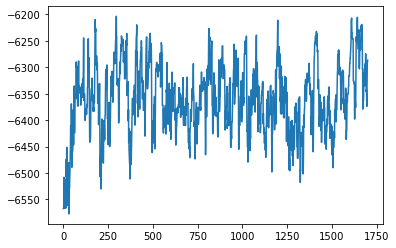

In [36]:
plt.plot(range(len(ll_sums)), ll_sums)

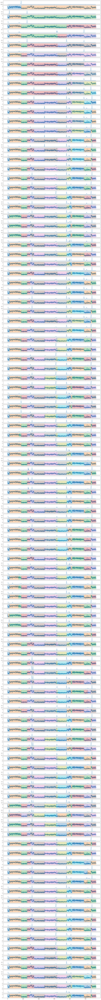

In [33]:
traces = nb_mcmc.clusters[1].ll_traces
f, axs = plt.subplots(2 * len(traces), figsize = (20,2 * len(traces)), sharex=True)
clus = 1
residuals = np.exp(np.log(nb_mcmc.clusters[clus].r) - (nb_mcmc.clusters[clus].mu) - (nb_mcmc.clusters[clus].C@nb_mcmc.clusters[clus].beta).flatten())
for i in range(len(traces)):
    trace = np.exp(traces[i])
    nonzero = (trace != 1)
    #msk2 = (trace > trace.mean()*1.01)
    msk = nonzero
    axs[2*i].plot(np.r_[:len(trace)][msk], trace[msk])
    
    tst = np.array(nb_mcmc.clusters[1].phase_history[i]).reshape(-1,2)
    axs[2*i+1].scatter(np.r_[:len(residuals)], residuals)
    for j, r in enumerate(tst):
        axs[2*i+1].add_patch(matplotlib.patches.Rectangle((r[0],0), r[1]-r[0], 2.3, fill=True, alpha=0.3, color = colors[j % 10]))

run using stats models for both

In [19]:
nb_mcmc.run(750, debug=True)

  0%|          | 0/750 [00:00<?, ?it/s]

starting MCMC coverage segmentation...
SortedDict({0: 568})
trying to join cluster 1
SortedDict({0: 568})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 568)


  0%|          | 2/750 [00:05<32:38,  2.62s/it]

split log ml ratio:  29.70663951819097
split log mh ratio:  32.62436012870967
split!
SortedList([0, 88, 88, 568])
SortedDict({0: 88, 88: 480})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 88)


  0%|          | 3/750 [00:10<44:06,  3.54s/it]

split log ml ratio:  28.03346408600737
split log mh ratio:  28.319754492615175
split!
SortedList([0, 88, 88, 125, 125, 568])
SortedDict({0: 88, 88: 37, 125: 443})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  1%|          | 4/750 [00:14<47:09,  3.79s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 88, 88: 37, 125: 443})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 88)
s_ind: 88 (125, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  1%|          | 5/750 [00:19<51:14,  4.13s/it]

split log ml ratio:  -7.250869432619766
split log mh ratio:  -4.5165649091941305
SortedDict({0: 88, 88: 37, 125: 443})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (0, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  1%|          | 6/750 [00:23<53:34,  4.32s/it]

split log ml ratio:  27.22550846140257
split log mh ratio:  28.15968023566529
split!
SortedList([0, 88, 88, 125, 125, 169, 169, 568])
SortedDict({0: 88, 88: 37, 125: 44, 169: 399})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  1%|          | 7/750 [00:24<38:51,  3.14s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 88, 88: 37, 125: 44, 169: 399})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 169)


  1%|          | 8/750 [00:25<28:59,  2.34s/it]

SortedDict({0: 88, 88: 37, 125: 44, 169: 399})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (169, 568)


  1%|          | 9/750 [00:29<37:50,  3.06s/it]

split log ml ratio:  17.323282150020532
split log mh ratio:  17.498336218036457
split!
SortedList([0, 11, 11, 88, 88, 125, 125, 169, 169, 568])
SortedDict({0: 11, 11: 77, 88: 37, 125: 44, 169: 399})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 88)
s_ind: 11 (0, 11)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (169, 568)


  1%|▏         | 10/750 [00:34<43:39,  3.54s/it]

split log ml ratio:  -1.0654834125889465
split log mh ratio:  1.462212509906749
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 169, 169, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 399})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (79, 88)
s_ind: 88 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 568)


  1%|▏         | 11/750 [00:38<47:21,  3.84s/it]

split log ml ratio:  -7.250869432619766
split log mh ratio:  -4.5165649091941305
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 399})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 568)
s_ind: 169 (0, 11)
s_ind: 169 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  2%|▏         | 12/750 [00:43<50:01,  4.07s/it]

split log ml ratio:  53.8722836755187
split log mh ratio:  55.15432940182836
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 169, 169, 382, 382, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 213, 382: 186})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 382)
s_ind: 169 (0, 11)
s_ind: 169 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 568)


  2%|▏         | 13/750 [00:47<51:27,  4.19s/it]

split log ml ratio:  17.666353303815413
split log mh ratio:  19.30148483441735
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 169, 169, 318, 318, 382, 382, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 149, 318: 64, 382: 186})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  2%|▏         | 14/750 [00:49<43:07,  3.52s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 149, 318: 64, 382: 186})
trying to split cluster 1
attempting split on segment:  79
ind:  (79, 88)
s_ind: 79 (0, 11)
s_ind: 79 (11, 79)
s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (169, 318)
s_ind: 79 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (382, 568)


  2%|▏         | 15/750 [00:54<45:57,  3.75s/it]

split log ml ratio:  -25.044928024267392
split log mh ratio:  -25.044928024267392
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 149, 318: 64, 382: 186})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (79, 88)
s_ind: 88 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (169, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 568)


  2%|▏         | 16/750 [00:58<48:46,  3.99s/it]

split log ml ratio:  -8.166963285667407
split log mh ratio:  -5.176618548048282
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 149, 318: 64, 382: 186})
trying to join cluster 1
attempting join on segs: 11 79
join ind:  (11, 88)


  2%|▏         | 17/750 [00:59<36:05,  2.95s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 149, 318: 64, 382: 186})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 568)
s_ind: 382 (0, 11)
s_ind: 382 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (79, 88)
s_ind: 382 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (169, 318)
s_ind: 382 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  2%|▏         | 18/750 [01:03<41:25,  3.40s/it]

split log ml ratio:  33.451518908914295
split log mh ratio:  37.2824154552909
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 169, 169, 318, 318, 382, 382, 492, 492, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 149, 318: 64, 382: 110, 492: 76})
trying to split cluster 1
attempting split on segment:  79
ind:  (79, 88)
s_ind: 79 (0, 11)
s_ind: 79 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (169, 318)
s_ind: 79 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (382, 492)
s_ind: 79 (492, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 19/750 [01:07<44:45,  3.67s/it]

split log ml ratio:  -25.044928024267392
split log mh ratio:  -25.044928024267392
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 149, 318: 64, 382: 110, 492: 76})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 318)
s_ind: 169 (0, 11)
s_ind: 169 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 492)
s_ind: 169 (492, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 20/750 [01:12<46:01,  3.78s/it]

split log ml ratio:  39.87437251635947
split log mh ratio:  40.15197436537801
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 169, 169, 237, 237, 318, 318, 382, 382, 492, 492, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 68, 237: 81, 318: 64, 382: 110, 492: 76})
trying to join cluster 1
attempting join on segs: 79 88
join ind:  (79, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 21/750 [01:12<33:25,  2.75s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 44, 169: 68, 237: 81, 318: 64, 382: 110, 492: 76})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 169)
s_ind: 125 (0, 11)
s_ind: 125 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (169, 237)
s_ind: 125 (237, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 492)
s_ind: 125 (492, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 22/750 [01:16<38:13,  3.15s/it]

split log ml ratio:  -1.4508803017251921
split log mh ratio:  4.478642140429655
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 318, 318, 382, 382, 492, 492, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 149: 20, 169: 68, 237: 81, 318: 64, 382: 110, 492: 76})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 492)
s_ind: 125 (492, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 23/750 [01:20<41:21,  3.41s/it]/home/opriebe/anaconda3/lib/

split log ml ratio:  -2.5504407256075865
split log mh ratio:  -1.037614879535795
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 144, 144, 149, 149, 169, 169, 237, 237, 318, 318, 382, 382, 492, 492, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 19, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 110, 492: 76})
trying to join cluster 1
attempting join on segs: 125 144
join ind:  (125, 149)
joining!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 318, 318, 382, 382, 492, 492, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 110, 492: 76})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (0, 11)
s_ind: 492 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (79, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (125, 149)
s_ind: 492 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (169, 237)
s_ind: 492 (237, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 492)


  3%|▎         | 25/750 [01:24<35:13,  2.92s/it]

split log ml ratio:  25.574192380491695
split log mh ratio:  25.61424000880743
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 318, 318, 382, 382, 492, 492, 535, 535, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 110, 492: 43, 535: 33})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 492)
s_ind: 382 (0, 11)
s_ind: 382 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (79, 88)
s_ind: 382 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (125, 149)
s_ind: 382 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (169, 237)
s_ind: 382 (237, 318)
s_ind: 382 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (492, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (535, 568)


  3%|▎         | 26/750 [01:28<39:10,  3.25s/it]

split log ml ratio:  8.70279829543506
split log mh ratio:  9.420344501411819
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 318, 318, 382, 382, 413, 413, 492, 492, 535, 535, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 31, 413: 79, 492: 43, 535: 33})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 79)


  4%|▎         | 27/750 [01:29<29:22,  2.44s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 31, 413: 79, 492: 43, 535: 33})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 79)


  4%|▎         | 28/750 [01:29<22:36,  1.88s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 31, 413: 79, 492: 43, 535: 33})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (0, 11)
s_ind: 492 (11, 79)
s_ind: 492 (79, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (125, 149)
s_ind: 492 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (169, 237)
s_ind: 492 (237, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 492)
s_ind: 492 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  4%|▍         | 29/750 [01:33<29:56,  2.49s/it]

split log ml ratio:  -0.96518915150682
split log mh ratio:  0.1978075540109785
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 318, 318, 382, 382, 413, 413, 492, 492, 508, 508, 535, 535, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 31, 413: 79, 492: 16, 508: 27, 535: 33})
trying to join cluster 1
attempting join on segs: 149 169
join ind:  (149, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  4%|▍         | 30/750 [01:34<23:05,  1.92s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 31, 413: 79, 492: 16, 508: 27, 535: 33})
trying to join cluster 1
attempting join on segs: 11 79
join ind:  (11, 88)


  4%|▍         | 31/750 [01:34<18:00,  1.50s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 31, 413: 79, 492: 16, 508: 27, 535: 33})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


  4%|▍         | 32/750 [01:35<16:41,  1.39s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 31, 413: 79, 492: 16, 508: 27, 535: 33})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (0, 11)
s_ind: 382 (11, 79)
s_ind: 382 (79, 88)
s_ind: 382 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (125, 149)
s_ind: 382 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (169, 237)
s_ind: 382 (237, 318)
s_ind: 382 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (492, 508)
s_ind: 382 (508, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (535, 568)


  4%|▍         | 33/750 [01:39<25:53,  2.17s/it]

split log ml ratio:  2.24433033672085
split log mh ratio:  2.998898780874697
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 535, 535, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 27, 535: 33})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 11)
s_ind: 318 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (79, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 149)
s_ind: 318 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (169, 237)
s_ind: 318 (237, 318)
s_ind: 318 (382, 406)
s_ind: 318 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (413, 492)
s_ind: 318 (492, 508)
s_ind: 318 (508, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (535, 568)


  5%|▍         | 34/750 [01:43<32:11,  2.70s/it]

split log ml ratio:  -5.671422431730207
split log mh ratio:  -0.5098972454361501
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 27, 535: 33})
trying to join cluster 1
attempting join on segs: 406 413
join ind:  (406, 492)


  5%|▍         | 35/750 [01:44<24:43,  2.07s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 27, 535: 33})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


  5%|▍         | 36/750 [01:45<21:25,  1.80s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 27, 535: 33})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 535)
s_ind: 508 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (11, 79)
s_ind: 508 (79, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (169, 237)
s_ind: 508 (237, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 406)
s_ind: 508 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 492)
s_ind: 508 (492, 508)
s_ind: 508 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  3.474415346711794
split log mh ratio:  4.256128330858701
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 79)


  5%|▌         | 38/750 [01:50<22:33,  1.90s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 79)
s_ind: 11 (0, 11)
s_ind: 11 (79, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (125, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (169, 237)
s_ind: 11 (237, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 406)
s_ind: 11 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 568)


  5%|▌         | 39/750 [01:54<29:45,  2.51s/it]

split log ml ratio:  -6.092000810119316
split log mh ratio:  -1.9450043211136299
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 79)
s_ind: 11 (0, 11)
s_ind: 11 (79, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (125, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (169, 237)
s_ind: 11 (237, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 406)
s_ind: 11 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 568)


  5%|▌         | 40/750 [01:58<34:36,  2.92s/it]

split log ml ratio:  -3.5629340865589256
split log mh ratio:  -1.7738827754656086
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 568)


  5%|▌         | 41/750 [01:58<25:32,  2.16s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 20, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 169)
s_ind: 149 (0, 11)
s_ind: 149 (11, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (237, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 568)


  6%|▌         | 42/750 [02:02<31:33,  2.67s/it]

split log ml ratio:  -0.24058243471881724
split log mh ratio:  0.05194561745975079
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 12, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 11)
s_ind: 157 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (169, 237)
s_ind: 157 (237, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 406)
s_ind: 157 (406, 413)
s_ind: 157 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (535, 568)


  6%|▌         | 43/750 [02:06<35:49,  3.04s/it]

split log ml ratio:  -0.19881436328796553
split log mh ratio:  -0.16326921221298107
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (79, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (157, 163)
s_ind: 508 (163, 169)
s_ind: 508 (169, 237)
s_ind: 508 (237, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 406)
s_ind: 508 (406, 413)
s_ind: 508 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 568)


  6%|▌         | 44/750 [02:10<38:49,  3.30s/it]

split log ml ratio:  -3.623805004285714
split log mh ratio:  -3.6238050042857135
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (79, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (125, 149)
s_ind: 492 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (157, 163)
s_ind: 492 (163, 169)
s_ind: 492 (169, 237)
s_ind: 492 (237, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 406)
s_ind: 492 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 492)
s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -11.849428339406586
split log mh ratio:  -11.848805290313976
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▌         | 46/750 [02:14<29:58,  2.56s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 382)
s_ind: 318 (0, 11)
s_ind: 318 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (79, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 149)
s_ind: 318 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (157, 163)
s_ind: 318 (163, 169)
s_ind: 318 (169, 237)
s_ind: 318 (237, 318)
s_ind: 318 (382, 406)
s_ind: 318 (406, 413)
s_ind: 318 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (535, 568)


  6%|▋         | 47/750 [02:18<34:26,  2.94s/it]

split log ml ratio:  -6.57240507046663
split log mh ratio:  -1.0706610642209853
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▋         | 48/750 [02:18<25:42,  2.20s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 163)
s_ind: 157 (0, 11)
s_ind: 157 (11, 79)
s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (163, 169)
s_ind: 157 (169, 237)
s_ind: 157 (237, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 406)
s_ind: 157 (406, 413)
s_ind: 157 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (535, 568)


  7%|▋         | 49/750 [02:22<31:26,  2.69s/it]

split log ml ratio:  -6.166664747683171
split log mh ratio:  -5.0124290702578955
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 157)
s_ind: 125 (157, 163)
s_ind: 125 (163, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 406)
s_ind: 125 (406, 413)
s_ind: 125 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 568)


  7%|▋         | 50/750 [02:26<35:31,  3.04s/it]

split log ml ratio:  -2.9901124284451726
split log mh ratio:  -1.3084860209291946
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 11)
s_ind: 169 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 149)
s_ind: 169 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (157, 163)
s_ind: 169 (163, 169)
s_ind: 169 (237, 318)
s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 406)
s_ind: 169 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (413, 492)
s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (535, 568)


  7%|▋         | 51/750 [02:30<38:31,  3.31s/it]

split log ml ratio:  -5.031301975104725
split log mh ratio:  -1.8172971524063541
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  7%|▋         | 52/750 [02:31<29:22,  2.52s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  7%|▋         | 53/750 [02:31<22:56,  1.98s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  7%|▋         | 54/750 [02:

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 163)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (0, 11)
s_ind: 157 (11, 79)
s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (163, 169)
s_ind: 157 (169, 237)
s_ind: 157 (237, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 406)
s_ind: 157 (406, 413)
s_ind: 157 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (535, 568)


  7%|▋         | 55/750 [02:35<25:04,  2.16s/it]

split log ml ratio:  -6.061684275912739
split log mh ratio:  -4.873555816981935
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 406 413
join ind:  (406, 492)


  7%|▋         | 56/750 [02:36<19:39,  1.70s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 11 79
join ind:  (11, 88)


  8%|▊         | 57/750 [02:36<15:33,  1.35s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 237 318
join ind:  (237, 382)


  8%|▊         | 58/750 [02:37<14:29,  1.26s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)
s_ind: 535 (0, 11)
s_ind: 535 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (79, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 163)
s_ind: 535 (163, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 406)
s_ind: 535 (406, 413)
s_ind: 535 (413, 492)

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m


s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 79)
s_ind: 512 (79, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (157, 163)
s_ind: 512 (163, 169)
s_ind: 512 (169, 237)
s_ind: 512 (237, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 406)
s_ind: 512 (406, 413)
s_ind: 512 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.541603692168792
split log mh ratio:  -3.459965997997643
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 61/750 [02:46<22:20,  1.95s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 163)
s_ind: 157 (0, 11)
s_ind: 157 (11, 79)
s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (163, 169)
s_ind: 157 (169, 237)
s_ind: 157 (237, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 406)
s_ind: 157 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (413, 492)
s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (535, 568)


  8%|▊         | 62/750 [02:50<29:13,  2.55s/it]

split log ml ratio:  -6.280357060870301
split log mh ratio:  -5.312537232274736
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 568)


  8%|▊         | 63/750 [02:50<21:41,  1.89s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 79 88
join ind:  (79, 125)


  9%|▊         | 64/750 [02:50<16:19,  1.43s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▊         | 65/750 [02:

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (11, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (157, 163)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (163, 169)
s_ind: 149 (169, 237)
s_ind: 149 (237, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 568)


  9%|▉         | 66/750 [02:54<21:33,  1.89s/it]

split log ml ratio:  -2.317021922159256
split log mh ratio:  -2.3166327670869578
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 318)


  9%|▉         | 67/750 [02:55<18:45,  1.65s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 79)


  9%|▉         | 68/750 [02:56<15:09,  1.33s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▉         | 69/750 [02:

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  163
ind:  (163, 169)
s_ind: 163 (0, 11)
s_ind: 163 (11, 79)
s_ind: 163 (79, 88)
s_ind: 163 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (125, 149)
s_ind: 163 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (157, 163)
s_ind: 163 (169, 237)
s_ind: 163 (237, 318)
s_ind: 163 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (382, 406)
s_ind: 163 (406, 413)
s_ind: 163 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 163 (492, 508)
s_ind: 163 (508, 512)
s_ind: 163 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (535, 568)


  9%|▉         | 71/750 [03:00<19:06,  1.69s/it]

split log ml ratio:  -6.7855564734363725
split log mh ratio:  -5.5354904537616685
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 163 169
join ind:  (163, 237)


 10%|▉         | 72/750 [03:01<15:00,  1.33s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 11)
s_ind: 88 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (79, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 157)
s_ind: 88 (157, 163)
s_ind: 88 (163, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 406)
s_ind: 88 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 568)


 10%|▉         | 73/750 [03:05<23:32,  2.09s/it]

split log ml ratio:  -7.937436643427645
split log mh ratio:  -5.105976341522365
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 79, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  413
ind:  (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (0, 11)
s_ind: 413 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (79, 88)
s_ind: 413 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (125, 149)
s_ind: 413 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 413 (157, 163)
s_ind: 413 (163, 169)
s_ind: 413 (169, 237)
s_ind: 413 (237, 318)
s_ind: 413 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (382, 406)
s_ind: 413 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 413 (492, 508)
s_ind: 413 (508, 512)
s_ind: 413 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 413 (535, 568)


 10%|▉         | 74/750 [03:08<29:35,  2.63s/it]

split log ml ratio:  3.661795478649765
split log mh ratio:  4.261661041171465
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 163)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 163)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (0, 11)
s_ind: 535 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (79, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 163)
s_ind: 535 (163, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 406)
s_ind: 535 (406, 413)
s_ind: 535 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 10%|█         | 78/750 [03:13<19:49,  1.77s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split log ml ratio:  2.9524252220298877
split log mh ratio:  3.099389957204039
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 157)
s_ind: 125 (157, 163)
s_ind: 125 (163, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 406)
s_ind: 125 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 125 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/dis

s_ind: 125 (508, 512)
s_ind: 125 (512, 535)
s_ind: 125 (535, 542)


 11%|█         | 79/750 [03:17<27:33,  2.46s/it]

s_ind: 125 (542, 568)
split log ml ratio:  -1.998082506747778
split log mh ratio:  -0.9636118133794289
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (0, 11)
s_ind: 512 (11, 79)
s_ind: 512 (79, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (157, 163)
s_ind: 512 (163, 169)
s_ind: 512 (169, 237)
s_ind: 512 (237, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 406)
s_ind: 512 (406, 413)
s_ind: 512 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 11%|█         | 80/750 [03:21<31:39,  2.83s/it]

split log ml ratio:  -5.541603692168792
split log mh ratio:  -3.4599659979976414
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (79, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 157)
s_ind: 88 (157, 163)
s_ind: 88 (163, 169)
s_ind: 88 (169, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 406)
s_ind: 88 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 11%|█         | 81/750 [03:25<34:55,  3.13s/it]

split log ml ratio:  -7.937436643427645
split log mh ratio:  -5.105976341522363
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 11%|█         | 82/750 [03:26<26:54,  2.42s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 157 163
join ind:  (157, 169)
joining!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 12, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 11)
s_ind: 406 (11, 79)
s_ind: 406 (79, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (157, 169)
s_ind: 406 (169, 237)
s_ind: 406 (237, 318)
s_ind: 406 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (382, 406)
s_ind: 406 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 406 (492, 508)
s_ind: 406 (508, 512)
s_ind: 406 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 406 (535, 542)
s_ind: 406 (542, 568)


 11%|█         | 84/750 [03:30<24:44,  2.23s/it]

split log ml ratio:  -239.0209973939809
split log mh ratio:  -239.0209973939809
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 12, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  490
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 12, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 79)
s_ind: 512 (79, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (157, 169)
s_ind: 512 (169, 237)
s_ind: 512 (237, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 406)
s_ind: 512 (406, 413)
s_ind: 512 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 11%|█▏        | 86/750 [03:33<23:17,  2.10s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 87/750 [03:34<18:38,  1.69s/it]

split log ml ratio:  -5.143091522837494
split log mh ratio:  -2.9191628843182116
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 12, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 12, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (0, 11)
s_ind: 512 (11, 79)
s_ind: 512 (79, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (157, 169)
s_ind: 512 (169, 237)
s_ind: 512 (237, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 406)
s_ind: 512 (406, 413)
s_ind: 512 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 12%|█▏        | 88/750 [03:38<24:30,  2.22s/it]

split log ml ratio:  -8.552545393251421
split log mh ratio:  -3.8530646090812297
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 12, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 406)
s_ind: 125 (406, 413)
s_ind: 125 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 12%|█▏        | 89/750 [03:41<29:02,  2.64s/it]

split log ml ratio:  -1.998082506747778
split log mh ratio:  -0.9636118133803393
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 12, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 11)
s_ind: 157 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (169, 237)
s_ind: 157 (237, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 406)
s_ind: 157 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 12%|█▏        | 90/750 [03:45<32:31,  2.96s/it]

split log ml ratio:  -0.19881436328796553
split log mh ratio:  -0.16326921221298107
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (79, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (149, 157)
s_ind: 492 (157, 163)
s_ind: 492 (163, 169)
s_ind: 492 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (237, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 406)
s_ind: 492 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 12%|█▏        | 91/750 [03:49<35:28,  3.23s/it]

s_ind: 492 (542, 568)
split log ml ratio:  -11.849428339406586
split log mh ratio:  -11.848805290313976
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 79)


 12%|█▏        | 92/750 [03:50<27:08,  2.48s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 406 413
join ind:  (406, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 12%|█▏        | 93/750 [03:50<21:21,  1.95s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 79)


 13%|█▎        | 94/750 [03:51<16:52,  1.54s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 79
join ind:  (11, 88)


 13%|█▎        | 95/750 [03:51<13:35,  1.25s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 11)
s_ind: 149 (11, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (157, 163)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (163, 169)
s_ind: 149 (169, 237)
s_ind: 149 (237, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 13%|█▎        | 96/750 [03:55<22:05,  2.03s/it]

split log ml ratio:  -2.3170219221601656
split log mh ratio:  -2.316632767087867
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 157)
s_ind: 125 (157, 163)
s_ind: 125 (163, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 406)
s_ind: 125 (406, 413)
s_ind: 125 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 13%|█▎        | 97/750 [03:59<28:03,  2.58s/it]

split log ml ratio:  -1.9980825067468686
split log mh ratio:  -0.9636118133794289
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 145, 145, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  79
ind:  (79, 88)
s_ind: 79 (0, 11)
s_ind: 79 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 145)
s_ind: 79 (145, 149)
s_ind: 79 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 79 (157, 163)
s_ind: 79 (163, 169)
s_ind: 79 (169, 237)
s_ind: 79 (237, 318)
s_ind: 79 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (382, 406)
s_ind: 79 (406, 413)
s_ind: 79 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 79 (492, 508)
s_ind: 79 (508, 512)
s_ind: 79 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 79 (535, 542)
s_ind: 79 (542, 568)


 13%|█▎        | 98/750 [04:03<32:06,  2.96s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 13%|█▎        | 99/750 [04:03<23:04,  2.13s/it]

split log ml ratio:  -25.044928024267392
split log mh ratio:  -25.044928024267392
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 145
join ind:  (125, 149)
joining!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 79
join ind:  (11, 88)


 13%|█▎        | 100/750 [04:04<17:51,  1.65s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 11)
s_ind: 169 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 149)
s_ind: 169 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (157, 163)
s_ind: 169 (163, 169)
s_ind: 169 (237, 318)
s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 406)
s_ind: 169 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 13%|█▎        | 101/750 [04:08<24:57,  2.31s/it]

split log ml ratio:  -5.967742371398344
split log mh ratio:  -1.762905569647045
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 177, 177, 237, 237, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 79)
s_ind: 542 (79, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 149)
s_ind: 542 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (157, 163)
s_ind: 542 (163, 169)
s_ind: 542 (169, 177)
s_ind: 542 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (237, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 406)
s_ind: 542 (406, 413)
s_ind: 542 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -5.91093624558107
split log mh ratio:  -2.6497838646428136
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 79)
s_ind: 508 (79, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (157, 163)
s_ind: 508 (163, 169)
s_ind: 508 (169, 177)
s_ind: 508 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (237, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 406)
s_ind: 508 (406, 413)
s_ind: 508 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 14%|█▎        | 103/750 [04:15<33:10,  3.08s/it]

split log ml ratio:  -3.623805004287533
split log mh ratio:  -3.6238050042875325
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▍        | 104/750 [04:16<25:09,  2.34s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 11)
s_ind: 88 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (79, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 157)
s_ind: 88 (157, 163)
s_ind: 88 (163, 169)
s_ind: 88 (169, 177)
s_ind: 88 (177, 237)
s_ind: 88 (237, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 406)
s_ind: 88 (406, 413)
s_ind: 88 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 14%|█▍        | 105/750 [04:20<30:02,  2.80s/it]

split log ml ratio:  -8.362864032234029
split log mh ratio:  -5.303637084090951
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  177
ind:  (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 177 (0, 11)
s_ind: 177 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 177 (79, 88)
s_ind: 177 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 177 (125, 149)
s_ind: 177 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 177 (157, 163)
s_ind: 177 (163, 169)
s_ind: 177 (169, 177)
s_ind: 177 (237, 318)
s_ind: 177 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 177 (382, 406)
s_ind: 177 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 177 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 177 (492, 508)
s_ind: 177 (508, 512)
s_ind: 177 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 177 (535, 542)
s_ind: 177 (542, 568)


 14%|█▍        | 106/750 [04:24<33:15,  3.10s/it]

split log ml ratio:  -5.914254107211491
split log mh ratio:  -1.9765891825827566
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  79
ind:  (79, 88)
s_ind: 79 (0, 11)
s_ind: 79 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 149)
s_ind: 79 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (157, 163)
s_ind: 79 (163, 169)
s_ind: 79 (169, 177)
s_ind: 79 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (237, 318)
s_ind: 79 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (382, 406)
s_ind: 79 (406, 413)
s_ind: 79 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 79 (492, 508)
s_ind: 79 (508, 512)
s_ind: 79 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 79 (535, 542)
s_ind: 79 (542, 568)


 14%|█▍        | 107/750 [04:27<35:33,  3.32s/it]

split log ml ratio:  -25.0449280242683
split log mh ratio:  -25.0449280242683
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 163)
s_ind: 157 (0, 11)
s_ind: 157 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (163, 169)
s_ind: 157 (169, 177)
s_ind: 157 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (237, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 406)
s_ind: 157 (406, 413)
s_ind: 157 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)
split log ml ratio:  -6.061684275913649
split log mh ratio:  -4.873555816982844
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  490
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 406 413
join ind:  (406, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 15%|█▍        | 110/750 [04:32<21:32,  2.02s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 163)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 81, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 318)
s_ind: 237 (0, 11)
s_ind: 237 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 149)
s_ind: 237 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (157, 163)
s_ind: 237 (163, 169)
s_ind: 237 (169, 177)
s_ind: 237 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (382, 406)
s_ind: 237 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 15%|█▍        | 112/750 [04:36<21:10,  1.99s/it]

split log ml ratio:  1.876782673627531
split log mh ratio:  3.5960859955794144
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 177, 177, 237, 237, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  163
ind:  (163, 169)
s_ind: 163 (0, 11)
s_ind: 163 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (79, 88)
s_ind: 163 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (125, 149)
s_ind: 163 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (157, 163)
s_ind: 163 (169, 177)
s_ind: 163 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (237, 312)
s_ind: 163 (312, 318)
s_ind: 163 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (382, 406)
s_ind: 163 (406, 413)
s_ind: 163 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 163 (492, 508)
s_ind: 163 (508, 512)
s_ind: 163 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 163 (535, 542)
s_ind: 163 (542, 568)


 15%|█▌        | 113/750 [04:40<25:20,  2.39s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 15%|█▌        | 114/750 [04:40<19:32,  1.84s/it]

split log ml ratio:  -6.7855564734363725
split log mh ratio:  -5.535490453761668
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 490 492
join ind:  (490, 508)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 149
join ind:  (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 15%|█▌        | 115/750 [04:40<15:08,  1.43s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 15%|█▌        | 116/750 [04:40<12:22,  1.17s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 11)
s_ind: 88 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (79, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 157)
s_ind: 88 (157, 163)
s_ind: 88 (163, 169)
s_ind: 88 (169, 177)
s_ind: 88 (177, 237)
s_ind: 88 (237, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 406)
s_ind: 88 (406, 413)
s_ind: 88 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 16%|█▌        | 117/750 [04:44<19:47,  1.88s/it]

split log ml ratio:  -8.126522691640275
split log mh ratio:  -4.4461751737635495
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 11)
s_ind: 318 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (79, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 149)
s_ind: 318 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (157, 163)
s_ind: 318 (163, 169)
s_ind: 318 (169, 177)
s_ind: 318 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (237, 312)
s_ind: 318 (312, 318)
s_ind: 318 (382, 406)
s_ind: 318 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


 16%|█▌        | 118/750 [04:48<25:31,  2.42s/it]

split log ml ratio:  -3.0511060709422964
split log mh ratio:  -1.0620740740814654
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (79, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (157, 163)
s_ind: 508 (163, 169)
s_ind: 508 (169, 177)
s_ind: 508 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (237, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 406)
s_ind: 508 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 16%|█▌        | 119/750 [04:52<29:39,  2.82s/it]

split log ml ratio:  -3.6238050042866234
split log mh ratio:  -3.623805004286624
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 79 88
join ind:  (79, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 16%|█▌        | 120/750 [04:52<22:06,  2.11s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 11)
s_ind: 149 (11, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (157, 163)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (163, 169)
s_ind: 149 (169, 177)
s_ind: 149 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (237, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)
split log ml ratio:  -2.3170219221601656
split log mh ratio:  -2.3166327670878673
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 75, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 312)
s_ind: 237 (0, 11)
s_ind: 237 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 149)
s_ind: 237 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (157, 163)
s_ind: 237 (163, 169)
s_ind: 237 (169, 177)
s_ind: 237 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (312, 318)
s_ind: 237 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (382, 406)
s_ind: 237 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 16%|█▋        | 122/750 [05:00<31:19,  2.99s/it]

split log ml ratio:  0.24316494379672804
split log mh ratio:  1.9664573685249707
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 177, 177, 237, 237, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 177 237
join ind:  (177, 241)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 16%|█▋        | 123/750 [05:00<23:19,  2.23s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 11)
s_ind: 241 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (79, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (125, 149)
s_ind: 241 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (157, 163)
s_ind: 241 (163, 169)
s_ind: 241 (169, 177)
s_ind: 241 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (237, 241)
s_ind: 241 (312, 318)
s_ind: 241 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 406)
s_ind: 241 (406, 413)
s_ind: 241 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 17%|█▋        | 124/750 [05:04<28:03,  2.69s/it]

split log ml ratio:  -6.324499370944977
split log mh ratio:  -0.5597660340681614
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 177, 177, 237, 237, 241, 241, 298, 298, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 57, 298: 14, 312: 6, 318: 64, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 11)
s_ind: 318 (11, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (79, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 149)
s_ind: 318 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (157, 163)
s_ind: 318 (163, 169)
s_ind: 318 (169, 177)
s_ind: 318 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (237, 241)
s_ind: 318 (241, 298)
s_ind: 318 (298, 312)
s_ind: 318 (312, 318)
s_ind: 318 (382, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (406, 413)
s_ind: 318 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/

s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)
split log ml ratio:  -6.289097206449696
split log mh ratio:  -0.8711209194734693
split!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 177, 177, 237, 237, 241, 241, 298, 298, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 126/750 [05:08<22:19,  2.15s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 57, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 57, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  163
ind:  (163, 169)
s_ind: 163 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (11, 79)
s_ind: 163 (79, 88)
s_ind: 163 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (125, 149)
s_ind: 163 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (157, 163)
s_ind: 163 (169, 177)
s_ind: 163 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (237, 241)
s_ind: 163 (241, 298)
s_ind: 163 (298, 312)
s_ind: 163 (312, 318)
s_ind: 163 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (344, 382)
s_ind: 163 (382, 406)
s_ind: 163 (406, 413)
s_ind: 163 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 163 (492, 508)
s_ind: 163 (508, 512)
s_ind: 163 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 163 (535, 542)
s_ind: 163 (542, 568)


 17%|█▋        | 127/750 [05:12<27:17,  2.63s/it]

split log ml ratio:  -6.858444692782541
split log mh ratio:  -5.914475149070313
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 57, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 79 88
join ind:  (79, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 128/750 [05:12<20:07,  1.94s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 57, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 298
join ind:  (241, 312)


 17%|█▋        | 129/750 [05:12<15:31,  1.50s/it]

joining!
SortedList([0, 11, 11, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 177, 177, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 406 413
join ind:  (406, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 17%|█▋        | 130/750 [05:13<12:46,  1.24s/it]

SortedDict({0: 11, 11: 68, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 79)
s_ind: 11 (0, 11)
s_ind: 11 (79, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (125, 149)
s_ind: 11 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (157, 163)
s_ind: 11 (163, 169)
s_ind: 11 (169, 177)
s_ind: 11 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (237, 241)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 344)
s_ind: 11 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 406)
s_ind: 11 (406, 413)
s_ind: 11 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 17%|█▋        | 131/750 [05:17<20:25,  1.98s/it]

split log ml ratio:  -4.1758994216543215
split log mh ratio:  -1.8748029237458468
split!
SortedList([0, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 177, 177, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 79 88
join ind:  (79, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 132/750 [05:17<15:18,  1.49s/it]

SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 33)


 18%|█▊        | 133/750 [05:17<11:21,  1.10s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 33 79
join ind:  (33, 88)


 18%|█▊        | 134/750 [05:18<09:14,  1.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 135/750 [05:18<07:02,  1.45it/s]

SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 33)
s_ind: 11 (0, 11)
s_ind: 11 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (79, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (157, 163)
s_ind: 11 (163, 169)
s_ind: 11 (169, 177)
s_ind: 11 (177, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (237, 241)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (344, 382)
s_ind: 11 (382, 406)
s_ind: 11 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 18%|█▊        | 136/750 [05:22<16:46,  1.64s/it]

split log ml ratio:  -2.5072663545815885
split log mh ratio:  -1.0985008025390925
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 8, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 169 177
join ind:  (169, 237)


 18%|█▊        | 137/750 [05:22<13:10,  1.29s/it]

joining!
SortedList([0, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 11)
s_ind: 149 (11, 33)
s_ind: 149 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (157, 163)
s_ind: 149 (163, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 237)
s_ind: 149 (237, 241)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (344, 382)
s_ind: 149 (382, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 19%|█▊        | 139/750 [05:26<19:00,  1.87s/it]

split log ml ratio:  -2.317021922161075
split log mh ratio:  -2.3166327670887763
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 19%|█▊        | 140/750 [05:27<13:59,  1.38s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 490
join ind:  (413, 492)


 19%|█▉        | 141/750 [05:27<11:27,  1.13s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 344 382
join ind:  (344, 406)


 19%|█▉        | 142/750 [05:28<09:34,  1.06it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 19%|█▉        | 143/750 [05:28<07:24,  1.36it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacond

SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 11)
s_ind: 149 (11, 33)
s_ind: 149 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (157, 163)
s_ind: 149 (163, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 237)
s_ind: 149 (237, 241)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 344)
s_ind: 149 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 19%|█▉        | 144/750 [05:32<16:48,  1.66s/it]

split log ml ratio:  -2.317021922161075
split log mh ratio:  -2.3166327670887763
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 406)
s_ind: 382 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (11, 33)
s_ind: 382 (33, 79)
s_ind: 382 (79, 88)
s_ind: 382 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (125, 149)
s_ind: 382 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (157, 163)
s_ind: 382 (163, 169)
s_ind: 382 (169, 237)
s_ind: 382 (237, 241)
s_ind: 382 (241, 312)
s_ind: 382 (312, 318)
s_ind: 382 (318, 344)
s_ind: 382 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (406, 413)
s_ind: 382 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (492, 508)
s_ind: 382 (508, 512)
s_ind: 382 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 382 (535, 542)
s_ind: 382 (542, 568)


 19%|█▉        | 145/750 [05:36<23:15,  2.31s/it]

split log ml ratio:  -1.5773233521713337
split log mh ratio:  0.3881853652355858
split!
SortedList([0, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 396, 396, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 14, 396: 10, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 11)
s_ind: 149 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (157, 163)
s_ind: 149 (163, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 237)
s_ind: 149 (237, 241)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (344, 382)
s_ind: 149 (382, 396)
s_ind: 149 (396, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 19%|█▉        | 146/750 [05:39<27:42,  2.75s/it]

split log ml ratio:  -2.317021922161075
split log mh ratio:  -2.3166327670887767
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 14, 396: 10, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 11)
s_ind: 149 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (157, 163)
s_ind: 149 (163, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 237)
s_ind: 149 (237, 241)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 344)
s_ind: 149 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 396)
s_ind: 149 (396, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 20%|█▉        | 147/750 [05:43<30:41,  3.05s/it]

split log ml ratio:  -2.317021922161075
split log mh ratio:  -2.3166327670887767
split!
SortedList([0, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 155, 155, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 396, 396, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 14, 396: 10, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 241)


 20%|█▉        | 148/750 [05:44<22:59,  2.29s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 20%|█▉        | 149/750 [0

SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 14, 396: 10, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 14, 396: 10, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 396
join ind:  (382, 406)


 20%|██        | 150/750 [05:44<12:00,  1.20s/it]

joining!
SortedList([0, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 155, 155, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 77, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  413
ind:  (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 413 (0, 11)
s_ind: 413 (11, 33)
s_ind: 413 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (79, 88)
s_ind: 413 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (125, 149)
s_ind: 413 (149, 155)
s_ind: 413 (157, 163)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 413 (163, 169)
s_ind: 413 (169, 237)
s_ind: 413 (237, 241)
s_ind: 413 (241, 312)
s_ind: 413 (312, 318)
s_ind: 413 (318, 344)
s_ind: 413 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (382, 406)
s_ind: 413 (406, 413)
s_ind: 413 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 413 (508, 512)
s_ind: 413 (512, 535)
s_ind: 413 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 413 (542, 568)
split log ml ratio:  -6.895294170210036
split log mh ratio:  -2.171396280760746
split!
SortedList([0, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 155, 155, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 425, 425, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 237 241
join ind:  (237, 312)


 20%|██        | 152/750 [05:48<15:13,  1.53s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 33)
s_ind: 512 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (79, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (157, 163)
s_ind: 512 (163, 169)
s_ind: 512 (169, 237)
s_ind: 512 (237, 241)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 344)
s_ind: 512 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 406)
s_ind: 512 (406, 413)
s_ind: 512 (413, 425)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (425, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 20%|██        | 153/750 [05:52<21:59,  2.21s/it]

split log ml ratio:  -5.5313247605854485
split log mh ratio:  -3.0463502521552064
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 425 490
join ind:  (425, 492)


 21%|██        | 154/750 [05:53<16:50,  1.69s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 33)
s_ind: 312 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (79, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 149)
s_ind: 312 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (157, 163)
s_ind: 312 (163, 169)
s_ind: 312 (169, 237)
s_ind: 312 (237, 241)
s_ind: 312 (241, 312)
s_ind: 312 (318, 344)
s_ind: 312 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 406)
s_ind: 312 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (413, 425)
s_ind: 312 (425, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 21%|██        | 156/750 [05:57<16:42,  1.69s/it]

split log ml ratio:  -3.381267653836403
split log mh ratio:  -3.374351515732996
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  490
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 406 (0, 11)
s_ind: 406 (11, 33)
s_ind: 406 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (79, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (157, 163)
s_ind: 406 (163, 169)
s_ind: 406 (169, 237)
s_ind: 406 (237, 241)
s_ind: 406 (241, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (344, 382)
s_ind: 406 (382, 406)
s_ind: 406 (413, 425)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (425, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 406 (492, 508)
s_ind: 406 (508, 512)
s_ind: 406 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 406 (535, 542)
s_ind: 406 (542, 568)


 21%|██        | 158/750 [06:00<17:55,  1.82s/it]

split log ml ratio:  -239.02099739398
split log mh ratio:  -239.02099739398
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 21%|██        | 159/750 [06:01<14:46,  1.50s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 21%|██▏       | 160/750 [06:01<12:06,  1.23s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (11, 33)
s_ind: 0 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (79, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 149)
s_ind: 0 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (157, 163)
s_ind: 0 (163, 169)
s_ind: 0 (169, 237)
s_ind: 0 (237, 241)
s_ind: 0 (241, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (382, 406)
s_ind: 0 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (413, 425)
s_ind: 0 (425, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 0 (492, 508)
s_ind: 0 (508, 512)
s_ind: 0 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 22%|██▏       | 162/750 [06:05<17:03,  1.74s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 22%|██▏       | 163/750 [06:06<12:30,  1.28s/it]

split log ml ratio:  -1.5750815761794001
split log mh ratio:  0.6071120064907518
split!
SortedList([0, 4, 4, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 155, 155, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 425, 425, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 490 492
join ind:  (490, 508)
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 4 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 4 (79, 88)
s_ind: 4 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 4 (125, 149)
s_ind: 4 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 4 (157, 163)
s_ind: 4 (163, 169)
s_ind: 4 (169, 237)
s_ind: 4 (237, 241)
s_ind: 4 (241, 312)
s_ind: 4 (312, 318)
s_ind: 4 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 4 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 4 (382, 406)
s_ind: 4 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 4 (413, 425)
s_ind: 4 (425, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 4 (492, 508)
s_ind: 4 (508, 512)
s_ind: 4 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 4 (535, 542)
s_ind: 4 (542, 568)


 22%|██▏       | 164/750 [06:09<19:46,  2.03s/it]

split log ml ratio:  -27.465236138173168
split log mh ratio:  -27.465236138173168
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  163
ind:  (163, 169)
s_ind: 163 (0, 4)
s_ind: 163 (4, 11)
s_ind: 163 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (79, 88)
s_ind: 163 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (125, 149)
s_ind: 163 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (157, 163)
s_ind: 163 (169, 237)
s_ind: 163 (237, 241)
s_ind: 163 (241, 312)
s_ind: 163 (312, 318)
s_ind: 163 (318, 344)
s_ind: 163 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (382, 406)
s_ind: 163 (406, 413)
s_ind: 163 (413, 425)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 163 (425, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 163 (492, 508)
s_ind: 163 (508, 512)
s_ind: 163 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 163 (535, 542)
s_ind: 163 (542, 568)


 22%|██▏       | 165/750 [06:13<24:57,  2.56s/it]

split log ml ratio:  -6.785556473435463
split log mh ratio:  -5.535490453761668
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 241)
s_ind: 237 (0, 4)
s_ind: 237 (4, 11)
s_ind: 237 (11, 33)
s_ind: 237 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 149)
s_ind: 237 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (157, 163)
s_ind: 237 (163, 169)
s_ind: 237 (169, 237)
s_ind: 237 (241, 312)
s_ind: 237 (312, 318)
s_ind: 237 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (344, 382)
s_ind: 237 (382, 406)
s_ind: 237 (406, 413)
s_ind: 237 (413, 425)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (425, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 22%|██▏       | 166/750 [06:17<28:30,  2.93s/it]

split log ml ratio:  -2.600731125189668
split log mh ratio:  -2.600731125189668
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 4)
s_ind: 241 (4, 11)
s_ind: 241 (11, 33)
s_ind: 241 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (79, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (125, 149)
s_ind: 241 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (157, 163)
s_ind: 241 (163, 169)
s_ind: 241 (169, 237)
s_ind: 241 (237, 241)
s_ind: 241 (312, 318)
s_ind: 241 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 406)
s_ind: 241 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (413, 425)
s_ind: 241 (425, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 22%|██▏       | 167/750 [06:21<31:16,  3.22s/it]

split log ml ratio:  -4.634806969833335
split log mh ratio:  -1.8654173152062867
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 22%|██▏       | 168/750 [06:21<22:35,  2.33s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 12, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 425
join ind:  (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 23%|██▎       | 169/750 [06:22<17:37,  1.82s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!
SortedList([0, 4, 4, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 155, 155, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 344: 38, 382: 24, 396: 10, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 344)
s_ind: 318 (0, 4)
s_ind: 318 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (11, 33)
s_ind: 318 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (79, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 149)
s_ind: 318 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (157, 163)
s_ind: 318 (163, 169)
s_ind: 318 (169, 237)
s_ind: 318 (237, 241)
s_ind: 318 (241, 312)
s_ind: 318 (312, 318)
s_ind: 318 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (382, 406)
s_ind: 318 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


 23%|██▎       | 170/750 [06:26<23:23,  2.42s/it]

split log ml ratio:  -3.350712834368096
split log mh ratio:  -0.899451143170154
split!
SortedList([0, 4, 4, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 155, 155, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 333, 333, 344, 344, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 24, 396: 10, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 163 169
join ind:  (163, 237)


 23%|██▎       | 171/750 [06:26<17:48,  1.85s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 24, 396: 10, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 155
join ind:  (149, 157)
joining!
SortedList([0, 4, 4, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 333, 333, 344, 344, 382, 382, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 24, 396: 10, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 406)
s

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (79, 88)
s_ind: 382 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (125, 149)
s_ind: 382 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (157, 163)
s_ind: 382 (163, 169)
s_ind: 382 (169, 237)
s_ind: 382 (237, 241)
s_ind: 382 (241, 312)
s_ind: 382 (312, 318)
s_ind: 382 (318, 333)
s_ind: 382 (333, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 382 (344, 382)
s_ind: 382 (406, 413)
s_ind: 382 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (492, 508)
s_ind: 382 (508, 512)
s_ind: 382 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 382 (535, 542)
s_ind: 382 (542, 568)


 23%|██▎       | 173/750 [06:30<18:20,  1.91s/it]

split log ml ratio:  -1.1357460723083932
split log mh ratio:  0.1952641831630899
split!
SortedList([0, 4, 4, 11, 11, 33, 33, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 333, 333, 344, 344, 382, 382, 397, 397, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 4)
s_ind: 535 (4, 11)
s_ind: 535 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversi

s_ind: 535 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (79, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 163)
s_ind: 535 (163, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 241)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 333)
s_ind: 535 (333, 344)
s_ind: 535 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (382, 397)
s_ind: 535 (397, 406)
s_ind: 535 (406, 413)
s_ind: 535 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 23%|██▎       | 174/750 [06:34<22:47,  2.37s/it]

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 163 169
join ind:  (163, 237)


 23%|██▎       | 175/750 [06:34<18:04,  1.89s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 33)
s_ind: 11 (0, 4)
s_ind: 11 (4, 11)
s_ind: 11 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (79, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (157, 163)
s_ind: 11 (163, 169)
s_ind: 11 (169, 237)
s_ind: 11 (237, 241)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 333)
s_ind: 11 (333, 344)
s_ind: 11 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 11 (382, 397)
s_ind: 11 (397, 406)
s_ind: 11 (406, 413)
s_ind: 11 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 23%|██▎       | 176/750 [06:38<22:59,  2.40s/it]

split log ml ratio:  -4.158697953408591
split log mh ratio:  -1.5451653125510347
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 4)
s_ind: 542 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (11, 33)
s_ind: 542 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (79, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 149)
s_ind: 542 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (157, 163)
s_ind: 542 (163, 169)
s_ind: 542 (169, 237)
s_ind: 542 (237, 241)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 333)
s_ind: 542 (333, 344)
s_ind: 542 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (382, 397)
s_ind: 542 (397, 406)
s_ind: 542 (406, 413)
s_ind: 542 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 542 (535, 542)
split log ml ratio:  -5.658538000477165
split log mh ratio:  -2.966276889740584
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 406 413
join ind:  (406, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 24%|██▎       | 178/750 [06:43<20:48,  2.18s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 4)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (4, 11)
s_ind: 508 (11, 33)
s_ind: 508 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (79, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (157, 163)
s_ind: 508 (163, 169)
s_ind: 508 (169, 237)
s_ind: 508 (237, 241)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 333)
s_ind: 508 (333, 344)
s_ind: 508 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 508 (382, 397)
s_ind: 508 (397, 406)
s_ind: 508 (406, 413)
s_ind: 508 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 24%|██▍       | 180/750 [06:47<21:22,  2.25s/it]

split log ml ratio:  -3.623805004285714
split log mh ratio:  -3.623805004285714
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 237 241
join ind:  (237, 312)


 24%|██▍       | 181/750 [06:47<16:23,  1.73s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  163
ind:  (163, 169)
s_ind: 163 (0, 4)
s_ind: 163 (4, 11)
s_ind: 163 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (79, 88)
s_ind: 163 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (125, 149)
s_ind: 163 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (157, 163)
s_ind: 163 (169, 237)
s_ind: 163 (237, 241)
s_ind: 163 (241, 312)
s_ind: 163 (312, 318)
s_ind: 163 (318, 333)
s_ind: 163 (333, 344)
s_ind: 163 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 163 (382, 397)
s_ind: 163 (397, 406)
s_ind: 163 (406, 413)
s_ind: 163 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 163 (492, 508)
s_ind: 163 (508, 512)
s_ind: 163 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 163 (535, 542)
s_ind: 163 (542, 568)


 24%|██▍       | 182/750 [06:51<22:25,  2.37s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 24%|██▍       | 183/750 [06:51<16:17,  1.72s/it]

split log ml ratio:  -7.271818008161063
split log mh ratio:  -6.146144308719158
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 4 11
join ind:  (4, 33)
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 241)
s_ind: 237 (0, 4)
s_ind: 237 (4, 11)
s_ind: 237 (11, 33)
s_ind: 237 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (125, 149)
s_ind: 237 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (157, 163)
s_ind: 237 (163, 169)
s_ind: 237 (169, 237)
s_ind: 237 (241, 312)
s_ind: 237 (312, 318)
s_ind: 237 (318, 333)
s_ind: 237 (333, 344)
s_ind: 237 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (382, 397)
s_ind: 237 (397, 406)
s_ind: 237 (406, 413)
s_ind: 237 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 25%|██▍       | 184/750 [06:55<22:06,  2.34s/it]

split log ml ratio:  -2.6007311251905776
split log mh ratio:  -2.6007311251905776
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 344 382
join ind:  (344, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 25%|██▍       | 185/750 [06:55<16:31,  1.75s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 4)
s_ind: 125 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (11, 33)
s_ind: 125 (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 157)
s_ind: 125 (157, 163)
s_ind: 125 (163, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 241)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 333)
s_ind: 125 (333, 344)
s_ind: 125 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (382, 397)
s_ind: 125 (397, 406)
s_ind: 125 (406, 413)
s_ind: 125 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 25%|██▍       | 186/750 [06:59<22:23,  2.38s/it]

split log ml ratio:  -3.321637532328168
split log mh ratio:  -1.519274908204352
SortedDict({0: 4, 4: 7, 11: 22, 33: 46, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  33
ind:  (33, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 33 (0, 4)
s_ind: 33 (4, 11)
s_ind: 33 (11, 33)
s_ind: 33 (79, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 33 (88, 125)
s_ind: 33 (125, 149)
s_ind: 33 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 33 (157, 163)
s_ind: 33 (163, 169)
s_ind: 33 (169, 237)
s_ind: 33 (237, 241)
s_ind: 33 (241, 312)
s_ind: 33 (312, 318)
s_ind: 33 (318, 333)
s_ind: 33 (333, 344)
s_ind: 33 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 33 (382, 397)
s_ind: 33 (397, 406)
s_ind: 33 (406, 413)
s_ind: 33 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 33 (492, 508)
s_ind: 33 (508, 512)
s_ind: 33 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 33 (535, 542)
s_ind: 33 (542, 568)


 25%|██▍       | 187/750 [07:03<26:19,  2.80s/it]

split log ml ratio:  -2.6414022943890814
split log mh ratio:  0.06358420592550829
split!
SortedList([0, 4, 4, 11, 11, 33, 33, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 333, 333, 344, 344, 382, 382, 397, 397, 406, 406, 413, 413, 490, 490, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 4)
s_ind: 125 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (11, 33)
s_ind: 125 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (74, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (149, 157)
s_ind: 125 (157, 163)
s_ind: 125 (163, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 241)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 333)
s_ind: 125 (333, 344)
s_ind: 125 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (382, 397)
s_ind: 125 (397, 406)
s_ind: 125 (406, 413)
s_ind: 125 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 25%|██▌       | 188/750 [07:07<29:04,  3.10s/it]

split log ml ratio:  -4.763523467968298
split log mh ratio:  -1.2995331710917535
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  163
ind:  (163, 169)
s_ind: 163 (0, 4)
s_ind: 163 (4, 11)
s_ind: 163 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 163 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (74, 79)
s_ind: 163 (79, 88)
s_ind: 163 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (125, 149)
s_ind: 163 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (157, 163)
s_ind: 163 (169, 237)
s_ind: 163 (237, 241)
s_ind: 163 (241, 312)
s_ind: 163 (312, 318)
s_ind: 163 (318, 333)
s_ind: 163 (333, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 163 (344, 382)
s_ind: 163 (382, 397)
s_ind: 163 (397, 406)
s_ind: 163 (406, 413)
s_ind: 163 (413, 490)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 163 (492, 508)
s_ind: 163 (508, 512)
s_ind: 163 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 163 (535, 542)
s_ind: 163 (542, 568)


 25%|██▌       | 189/750 [07:11<31:13,  3.34s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 25%|██▌       | 190/750 [07:11<22:11,  2.38s/it]

split log ml ratio:  -7.271818008161063
split log mh ratio:  -6.146144308719158
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 333)
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 490
join ind:  (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 25%|██▌       | 191/750 [07:11<17:03,  1.83s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 77, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 490
join ind:  (413, 492)


 26%|██▌       | 192/750 [07:12<13:27,  1.45s/it]

joining!
SortedList([0, 4, 4, 11, 11, 33, 33, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 333, 333, 344, 344, 382, 382, 397, 397, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 241)
s_ind: 237 (0, 4)
s_ind: 237 (4, 11)
s_ind: 237 (11, 33)
s_ind: 237 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (74, 79)
s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (125, 149)
s_ind: 237 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (157, 163)
s_ind: 237 (163, 169)
s_ind: 237 (169, 237)
s_ind: 237 (241, 312)
s_ind: 237 (312, 318)
s_ind: 237 (318, 333)
s_ind: 237 (333, 344)
s_ind: 237 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (382, 397)
s_ind: 237 (397, 406)
s_ind: 237 (406, 413)
s_ind: 237 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 26%|██▌       | 193/750 [07:16<19:53,  2.14s/it]

split log ml ratio:  -2.600731125191487
split log mh ratio:  -2.600731125191487
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 157 163
join ind:  (157, 169)
joining!
SortedList([0, 4, 4, 11, 11, 33, 33, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 333, 333, 344, 344, 382, 382, 397, 397, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508:

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 26%|██▌       | 195/750 [07:16<11:17,  1.22s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  79
ind:  (79, 88)
s_ind: 79 (0, 4)
s_ind: 79 (4, 11)
s_ind: 79 (11, 33)
s_ind: 79 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (74, 79)
s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 149)
s_ind: 79 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (157, 169)
s_ind: 79 (169, 237)
s_ind: 79 (237, 241)
s_ind: 79 (241, 312)
s_ind: 79 (312, 318)
s_ind: 79 (318, 333)
s_ind: 79 (333, 344)
s_ind: 79 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 79 (382, 397)
s_ind: 79 (397, 406)
s_ind: 79 (406, 413)
s_ind: 79 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 79 (492, 508)
s_ind: 79 (508, 512)
s_ind: 79 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (535, 542)
s_ind: 79 (542, 568)


 26%|██▌       | 196/750 [07:20<17:11,  1.86s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 26%|██▋       | 197/750 [07:20<12:59,  1.41s/it]

split log ml ratio:  -25.0449280242683
split log mh ratio:  -25.0449280242683
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 333)
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 397 406
join ind:  (397, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 38, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  344
ind:  (344, 382)
s_ind: 344 (0, 4)
s_ind: 344 (4, 11)
s_ind: 344 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 344 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 344 (74, 79)
s_ind: 344 (79, 88)
s_ind: 344 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 344 (125, 149)
s_ind: 344 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 344 (157, 169)
s_ind: 344 (169, 237)
s_ind: 344 (237, 241)
s_ind: 344 (241, 312)
s_ind: 344 (312, 318)
s_ind: 344 (318, 333)
s_ind: 344 (333, 344)
s_ind: 344 (382, 397)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 344 (397, 406)
s_ind: 344 (406, 413)
s_ind: 344 (413, 492)
s_ind: 344 (492, 508)
s_ind: 344 (508, 512)
s_ind: 344 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 344 (535, 542)
s_ind: 344 (542, 568)


 27%|██▋       | 199/750 [07:24<16:52,  1.84s/it]

split log ml ratio:  -6.0910337214891115
split log mh ratio:  -1.1366049057687633
split!
SortedList([0, 4, 4, 11, 11, 33, 33, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 333, 333, 344, 344, 370, 370, 382, 382, 397, 397, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 241)
s_ind: 237 (0, 4)
s_ind: 237 (4, 11)
s_ind: 237 (11, 33)
s_ind: 237 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (74, 79)
s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (125, 149)
s_ind: 237 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (157, 169)
s_ind: 237 (169, 237)
s_ind: 237 (241, 312)
s_ind: 237 (312, 318)
s_ind: 237 (318, 333)
s_ind: 237 (333, 344)
s_ind: 237 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 237 (370, 382)
s_ind: 237 (382, 397)
s_ind: 237 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (406, 413)
s_ind: 237 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 27%|██▋       | 200/750 [07:28<22:04,  2.41s/it]

split log ml ratio:  -2.6007311251905776
split log mh ratio:  -2.6007311251905776
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 333)
s_ind: 318 (0, 4)
s_ind: 318 (4, 11)
s_ind: 318 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (74, 79)
s_ind: 318 (79, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (125, 149)
s_ind: 318 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (157, 169)
s_ind: 318 (169, 237)
s_ind: 318 (237, 241)
s_ind: 318 (241, 312)
s_ind: 318 (312, 318)
s_ind: 318 (333, 344)
s_ind: 318 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (370, 382)
s_ind: 318 (382, 397)
s_ind: 318 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (406, 413)
s_ind: 318 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 27%|██▋       | 201/750 [07:32<26:00,  2.84s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 4)
s_ind: 149 (4, 11)
s_ind: 149 (11, 33)
s_ind: 149 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (74, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (125, 149)
s_ind: 149 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 237)
s_ind: 149 (237, 241)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 333)
s_ind: 149 (333, 344)
s_ind: 149 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 149 (370, 382)
s_ind: 149 (382, 397)
s_ind: 149 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (406, 413)
s_ind: 149 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 27%|██▋       | 202/750 [07:36<28:41,  3.14s/it]

split log ml ratio:  -2.317021922159256
split log mh ratio:  -2.3166327670869578
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 241)


 27%|██▋       | 203/750 [07:36<21:30,  2.36s/it]

SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 4)
s_ind: 542 (4, 11)
s_ind: 542 (11, 33)
s_ind: 542 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (74, 79)
s_ind: 542 (79, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (125, 149)
s_ind: 542 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (157, 169)
s_ind: 542 (169, 237)
s_ind: 542 (237, 241)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 333)
s_ind: 542 (333, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 542 (344, 370)
s_ind: 542 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 397)
s_ind: 542 (397, 406)
s_ind: 542 (406, 413)
s_ind: 542 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (508, 512)
s_ind: 542 (512, 535)
s_ind: 542 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -4.958834404940717
split log mh ratio:  -2.7448383174869377
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 4)
s_ind: 535 (4, 11)
s_ind: 535 (11, 33)
s_ind: 535 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (74, 79)
s_ind: 535 (79, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 241)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 333)
s_ind: 535 (333, 344)
s_ind: 535 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (370, 382)
s_ind: 535 (382, 397)
s_ind: 535 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (406, 413)
s_ind: 535 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  4
ind:  (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 4 (0, 4)
s_ind: 4 (11, 33)
s_ind: 4 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 4 (74, 79)
s_ind: 4 (79, 88)
s_ind: 4 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 4 (125, 149)
s_ind: 4 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 4 (157, 169)
s_ind: 4 (169, 237)
s_ind: 4 (237, 241)
s_ind: 4 (241, 312)
s_ind: 4 (312, 318)
s_ind: 4 (318, 333)
s_ind: 4 (333, 344)
s_ind: 4 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 4 (370, 382)
s_ind: 4 (382, 397)
s_ind: 4 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 4 (406, 413)
s_ind: 4 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 4 (492, 508)
s_ind: 4 (508, 512)
s_ind: 4 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 4 (535, 542)
s_ind: 4 (542, 568)


 27%|██▋       | 206/750 [07:48<30:50,  3.40s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 28%|██▊       | 207/750 [07:48<22:07,  2.44s/it]

split log ml ratio:  -27.465236138174077
split log mh ratio:  -27.465236138174077
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 28%|██▊       | 208/750 [07:49<16:45,  1.85s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 15, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 333
join ind:  (318, 344)
joining!
SortedList([0, 4, 4, 11, 11, 33, 33, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 370, 370, 382, 382, 397, 397, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attem

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 28%|██▊       | 210/750 [07:49<09:29,  1.05s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 79 88
join ind:  (79, 125)


 28%|██▊       | 212/750 [07:50<05:53,  1.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (0, 4)
s_ind: 149 (4, 11)
s_ind: 149 (11, 33)
s_ind: 149 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (74, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (125, 149)
s_ind: 149 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 237)
s_ind: 149 (237, 241)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (344, 370)
s_ind: 149 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (382, 397)
s_ind: 149 (397, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 28%|██▊       | 213/750 [07:54<14:29,  1.62s/it]

split log ml ratio:  -2.317021922161075
split log mh ratio:  -2.3166327670887763
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 4)
s_ind: 125 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (11, 33)
s_ind: 125 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (74, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (149, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 241)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 344)
s_ind: 125 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (370, 382)
s_ind: 125 (382, 397)
s_ind: 125 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (406, 413)
s_ind: 125 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 29%|██▊       | 214/750 [07:58<20:16,  2.27s/it]

split log ml ratio:  -3.321637532328168
split log mh ratio:  -1.519274908204352
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 4)
s_ind: 157 (4, 11)
s_ind: 157 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (74, 79)
s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (169, 237)
s_ind: 157 (237, 241)
s_ind: 157 (241, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 157 (344, 370)
s_ind: 157 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 397)
s_ind: 157 (397, 406)
s_ind: 157 (406, 413)
s_ind: 157 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 29%|██▊       | 215/750 [08:01<24:32,  2.75s/it]

split log ml ratio:  -0.19881436328796553
split log mh ratio:  -0.16326921221298107
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 4)
s_ind: 149 (4, 11)
s_ind: 149 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 149 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (74, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (125, 149)
s_ind: 149 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 237)
s_ind: 149 (237, 241)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (344, 370)
s_ind: 149 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (382, 397)
s_ind: 149 (397, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 29%|██▉       | 217/750 [08:05<19:31,  2.20s/it]

split log ml ratio:  -2.317021922159256
split log mh ratio:  -2.3166327670869573
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  33
ind:  (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 33 (0, 4)
s_ind: 33 (4, 11)
s_ind: 33 (11, 33)
s_ind: 33 (74, 79)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 33 (79, 88)
s_ind: 33 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 33 (125, 149)
s_ind: 33 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 33 (157, 169)
s_ind: 33 (169, 237)
s_ind: 33 (237, 241)
s_ind: 33 (241, 312)
s_ind: 33 (312, 318)
s_ind: 33 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 33 (344, 370)
s_ind: 33 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 33 (382, 397)
s_ind: 33 (397, 406)
s_ind: 33 (406, 413)
s_ind: 33 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 33 (492, 508)
s_ind: 33 (508, 512)
s_ind: 33 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 33 (535, 542)
s_ind: 33 (542, 568)


 29%|██▉       | 218/750 [08:09<23:41,  2.67s/it]

split log ml ratio:  -6.477567026251563
split log mh ratio:  -3.795975247777278
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 4)
s_ind: 406 (4, 11)
s_ind: 406 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 406 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (74, 79)
s_ind: 406 (79, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (125, 149)
s_ind: 406 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (157, 169)
s_ind: 406 (169, 237)
s_ind: 406 (237, 241)
s_ind: 406 (241, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (344, 370)
s_ind: 406 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (382, 397)
s_ind: 406 (397, 406)
s_ind: 406 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (492, 508)
s_ind: 406 (508, 512)
s_ind: 406 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (535, 542)
s_ind: 406 (542, 568)


 29%|██▉       | 219/750 [08:13<26:54,  3.04s/it]

split log ml ratio:  -239.0209973939809
split log mh ratio:  -239.0209973939809
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 29%|██▉       | 220/750 [08:14<20:00,  2.27s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anacond

SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 406)
s_ind: 397 (0, 4)
s_ind: 397 (4, 11)
s_ind: 397 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (74, 79)
s_ind: 397 (79, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (125, 149)
s_ind: 397 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (157, 169)
s_ind: 397 (169, 237)
s_ind: 397 (237, 241)
s_ind: 397 (241, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 397 (344, 370)
s_ind: 397 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (382, 397)
s_ind: 397 (406, 413)
s_ind: 397 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 397 (492, 508)
s_ind: 397 (508, 512)
s_ind: 397 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (535, 542)
s_ind: 397 (542, 568)


 29%|██▉       | 221/750 [08:17<24:06,  2.73s/it]

split log ml ratio:  -5.677283539379459
split log mh ratio:  -4.360160974287282
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 157 169
join ind:  (157, 237)


 30%|██▉       | 222/750 [08:18<18:19,  2.08s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 149
join ind:  (125, 157)


 30%|██▉       | 223/750 [08:18<13:26,  1.53s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 33)
s_ind: 11 (0, 4)
s_ind: 11 (4, 11)
s_ind: 11 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (74, 79)
s_ind: 11 (79, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (125, 149)
s_ind: 11 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (157, 169)
s_ind: 11 (169, 237)
s_ind: 11 (237, 241)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 11 (344, 370)
s_ind: 11 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (382, 397)
s_ind: 11 (397, 406)
s_ind: 11 (406, 413)
s_ind: 11 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 30%|██▉       | 224/750 [08:22<19:34,  2.23s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|███       | 225/750 [0

split log ml ratio:  -5.688485539380963
split log mh ratio:  -2.8641061403541244
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 397 406
join ind:  (397, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  74
ind:  (74, 79)
s_ind: 74 (0, 4)
s_ind: 74 (4, 11)
s_ind: 74 (11, 33)
s_ind: 74 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (79, 88)
s_ind: 74 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (125, 149)
s_ind: 74 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 74 (157, 169)
s_ind: 74 (169, 237)
s_ind: 74 (237, 241)
s_ind: 74 (241, 312)
s_ind: 74 (312, 318)
s_ind: 74 (318, 344)
s_ind: 74 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 74 (370, 382)
s_ind: 74 (382, 397)
s_ind: 74 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (406, 413)
s_ind: 74 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 74 (492, 508)
s_ind: 74 (508, 512)
s_ind: 74 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 74 (535, 542)
s_ind: 74 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 30%|███       | 227/750 [08:26<17:03,  1.96s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|███       | 228/750 [08:27<13:10,  1.51s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███       | 229/750 [08:27<09:43,  1.12s/it]

SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 4 11
join ind:  (4, 33)
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 31%|███       | 230/750 [08:27<07:23,  1.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 241)
s_ind: 237 (0, 4)
s_ind: 237 (4, 11)
s_ind: 237 (11, 33)
s_ind: 237 (33, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (74, 79)
s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (125, 149)
s_ind: 237 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (157, 169)
s_ind: 237 (169, 237)
s_ind: 237 (241, 312)
s_ind: 237 (312, 318)
s_ind: 237 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (344, 370)
s_ind: 237 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (382, 397)
s_ind: 237 (397, 406)
s_ind: 237 (406, 413)
s_ind: 237 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 31%|███       | 231/750 [08:31<15:06,  1.75s/it]

split log ml ratio:  -2.600731125189668
split log mh ratio:  -2.6007311251896676
SortedDict({0: 4, 4: 7, 11: 22, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 33
join ind:  (11, 74)


 31%|███       | 232/750 [08:31<11:44,  1.36s/it]

joining!
SortedList([0, 4, 4, 11, 11, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 370, 370, 382, 382, 397, 397, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 4)
s_ind: 508 (4, 11)
s_ind: 508 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (74, 79)
s_ind: 508 (79, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (125, 149)
s_ind: 508 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (157, 169)
s_ind: 508 (169, 237)
s_ind: 508 (237, 241)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (344, 370)
s_ind: 508 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (382, 397)
s_ind: 508 (397, 406)
s_ind: 508 (406, 413)
s_ind: 508 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 31%|███       | 233/750 [08:35<17:52,  2.08s/it]

split log ml ratio:  -3.6238050042866234
split log mh ratio:  -3.623805004286624
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 4)
s_ind: 241 (4, 11)
s_ind: 241 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (74, 79)
s_ind: 241 (79, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (125, 149)
s_ind: 241 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (157, 169)
s_ind: 241 (169, 237)
s_ind: 241 (237, 241)
s_ind: 241 (312, 318)
s_ind: 241 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (344, 370)
s_ind: 241 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (382, 397)
s_ind: 241 (397, 406)
s_ind: 241 (406, 413)
s_ind: 241 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 31%|███       | 234/750 [08:39<22:07,  2.57s/it]

split log ml ratio:  -4.475747416719969
split log mh ratio:  -2.1486308658786584
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 4)
s_ind: 535 (4, 11)
s_ind: 535 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversi

s_ind: 535 (74, 79)
s_ind: 535 (79, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 237)
s_ind: 535 (237, 241)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (344, 370)
s_ind: 535 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (382, 397)
s_ind: 535 (397, 406)
s_ind: 535 (406, 413)
s_ind: 535 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███▏      | 236/750 [08:43<19:21,  2.26s/it]

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 169 237
join ind:  (169, 241)


 32%|███▏      | 237/750 [08:44<14:46,  1.73s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (0, 4)
s_ind: 149 (4, 11)
s_ind: 149 (11, 74)
s_ind: 149 (74, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (125, 149)
s_ind: 149 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 237)
s_ind: 149 (237, 241)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (344, 370)
s_ind: 149 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (382, 397)
s_ind: 149 (397, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 32%|███▏      | 238/750 [08:48<19:59,  2.34s/it]

split log ml ratio:  -2.317021922159256
split log mh ratio:  -2.3166327670869578
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 157 169
join ind:  (157, 237)


 32%|███▏      | 239/750 [08:48<15:20,  1.80s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 4)
s_ind: 492 (4, 11)
s_ind: 492 (11, 74)
s_ind: 492 (74, 79)
s_ind: 492 (79, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (125, 149)
s_ind: 492 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (157, 169)
s_ind: 492 (169, 237)
s_ind: 492 (237, 241)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 492 (344, 370)
s_ind: 492 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 397)
s_ind: 492 (397, 406)
s_ind: 492 (406, 413)
s_ind: 492 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 492 (542, 568)
split log ml ratio:  -11.849428339406586
split log mh ratio:  -11.848805290313976
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 4)
s_ind: 169 (4, 11)
s_ind: 169 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (74, 79)
s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (125, 149)
s_ind: 169 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (157, 169)
s_ind: 169 (237, 241)
s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 344)
s_ind: 169 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (370, 382)
s_ind: 169 (382, 397)
s_ind: 169 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (406, 413)
s_ind: 169 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 32%|███▏      | 241/750 [08:56<24:01,  2.83s/it]

split log ml ratio:  -4.831619354689792
split log mh ratio:  -1.1211498620832572
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 4
join ind:  (0, 11)
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 237 241
join ind:  (237, 312)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 32%|███▏      | 243/750 [08:56<13:58,  1.65s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  74
ind:  (74, 79)
s_ind: 74 (0, 4)
s_ind: 74 (4, 11)
s_ind: 74 (11, 74)
s_ind: 74 (79, 88)
s_ind: 74 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (125, 149)
s_ind: 74 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 74 (157, 169)
s_ind: 74 (169, 237)
s_ind: 74 (237, 241)
s_ind: 74 (241, 312)
s_ind: 74 (312, 318)
s_ind: 74 (318, 344)
s_ind: 74 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 74 (370, 382)
s_ind: 74 (382, 397)
s_ind: 74 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (406, 413)
s_ind: 74 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 74 (492, 508)
s_ind: 74 (508, 512)
s_ind: 74 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 74 (535, 542)
s_ind: 74 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 33%|███▎      | 244/750 [09:00<18:23,  2.18s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


 33%|███▎      | 245/750 [09:00<14:02,  1.67s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 4)
s_ind: 0 (4, 11)
s_ind: 0 (11, 74)
s_ind: 0 (74, 79)
s_ind: 0 (79, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (125, 149)
s_ind: 0 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (157, 169)
s_ind: 0 (169, 237)
s_ind: 0 (237, 241)
s_ind: 0 (241, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 344)
s_ind: 0 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (370, 382)
s_ind: 0 (382, 397)
s_ind: 0 (397, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (406, 413)
s_ind: 0 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (492, 508)
s_ind: 0 (508, 512)
s_ind: 0 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 33%|███▎      | 246/750 [09:04<18:53,  2.25s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

split log ml ratio:  -3.0567192221533332
split log mh ratio:  -3.0567192221533337
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 370 382
join ind:  (370, 397)
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 406)
s_ind: 397 (0, 4)
s_ind: 397 (4, 11)
s_ind: 397 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 397 (74, 79)
s_ind: 397 (79, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (125, 149)
s_ind: 397 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (157, 169)
s_ind: 397 (169, 237)
s_ind: 397 (237, 241)
s_ind: 397 (241, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 344)
s_ind: 397 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 397 (370, 382)
s_ind: 397 (382, 397)
s_ind: 397 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (413, 492)
s_ind: 397 (492, 508)
s_ind: 397 (508, 512)
s_ind: 397 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (535, 542)
s_ind: 397 (542, 568)


 33%|███▎      | 248/750 [09:08<18:59,  2.27s/it]

split log ml ratio:  -4.891125359931721
split log mh ratio:  -3.7146033298067778
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  79
ind:  (79, 88)
s_ind: 79 (0, 4)
s_ind: 79 (4, 11)
s_ind: 79 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 79 (74, 79)
s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 149)
s_ind: 79 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (157, 169)
s_ind: 79 (169, 237)
s_ind: 79 (237, 241)
s_ind: 79 (241, 312)
s_ind: 79 (312, 318)
s_ind: 79 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (344, 370)
s_ind: 79 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (382, 397)
s_ind: 79 (397, 406)
s_ind: 79 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (413, 492)
s_ind: 79 (492, 508)
s_ind: 79 (508, 512)
s_ind: 79 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (535, 542)
s_ind: 79 (542, 568)


 33%|███▎      | 249/750 [09:12<22:50,  2.73s/it]

split log ml ratio:  -25.044928024267392
split log mh ratio:  -25.044928024267392
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  74
ind:  (74, 79)
s_ind: 74 (0, 4)
s_ind: 74 (4, 11)
s_ind: 74 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 74 (79, 88)
s_ind: 74 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (125, 149)
s_ind: 74 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 74 (157, 169)
s_ind: 74 (169, 237)
s_ind: 74 (237, 241)
s_ind: 74 (241, 312)
s_ind: 74 (312, 318)
s_ind: 74 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 74 (344, 370)
s_ind: 74 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 74 (382, 397)
s_ind: 74 (397, 406)
s_ind: 74 (406, 413)
s_ind: 74 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 74 (492, 508)
s_ind: 74 (508, 512)
s_ind: 74 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 74 (535, 542)
s_ind: 74 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 33%|███▎      | 251/750 [09:16<18:14,  2.19s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 34%|███▎      | 253/750 [09:16<09:41,  1.17s/it]

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 397
join ind:  (382, 406)
joining!
SortedList([0, 4, 4, 11, 11, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 370, 370, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on se

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (0, 4)
s_ind: 125 (4, 11)
s_ind: 125 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (74, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (149, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 241)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (344, 370)
s_ind: 125 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (382, 406)
s_ind: 125 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (413, 492)
s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 34%|███▍      | 254/750 [09:20<16:11,  1.96s/it]

split log ml ratio:  -1.998082506747778
split log mh ratio:  -0.9636118133803393
split!
SortedList([0, 4, 4, 11, 11, 74, 74, 79, 79, 88, 88, 125, 125, 145, 145, 149, 149, 157, 157, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 370, 370, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 370 382
join ind:  (370, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 34%|███▍      | 255/750 [09:20<11:59,  1.45s/it]/home/opriebe/anaconda3/lib

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 145 149
join ind:  (145, 157)
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 145)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 34%|███▍      | 257/750 [09:21<07:30,  1.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacond

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 145)
s_ind: 125 (0, 4)
s_ind: 125 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 74)
s_ind: 125 (74, 79)
s_ind: 125 (79, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (145, 149)
s_ind: 125 (149, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (237, 241)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 344)
s_ind: 125 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (370, 382)
s_ind: 125 (382, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (406, 413)
s_ind: 125 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 34%|███▍      | 258/750 [09:25<13:22,  1.63s/it]

split log ml ratio:  -9.019993520101707
split log mh ratio:  -7.050251673325874
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 344)
s_ind: 318 (0, 4)
s_ind: 318 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (11, 74)
s_ind: 318 (74, 79)
s_ind: 318 (79, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (125, 145)
s_ind: 318 (145, 149)
s_ind: 318 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (157, 169)
s_ind: 318 (169, 237)
s_ind: 318 (237, 241)
s_ind: 318 (241, 312)
s_ind: 318 (312, 318)
s_ind: 318 (344, 370)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (370, 382)
s_ind: 318 (382, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (406, 413)
s_ind: 318 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


 35%|███▍      | 260/750 [09:29<13:29,  1.65s/it]

split log ml ratio:  -4.574447585903727
split log mh ratio:  -1.025172101656608
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)


 35%|███▍      | 261/750 [09:29<10:07,  1.24s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 241)
s_ind: 237 (0, 4)
s_ind: 237 (4, 11)
s_ind: 237 (11, 74)
s_ind: 237 (74, 79)
s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (125, 145)
s_ind: 237 (145, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (149, 157)
s_ind: 237 (157, 169)
s_ind: 237 (169, 237)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (241, 312)
s_ind: 237 (312, 318)
s_ind: 237 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (344, 370)
s_ind: 237 (370, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (382, 406)
s_ind: 237 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (413, 492)
s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 35%|███▍      | 262/750 [09:33<16:14,  2.00s/it]

split log ml ratio:  -2.6007311251905776
split log mh ratio:  -2.600731125190578
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 26, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 344 370
join ind:  (344, 382)


 35%|███▌      | 264/750 [09:33<09:07,  1.13s/it]

joining!
SortedList([0, 4, 4, 11, 11, 74, 74, 79, 79, 88, 88, 125, 125, 145, 145, 149, 149, 157, 157, 169, 169, 237, 237, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  4
ind:  (4, 11)
s_ind: 4 (0, 4)
s_ind: 4 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 4 (74, 79)
s_ind: 4 (79, 88)
s_ind: 4 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 4 (125, 145)
s_ind: 4 (145, 149)
s_ind: 4 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 4 (157, 169)
s_ind: 4 (169, 237)
s_ind: 4 (237, 241)
s_ind: 4 (241, 312)
s_ind: 4 (312, 318)
s_ind: 4 (318, 344)
s_ind: 4 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 4 (382, 406)
s_ind: 4 (406, 413)
s_ind: 4 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 4 (492, 508)
s_ind: 4 (508, 512)
s_ind: 4 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 4 (535, 542)
s_ind: 4 (542, 568)


 35%|███▌      | 265/750 [09:37<15:21,  1.90s/it]

split log ml ratio:  -27.465236138173168
split log mh ratio:  -27.465236138173168
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 237)
s_ind: 169 (0, 4)
s_ind: 169 (4, 11)
s_ind: 169 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (74, 79)
s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (125, 145)
s_ind: 169 (145, 149)
s_ind: 169 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (157, 169)
s_ind: 169 (237, 241)
s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 344)
s_ind: 169 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 406)
s_ind: 169 (406, 413)
s_ind: 169 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 35%|███▌      | 266/750 [09:41<19:47,  2.45s/it]

split log ml ratio:  -4.617210870497729
split log mh ratio:  -0.7645149879099336
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▌      | 267/750 [09:41<15:34,  1.93s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 145)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 36%|███▌      | 268/750 [09:42<12:04,  1.50s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anac

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 4, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
ind:  (237, 241)
s_ind: 237 (0, 4)
s_ind: 237 (4, 11)
s_ind: 237 (11, 74)
s_ind: 237 (74, 79)
s_ind: 237 (79, 88)
s_ind: 237 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (125, 145)
s_ind: 237 (145, 149)
s_ind: 237 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (157, 169)
s_ind: 237 (169, 237)
s_ind: 237 (241, 312)
s_ind: 237 (312, 318)
s_ind: 237 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 237 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 237 (382, 406)
s_ind: 237 (406, 413)
s_ind: 237 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 237 (492, 508)
s_ind: 237 (508, 512)
s_ind: 237 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 237 (535, 542)
s_ind: 237 (542, 568)


 36%|███▌      | 269/750 [09:46<17:26,  2.18s/it]

split log ml ratio:  -2.600731125189668
split log mh ratio:  -2.6007311251896676
split!
SortedList([0, 4, 4, 11, 11, 74, 74, 79, 79, 88, 88, 125, 125, 145, 145, 149, 149, 157, 157, 169, 169, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 36%|███▌      | 270/750 [09:46<12:44,  1.59s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 169)
joining!
SortedList([0, 4, 4, 11, 11, 74, 74, 79, 79, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 63, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attem

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 11 (125, 145)
s_ind: 11 (145, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (169, 237)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (344, 382)
s_ind: 11 (382, 406)
s_ind: 11 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 36%|███▋      | 272/750 [09:50<15:37,  1.96s/it]

split log ml ratio:  -1.528394437343195
split log mh ratio:  -0.18211018151578173
split!
SortedList([0, 4, 4, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 4, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 145
join ind:  (125, 149)
joining!
SortedList([0, 4, 4, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 79 (0, 4)
s_ind: 79 (4, 11)
s_ind: 79 (11, 31)
s_ind: 79 (31, 74)
s_ind: 79 (74, 79)
s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 149)
s_ind: 79 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (169, 237)
s_ind: 79 (241, 312)
s_ind: 79 (312, 318)
s_ind: 79 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (382, 406)
s_ind: 79 (406, 413)
s_ind: 79 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 79 (492, 508)
s_ind: 79 (508, 512)
s_ind: 79 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (535, 542)
s_ind: 79 (542, 568)


 37%|███▋      | 276/750 [09:54<11:50,  1.50s/it]

split log ml ratio:  -25.044928024267392
split log mh ratio:  -25.044928024267392
SortedDict({0: 4, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 4)
s_ind: 0 (4, 11)
s_ind: 0 (11, 31)
s_ind: 0 (31, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (74, 79)
s_ind: 0 (79, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (125, 149)
s_ind: 0 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (169, 237)
s_ind: 0 (241, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (382, 406)
s_ind: 0 (406, 413)
s_ind: 0 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (492, 508)
s_ind: 0 (508, 512)
s_ind: 0 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 37%|███▋      | 277/750 [09:58<16:16,  2.07s/it]

split log ml ratio:  -3.0567192221533332
split log mh ratio:  -3.056719222153333
SortedDict({0: 4, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 4
join ind:  (0, 11)
joining!
SortedList([0, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 68, 177: 60, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (0, 11)
s_ind: 169 (11, 31)
s_ind: 169 (31, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (74, 79)
s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (125, 149)
s_ind: 169 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 344)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (344, 382)
s_ind: 169 (382, 406)
s_ind: 169 (406, 413)
s_ind: 169 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 37%|███▋      | 279/750 [10:02<15:47,  2.01s/it]

split log ml ratio:  -3.418728205591833
split log mh ratio:  0.3076446572658824
split!
SortedList([0, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 344, 344, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 31)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (31, 74)
s_ind: 312 (74, 79)
s_ind: 312 (79, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (125, 149)
s_ind: 312 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 232)
s_ind: 312 (232, 237)
s_ind: 312 (241, 312)
s_ind: 312 (318, 344)
s_ind: 312 (344, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 406)
s_ind: 312 (406, 413)
s_ind: 312 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 37%|███▋      | 280/750 [10:06<18:47,  2.40s/it]

split log ml ratio:  -3.3812676538354935
split log mh ratio:  -3.3743515157320867
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 26, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 344
join ind:  (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 281/750 [10:06<14:55,  1.91s/it]

joining!
SortedList([0, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 31)
s_ind: 542 (31, 74)
s_ind: 542 (74, 79)
s_ind: 542 (79, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (125, 149)
s_ind: 542 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (169, 232)
s_ind: 542 (232, 237)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 406)
s_ind: 542 (406, 413)
s_ind: 542 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (535, 542)
split log ml ratio:  -5.91093624558016
split log mh ratio:  -2.649783864641904
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 11)
s_ind: 241 (11, 31)
s_ind: 241 (31, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (74, 79)
s_ind: 241 (79, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (125, 149)
s_ind: 241 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (169, 232)
s_ind: 241 (232, 237)
s_ind: 241 (312, 318)
s_ind: 241 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 406)
s_ind: 241 (406, 413)
s_ind: 241 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 38%|███▊      | 283/750 [10:14<21:20,  2.74s/it]

split log ml ratio:  -5.115068822617104
split log mh ratio:  -1.7628028348381122
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 31)
s_ind: 512 (31, 74)
s_ind: 512 (74, 79)
s_ind: 512 (79, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 237)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 406)
s_ind: 512 (406, 413)
s_ind: 512 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.8517079705961805
split log mh ratio:  -3.119216141227298
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  79
ind:  (79, 88)
s_ind: 79 (0, 11)
s_ind: 79 (11, 31)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (31, 74)
s_ind: 79 (74, 79)
s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 149)
s_ind: 79 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (169, 232)
s_ind: 79 (232, 237)
s_ind: 79 (241, 312)
s_ind: 79 (312, 318)
s_ind: 79 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (382, 406)
s_ind: 79 (406, 413)
s_ind: 79 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 79 (492, 508)
s_ind: 79 (508, 512)
s_ind: 79 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (535, 542)
s_ind: 79 (542, 568)


 38%|███▊      | 285/750 [10:21<24:47,  3.20s/it]

split log ml ratio:  -25.044928024267392
split log mh ratio:  -25.044928024267392
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 169)
s_ind: 149 (0, 11)
s_ind: 149 (11, 31)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (31, 74)
s_ind: 149 (74, 79)
s_ind: 149 (79, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (125, 149)
s_ind: 149 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (232, 237)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 38%|███▊      | 286/750 [10:25<25:56,  3.35s/it]

split log ml ratio:  -0.24058243471790774
split log mh ratio:  0.05194561746066029
split!
SortedList([0, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 239 241
join ind:  (239, 312)


 38%|███▊      | 287/750 [10:25<19:22,  2.51s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 31)
s_ind: 535 (31, 74)
s_ind: 535 (74, 79)
s_ind: 535 (79, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 232)
s_ind: 535 (232, 237)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 406)
s_ind: 535 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (0, 11)
s_ind: 382 (11, 31)
s_ind: 382 (31, 74)
s_ind: 382 (74, 79)
s_ind: 382 (79, 88)
s_ind: 382 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (125, 149)
s_ind: 382 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (157, 169)
s_ind: 382 (169, 232)
s_ind: 382 (232, 237)
s_ind: 382 (241, 312)
s_ind: 382 (312, 318)
s_ind: 382 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (406, 413)
s_ind: 382 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (492, 508)
s_ind: 382 (508, 512)
s_ind: 382 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (535, 542)
s_ind: 382 (542, 568)


 39%|███▊      | 289/750 [10:33<23:51,  3.11s/it]

split log ml ratio:  -1.1357460723074837
split log mh ratio:  0.1952641831639994
split!
SortedList([0, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 169)
s_ind: 157 (0, 11)
s_ind: 157 (11, 31)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (31, 74)
s_ind: 157 (74, 79)
s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (169, 232)
s_ind: 157 (232, 237)
s_ind: 157 (241, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 397)
s_ind: 157 (397, 406)
s_ind: 157 (406, 413)
s_ind: 157 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 39%|███▉      | 291/750 [10:36<17:50,  2.33s/it]

split log ml ratio:  -0.19881436328796553
split log mh ratio:  -0.16326921221298107
split!
SortedList([0, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 15, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 397
join ind:  (382, 406)
joining!
SortedList([0, 11, 11, 31, 31, 74, 74, 79, 79, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▉      | 292/750 [10:37<14:01,  1.84s/it]

SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 232)
s_ind: 169 (0, 11)
s_ind: 169 (11, 31)
s_ind: 169 (31, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (74, 79)
s_ind: 169 (79, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (125, 149)
s_ind: 169 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (157, 163)
s_ind: 169 (163, 169)
s_ind: 169 (232, 237)
s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 406)
s_ind: 169 (406, 413)
s_ind: 169 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 39%|███▉      | 293/750 [10:41<18:08,  2.38s/it]

split log ml ratio:  -6.774010789034946
split log mh ratio:  -2.583266459717379
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 39%|███▉      | 295/750 [10:41<09:39,  1.27s/it]

SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 31)
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▉      | 296/750 [10:42<08:06,  1.07s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  79
ind:  (79, 88)
s_ind: 79 (0, 11)
s_ind: 79 (11, 31)
s_ind: 79 (31, 74)
s_ind: 79 (74, 79)
s_ind: 79 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 79 (125, 149)
s_ind: 79 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (157, 163)
s_ind: 79 (163, 169)
s_ind: 79 (169, 232)
s_ind: 79 (232, 237)
s_ind: 79 (241, 312)
s_ind: 79 (312, 318)
s_ind: 79 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 79 (382, 406)
s_ind: 79 (406, 413)
s_ind: 79 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 79 (492, 508)
s_ind: 79 (508, 512)
s_ind: 79 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 79 (535, 542)
s_ind: 79 (542, 568)


 40%|███▉      | 297/750 [10:45<13:58,  1.85s/it]

split log ml ratio:  -25.044928024267392
split log mh ratio:  -25.044928024267392
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 163)
s_ind: 157 (0, 11)
s_ind: 157 (11, 31)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (31, 74)
s_ind: 157 (74, 79)
s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (163, 169)
s_ind: 157 (169, 232)
s_ind: 157 (232, 237)
s_ind: 157 (241, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 406)
s_ind: 157 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (413, 492)
s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)
split log ml ratio:  -6.280357060869392
split log mh ratio:  

 40%|███▉      | 298/750 [10:49<17:59,  2.39s/it]

-5.312537232273826
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  157
ind:  (157, 163)
s_ind: 157 (0, 11)
s_ind: 157 (11, 31)
s_ind: 157 (31, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (74, 79)
s_ind: 157 (79, 88)
s_ind: 157 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (163, 169)
s_ind: 157 (169, 232)
s_ind: 157 (232, 237)
s_ind: 157 (241, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 406)
s_ind: 157 (406, 413)
s_ind: 157 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 40%|███▉      | 299/750 [10:53<20:58,  2.79s/it]

split log ml ratio:  -6.280357060869392
split log mh ratio:  -5.312537232273826
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  31
ind:  (31, 74)
s_ind: 31 (0, 11)
s_ind: 31 (11, 31)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 31 (74, 79)
s_ind: 31 (79, 88)
s_ind: 31 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 31 (125, 149)
s_ind: 31 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 31 (157, 163)
s_ind: 31 (163, 169)
s_ind: 31 (169, 232)
s_ind: 31 (232, 237)
s_ind: 31 (241, 312)
s_ind: 31 (312, 318)
s_ind: 31 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 31 (382, 406)
s_ind: 31 (406, 413)
s_ind: 31 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 31 (492, 508)
s_ind: 31 (508, 512)
s_ind: 31 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 31 (535, 542)
s_ind: 31 (542, 568)


 40%|████      | 300/750 [10:56<23:07,  3.08s/it]

split log ml ratio:  -6.989099810416519
split log mh ratio:  -3.4860173479601144
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 40%|████      | 301/750 [10:57<16:39,  2.22s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 5, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 74 79
join ind:  (74, 88)
joining!
SortedList([0, 11, 11, 31, 31, 74, 74, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 4

 41%|████      | 304/750 [10:57<08:12,  1.10s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 406)


 41%|████      | 305/750 [10:58<07:27,  1.01s/it]

SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  237
SortedDict({0: 11, 4: 7, 11: 20, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 31
join ind:  (11, 74)


 41%|████      | 307/750 [10:58<05:12,  1.42it/s]

joining!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  163
ind:  (163, 169)
s_ind: 163 (0, 11)
s_ind: 163 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (74, 88)
s_ind: 163 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (125, 149)
s_ind: 163 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (157, 163)
s_ind: 163 (169, 232)
s_ind: 163 (232, 237)
s_ind: 163 (241, 312)
s_ind: 163 (312, 318)
s_ind: 163 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (382, 406)
s_ind: 163 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 163 (413, 492)
s_ind: 163 (492, 508)
s_ind: 163 (508, 512)
s_ind: 163 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (535, 542)
s_ind: 163 (542, 568)


 41%|████      | 308/750 [11:02<09:56,  1.35s/it]

split log ml ratio:  -6.858444692782541
split log mh ratio:  -5.914475149069403
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 11)
s_ind: 406 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 406 (74, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (157, 163)
s_ind: 406 (163, 169)
s_ind: 406 (169, 232)
s_ind: 406 (232, 237)
s_ind: 406 (241, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (382, 406)
s_ind: 406 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (492, 508)
s_ind: 406 (508, 512)
s_ind: 406 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (535, 542)
s_ind: 406 (542, 568)


 41%|████      | 309/750 [11:06<13:55,  1.89s/it]

split log ml ratio:  -239.0209973939809
split log mh ratio:  -239.0209973939809
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 74)
s_ind: 542 (74, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 149)
s_ind: 542 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (157, 163)
s_ind: 542 (163, 169)
s_ind: 542 (169, 232)
s_ind: 542 (232, 237)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 406)
s_ind: 542 (406, 413)
s_ind: 542 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (535, 542)
split log ml ratio:  -4.856187028650311
split log mh ratio:  -2.346865320509096
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 11)
s_ind: 406 (11, 74)
s_ind: 406 (74, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (157, 163)
s_ind: 406 (163, 169)
s_ind: 406 (169, 232)
s_ind: 406 (232, 237)
s_ind: 406 (241, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (382, 406)
s_ind: 406 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (492, 508)
s_ind: 406 (508, 512)
s_ind: 406 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (535, 542)
s_ind: 406 (542, 568)


 41%|████▏     | 311/750 [11:13<20:08,  2.75s/it]

split log ml ratio:  -239.0209973939809
split log mh ratio:  -239.0209973939809
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (74, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 163)
s_ind: 535 (163, 169)
s_ind: 535 (169, 232)
s_ind: 535 (232, 237)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 406)
s_ind: 535 (406, 413)
s_ind: 535 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (0, 11)
s_ind: 125 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (74, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 157)
s_ind: 125 (157, 163)
s_ind: 125 (163, 169)
s_ind: 125 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (232, 237)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 406)
s_ind: 125 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (413, 492)
s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 42%|████▏     | 313/750 [11:21<23:35,  3.24s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 42%|████▏     | 314/750 [11:21<17:11,  2.37s/it]

split log ml ratio:  -2.550440725606677
split log mh ratio:  -1.0376148795348854
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)


 42%|████▏     | 315/750 [11:21<12:34,  1.73s/it]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 6, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 157 163
join ind:  (157, 169)
joining!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to j

 42%|████▏     | 317/750 [11:22<07:49,  1.09s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 74 88
join ind:  (74, 125)


 42%|████▏     | 318/750 [11:22<06:35,  1.09it/s]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 74
join ind:  (11, 88)


 43%|████▎     | 319/750 [11:23<05:56,  1.21it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 74)
s_ind: 512 (74, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (157, 169)
s_ind: 512 (169, 232)
s_ind: 512 (232, 237)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 406)
s_ind: 512 (406, 413)
s_ind: 512 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.5313247605854485
split log mh ratio:  -3.0463502521561168
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 11)
s_ind: 406 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 406 (74, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (157, 169)
s_ind: 406 (169, 232)
s_ind: 406 (232, 237)
s_ind: 406 (241, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (382, 406)
s_ind: 406 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (492, 508)
s_ind: 406 (508, 512)
s_ind: 406 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (535, 542)
s_ind: 406 (542, 568)


 43%|████▎     | 321/750 [11:31<16:06,  2.25s/it]

split log ml ratio:  -239.0209973939809
split log mh ratio:  -239.0209973939809
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 74 88
join ind:  (74, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 43%|████▎     | 322/750 [11:31<12:14,  1.72s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 43%|████▎     | 323/750 [11:31<08:57,  1.26s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, n

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 169)
joining!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 2, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split clu

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (0, 11)
s_ind: 149 (11, 74)
s_ind: 149 (74, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (232, 237)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (413, 492)
s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 43%|████▎     | 324/750 [11:35<14:27,  2.04s/it]

split log ml ratio:  -3.0132504983848776
split log mh ratio:  0.4841871275139056
split!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 155, 155, 169, 169, 232, 232, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 74 88
join ind:  (74, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 43%|████▎     | 325/750 [11:35<10:57,  1.55s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 43%|████▎     | 326/750 [11:36<08:12,  1.16s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 74)
s_ind: 508 (74, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (155, 169)
s_ind: 508 (169, 232)
s_ind: 508 (232, 237)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 406)
s_ind: 508 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 492)
s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 44%|████▎     | 327/750 [11:39<13:47,  1.96s/it]

split log ml ratio:  -3.6238050042866234
split log mh ratio:  -3.623805004286624
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (74, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (155, 169)
s_ind: 508 (169, 232)
s_ind: 508 (232, 237)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 406)
s_ind: 508 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 492)
s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 44%|████▎     | 328/750 [11:43<17:41,  2.52s/it]

split log ml ratio:  -3.6238050042866234
split log mh ratio:  -3.623805004286624
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 44%|████▍     | 329/750 [11:44<13:33,  1.93s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


 44%|████▍     | 330/750 [11:44<10:30,  1.50s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 74)
s_ind: 492 (74, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (125, 149)
s_ind: 492 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (155, 169)
s_ind: 492 (169, 232)
s_ind: 492 (232, 237)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 406)
s_ind: 492 (406, 413)
s_ind: 492 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)
s_ind: 492 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -11.849428339406586
split log mh ratio:  -11.848805290313976
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 74
join ind:  (11, 88)


 44%|████▍     | 332/750 [11:49<11:41,  1.68s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


 44%|████▍     | 333/750 [11:49<08:37,  1.24s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 149
join ind:  (125, 155)


 45%|████▍     | 334/750 [11:49<06:29,  1.07it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▍     | 335/750 [11:49<04:54,  1.41it/s]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)


 45%|████▍     | 336/750 [11:49<03:49,  1.80it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▍     | 337/750 [11:50<04:03,  1.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▌     | 338/750 [1

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 74)


 45%|████▌     | 339/750 [11:51<03:21,  2.04it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


 45%|████▌     | 340/750 [11:51<02:48,  2.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 74)
s_ind: 312 (74, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 149)
s_ind: 312 (149, 155)
s_ind: 312 (155, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 232)
s_ind: 312 (232, 237)
s_ind: 312 (241, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 406)
s_ind: 312 (406, 413)
s_ind: 312 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 45%|████▌     | 341/750 [11:55<09:45,  1.43s/it]

split log ml ratio:  -3.381267653836403
split log mh ratio:  -3.374351515732997
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 5, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  232
ind:  (232, 237)
s_ind: 232 (0, 11)
s_ind: 232 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (74, 88)
s_ind: 232 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 232 (125, 149)
s_ind: 232 (149, 155)
s_ind: 232 (155, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (169, 232)
s_ind: 232 (241, 312)
s_ind: 232 (312, 318)
s_ind: 232 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (382, 406)
s_ind: 232 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 232 (413, 492)
s_ind: 232 (492, 508)
s_ind: 232 (508, 512)
s_ind: 232 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (535, 542)
s_ind: 232 (542, 568)


 46%|████▌     | 342/750 [11:59<14:20,  2.11s/it]

split log ml ratio:  -3.4617333222195157
split log mh ratio:  -2.2993831200419663
split!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 155, 155, 169, 169, 232, 232, 235, 235, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 46%|████▌     | 343/750 [11:59<11:22,  1.68s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 11)
s_ind: 88 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (74, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 155)
s_ind: 88 (155, 169)
s_ind: 88 (169, 232)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 406)
s_ind: 88 (406, 413)
s_ind: 88 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 46%|████▌     | 344/750 [12:03<15:33,  2.30s/it]

split log ml ratio:  -8.519722146558706
split log mh ratio:  -5.3169543871053975
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 74
join ind:  (11, 88)


 46%|████▌     | 345/750 [12:04<12:02,  1.78s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 46%|████▌     | 346/750 [12:04<09:21,  1.39s/it]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 46%|████▋     | 347/750 [12:05<07:38,  1.14s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  413
ind:  (413, 492)
s_ind: 413 (0, 11)
s_ind: 413 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (74, 88)
s_ind: 413 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (125, 149)
s_ind: 413 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 413 (155, 169)
s_ind: 413 (169, 232)
s_ind: 413 (241, 312)
s_ind: 413 (312, 318)
s_ind: 413 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (382, 406)
s_ind: 413 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 413 (492, 508)
s_ind: 413 (508, 512)
s_ind: 413 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 413 (535, 542)
s_ind: 413 (542, 568)


 46%|████▋     | 348/750 [12:08<12:53,  1.92s/it]

split log ml ratio:  -4.6549426218671215
split log mh ratio:  0.5100816099084113
split!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 155, 155, 169, 169, 232, 232, 235, 235, 237, 237, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 239 241
join ind:  (239, 312)


 47%|████▋     | 349/750 [12:09<10:02,  1.50s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 462
join ind:  (413, 492)


 47%|████▋     | 350/750 [12:09<08:08,  1.22s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 462
join ind:  (413, 492)


 47%|████▋     | 351/750 [12:10<06:48,  1.02s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 155)
s_ind: 149 (0, 11)
s_ind: 149 (11, 74)
s_ind: 149 (74, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (155, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 232)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (413, 462)
s_ind: 149 (462, 492)
s_ind: 149 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (508, 512)
s_ind: 149 (512, 535)
s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -6.287680690009438
split log mh ratio:  -6.195889536319555
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 47%|████▋     | 354/750 [12:15<08:19,  1.26s/it]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 47%|████▋     | 355/750 [12:15<06:35,  1.00s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (11, 74)
s_ind: 406 (74, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (155, 169)
s_ind: 406 (169, 232)
s_ind: 406 (241, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (382, 406)
s_ind: 406 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (462, 492)
s_ind: 406 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (508, 512)
s_ind: 406 (512, 535)
s_ind: 406 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 406 (542, 568)
split log ml ratio:  -239.0209973939809
split log mh ratio:  -239.0209973939809
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (0, 11)
s_ind: 535 (11, 74)
s_ind: 535 (74, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (155, 169)
s_ind: 535 (169, 232)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 406)
s_ind: 535 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 462)
s_ind: 535 (462, 492)
s_ind: 535 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (508, 512)
s_ind: 535 (512, 535)
s_ind: 535 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 48%|████▊     | 357/750 [12:23<15:25,  2.35s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 2, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 235 237
join ind:  (235, 239)
joining!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 155, 155, 169, 169, 232, 232, 235, 235, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 4

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (74, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (125, 149)
s_ind: 241 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (155, 169)
s_ind: 241 (169, 232)
s_ind: 241 (235, 239)
s_ind: 241 (312, 318)
s_ind: 241 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 406)
s_ind: 241 (406, 413)
s_ind: 241 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (462, 492)
s_ind: 241 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (508, 512)
s_ind: 241 (512, 535)
s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -4.644766118371081
split log mh ratio:  -1.7589856162103388
split!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 155, 155, 169, 169, 232, 232, 235, 235, 239, 239, 241, 241, 268, 268, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  232
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38,

 48%|████▊     | 361/750 [12:27<09:08,  1.41s/it]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 74)
s_ind: 542 (74, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 149)
s_ind: 542 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (155, 169)
s_ind: 542 (169, 232)
s_ind: 542 (235, 239)
s_ind: 542 (241, 268)
s_ind: 542 (268, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 406)
s_ind: 542 (406, 413)
s_ind: 542 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (462, 492)
s_ind: 542 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (508, 512)
s_ind: 542 (512, 535)
s_ind: 542 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -6.009925894521075
split log mh ratio:  -2.4655831031750495
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 406 413
join ind:  (406, 462)


 49%|████▊     | 364/750 [12:31<07:46,  1.21s/it]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 268 312
join ind:  (268, 318)


 49%|████▊     | 365/750 [12:31<06:15,  1.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  232
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


 49%|████▉     | 367/750 [12:32<04:12,  1.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 74)
s_ind: 535 (74, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (155, 169)
s_ind: 535 (169, 232)
s_ind: 535 (235, 239)
s_ind: 535 (241, 268)
s_ind: 535 (268, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 406)
s_ind: 535 (406, 413)
s_ind: 535 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (462, 492)
s_ind: 535 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (508, 512)
s_ind: 535 (512, 535)
s_ind: 535 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 49%|████▉     | 368/750 [12:36<08:47,  1.38s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/bas

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 11)
s_ind: 406 (11, 74)
s_ind: 406 (74, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 155)
s_ind: 406 (155, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (169, 232)
s_ind: 406 (235, 239)
s_ind: 406 (241, 268)
s_ind: 406 (268, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (382, 406)
s_ind: 406 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (462, 492)
s_ind: 406 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (508, 512)
s_ind: 406 (512, 535)
s_ind: 406 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 406 (542, 568)
split log ml ratio:  -239.0209973939809
split log mh ratio:  -239.0209973939809
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 49%|████▉     | 370/750 [12:40<09:30,  1.50s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  232
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


 50%|████▉     | 372/750 [12:40<05:42,  1.10it/s]

joining!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 155, 155, 169, 169, 232, 232, 235, 235, 239, 239, 241, 241, 268, 268, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|████▉     | 373/750 [12:40<05:02,  1.24it/s]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 155 169
join ind:  (155, 232)


 50%|████▉     | 374/750 [12:41<04:37,  1.36it/s]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 462 492
join ind:  (462, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|█████     | 375/750 [12:41<03:56,  1.58it/s]

SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 27, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 241 268
join ind:  (241, 312)


 50%|█████     | 376/750 [12:42<03:39,  1.70it/s]

joining!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 155, 155, 169, 169, 232, 232, 235, 235, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 11)
s_ind: 241 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (74, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (125, 149)
s_ind: 241 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (155, 169)
s_ind: 241 (169, 232)
s_ind: 241 (235, 239)
s_ind: 241 (312, 318)
s_ind: 241 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 406)
s_ind: 241 (406, 413)
s_ind: 241 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (462, 492)
s_ind: 241 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (508, 512)
s_ind: 241 (512, 535)
s_ind: 241 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -5.447412695064486
split log mh ratio:  -1.734018396803549
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|█████     | 378/750 [12:46<07:34,  1.22s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 74)
s_ind: 312 (74, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 149)
s_ind: 312 (149, 155)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (155, 169)
s_ind: 312 (169, 232)
s_ind: 312 (235, 239)
s_ind: 312 (241, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 406)
s_ind: 312 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (413, 462)
s_ind: 312 (462, 492)
s_ind: 312 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (508, 512)
s_ind: 312 (512, 535)
s_ind: 312 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -3.3812676538354935
split log mh ratio:  -3.3743515157320876
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 155)
s_ind: 149 (0, 11)
s_ind: 149 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (74, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (155, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 232)
s_ind: 149 (235, 239)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)
s_ind: 149 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (462, 492)
s_ind: 149 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (508, 512)
s_ind: 149 (512, 535)
s_ind: 149 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -6.287680690009438
split log mh ratio:  -6.195889536319555
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 74 88
join ind:  (74, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 51%|█████     | 381/750 [12:54<11:36,  1.89s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 413 462
join ind:  (413, 492)


 51%|█████     | 383/750 [12:54<07:02,  1.15s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 11)
s_ind: 88 (11, 74)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (74, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 155)
s_ind: 88 (155, 169)
s_ind: 88 (169, 232)
s_ind: 88 (235, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 406)
s_ind: 88 (406, 413)
s_ind: 88 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (462, 492)
s_ind: 88 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (508, 512)
s_ind: 88 (512, 535)
s_ind: 88 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -7.937436643428555
split log mh ratio:  -5.105976341523274
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 6, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 149 155
join ind:  (149, 169)
joining!
SortedList([0, 11, 11, 74, 74, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 235, 235, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 1

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 51%|█████▏    | 386/750 [12:59<06:38,  1.10s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 406)


 52%|█████▏    | 387/750 [12:59<05:53,  1.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 52%|█████▏    | 388/750 [13:00<05:00,  1.21it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 169)
s_ind: 149 (0, 11)
s_ind: 149 (11, 74)
s_ind: 149 (74, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (235, 239)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (413, 462)
s_ind: 149 (462, 492)
s_ind: 149 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (508, 512)
s_ind: 149 (512, 535)
s_ind: 149 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -3.644441221755187
split log mh ratio:  -0.23128083942810918
SortedDict({0: 11, 4: 7, 11: 63, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 11 74
join ind:  (11, 88)


 52%|█████▏    | 390/750 [13:04<08:02,  1.34s/it]

joining!
SortedList([0, 11, 11, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 235, 235, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 149)
s_ind: 312 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 232)
s_ind: 312 (235, 239)
s_ind: 312 (241, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 406)
s_ind: 312 (406, 413)
s_ind: 312 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (462, 492)
s_ind: 312 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (508, 512)
s_ind: 312 (512, 535)
s_ind: 312 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -3.381267653836403
split log mh ratio:  -3.374351515732996
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 169)
s_ind: 149 (0, 11)
s_ind: 149 (11, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (235, 239)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 406)
s_ind: 149 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 149 (413, 462)
s_ind: 149 (462, 492)
s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 568)


 52%|█████▏    | 392/750 [13:12<15:22,  2.58s/it]

split log ml ratio:  -0.24058243471881724
split log mh ratio:  0.05194561745975079
split!
SortedList([0, 11, 11, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 235, 235, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 406)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 52%|█████▏    | 393/750 [13:12<11:52,  2.00s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to split cluster 1
attempting split on segment:  235
ind:  (235, 239)
s_ind: 235 (0, 11)
s_ind: 235 (11, 88)
s_ind: 235 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 235 (125, 149)
s_ind: 235 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 235 (157, 169)
s_ind: 235 (169, 232)
s_ind: 235 (241, 312)
s_ind: 235 (312, 318)
s_ind: 235 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 235 (382, 406)
s_ind: 235 (406, 413)
s_ind: 235 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 235 (462, 492)
s_ind: 235 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 235 (508, 512)
s_ind: 235 (512, 535)
s_ind: 235 (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -3.456310744106304
split log mh ratio:  -3.4563107441063035
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 3, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 33, 542: 26})
trying to join cluster 1
attempting join on segs: 232 235
join ind:  (232, 239)
joining!
SortedList([0, 11, 11, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 568])
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (0, 11)
s_ind: 535 (11, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 406)
s_ind: 535 (406, 413)
s_ind: 535 (413, 462)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (462, 492)
s_ind: 535 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (508, 512)
s_ind: 535 (512, 535)
split log ml ratio:  2.9524252220298877
split log mh ratio:  3.099389957204039
split!
SortedList([0, 11, 11, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 462, 462, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 49, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 462
join ind:  (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 397/750 [13:20<10:43,  1.82s/it]

joining!
SortedList([0, 11, 11, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 398/750 [13:21<08:58,  1.53s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


 53%|█████▎    | 399/750 [13:22<07:17,  1.25s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 400/750 [13:22<05:27,  1.07it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood 

SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 169)
joining!
SortedList([0, 11, 11, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 5

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (125, 149)
s_ind: 88 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 406)
s_ind: 88 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 53%|█████▎    | 401/750 [13:26<10:22,  1.78s/it]

split log ml ratio:  -8.711756951839561
split log mh ratio:  -5.273414456156388
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 169
join ind:  (149, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 54%|█████▎    | 402/750 [13:26<08:17,  1.43s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 169
join ind:  (149, 232)


 54%|█████▎    | 403/750 [13:27<06:48,  1.18s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anacond

SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 11)
s_ind: 406 (11, 88)
s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (169, 232)
s_ind: 406 (232, 239)
s_ind: 406 (241, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (382, 406)
s_ind: 406 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (492, 508)
s_ind: 406 (508, 512)
s_ind: 406 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (535, 542)
s_ind: 406 (542, 568)


 54%|█████▍    | 404/750 [13:31<11:18,  1.96s/it]

split log ml ratio:  -239.0209973939809
split log mh ratio:  -239.0209973939809
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 149)
s_ind: 312 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 232)
s_ind: 312 (232, 239)
s_ind: 312 (241, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 406)
s_ind: 312 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (413, 492)
s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 54%|█████▍    | 407/750 [13:35<09:40,  1.69s/it]

split log ml ratio:  -3.3812676538354935
split log mh ratio:  -3.374351515732087
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  406
ind:  (406, 413)
s_ind: 406 (0, 11)
s_ind: 406 (11, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 406 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 406 (125, 149)
s_ind: 406 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (169, 232)
s_ind: 406 (232, 239)
s_ind: 406 (241, 312)
s_ind: 406 (312, 318)
s_ind: 406 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (382, 406)
s_ind: 406 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 406 (492, 508)
s_ind: 406 (508, 512)
s_ind: 406 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 406 (535, 542)
s_ind: 406 (542, 568)


 54%|█████▍    | 408/750 [13:39<12:36,  2.21s/it]

split log ml ratio:  -239.02099739398
split log mh ratio:  -239.02099739398
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 169)
s_ind: 125 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (232, 239)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 406)
s_ind: 125 (406, 413)
s_ind: 125 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 55%|█████▍    | 409/750 [13:42<14:55,  2.63s/it]

split log ml ratio:  -1.9980825067468686
split log mh ratio:  -0.9636118133794298
split!
SortedList([0, 11, 11, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 55%|█████▍    | 410/750 [13:43<11:10,  1.97s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 4: 7, 11: 77, 31: 43, 33: 41, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 88)
s_ind: 11 (0, 11)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 145)
s_ind: 11 (145, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 406)
s_ind: 11 (406, 413)
s_ind: 11 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 55%|█████▍    | 412/750 [13:47<12:03,  2.14s/it]

split log ml ratio:  -1.9810162148978634
split log mh ratio:  0.9830849685158691
split!
SortedList([0, 11, 11, 69, 69, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 55%|█████▌    | 413/750 [13:47<09:40,  1.72s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  69
ind:  (69, 88)
s_ind: 69 (0, 11)
s_ind: 69 (11, 69)
s_ind: 69 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 69 (125, 145)
s_ind: 69 (145, 149)
s_ind: 69 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 69 (169, 232)
s_ind: 69 (232, 239)
s_ind: 69 (241, 312)
s_ind: 69 (312, 318)
s_ind: 69 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (382, 406)
s_ind: 69 (406, 413)
s_ind: 69 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 69 (492, 508)
s_ind: 69 (508, 512)
s_ind: 69 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (535, 542)
s_ind: 69 (542, 568)


 55%|█████▌    | 414/750 [13:51<13:00,  2.32s/it]

split log ml ratio:  -5.045852618328354
split log mh ratio:  -2.0420983335443452
SortedDict({0: 11, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 69)
s_ind: 512 (69, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 145)
s_ind: 512 (145, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 406)
s_ind: 512 (406, 413)
s_ind: 512 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.8517079705961805
split log mh ratio:  -3.1192161412282076
SortedDict({0: 11, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (69, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 145)
s_ind: 535 (145, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 406)
s_ind: 535 (406, 413)
s_ind: 535 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 406 413
join ind:  (406, 492)


 56%|█████▌    | 417/750 [13:59<12:57,  2.34s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 11)
s_ind: 0 (11, 69)
s_ind: 0 (69, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 145)
s_ind: 0 (145, 149)
s_ind: 0 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (169, 232)
s_ind: 0 (232, 239)
s_ind: 0 (241, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (382, 406)
s_ind: 0 (406, 413)
s_ind: 0 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (492, 508)
s_ind: 0 (508, 512)
s_ind: 0 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 56%|█████▌    | 418/750 [14:03<15:19,  2.77s/it]

split log ml ratio:  -0.6803397897256218
split log mh ratio:  1.8369626572548436
split!
SortedList([0, 2, 2, 11, 11, 69, 69, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 56%|█████▌    | 419/750 [14:04<11:31,  2.09s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/

SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 145)
s_ind: 125 (2, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 69)
s_ind: 125 (69, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (145, 149)
s_ind: 125 (149, 169)
s_ind: 125 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (232, 239)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 406)
s_ind: 125 (406, 413)
s_ind: 125 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 56%|█████▌    | 420/750 [14:07<14:16,  2.60s/it]

split log ml ratio:  -8.070166704436815
split log mh ratio:  -6.536154680779873
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 79, 425: 65, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  413
ind:  (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (2, 11)
s_ind: 413 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (69, 88)
s_ind: 413 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (125, 145)
s_ind: 413 (145, 149)
s_ind: 413 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 413 (169, 232)
s_ind: 413 (232, 239)
s_ind: 413 (241, 312)
s_ind: 413 (312, 318)
s_ind: 413 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (382, 406)
s_ind: 413 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 413 (492, 508)
s_ind: 413 (508, 512)
s_ind: 413 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 413 (535, 542)
s_ind: 413 (542, 568)


 56%|█████▌    | 421/750 [14:11<16:08,  2.94s/it]

split log ml ratio:  -5.27671286793975
split log mh ratio:  0.2420439754941981
split!
SortedList([0, 2, 2, 11, 11, 69, 69, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 406, 406, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 69
join ind:  (11, 88)


 56%|█████▋    | 422/750 [14:12<12:12,  2.23s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 145)
s_ind: 125 (2, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 69)
s_ind: 125 (69, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (145, 149)
s_ind: 125 (149, 169)
s_ind: 125 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (232, 239)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 406)
s_ind: 125 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (413, 445)
s_ind: 125 (445, 492)
s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 57%|█████▋    | 424/750 [14:15<11:15,  2.07s/it]

split log ml ratio:  -7.932539820216334
split log mh ratio:  -6.336102880673025
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 445
join ind:  (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 425/750 [14:16<09:10,  1.69s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 382: 24, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 382)
s_ind: 318 (2, 11)
s_ind: 318 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (69, 88)
s_ind: 318 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (125, 145)
s_ind: 318 (145, 149)
s_ind: 318 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 318 (169, 232)
s_ind: 318 (232, 239)
s_ind: 318 (241, 312)
s_ind: 318 (312, 318)
s_ind: 318 (382, 406)
s_ind: 318 (406, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (413, 445)
s_ind: 318 (445, 492)
s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


 57%|█████▋    | 426/750 [14:20<12:01,  2.23s/it]

split log ml ratio:  -3.1762386538066494
split log mh ratio:  -0.6062135183083228
split!
SortedList([0, 2, 2, 11, 11, 69, 69, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 379, 379, 382, 382, 406, 406, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 24, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 406
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!
SortedList([0, 2, 2, 11, 11, 69, 69, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 379, 379, 382, 382, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 31, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 31, 3

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (2, 11)
s_ind: 535 (11, 69)
s_ind: 535 (69, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 145)
s_ind: 535 (145, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (413, 445)
s_ind: 535 (445, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 31, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (2, 11)
s_ind: 512 (11, 69)
s_ind: 512 (69, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 145)
s_ind: 512 (145, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 512 (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (413, 445)
s_ind: 512 (445, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -8.552545393249602
split log mh ratio:  -3.8530646090803202
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 31, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  145
ind:  (145, 149)
s_ind: 145 (2, 11)
s_ind: 145 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 145 (69, 88)
s_ind: 145 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 145 (125, 145)
s_ind: 145 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 145 (169, 232)
s_ind: 145 (232, 239)
s_ind: 145 (241, 312)
s_ind: 145 (312, 318)
s_ind: 145 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 145 (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 145 (413, 445)
s_ind: 145 (445, 492)
s_ind: 145 (492, 508)
s_ind: 145 (508, 512)
s_ind: 145 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 145 (535, 542)
s_ind: 145 (542, 568)


 57%|█████▋    | 431/750 [14:32<15:20,  2.88s/it]

split log ml ratio:  -427.8314998062533
split log mh ratio:  -427.8314998062533
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 31, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (2, 11)
s_ind: 241 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (69, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (125, 145)
s_ind: 241 (145, 149)
s_ind: 241 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (169, 232)
s_ind: 241 (232, 239)
s_ind: 241 (312, 318)
s_ind: 241 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 241 (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (413, 445)
s_ind: 241 (445, 492)
s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 58%|█████▊    | 432/750 [14:35<16:43,  3.16s/it]

split log ml ratio:  -6.915922665571998
split log mh ratio:  -2.675674403033554
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 31, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 445 492
join ind:  (445, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 58%|█████▊    | 433/750 [14:36<12:27,  2.36s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 31, 396: 10, 397: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (2, 11)
s_ind: 382 (11, 69)
s_ind: 382 (69, 88)
s_ind: 382 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (125, 145)
s_ind: 382 (145, 149)
s_ind: 382 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (169, 232)
s_ind: 382 (232, 239)
s_ind: 382 (241, 312)
s_ind: 382 (312, 318)
s_ind: 382 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (413, 445)
s_ind: 382 (445, 492)
s_ind: 382 (492, 508)
s_ind: 382 (508, 512)
s_ind: 382 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (535, 542)
s_ind: 382 (542, 568)


 58%|█████▊    | 434/750 [14:40<14:40,  2.79s/it]

split log ml ratio:  0.08714727126789512
split log mh ratio:  3.650675933169623
split!
SortedList([0, 2, 2, 11, 11, 69, 69, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 379, 379, 382, 382, 404, 404, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (2, 11)
s_ind: 312 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (69, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 145)
s_ind: 312 (145, 149)
s_ind: 312 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (169, 232)
s_ind: 312 (232, 239)
s_ind: 312 (241, 312)
s_ind: 312 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 312 (382, 404)
s_ind: 312 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (413, 445)
s_ind: 312 (445, 492)
s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 58%|█████▊    | 435/750 [14:43<16:15,  3.10s/it]

split log ml ratio:  -3.381267653836403
split log mh ratio:  -3.374351515732996
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  2
ind:  (2, 11)
s_ind: 2 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 2 (69, 88)
s_ind: 2 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 2 (125, 145)
s_ind: 2 (145, 149)
s_ind: 2 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 2 (169, 232)
s_ind: 2 (232, 239)
s_ind: 2 (241, 312)
s_ind: 2 (312, 318)
s_ind: 2 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 2 (382, 404)
s_ind: 2 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 2 (413, 445)
s_ind: 2 (445, 492)
s_ind: 2 (492, 508)
s_ind: 2 (508, 512)
s_ind: 2 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 2 (535, 542)
s_ind: 2 (542, 568)


 58%|█████▊    | 436/750 [14:47<17:37,  3.37s/it]

split log ml ratio:  -4.696811233536209
split log mh ratio:  -3.358104829157128
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  404
ind:  (404, 413)
s_ind: 404 (2, 11)
s_ind: 404 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 404 (69, 88)
s_ind: 404 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 404 (125, 145)
s_ind: 404 (145, 149)
s_ind: 404 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 404 (169, 232)
s_ind: 404 (232, 239)
s_ind: 404 (241, 312)
s_ind: 404 (312, 318)
s_ind: 404 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (382, 404)
s_ind: 404 (413, 445)
s_ind: 404 (445, 492)
s_ind: 404 (492, 508)
s_ind: 404 (508, 512)
s_ind: 404 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (535, 542)
s_ind: 404 (542, 568)


 58%|█████▊    | 437/750 [14:51<18:22,  3.52s/it]

split log ml ratio:  -2.2487118364724665
split log mh ratio:  -2.248711836472466
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  2
ind:  (2, 11)
s_ind: 2 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 2 (69, 88)
s_ind: 2 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 2 (125, 145)
s_ind: 2 (145, 149)
s_ind: 2 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 2 (169, 232)
s_ind: 2 (232, 239)
s_ind: 2 (241, 312)
s_ind: 2 (312, 318)
s_ind: 2 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 2 (382, 404)
s_ind: 2 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 2 (413, 445)
s_ind: 2 (445, 492)
s_ind: 2 (492, 508)
s_ind: 2 (508, 512)
s_ind: 2 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 2 (535, 542)
s_ind: 2 (542, 568)


 59%|█████▊    | 439/750 [14:55<13:30,  2.61s/it]

split log ml ratio:  -4.696811233536209
split log mh ratio:  -3.358104829157128
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 145 149
join ind:  (145, 169)
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempt

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 59%|█████▊    | 440/750 [14:56<10:11,  1.97s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  404
ind:  (404, 413)
s_ind: 404 (2, 11)
s_ind: 404 (11, 69)
s_ind: 404 (69, 88)
s_ind: 404 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 404 (125, 145)
s_ind: 404 (145, 149)
s_ind: 404 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 404 (169, 232)
s_ind: 404 (232, 239)
s_ind: 404 (241, 312)
s_ind: 404 (312, 318)
s_ind: 404 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (382, 404)
s_ind: 404 (413, 445)
s_ind: 404 (445, 492)
s_ind: 404 (492, 508)
s_ind: 404 (508, 512)
s_ind: 404 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (535, 542)
s_ind: 404 (542, 568)


 59%|█████▉    | 441/750 [15:00<13:07,  2.55s/it]

split log ml ratio:  -2.2487118364724665
split log mh ratio:  -2.248711836472466
SortedDict({0: 2, 2: 9, 4: 7, 11: 58, 31: 43, 33: 41, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 69)
s_ind: 11 (2, 11)
s_ind: 11 (69, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 145)
s_ind: 11 (145, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (382, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (413, 445)
s_ind: 11 (445, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 59%|█████▉    | 442/750 [15:04<15:20,  2.99s/it]

split log ml ratio:  -1.4563552730651281
split log mh ratio:  0.4164422884077794
split!
SortedList([0, 2, 2, 11, 11, 33, 33, 69, 69, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 379, 379, 382, 382, 404, 404, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 2 11
join ind:  (2, 33)


 59%|█████▉    | 443/750 [15:04<11:01,  2.16s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 59%|█████▉    | 444/750 [15:04<07:57,  1.56s/it]

SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 379 382
join ind:  (379, 404)
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 232)
s_ind: 169 (2, 11)
s_ind: 169 (11, 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (69, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 145)
s_ind: 169 (145, 149)
s_ind: 169 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (232, 239)
s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (382, 404)
s_ind: 169 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (413, 445)
s_ind: 169 (445, 492)
s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 59%|█████▉    | 445/750 [15:08<11:33,  2.27s/it]

split log ml ratio:  -6.700289160527973
split log mh ratio:  -2.587147125831507
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  33
ind:  (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 33 (2, 11)
s_ind: 33 (11, 33)
s_ind: 33 (69, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 33 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 33 (125, 145)
s_ind: 33 (145, 149)
s_ind: 33 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 33 (169, 232)
s_ind: 33 (232, 239)
s_ind: 33 (241, 312)
s_ind: 33 (312, 318)
s_ind: 33 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 33 (382, 404)
s_ind: 33 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 33 (413, 445)
s_ind: 33 (445, 492)
s_ind: 33 (492, 508)
s_ind: 33 (508, 512)
s_ind: 33 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 33 (535, 542)
s_ind: 33 (542, 568)


 59%|█████▉    | 446/750 [15:12<13:53,  2.74s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 60%|█████▉    | 447/750 [15:12<09:58,  1.97s/it]

split log ml ratio:  -6.9318562502048735
split log mh ratio:  -4.318517204288582
split!
SortedList([0, 2, 2, 11, 11, 33, 33, 61, 61, 69, 69, 88, 88, 125, 125, 145, 145, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 379, 379, 382, 382, 404, 404, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 20, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 145
join ind:  (125, 149)
joining!
SortedList([0, 2, 2, 11, 11, 33, 33, 61, 61, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 379, 379, 382,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 60%|█████▉    | 448/750 [15:13<07:40,  1.53s/it]

SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 404
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  0
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (2, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 33)
s_ind: 512 (33, 61)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (61, 69)
s_ind: 512 (69, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (413, 445)
s_ind: 512 (445, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.143091522837494
split log mh ratio:  -2.9191628843182116
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  379
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting j

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (61, 69)
s_ind: 11 (69, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (382, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (413, 445)
s_ind: 11 (445, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 61%|██████    | 455/750 [15:21<06:41,  1.36s/it]

split log ml ratio:  -2.507266354580679
split log mh ratio:  -1.098500802538183
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  413
ind:  (413, 445)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (2, 11)
s_ind: 413 (11, 33)
s_ind: 413 (33, 61)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (61, 69)
s_ind: 413 (69, 88)
s_ind: 413 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (125, 149)
s_ind: 413 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 413 (169, 232)
s_ind: 413 (232, 239)
s_ind: 413 (241, 312)
s_ind: 413 (312, 318)
s_ind: 413 (318, 379)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 413 (382, 404)
s_ind: 413 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (445, 492)
s_ind: 413 (492, 508)
s_ind: 413 (508, 512)
s_ind: 413 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 413 (535, 542)
s_ind: 413 (542, 568)


 61%|██████    | 456/750 [15:25<09:17,  1.90s/it]

split log ml ratio:  -6.184628989439261
split log mh ratio:  -2.364793670319159
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 61%|██████    | 457/750 [15:25<07:38,  1.56s/it]

SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 69 88
join ind:  (69, 125)


 61%|██████    | 458/750 [15:25<06:13,  1.28s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 28, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 33 61
join ind:  (33, 69)


 61%|██████    | 459/750 [15:26<04:58,  1.03s/it]

joining!
SortedList([0, 2, 2, 11, 11, 33, 33, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 379, 379, 382, 382, 404, 404, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 2, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 61, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 2
join ind:  (0, 11)
joining!
SortedList([0, 11, 11, 33, 33, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 379, 379, 382, 382, 404, 404, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 61%|██████▏   | 461/750 [15:26<03:18,  1.45it/s]

joining!
SortedList([0, 11, 11, 33, 33, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 445, 445, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 463/750 [15:27<02:30,  1.91it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  69
ind:  (69, 88)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (0, 11)
s_ind: 69 (11, 33)
s_ind: 69 (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 69 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 69 (125, 149)
s_ind: 69 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (169, 232)
s_ind: 69 (232, 239)
s_ind: 69 (241, 312)
s_ind: 69 (312, 318)
s_ind: 69 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (382, 404)
s_ind: 69 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 69 (413, 445)
s_ind: 69 (445, 492)
s_ind: 69 (492, 508)
s_ind: 69 (508, 512)
s_ind: 69 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (535, 542)
s_ind: 69 (542, 568)


 62%|██████▏   | 464/750 [15:31<06:35,  1.38s/it]

split log ml ratio:  -4.889616217727962
split log mh ratio:  -2.2157022892924942
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 404 413
join ind:  (404, 445)


 62%|██████▏   | 465/750 [15:31<05:07,  1.08s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 33)
s_ind: 535 (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (69, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 445)
s_ind: 535 (445, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (69, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 404)
s_ind: 88 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 445)
s_ind: 88 (445, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 62%|██████▏   | 467/750 [15:39<11:23,  2.42s/it]

split log ml ratio:  -8.331118753063492
split log mh ratio:  -4.89934129118501
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 404
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 445 492
join ind:  (445, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 63%|██████▎   | 469/750 [15:39<06:30,  1.39s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 32, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 445
join ind:  (413, 492)


 63%|██████▎   | 470/750 [15:40<05:21,  1.15s/it]

joining!
SortedList([0, 11, 11, 33, 33, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 404
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)


 63%|██████▎   | 472/750 [15:40<03:10,  1.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (69, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (169, 232)
s_ind: 508 (232, 239)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 404)
s_ind: 508 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 492)
s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 63%|██████▎   | 473/750 [15:44<07:33,  1.64s/it]

split log ml ratio:  -3.623805004287533
split log mh ratio:  -3.6238050042875325
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 512 (11, 33)
s_ind: 512 (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (69, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (149, 169)
s_ind: 512 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (413, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.5313247605854485
split log mh ratio:  -3.0463502521552073
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attemptin

 63%|██████▎   | 476/750 [15:49<06:22,  1.40s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (11, 33)
s_ind: 125 (33, 69)
s_ind: 125 (69, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 169)
s_ind: 125 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (232, 239)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 404)
s_ind: 125 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (413, 492)
s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 64%|██████▎   | 477/750 [15:53<09:14,  2.03s/it]

split log ml ratio:  -2.5504407256075865
split log mh ratio:  -1.0376148795348854
split!
SortedList([0, 11, 11, 33, 33, 69, 69, 88, 88, 125, 125, 144, 144, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (69, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 144)
s_ind: 535 (144, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 64%|██████▍   | 479/750 [15:57<08:35,  1.90s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 33)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (69, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 144)
s_ind: 508 (144, 149)
s_ind: 508 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 508 (169, 232)
s_ind: 508 (232, 239)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 404)
s_ind: 508 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 492)
s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 64%|██████▍   | 480/750 [16:01<11:16,  2.51s/it]

split log ml ratio:  -3.6238050042866234
split log mh ratio:  -3.623805004286624
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 404 413
join ind:  (404, 492)


 64%|██████▍   | 481/750 [16:02<08:49,  1.97s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 11)
s_ind: 241 (11, 33)
s_ind: 241 (33, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (69, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (125, 144)
s_ind: 241 (144, 149)
s_ind: 241 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 241 (169, 232)
s_ind: 241 (232, 239)
s_ind: 241 (312, 318)
s_ind: 241 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 404)
s_ind: 241 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (413, 492)
s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 64%|██████▍   | 482/750 [16:06<11:34,  2.59s/it]

split log ml ratio:  -4.475747416719969
split log mh ratio:  -2.1486308658786584
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 144)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 64%|██████▍   | 483/750 [16:06<08:46,  1.97s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 33
join ind:  (11, 69)


 65%|██████▍   | 484/750 [16:07<06:40,  1.51s/it]

joining!
SortedList([0, 11, 11, 69, 69, 88, 88, 125, 125, 144, 144, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 404
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (69, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (125, 144)
s_ind: 492 (144, 149)
s_ind: 492 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 492 (169, 232)
s_ind: 492 (232, 239)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 404)
s_ind: 492 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 492)
s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 492 (542, 568)
split log ml ratio:  -11.849428339406586
split log mh ratio:  -11.848805290313976
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  232
ind:  (232, 239)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (0, 11)
s_ind: 232 (11, 69)
s_ind: 232 (69, 88)
s_ind: 232 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 232 (125, 144)
s_ind: 232 (144, 149)
s_ind: 232 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 232 (169, 232)
s_ind: 232 (241, 312)
s_ind: 232 (312, 318)
s_ind: 232 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (382, 404)
s_ind: 232 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 232 (413, 492)
s_ind: 232 (492, 508)
s_ind: 232 (508, 512)
s_ind: 232 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (535, 542)
s_ind: 232 (542, 568)


 65%|██████▍   | 487/750 [16:15<11:08,  2.54s/it]

split log ml ratio:  -2.431893766751273
split log mh ratio:  -2.056348202146182
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 69)
s_ind: 512 (69, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 144)
s_ind: 512 (144, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (413, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.5313247605854485
split log mh ratio:  -3.0463502521552073
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 19, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 144
join ind:  (125, 149)
joining!
SortedList([0, 11, 11, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 

 65%|██████▌   | 490/750 [16:19<07:03,  1.63s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 69)
s_ind: 542 (69, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 149)
s_ind: 542 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (169, 232)
s_ind: 542 (232, 239)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 404)
s_ind: 542 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (413, 492)
s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (535, 542)
split log ml ratio:  -5.7596799333405215
split log mh ratio:  -2.388612257416752
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)


 66%|██████▌   | 492/750 [16:23<07:15,  1.69s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 66%|██████▌   | 493/750 [16:24<05:51,  1.37s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 69
join ind:  (11, 88)


 66%|██████▌   | 494/750 [16:25<04:49,  1.13s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 69)
s_ind: 512 (69, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (413, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.890152482705162
split log mh ratio:  -3.759365318053823
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 69 88
join ind:  (69, 125)


 66%|██████▌   | 496/750 [16:29<06:15,  1.48s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 404
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 66%|██████▋   | 497/750 [16:29<04:41,  1.11s/it]/home/opriebe/anacond

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  404
ind:  (404, 413)
s_ind: 404 (0, 11)
s_ind: 404 (11, 69)
s_ind: 404 (69, 88)
s_ind: 404 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 404 (125, 149)
s_ind: 404 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (169, 232)
s_ind: 404 (232, 239)
s_ind: 404 (241, 312)
s_ind: 404 (312, 318)
s_ind: 404 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (382, 404)
s_ind: 404 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (492, 508)
s_ind: 404 (508, 512)
s_ind: 404 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (535, 542)
s_ind: 404 (542, 568)


 66%|██████▋   | 498/750 [16:33<08:05,  1.93s/it]

split log ml ratio:  -2.248711836471557
split log mh ratio:  -2.2487118364715566
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 67%|██████▋   | 499/750 [16:34<06:30,  1.56s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


 67%|██████▋   | 500/750 [16:34<05:08,  1.23s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 69)
s_ind: 312 (69, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 149)
s_ind: 312 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 232)
s_ind: 312 (232, 239)
s_ind: 312 (241, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 404)
s_ind: 312 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (413, 492)
s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 67%|██████▋   | 501/750 [16:38<08:17,  2.00s/it]

split log ml ratio:  -3.381267653836403
split log mh ratio:  -3.374351515732996
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 67%|██████▋   | 502/750 [16:38<06:21,  1.54s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 67%|██████▋   | 503/750 [16:39<05:17,  1.28s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 239 241
join ind:  (239, 312)


 67%|██████▋   | 504/750 [16:39<04:15,  1.04s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 67%|██████▋   | 505/750 [16:40<03:12,  1.27it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)


 67%|██████▋   | 506/750 [16:40<02:27,  1.65it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 69)
s_ind: 492 (69, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (125, 149)
s_ind: 492 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (169, 232)
s_ind: 492 (232, 239)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 404)
s_ind: 492 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 492)
s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)
s_ind: 492 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -11.849428339407496
split log mh ratio:  -11.848805290314885
SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 69
join ind:  (11, 88)


 68%|██████▊   | 508/750 [16:44<05:04,  1.26s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 404 413
join ind:  (404, 492)


 68%|██████▊   | 509/750 [16:45<04:17,  1.07s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 68%|██████▊   | 510/750 [16:45<03:43,  1.07it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 68%|██████▊   | 511/750 [16:46<03:14,  1.23it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 58, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 69)
s_ind: 11 (0, 11)
s_ind: 11 (69, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 68%|██████▊   | 512/750 [16:50<06:48,  1.72s/it]

split log ml ratio:  -2.461872516386393
split log mh ratio:  0.7326499052733206
split!
SortedList([0, 11, 11, 30, 30, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 11)
s_ind: 0 (11, 30)
s_ind: 0 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (69, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 149)
s_ind: 0 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (169, 232)
s_ind: 0 (232, 239)
s_ind: 0 (241, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (382, 404)
s_ind: 0 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (413, 492)
s_ind: 0 (492, 508)
s_ind: 0 (508, 512)
s_ind: 0 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 68%|██████▊   | 513/750 [16:54<09:17,  2.35s/it]

split log ml ratio:  -1.5750815761794001
split log mh ratio:  0.6071120064907527
split!
SortedList([0, 4, 4, 11, 11, 30, 30, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 2: 9, 4: 7, 11: 19, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 30
join ind:  (11, 69)


 69%|██████▊   | 514/750 [16:54<06:57,  1.77s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 2: 9, 4: 7, 11: 19, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 30)
s_ind: 11 (0, 4)
s_ind: 11 (4, 11)
s_ind: 11 (30, 69)
s_ind: 11 (69, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 69%|██████▉   | 516/750 [16:58<06:43,  1.72s/it]

split log ml ratio:  -0.5984456814139776
split log mh ratio:  0.4819287130576413
split!
SortedList([0, 4, 4, 11, 11, 28, 28, 30, 30, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (0, 4)
s_ind: 232 (4, 11)
s_ind: 232 (11, 28)
s_ind: 232 (30, 69)
s_ind: 232 (69, 88)
s_ind: 232 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 232 (125, 149)
s_ind: 232 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (169, 232)
s_ind: 232 (241, 312)
s_ind: 232 (312, 318)
s_ind: 232 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (382, 404)
s_ind: 232 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 232 (413, 492)
s_ind: 232 (492, 508)
s_ind: 232 (508, 512)
s_ind: 232 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (535, 542)
s_ind: 232 (542, 568)


 69%|██████▉   | 517/750 [17:02<09:03,  2.33s/it]

split log ml ratio:  -2.431893766751273
split log mh ratio:  -2.056348202145273
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 9, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 404)
s_ind: 382 (0, 4)
s_ind: 382 (4, 11)
s_ind: 382 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 382 (30, 69)
s_ind: 382 (69, 88)
s_ind: 382 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (125, 149)
s_ind: 382 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (169, 232)
s_ind: 382 (232, 239)
s_ind: 382 (241, 312)
s_ind: 382 (312, 318)
s_ind: 382 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (404, 413)
s_ind: 382 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (492, 508)
s_ind: 382 (508, 512)
s_ind: 382 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (535, 542)
s_ind: 382 (542, 568)


 69%|██████▉   | 518/750 [17:05<10:36,  2.75s/it]

split log ml ratio:  -0.1100673702731001
split log mh ratio:  0.46211941292676784
split!
SortedList([0, 4, 4, 11, 11, 28, 28, 30, 30, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▉   | 519/750 [17:06<07:56,  2.06s/it]

SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 169 232
join ind:  (169, 239)


 69%|██████▉   | 520/750 [17:06<06:04,  1.59s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  397
ind:  (397, 404)
s_ind: 397 (0, 4)
s_ind: 397 (4, 11)
s_ind: 397 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 397 (30, 69)
s_ind: 397 (69, 88)
s_ind: 397 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 397 (125, 149)
s_ind: 397 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (169, 232)
s_ind: 397 (232, 239)
s_ind: 397 (241, 312)
s_ind: 397 (312, 318)
s_ind: 397 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 397 (382, 397)
s_ind: 397 (404, 413)
s_ind: 397 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 397 (492, 508)
s_ind: 397 (508, 512)
s_ind: 397 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 397 (535, 542)
s_ind: 397 (542, 568)


 69%|██████▉   | 521/750 [17:10<08:29,  2.22s/it]

split log ml ratio:  -7.695815451052113
split log mh ratio:  -7.302855339431517
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 70%|██████▉   | 522/750 [17:10<06:10,  1.62s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packa

SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  69
ind:  (69, 88)
s_ind: 69 (0, 4)
s_ind: 69 (4, 11)
s_ind: 69 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (30, 69)
s_ind: 69 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 69 (125, 149)
s_ind: 69 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (169, 232)
s_ind: 69 (232, 239)
s_ind: 69 (241, 312)
s_ind: 69 (312, 318)
s_ind: 69 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (382, 397)
s_ind: 69 (397, 404)
s_ind: 69 (404, 413)
s_ind: 69 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 69 (492, 508)
s_ind: 69 (508, 512)
s_ind: 69 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (535, 542)
s_ind: 69 (542, 568)


 70%|██████▉   | 523/750 [17:14<08:38,  2.28s/it]

split log ml ratio:  -3.211993208594322
split log mh ratio:  -1.0526958991322317
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 169)
s_ind: 149 (0, 4)
s_ind: 149 (4, 11)
s_ind: 149 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 149 (30, 69)
s_ind: 149 (69, 88)
s_ind: 149 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (125, 149)
s_ind: 149 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (232, 239)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 397)
s_ind: 149 (397, 404)
s_ind: 149 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 149 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 70%|███████   | 525/750 [17:18<07:30,  2.00s/it]

split log ml ratio:  -0.24058243471881724
split log mh ratio:  0.05194561745975079
split!
SortedList([0, 4, 4, 11, 11, 28, 28, 30, 30, 69, 69, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 526/750 [17:19<06:00,  1.61s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 527/750 [17:20<04:58,  1.34s/it]

SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 4)
s_ind: 241 (4, 11)
s_ind: 241 (11, 28)
s_ind: 241 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (69, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (125, 149)
s_ind: 241 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (157, 169)
s_ind: 241 (169, 232)
s_ind: 241 (232, 239)
s_ind: 241 (312, 318)
s_ind: 241 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 397)
s_ind: 241 (397, 404)
s_ind: 241 (404, 413)
s_ind: 241

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

 (413, 492)
s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 70%|███████   | 528/750 [17:24<07:40,  2.08s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 529/750 [1

split log ml ratio:  -4.836948761048006
split log mh ratio:  -1.9159823062373107
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 531/750 [17:24<03:07,  1.17it/s]

SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 397
join ind:  (382, 404)
joining!
SortedList([0, 4, 4, 11, 11, 28, 28, 30, 30, 69, 69, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 4)
s_ind: 88 (4, 11)
s_ind: 88 (11, 28)
s_ind: 88 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (69, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 157)
s_ind: 88 (157, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 404)
s_ind: 88 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 71%|███████   | 532/750 [17:28<05:59,  1.65s/it]

split log ml ratio:  -8.519722146557797
split log mh ratio:  -5.316954387104488
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 4)
s_ind: 125 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 125 (11, 28)
s_ind: 125 (30, 69)
s_ind: 125 (69, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (232, 239)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 404)
s_ind: 125 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (413, 492)
s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 71%|███████   | 533/750 [17:32<07:57,  2.20s/it]

split log ml ratio:  -1.998082506747778
split log mh ratio:  -0.9636118133794298
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  69
ind:  (69, 88)
s_ind: 69 (0, 4)
s_ind: 69 (4, 11)
s_ind: 69 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (30, 69)
s_ind: 69 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 69 (125, 149)
s_ind: 69 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (157, 169)
s_ind: 69 (169, 232)
s_ind: 69 (232, 239)
s_ind: 69 (241, 312)
s_ind: 69 (312, 318)
s_ind: 69 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (382, 404)
s_ind: 69 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 69 (413, 492)
s_ind: 69 (492, 508)
s_ind: 69 (508, 512)
s_ind: 69 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (535, 542)
s_ind: 69 (542, 568)


 71%|███████   | 534/750 [17:35<09:24,  2.62s/it]

split log ml ratio:  -3.211993208594322
split log mh ratio:  -1.0526958991322317
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 28)
s_ind: 11 (0, 4)
s_ind: 11 (4, 11)
s_ind: 11 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (69, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (157, 169)
s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 71%|███████▏  | 535/750 [17:39<10:29,  2.93s/it]

split log ml ratio:  -6.033738471503966
split log mh ratio:  -4.104640975799157
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████▏  | 536/750 [17:40<08:03,  2.26s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 4)
s_ind: 0 (4, 11)
s_ind: 0 (11, 28)
s_ind: 0 (30, 69)
s_ind: 0 (69, 88)
s_ind: 0 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (125, 149)
s_ind: 0 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (157, 169)
s_ind: 0 (169, 232)
s_ind: 0 (232, 239)
s_ind: 0 (241, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (382, 404)
s_ind: 0 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 0 (413, 492)
s_ind: 0 (492, 508)
s_ind: 0 (508, 512)
s_ind: 0 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 72%|███████▏  | 537/750 [17:43<09:31,  2.68s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 72%|███████▏  | 538/750 [17:44<06:54,  1.95s/it]

split log ml ratio:  -3.0567192221533332
split log mh ratio:  -3.056719222153333
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 72%|███████▏  | 539/750 [17:44<05:04,  1.44s/it]

SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 157 169
join ind:  (157, 232)


 72%|███████▏  | 540/750 [17:44<04:04,  1.17s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  125
ind:  (125, 149)
s_ind: 125 (0, 4)
s_ind: 125 (4, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (11, 28)
s_ind: 125 (30, 69)
s_ind: 125 (69, 88)
s_ind: 125 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 125 (149, 157)
s_ind: 125 (157, 169)
s_ind: 125 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (232, 239)
s_ind: 125 (241, 312)
s_ind: 125 (312, 318)
s_ind: 125 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 125 (382, 404)
s_ind: 125 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 125 (413, 492)
s_ind: 125 (492, 508)
s_ind: 125 (508, 512)
s_ind: 125 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 125 (535, 542)
s_ind: 125 (542, 568)


 72%|███████▏  | 541/750 [17:48<06:42,  1.92s/it]

split log ml ratio:  -2.5504407256075865
split log mh ratio:  -1.037614879535795
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 72%|███████▏  | 542/750 [17:49<05:09,  1.49s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  28
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 404
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 73%|███████▎  | 544/750 [17:49<02:56,  1.17it/s]/home/opriebe/anacond

SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  232
ind:  (232, 239)
s_ind: 232 (0, 4)
s_ind: 232 (4, 11)
s_ind: 232 (11, 28)
s_ind: 232 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (69, 88)
s_ind: 232 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 232 (125, 149)
s_ind: 232 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (157, 169)
s_ind: 232 (169, 232)
s_ind: 232 (241, 312)
s_ind: 232 (312, 318)
s_ind: 232 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (382, 404)
s_ind: 232 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 232 (413, 492)
s_ind: 232 (492, 508)
s_ind: 232 (508, 512)
s_ind: 232 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (535, 542)
s_ind: 232 (542, 568)


 73%|███████▎  | 545/750 [17:53<05:24,  1.58s/it]

split log ml ratio:  -2.4318937667521823
split log mh ratio:  -2.056348202146182
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  404
ind:  (404, 413)
s_ind: 404 (0, 4)
s_ind: 404 (4, 11)
s_ind: 404 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 404 (30, 69)
s_ind: 404 (69, 88)
s_ind: 404 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 404 (125, 149)
s_ind: 404 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (157, 169)
s_ind: 404 (169, 232)
s_ind: 404 (232, 239)
s_ind: 404 (241, 312)
s_ind: 404 (312, 318)
s_ind: 404 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (382, 404)
s_ind: 404 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (492, 508)
s_ind: 404 (508, 512)
s_ind: 404 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (535, 542)
s_ind: 404 (542, 568)


 73%|███████▎  | 546/750 [17:56<07:19,  2.15s/it]

split log ml ratio:  -2.248711836471557
split log mh ratio:  -2.2487118364715566
SortedDict({0: 4, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 4
join ind:  (0, 11)
joining!
SortedList([0, 11, 11, 28, 28, 30, 30, 69, 69, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 548/750 [17:57<04:20,  1.29s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 28)
s_ind: 542 (30, 69)
s_ind: 542 (69, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 149)
s_ind: 542 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (157, 169)
s_ind: 542 (169, 232)
s_ind: 542 (232, 239)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 404)
s_ind: 542 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (413, 492)
s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (535, 542)
split log ml ratio:  -5.658538000477165
split log mh ratio:  -2.9662768897396745
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


 73%|███████▎  | 550/750 [18:01<05:04,  1.52s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 404 413
join ind:  (404, 492)


 73%|███████▎  | 551/750 [18:01<04:15,  1.29s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 30 69
join ind:  (30, 88)


 74%|███████▎  | 552/750 [18:02<03:28,  1.05s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▎  | 553/750 [18:02<02:36,  1.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 169)
joining!
SortedList([0, 11, 11, 28, 28, 30, 30, 69, 69, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 33

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▍  | 554/750 [18:03<02:30,  1.30it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 404
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▍  | 557/750 [18:04<01:38,  1.95it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 232)
s_ind: 169 (0, 11)
s_ind: 169 (11, 28)
s_ind: 169 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (69, 88)
s_ind: 169 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (125, 149)
s_ind: 169 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (232, 239)
s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 404)
s_ind: 169 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (413, 492)
s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 74%|███████▍  | 558/750 [18:07<04:22,  1.37s/it]

split log ml ratio:  -6.385540180348471
split log mh ratio:  -2.3679797134800538
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 239 241
join ind:  (239, 312)


 75%|███████▍  | 559/750 [18:08<03:36,  1.13s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 492
join ind:  (413, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▍  | 560/750 [18:09<03:12,  1.01s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 75%|███████▍  | 561/750 [18:09<02:45,  1.14it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 30 69
join ind:  (30, 88)


 75%|███████▍  | 562/750 [18:10<02:18,  1.35it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 30 69
join ind:  (30, 88)


 75%|███████▌  | 563/750 [18:10<01:58,  1.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▌  | 564/750 [18:10<01:34,  1.98it/s]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 28)
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 404 413
join ind:  (40

 75%|███████▌  | 565/750 [18:11<01:39,  1.86it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (30, 69)
s_ind: 492 (69, 88)
s_ind: 492 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (125, 149)
s_ind: 492 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (169, 232)
s_ind: 492 (232, 239)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 404)
s_ind: 492 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 492)
s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 492 (542, 568)
split log ml ratio:  -11.849428339406586
split log mh ratio:  -11.848805290313976
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 76%|███████▌  | 567/750 [18:15<03:24,  1.12s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 28)
s_ind: 542 (30, 69)
s_ind: 542 (69, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 149)
s_ind: 542 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (169, 232)
s_ind: 542 (232, 239)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 404)
s_ind: 542 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (413, 492)
s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (535, 542)
split log ml ratio:  -5.974499050049417
split log mh ratio:  -2.9145731383450766
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 169 232
join ind:  (169, 239)


 76%|███████▌  | 569/750 [18:19<04:29,  1.49s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 28)
s_ind: 11 (0, 11)
s_ind: 11 (30, 69)
s_ind: 11 (69, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 76%|███████▌  | 570/750 [18:23<06:30,  2.17s/it]

split log ml ratio:  -6.778348600671961
split log mh ratio:  -4.506775119864869
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 30 69
join ind:  (30, 88)


 76%|███████▌  | 571/750 [18:23<04:52,  1.64s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 50

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (169, 232)
s_ind: 508 (232, 239)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 404)
s_ind: 508 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 492)
s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 76%|███████▋  | 573/750 [18:27<05:09,  1.75s/it]

split log ml ratio:  -3.6238050042866234
split log mh ratio:  -3.623805004286624
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
tryin

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (30, 69)
s_ind: 312 (69, 88)
s_ind: 312 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (149, 169)
s_ind: 312 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (232, 239)
s_ind: 312 (241, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 404)
s_ind: 312 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (413, 492)
s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 77%|███████▋  | 575/750 [18:31<05:16,  1.81s/it]

split log ml ratio:  -3.3812676538354935
split log mh ratio:  -3.3743515157320876
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 28)
s_ind: 88 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (69, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 404)
s_ind: 88 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 77%|███████▋  | 576/750 [18:35<06:30,  2.24s/it]

split log ml ratio:  -7.937436643426736
split log mh ratio:  -5.105976341522364
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 11)
s_ind: 241 (11, 28)
s_ind: 241 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (69, 88)
s_ind: 241 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (125, 149)
s_ind: 241 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (169, 232)
s_ind: 241 (232, 239)
s_ind: 241 (312, 318)
s_ind: 241 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 404)
s_ind: 241 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (413, 492)
s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 77%|███████▋  | 577/750 [18:38<07:32,  2.62s/it]

split log ml ratio:  -4.64476611837199
split log mh ratio:  -1.7589856162112483
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 28)
s_ind: 542 (30, 69)
s_ind: 542 (69, 88)
s_ind: 542 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (125, 149)
s_ind: 542 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (169, 232)
s_ind: 542 (232, 239)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 404)
s_ind: 542 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (413, 492)
s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (535, 542)
split log ml ratio:  -6.113731004587862
split log mh ratio:  -2.8328928179753348
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 11)
s_ind: 88 (11, 28)
s_ind: 88 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (69, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 404)
s_ind: 88 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 77%|███████▋  | 579/750 [18:46<08:58,  3.15s/it]

split log ml ratio:  -6.420370906265816
split log mh ratio:  -3.7073225016465585
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 19, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  69
ind:  (69, 88)
s_ind: 69 (0, 11)
s_ind: 69 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (30, 69)
s_ind: 69 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 69 (125, 149)
s_ind: 69 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (169, 232)
s_ind: 69 (232, 239)
s_ind: 69 (241, 312)
s_ind: 69 (312, 318)
s_ind: 69 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 69 (382, 404)
s_ind: 69 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 69 (413, 492)
s_ind: 69 (492, 508)
s_ind: 69 (508, 512)
s_ind: 69 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 69 (535, 542)
s_ind: 69 (542, 568)


 77%|███████▋  | 580/750 [18:50<09:25,  3.33s/it]

split log ml ratio:  -5.606108629746814
split log mh ratio:  -2.1481608819876783
split!
SortedList([0, 11, 11, 28, 28, 30, 30, 69, 69, 73, 73, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 582/750 [18:50<05:06,  1.83s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 28
join ind:  (11, 30)
joining!
SortedList([0, 11, 11, 30, 30, 69, 69, 73, 73, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (0, 11)
s_ind: 11 (30, 69)
s_ind: 11 (69, 73)
s_ind: 11 (73, 88)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 78%|███████▊  | 583/750 [18:54<06:41,  2.40s/it]

split log ml ratio:  -0.5984456814139776
split log mh ratio:  0.4819287130576413
split!
SortedList([0, 11, 11, 28, 28, 30, 30, 69, 69, 73, 73, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 535 (30, 69)
s_ind: 535 (69, 73)
s_ind: 535 (73, 88)
s_ind: 535 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (125, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 585/750 [18:58<05:57,  2.17s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 78%|███████▊  | 586/750 [18:59<04:35,  1.68s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (0, 11)
s_ind: 88 (11, 28)
s_ind: 88 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (69, 73)
s_ind: 88 (73, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 404)
s_ind: 88 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 78%|███████▊  | 587/750 [19:03<06:14,  2.30s/it]

split log ml ratio:  -8.22743570028888
split log mh ratio:  -5.303564606787404
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 28)
s_ind: 88 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (69, 73)
s_ind: 88 (73, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (149, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 404)
s_ind: 88 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 78%|███████▊  | 588/750 [19:07<07:21,  2.73s/it]

split log ml ratio:  -6.6099722243625365
split log mh ratio:  -3.4329814788361546
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  28
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 5

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▊  | 590/750 [19:07<04:20,  1.63s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 591/750 [19:08<03:39,  1.38s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  232
ind:  (232, 239)
s_ind: 232 (0, 11)
s_ind: 232 (11, 28)
s_ind: 232 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (69, 73)
s_ind: 232 (73, 88)
s_ind: 232 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 232 (125, 149)
s_ind: 232 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (169, 232)
s_ind: 232 (241, 312)
s_ind: 232 (312, 318)
s_ind: 232 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (382, 404)
s_ind: 232 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 232 (413, 492)
s_ind: 232 (492, 508)
s_ind: 232 (508, 512)
s_ind: 232 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (535, 542)
s_ind: 232 (542, 568)


 79%|███████▉  | 592/750 [19:12<05:15,  1.99s/it]

split log ml ratio:  -2.431893766751273
split log mh ratio:  -2.0563482021461823
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 593/750 [19:12<03:56,  1.51s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 28)
s_ind: 512 (30, 69)
s_ind: 512 (69, 73)
s_ind: 512 (73, 88)
s_ind: 512 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (413, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.890152482705162
split log mh ratio:  -3.7593653180529145
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 28)
s_ind: 508 (30, 69)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (69, 73)
s_ind: 508 (73, 88)
s_ind: 508 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (125, 149)
s_ind: 508 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (169, 232)
s_ind: 508 (232, 239)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 404)
s_ind: 508 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 492)
s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 79%|███████▉  | 595/750 [19:19<06:46,  2.62s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 596/750 [1

split log ml ratio:  -3.6238050042866234
split log mh ratio:  -3.6238050042866234
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 39, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|███████▉  | 597/750 [19:20<03:39,  1.44s/it]

joining!
SortedList([0, 11, 11, 28, 28, 30, 30, 73, 73, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 73 88
join ind:  (73, 125)


 80%|███████▉  | 598/750 [19:20<02:50,  1.12s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 28)
s_ind: 512 (30, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (73, 88)
s_ind: 512 (88, 125)
s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (413, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split log ml ratio:  -5.541603692170611
split log mh ratio:  -3.4599659979985518
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  404
ind:  (404, 413)
s_ind: 404 (0, 11)
s_ind: 404 (11, 28)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 404 (30, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 404 (73, 88)
s_ind: 404 (88, 125)
s_ind: 404 (125, 149)
s_ind: 404 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (169, 232)
s_ind: 404 (232, 239)
s_ind: 404 (241, 312)
s_ind: 404 (312, 318)
s_ind: 404 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (382, 404)
s_ind: 404 (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (492, 508)
s_ind: 404 (508, 512)
s_ind: 404 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (535, 542)
s_ind: 404 (542, 568)


 80%|████████  | 600/750 [19:28<06:09,  2.46s/it]

split log ml ratio:  -2.2487118364706475
split log mh ratio:  -2.248711836470648
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|████████  | 601/750 [19:28<04:38,  1.87s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|████████  | 602/750 [19:29<03:41,  1.50s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 232)
s_ind: 169 (0, 11)
s_ind: 169 (11, 28)
s_ind: 169 (30, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (73, 88)
s_ind: 169 (88, 125)
s_ind: 169 (125, 149)
s_ind: 169 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (232, 239)
s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 404)
s_ind: 169 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (413, 492)
s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 80%|████████  | 603/750 [19:33<05:18,  2.17s/it]

split log ml ratio:  -6.117707246148711
split log mh ratio:  -2.3378907483020157
SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 30 73
join ind:  (30, 88)


 81%|████████  | 605/750 [19:33<02:51,  1.18s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 17, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 28
join ind:  (11, 30)
joining!
SortedList([0, 11, 11, 30, 30, 73, 73, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  542
ind:  (542, 568)
s_ind: 542 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 30)
s_ind: 542 (30, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (73, 88)
s_ind: 542 (88, 125)
s_ind: 542 (125, 149)
s_ind: 542 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (169, 232)
s_ind: 542 (232, 239)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 404)
s_ind: 542 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (413, 492)
s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (535, 542)
split log ml ratio:  -5.232383354294143
split log mh ratio:  -2.6088062666985925
SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  73
ind:  (73, 88)
s_ind: 73 (0, 11)
s_ind: 73 (11, 30)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (30, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 73 (88, 125)
s_ind: 73 (125, 149)
s_ind: 73 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (169, 232)
s_ind: 73 (232, 239)
s_ind: 73 (241, 312)
s_ind: 73 (312, 318)
s_ind: 73 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (382, 404)
s_ind: 73 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 73 (413, 492)
s_ind: 73 (492, 508)
s_ind: 73 (508, 512)
s_ind: 73 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (535, 542)
s_ind: 73 (542, 568)


 81%|████████  | 609/750 [19:41<04:01,  1.72s/it]

split log ml ratio:  -1.6944513046992142
split log mh ratio:  -0.2985089699504897
split!
SortedList([0, 11, 11, 30, 30, 73, 73, 86, 86, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 11
join ind:  (0, 30)
SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 1

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


 81%|████████▏ | 611/750 [19:42<02:25,  1.04s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 30)
s_ind: 535 (30, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (73, 86)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 19, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 30
join ind:  (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 613/750 [19:46<03:08,  1.37s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages

joining!
SortedList([0, 11, 11, 73, 73, 86, 86, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (73, 86)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 36, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (0, 11)
s_ind: 11 (73, 86)
s_ind: 11 (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 11 (125, 149)
s_ind: 11 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 11 (413, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 82%|████████▏ | 615/750 [19:53<05:43,  2.54s/it]

split log ml ratio:  -2.472572857828709
split log mh ratio:  -0.5259307772212196
split!
SortedList([0, 11, 11, 33, 33, 73, 73, 86, 86, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 616/750 [19:54<04:20,  1.95s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 22, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 33
join ind:  (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 617/750 [19:54<03:19,  1.50s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

joining!
SortedList([0, 11, 11, 73, 73, 86, 86, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (73, 86)
s_ind: 492 (88, 125)
s_ind: 492 (125, 149)
s_ind: 492 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (169, 232)
s_ind: 492 (232, 239)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 404)
s_ind: 492 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 492)
s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)
s_ind: 492 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

split log ml ratio:  -11.849428339407496
split log mh ratio:  -11.848805290314885
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  508
ind:  (508, 512)
s_ind: 508 (0, 11)
s_ind: 508 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (73, 86)
s_ind: 508 (88, 125)
s_ind: 508 (125, 149)
s_ind: 508 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (169, 232)
s_ind: 508 (232, 239)
s_ind: 508 (241, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 404)
s_ind: 508 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 508 (413, 492)
s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 83%|████████▎ | 619/750 [20:02<05:47,  2.65s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 620/750 [2

split log ml ratio:  -3.623805004285714
split log mh ratio:  -3.6238050042857135
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 79, 425: 65, 445: 47, 462: 30, 490: 2, 4

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (0, 11)
s_ind: 413 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (73, 86)
s_ind: 413 (88, 125)
s_ind: 413 (125, 149)
s_ind: 413 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 413 (169, 232)
s_ind: 413 (232, 239)
s_ind: 413 (241, 312)
s_ind: 413 (312, 318)
s_ind: 413 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (382, 404)
s_ind: 413 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 413 (492, 508)
s_ind: 413 (508, 512)
s_ind: 413 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/dis

s_ind: 413 (535, 542)
s_ind: 413 (542, 568)


 83%|████████▎ | 621/750 [20:06<05:21,  2.49s/it]

split log ml ratio:  0.6446636787131865
split log mh ratio:  3.7359151909149655
split!
SortedList([0, 11, 11, 73, 73, 86, 86, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (73, 86)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (149, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 404)
s_ind: 88 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (488, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 83%|████████▎ | 622/750 [20:10<06:11,  2.90s/it]

split log ml ratio:  -7.924586810354413
split log mh ratio:  -5.270739738439261
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 404 413
join ind:  (404, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 623/750 [20:10<04:41,  2.21s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 83%|████████▎ | 624/750 [20:11<03:36,  1.72s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 625/750 [2

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluste

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (73, 86)
s_ind: 169 (88, 125)
s_ind: 169 (125, 149)
s_ind: 169 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (232, 239)
s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 404)
s_ind: 169 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (488, 492)
s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 83%|████████▎ | 626/750 [20:15<04:16,  2.07s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▎ | 627/750 [20:15<03:03,  1.49s/it]

split log ml ratio:  -4.4313637652603575
split log mh ratio:  -1.6902039969036196
split!
SortedList([0, 11, 11, 73, 73, 86, 86, 88, 88, 125, 125, 149, 149, 169, 169, 171, 171, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 2, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 488 492
join ind:  (488, 508)
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 14

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▎ | 628/750 [20:15<02:14,  1.10s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 2, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▍ | 629/750 [20:16<01:56,  1.04it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 2, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (73, 86)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (171, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (488, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 84%|████████▍ | 630/750 [20:20<03:38,  1.82s/it]

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 2, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 232 239
join ind:  (232, 241)


 84%|████████▍ | 632/750 [20:20<02:01,  1.03s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 2, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 512 535
join ind:  (512, 542)
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 2, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 2, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (73, 86)
s_ind: 492 (88, 125)
s_ind: 492 (125, 149)
s_ind: 492 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (171, 232)
s_ind: 492 (232, 239)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 404)
s_ind: 492 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarn

s_ind: 492 (488, 492)
s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)


 85%|████████▍ | 634/750 [20:24<02:40,  1.39s/it]

s_ind: 492 (542, 568)
split log ml ratio:  -11.849428339407496
split log mh ratio:  -11.848805290314885
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 2, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 169 171
join ind:  (169, 232)


 85%|████████▍ | 635/750 [20:24<02:14,  1.17s/it]

joining!
SortedList([0, 11, 11, 73, 73, 86, 86, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  404
ind:  (404, 413)
s_ind: 404 (0, 11)
s_ind: 404 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 404 (73, 86)
s_ind: 404 (88, 125)
s_ind: 404 (125, 149)
s_ind: 404 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (169, 232)
s_ind: 404 (232, 239)
s_ind: 404 (241, 312)
s_ind: 404 (312, 318)
s_ind: 404 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (382, 404)
s_ind: 404 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (488, 492)
s_ind: 404 (492, 508)
s_ind: 404 (508, 512)
s_ind: 404 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 404 (535, 542)
s_ind: 404 (542, 568)


 85%|████████▍ | 636/750 [20:28<03:24,  1.79s/it]

split log ml ratio:  -2.248711836471557
split log mh ratio:  -2.2487118364715575
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 11)
s_ind: 318 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (73, 86)
s_ind: 318 (88, 125)
s_ind: 318 (125, 149)
s_ind: 318 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (169, 232)
s_ind: 318 (232, 239)
s_ind: 318 (241, 312)
s_ind: 318 (312, 318)
s_ind: 318 (382, 404)
s_ind: 318 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (488, 492)
s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


 85%|████████▍ | 637/750 [20:32<04:19,  2.30s/it]

split log ml ratio:  -3.202182175177768
split log mh ratio:  -1.022582806268474
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 13, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 73 86
join ind:  (73, 88)
joining!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 1

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 73 (88, 125)
s_ind: 73 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (149, 169)
s_ind: 73 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (232, 239)
s_ind: 73 (241, 312)
s_ind: 73 (312, 318)
s_ind: 73 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (382, 404)
s_ind: 73 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 73 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (488, 492)
s_ind: 73 (492, 508)
s_ind: 73 (508, 512)
s_ind: 73 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 73 (535, 542)
s_ind: 73 (542, 568)


 85%|████████▌ | 639/750 [20:36<03:59,  2.16s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▌ | 640/750 [2

split log ml ratio:  -5.020036271992467
split log mh ratio:  -2.225988646981932
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 44

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (73, 88)
s_ind: 312 (88, 125)
s_ind: 312 (125, 149)
s_ind: 312 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 232)
s_ind: 312 (232, 239)
s_ind: 312 (241, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 404)
s_ind: 312 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (488, 492)
s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 85%|████████▌ | 641/750 [20:40<04:01,  2.22s/it]

split log ml ratio:  -3.3812676538354935
split log mh ratio:  -3.3743515157320867
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  404
ind:  (404, 413)
s_ind: 404 (0, 11)
s_ind: 404 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 404 (73, 88)
s_ind: 404 (88, 125)
s_ind: 404 (125, 149)
s_ind: 404 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (169, 232)
s_ind: 404 (232, 239)
s_ind: 404 (241, 312)
s_ind: 404 (312, 318)
s_ind: 404 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (382, 404)
s_ind: 404 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (488, 492)
s_ind: 404 (492, 508)
s_ind: 404 (508, 512)
s_ind: 404 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 404 (535, 542)
s_ind: 404 (542, 568)


 86%|████████▌ | 642/750 [20:43<04:44,  2.64s/it]

split log ml ratio:  -2.2487118364706475
split log mh ratio:  -2.248711836470647
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 535 (73, 88)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (488, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 86%|████████▌ | 643/750 [20:47<05:18,  2.97s/it]

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 86%|████████▌ | 644/750 [20:48<04:03,  2.29s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  492
ind:  (492, 508)
s_ind: 492 (0, 11)
s_ind: 492 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (73, 88)
s_ind: 492 (88, 125)
s_ind: 492 (125, 149)
s_ind: 492 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (169, 232)
s_ind: 492 (232, 239)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 404)
s_ind: 492 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 492 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarn

s_ind: 492 (488, 492)
s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)


 86%|████████▌ | 645/750 [20:52<04:48,  2.75s/it]

s_ind: 492 (542, 568)
split log ml ratio:  -11.849428339407496
split log mh ratio:  -11.848805290314885
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (0, 11)
s_ind: 512 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (73, 88)
s_ind: 512 (88, 125)
s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (488, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 86%|████████▌ | 646/750 [20:56<05:22,  3.10s/it]

split log ml ratio:  -5.541603692169701
split log mh ratio:  -3.4599659979976414
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 86%|████████▋ | 648/750 [20:56<03:04,  1.81s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)


 87%|████████▋ | 649/750 [20:56<02:23,  1.42s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 650/750 [20:57<01:50,  1.10s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
tryi

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (0, 11)
s_ind: 318 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 318 (73, 88)
s_ind: 318 (88, 125)
s_ind: 318 (125, 149)
s_ind: 318 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (169, 232)
s_ind: 318 (232, 239)
s_ind: 318 (241, 312)
s_ind: 318 (312, 318)
s_ind: 318 (382, 404)
s_ind: 318 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (488, 492)
s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 87%|████████▋ | 651/750 [21:01<03:03,  1.86s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  241
ind:  (241, 312)
s_ind: 241 (0, 11)
s_ind: 241 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 241 (73, 88)
s_ind: 241 (88, 125)
s_ind: 241 (125, 149)
s_ind: 241 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (169, 232)
s_ind: 241 (232, 239)
s_ind: 241 (312, 318)
s_ind: 241 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 241 (382, 404)
s_ind: 241 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 241 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 241 (488, 492)
s_ind: 241 (492, 508)
s_ind: 241 (508, 512)
s_ind: 241 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 241 (535, 542)
s_ind: 241 (542, 568)


 87%|████████▋ | 652/750 [21:04<03:56,  2.41s/it]

split log ml ratio:  -6.116670790896933
split log mh ratio:  -0.1163861897557581
split!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 303, 303, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (73, 88)
s_ind: 512 (88, 125)
s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 303)
s_ind: 512 (303, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (488, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 87%|████████▋ | 653/750 [21:08<04:31,  2.80s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 654/750 [2

split log ml ratio:  -5.0187347290020625
split log mh ratio:  -2.3624367736965723
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 492 508
join ind:  (492, 512)
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 41

 87%|████████▋ | 655/750 [21:09<02:31,  1.59s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  303
ind:  (303, 312)
s_ind: 303 (0, 11)
s_ind: 303 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 303 (73, 88)
s_ind: 303 (88, 125)
s_ind: 303 (125, 149)
s_ind: 303 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 303 (169, 232)
s_ind: 303 (232, 239)
s_ind: 303 (241, 303)
s_ind: 303 (312, 318)
s_ind: 303 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 303 (382, 404)
s_ind: 303 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 303 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 303 (488, 492)
s_ind: 303 (492, 508)
s_ind: 303 (508, 512)
s_ind: 303 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 303 (535, 542)
s_ind: 303 (542, 568)


 87%|████████▋ | 656/750 [21:13<03:32,  2.26s/it]

split log ml ratio:  -4.655047287394154
split log mh ratio:  -1.9070745360058936
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 88%|████████▊ | 657/750 [21:13<02:40,  1.73s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 404
join ind:  (382, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (73, 88)
s_ind: 512 (88, 125)
s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 303)
s_ind: 512 (303, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 404)
s_ind: 512 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 512 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (488, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 88%|████████▊ | 659/750 [21:17<03:07,  2.06s/it]

split log ml ratio:  -5.8517079705961805
split log mh ratio:  -3.119216141227298
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (73, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (149, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 303)
s_ind: 88 (303, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 404)
s_ind: 88 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 88 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 88 (488, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


 88%|████████▊ | 660/750 [21:21<03:54,  2.61s/it]

split log ml ratio:  -8.912693216864682
split log mh ratio:  -5.299627891202363
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 88%|████████▊ | 661/750 [21:22<02:55,  1.97s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 404)
s_ind: 382 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (73, 88)
s_ind: 382 (88, 125)
s_ind: 382 (125, 149)
s_ind: 382 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (169, 232)
s_ind: 382 (232, 239)
s_ind: 382 (241, 303)
s_ind: 382 (303, 312)
s_ind: 382 (312, 318)
s_ind: 382 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (404, 413)
s_ind: 382 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (488, 492)
s_ind: 382 (492, 508)
s_ind: 382 (508, 512)
s_ind: 382 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 382 (535, 542)
s_ind: 382 (542, 568)


 88%|████████▊ | 662/750 [21:26<03:43,  2.54s/it]

split log ml ratio:  -0.1100673702731001
split log mh ratio:  0.4621194129267674
split!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 169, 169, 232, 232, 239, 239, 241, 241, 303, 303, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 535 (73, 88)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 303)
s_ind: 535 (303, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 397)
s_ind: 535 (397, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (488, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 88%|████████▊ | 663/750 [21:29<04:14,  2.93s/it]

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 488 492
join ind:  (488, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 89%|████████▊ | 664/750 [21:30<03:00,  2.10s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  73
ind:  (73, 88)
s_ind: 73 (0, 11)
s_ind: 73 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 73 (88, 125)
s_ind: 73 (125, 149)
s_ind: 73 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (169, 232)
s_ind: 73 (232, 239)
s_ind: 73 (241, 303)
s_ind: 73 (303, 312)
s_ind: 73 (312, 318)
s_ind: 73 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (382, 397)
s_ind: 73 (397, 404)
s_ind: 73 (404, 413)
s_ind: 73 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 73 (488, 492)
s_ind: 73 (492, 508)
s_ind: 73 (508, 512)
s_ind: 73 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 73 (535, 542)
s_ind: 73 (542, 568)


 89%|████████▊ | 665/750 [21:33<03:41,  2.61s/it]

split log ml ratio:  -3.137274877850359
split log mh ratio:  -0.9360950634281835
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 73
join ind:  (11, 88)


 89%|████████▉ | 666/750 [21:34<02:49,  2.02s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 535 542
join ind:  (535, 568)


 89%|████████▉ | 667/750 [21:34<02:02,  1.48s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacond

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  404
ind:  (404, 413)
s_ind: 404 (0, 11)
s_ind: 404 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 404 (73, 88)
s_ind: 404 (88, 125)
s_ind: 404 (125, 149)
s_ind: 404 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (169, 232)
s_ind: 404 (232, 239)
s_ind: 404 (241, 303)
s_ind: 404 (303, 312)
s_ind: 404 (312, 318)
s_ind: 404 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 404 (382, 397)
s_ind: 404 (397, 404)
s_ind: 404 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 404 (488, 492)
s_ind: 404 (492, 508)
s_ind: 404 (508, 512)
s_ind: 404 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 404 (535, 542)
s_ind: 404 (542, 568)


 89%|████████▉ | 668/750 [21:38<02:58,  2.17s/it]

split log ml ratio:  -2.2487118364706475
split log mh ratio:  -2.2487118364706475
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 232)
s_ind: 169 (0, 11)
s_ind: 169 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (73, 88)
s_ind: 169 (88, 125)
s_ind: 169 (125, 149)
s_ind: 169 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (232, 239)
s_ind: 169 (241, 303)
s_ind: 169 (303, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 397)
s_ind: 169 (397, 404)
s_ind: 169 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 169 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (488, 492)
s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 89%|████████▉ | 669/750 [21:42<03:36,  2.67s/it]

split log ml ratio:  -6.806900149879766
split log mh ratio:  -2.4074090514895943
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  73
ind:  (73, 88)
s_ind: 73 (0, 11)
s_ind: 73 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 73 (88, 125)
s_ind: 73 (125, 149)
s_ind: 73 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (169, 232)
s_ind: 73 (232, 239)
s_ind: 73 (241, 303)
s_ind: 73 (303, 312)
s_ind: 73 (312, 318)
s_ind: 73 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (382, 397)
s_ind: 73 (397, 404)
s_ind: 73 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 73 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (488, 492)
s_ind: 73 (492, 508)
s_ind: 73 (508, 512)
s_ind: 73 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 73 (535, 542)
s_ind: 73 (542, 568)


 89%|████████▉ | 670/750 [21:46<04:01,  3.02s/it]

split log ml ratio:  -3.137274877850359
split log mh ratio:  -0.9360950634281835
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  488
ind:  (488, 492)
s_ind: 488 (0, 11)
s_ind: 488 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 488 (73, 88)
s_ind: 488 (88, 125)
s_ind: 488 (125, 149)
s_ind: 488 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 488 (169, 232)
s_ind: 488 (232, 239)
s_ind: 488 (241, 303)
s_ind: 488 (303, 312)
s_ind: 488 (312, 318)
s_ind: 488 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 488 (382, 397)
s_ind: 488 (397, 404)
s_ind: 488 (404, 413)
s_ind: 488 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 488 (492, 508)
s_ind: 488 (508, 512)
s_ind: 488 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 488 (535, 542)
s_ind: 488 (542, 568)


 89%|████████▉ | 671/750 [21:49<04:16,  3.25s/it]

split log ml ratio:  -17.14990142192255
split log mh ratio:  -17.14990142192255
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 169 232
join ind:  (169, 239)


 90%|████████▉ | 672/750 [21:50<03:08,  2.42s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|████████▉ | 673/750 [21:50<02:21,  1.84s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 488
join ind:  (413, 492)


 90%|████████▉ | 674/750 [21:51<01:51,  1.46s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 73
join ind:  (11, 88)


 90%|█████████ | 675/750 [21:52<01:28,  1.18s/it]

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 404 413
join ind:  (404, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|█████████ | 676/750 [21:52<01:14,  1.01s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  73
ind:  (73, 88)
s_ind: 73 (0, 11)
s_ind: 73 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 73 (88, 125)
s_ind: 73 (125, 149)
s_ind: 73 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (169, 232)
s_ind: 73 (232, 239)
s_ind: 73 (241, 303)
s_ind: 73 (303, 312)
s_ind: 73 (312, 318)
s_ind: 73 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (382, 397)
s_ind: 73 (397, 404)
s_ind: 73 (404, 413)
s_ind: 73 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 73 (488, 492)
s_ind: 73 (492, 508)
s_ind: 73 (508, 512)
s_ind: 73 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 73 (535, 542)
s_ind: 73 (542, 568)


 90%|█████████ | 677/750 [21:56<02:15,  1.85s/it]

split log ml ratio:  -1.6944513046992142
split log mh ratio:  -0.2985089699504897
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (73, 88)
s_ind: 512 (88, 125)
s_ind: 512 (125, 149)
s_ind: 512 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 303)
s_ind: 512 (303, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 397)
s_ind: 512 (397, 404)
s_ind: 512 (404, 413)
s_ind: 512 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 512 (488, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 90%|█████████ | 678/750 [22:00<02:54,  2.42s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 91%|█████████ | 679/750 [22:00<02:04,  1.75s/it]

split log ml ratio:  -5.890152482705162
split log mh ratio:  -3.7593653180529145
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 508 512
join ind:  (508, 535)
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 508 (73, 88)
s_ind: 508 (88, 125)
s_ind: 508 (125, 149)
s_ind: 508 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 508 (169, 232)
s_ind: 508 (232, 239)
s_ind: 508 (241, 303)
s_ind: 508 (303, 312)
s_ind: 508 (312, 318)
s_ind: 508 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 508 (382, 397)
s_ind: 508 (397, 404)
s_ind: 508 (404, 413)
s_ind: 508 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 508 (488, 492)
s_ind: 508 (492, 508)
s_ind: 508 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 508 (535, 542)
s_ind: 508 (542, 568)


 91%|█████████ | 680/750 [22:04<02:46,  2.38s/it]

split log ml ratio:  -3.623805004285714
split log mh ratio:  -3.623805004285714
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 91%|█████████ | 681/750 [22:04<02:04,  1.81s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (73, 88)
s_ind: 312 (88, 125)
s_ind: 312 (125, 149)
s_ind: 312 (149, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (169, 232)
s_ind: 312 (232, 239)
s_ind: 312 (241, 303)
s_ind: 312 (303, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 397)
s_ind: 312 (397, 404)
s_ind: 312 (404, 413)
s_ind: 312 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 312 (488, 492)
s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


 91%|█████████ | 682/750 [22:08<02:42,  2.39s/it]

split log ml ratio:  -3.3812676538354935
split log mh ratio:  -3.374351515732087
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 20, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 169)
s_ind: 149 (0, 11)
s_ind: 149 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (73, 88)
s_ind: 149 (88, 125)
s_ind: 149 (125, 149)
s_ind: 149 (169, 232)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (232, 239)
s_ind: 149 (241, 303)
s_ind: 149 (303, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 397)
s_ind: 149 (397, 404)
s_ind: 149 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 149 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (488, 492)
s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 91%|█████████ | 683/750 [22:12<03:09,  2.82s/it]

split log ml ratio:  -0.24058243471881724
split log mh ratio:  0.05194561745975079
split!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 303, 303, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionW

s_ind: 535 (73, 88)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 303)
s_ind: 535 (303, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 397)
s_ind: 535 (397, 404)
s_ind: 535 (404, 413)
s_ind: 535 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (488, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 91%|█████████ | 684/750 [22:16<03:24,  3.10s/it]

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 62, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 303
join ind:  (241, 312)


 91%|█████████▏| 685/750 [22:16<02:30,  2.31s/it]

joining!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 149
join ind:  (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 91%|█████████▏| 686/750 [22:16<01:48,  1.69s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 492 (73, 88)
s_ind: 492 (88, 125)
s_ind: 492 (125, 149)
s_ind: 492 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 492 (157, 169)
s_ind: 492 (169, 232)
s_ind: 492 (232, 239)
s_ind: 492 (241, 312)
s_ind: 492 (312, 318)
s_ind: 492 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 492 (382, 397)
s_ind: 492 (397, 404)
s_ind: 492 (404, 413)
s_ind: 492 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 492 (488, 492)
s_ind: 492 (508, 512)
s_ind: 492 (512, 535)
s_ind: 492 (535, 542)


 92%|█████████▏| 688/750 [22:20<01:50,  1.78s/it]

s_ind: 492 (542, 568)
split log ml ratio:  -11.849428339407496
split log mh ratio:  -11.848805290314885
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 92%|█████████▏| 689/750 [22:20<01:28,  1.45s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 397)
s_ind: 382 (0, 11)
s_ind: 382 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (73, 88)
s_ind: 382 (88, 125)
s_ind: 382 (125, 149)
s_ind: 382 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (157, 169)
s_ind: 382 (169, 232)
s_ind: 382 (232, 239)
s_ind: 382 (241, 312)
s_ind: 382 (312, 318)
s_ind: 382 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (397, 404)
s_ind: 382 (404, 413)
s_ind: 382 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (488, 492)
s_ind: 382 (492, 508)
s_ind: 382 (508, 512)
s_ind: 382 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 382 (535, 542)
s_ind: 382 (542, 568)


 92%|█████████▏| 690/750 [22:24<02:03,  2.05s/it]

split log ml ratio:  -4.944494997183938
split log mh ratio:  -3.228103639251458
SortedDict({0: 11, 2: 9, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  0
ind:  (0, 11)
s_ind: 0 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 0 (73, 88)
s_ind: 0 (88, 125)
s_ind: 0 (125, 149)
s_ind: 0 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 0 (157, 169)
s_ind: 0 (169, 232)
s_ind: 0 (232, 239)
s_ind: 0 (241, 312)
s_ind: 0 (312, 318)
s_ind: 0 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 0 (382, 397)
s_ind: 0 (397, 404)
s_ind: 0 (404, 413)
s_ind: 0 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 0 (488, 492)
s_ind: 0 (492, 508)
s_ind: 0 (508, 512)
s_ind: 0 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 0 (535, 542)
s_ind: 0 (542, 568)


 92%|█████████▏| 691/750 [22:28<02:27,  2.50s/it]

split log ml ratio:  -0.4997046590742684
split log mh ratio:  -0.17143597839822178
split!
SortedList([0, 3, 3, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (3, 11)
s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarnin

s_ind: 535 (73, 88)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 397)
s_ind: 535 (397, 404)
s_ind: 535 (404, 413)
s_ind: 535 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (488, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 92%|█████████▏| 692/750 [22:32<02:44,  2.84s/it]

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarnin

s_ind: 535 (3, 11)
s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (73, 88)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 169)
s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 397)
s_ind: 535 (397, 404)
s_ind: 535 (404, 413)
s_ind: 535 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 535 (488, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 92%|█████████▏| 693/750 [22:35<02:56,  3.10s/it]

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 512 (3, 11)
s_ind: 512 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (73, 88)
s_ind: 512 (88, 125)
s_ind: 512 (125, 149)
s_ind: 512 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (157, 169)
s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 397)
s_ind: 512 (397, 404)
s_ind: 512 (404, 413)
s_ind: 512 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 512 (488, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 93%|█████████▎| 694/750 [22:39<03:01,  3.25s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 93%|█████████▎| 695/750 [22:39<02:08,  2.34s/it]

split log ml ratio:  -5.890152482705162
split log mh ratio:  -3.7593653180529145
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 488 492
join ind:  (488, 508)
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (3, 11)
s_ind: 318 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (73, 88)
s_ind: 318 (88, 125)
s_ind: 318 (125, 149)
s_ind: 318 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (157, 169)
s_ind: 318 (169, 232)
s_ind: 318 (232, 239)
s_ind: 318 (241, 312)
s_ind: 318 (312, 318)
s_ind: 318 (382, 397)
s_ind: 318 (397, 404)
s_ind: 318 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (488, 492)
s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)
split log ml ratio:  -5.806433701058268
split log mh ratio:  -0.6678913340119834
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 93%|█████████▎| 697/750 [22:43<01:44,  1.97s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


trying to join cluster 1
attempting join on segs: 488 492
join ind:  (488, 508)
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 149
join ind:  (125, 157)


 93%|█████████▎| 698/750 [22:43<01:15,  1.45s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/

SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  149
ind:  (149, 157)
s_ind: 149 (3, 11)
s_ind: 149 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (73, 88)
s_ind: 149 (88, 125)
s_ind: 149 (125, 149)
s_ind: 149 (157, 169)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (169, 232)
s_ind: 149 (232, 239)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 397)
s_ind: 149 (397, 404)
s_ind: 149 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 149 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (488, 492)
s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 93%|█████████▎| 699/750 [22:47<01:48,  2.14s/it]

split log ml ratio:  -2.317021922159256
split log mh ratio:  -2.3166327670869573
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  73
ind:  (73, 88)
s_ind: 73 (3, 11)
s_ind: 73 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 73 (88, 125)
s_ind: 73 (125, 149)
s_ind: 73 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (157, 169)
s_ind: 73 (169, 232)
s_ind: 73 (232, 239)
s_ind: 73 (241, 312)
s_ind: 73 (312, 318)
s_ind: 73 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 73 (382, 397)
s_ind: 73 (397, 404)
s_ind: 73 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 73 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 73 (488, 492)
s_ind: 73 (492, 508)
s_ind: 73 (508, 512)
s_ind: 73 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 73 (535, 542)
s_ind: 73 (542, 568)


 93%|█████████▎| 700/750 [22:51<02:10,  2.61s/it]

split log ml ratio:  -5.115480870303145
split log mh ratio:  -2.2155660299777082
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 62, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  11
ind:  (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 11 (3, 11)
s_ind: 11 (73, 88)
s_ind: 11 (88, 125)
s_ind: 11 (125, 149)
s_ind: 11 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (157, 169)
s_ind: 11 (169, 232)
s_ind: 11 (232, 239)
s_ind: 11 (241, 312)
s_ind: 11 (312, 318)
s_ind: 11 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 11 (382, 397)
s_ind: 11 (397, 404)
s_ind: 11 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 11 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 11 (488, 492)
s_ind: 11 (492, 508)
s_ind: 11 (508, 512)
s_ind: 11 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 11 (535, 542)
s_ind: 11 (542, 568)


 93%|█████████▎| 701/750 [22:55<02:26,  3.00s/it]

split log ml ratio:  -5.248168620483739
split log mh ratio:  0.43784529056574684
split!
SortedList([0, 3, 3, 11, 11, 20, 20, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 20 73
join ind:  (20, 88)


 94%|█████████▎| 702/750 [22:55<01:47,  2.24s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 312 318
join ind:  (312, 382)


 94%|█████████▎| 703/750 [22:56<01:20,  1.72s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 94%|█████████▍| 704/750 [22:56<01:01,  1.35s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)
s_ind: 88 (3, 11)
s_ind: 88 (11, 20)
s_ind: 88 (20, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (73, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (149, 157)
s_ind: 88 (157, 169)
s_ind: 88 (169, 232)
s_ind: 88 (232, 239)
s_ind: 88 (241, 312)
s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 397)
s_ind: 88 (397, 404)
s_ind: 88 (404, 413)
s_ind: 88 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (488, 492)
s_ind: 88 (492, 508)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (508, 512)
s_ind: 88 (512, 535)
s_ind: 88 (535, 542)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 94%|█████████▍| 705/750 [23:00<01:34,  2.11s/it]

s_ind: 88 (542, 568)
split log ml ratio:  -7.924586810356232
split log mh ratio:  -5.27073973844017
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  318
ind:  (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 318 (3, 11)
s_ind: 318 (11, 20)
s_ind: 318 (20, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (73, 88)
s_ind: 318 (88, 125)
s_ind: 318 (125, 149)
s_ind: 318 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (157, 169)
s_ind: 318 (169, 232)
s_ind: 318 (232, 239)
s_ind: 318 (241, 312)
s_ind: 318 (312, 318)
s_ind: 318 (382, 397)
s_ind: 318 (397, 404)
s_ind: 318 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 318 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 318 (488, 492)
s_ind: 318 (492, 508)
s_ind: 318 (508, 512)
s_ind: 318 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 318 (535, 542)
s_ind: 318 (542, 568)


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 94%|█████████▍| 706/750 [23:04<01:54,  2.61s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 94%|█████████▍| 707/750 [23:04<01:20,  1.87s/it]

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 488 492
join ind:  (488, 508)
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 12, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (3, 11)
s_ind: 157 (11, 20)
s_ind: 157 (20, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 157 (73, 88)
s_ind: 157 (88, 125)
s_ind: 157 (125, 149)
s_ind: 157 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (169, 232)
s_ind: 157 (232, 239)
s_ind: 157 (241, 312)
s_ind: 157 (312, 318)
s_ind: 157 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 157 (382, 397)
s_ind: 157 (397, 404)
s_ind: 157 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 157 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 157 (488, 492)
s_ind: 157 (492, 508)
s_ind: 157 (508, 512)
s_ind: 157 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 157 (535, 542)
s_ind: 157 (542, 568)


 94%|█████████▍| 708/750 [23:08<01:43,  2.46s/it]

split log ml ratio:  -0.19881436328705604
split log mh ratio:  -0.16326921221207158
split!
SortedList([0, 3, 3, 11, 11, 20, 20, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 73 88
join ind:  (73, 125)


 95%|█████████▍| 709/750 [23:08<01:15,  1.83s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 3, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 0 3
join ind:  (0, 11)
joining!
SortedList([0, 11, 11, 20, 20, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163:

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 95%|█████████▍| 711/750 [23:08<00:40,  1.04s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  239
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535:

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 149 (73, 88)
s_ind: 149 (88, 125)
s_ind: 149 (125, 149)
s_ind: 149 (157, 163)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (163, 169)
s_ind: 149 (169, 232)
s_ind: 149 (232, 239)
s_ind: 149 (241, 312)
s_ind: 149 (312, 318)
s_ind: 149 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 149 (382, 397)
s_ind: 149 (397, 404)
s_ind: 149 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 149 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 149 (488, 492)
s_ind: 149 (492, 508)
s_ind: 149 (508, 512)
s_ind: 149 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 149 (535, 542)
s_ind: 149 (542, 568)


 95%|█████████▌| 713/750 [23:12<00:51,  1.38s/it]

split log ml ratio:  -2.317021922161075
split log mh ratio:  -2.3166327670887767
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 125 149
join ind:  (125, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 95%|█████████▌| 714/750 [23:12<00:40,  1.13s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  488
ind:  (488, 492)
s_ind: 488 (0, 11)
s_ind: 488 (11, 20)
s_ind: 488 (20, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 488 (73, 88)
s_ind: 488 (88, 125)
s_ind: 488 (125, 149)
s_ind: 488 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 488 (157, 163)
s_ind: 488 (163, 169)
s_ind: 488 (169, 232)
s_ind: 488 (232, 239)
s_ind: 488 (241, 312)
s_ind: 488 (312, 318)
s_ind: 488 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 488 (382, 397)
s_ind: 488 (397, 404)
s_ind: 488 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 488 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 488 (492, 508)
s_ind: 488 (508, 512)
s_ind: 488 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 488 (535, 542)
s_ind: 488 (542, 568)


 95%|█████████▌| 715/750 [23:16<01:02,  1.79s/it]

split log ml ratio:  -17.14990142192164
split log mh ratio:  -17.14990142192164
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  382
ind:  (382, 397)
s_ind: 382 (0, 11)
s_ind: 382 (11, 20)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (20, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 382 (73, 88)
s_ind: 382 (88, 125)
s_ind: 382 (125, 149)
s_ind: 382 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 382 (157, 163)
s_ind: 382 (163, 169)
s_ind: 382 (169, 232)
s_ind: 382 (232, 239)
s_ind: 382 (241, 312)
s_ind: 382 (312, 318)
s_ind: 382 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 382 (397, 404)
s_ind: 382 (404, 413)
s_ind: 382 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 382 (488, 492)
s_ind: 382 (492, 508)
s_ind: 382 (508, 512)
s_ind: 382 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 382 (535, 542)
s_ind: 382 (542, 568)


 95%|█████████▌| 716/750 [23:20<01:17,  2.28s/it]

split log ml ratio:  -3.3845625547937743
split log mh ratio:  -1.6313174426677506
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 9, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 20
join ind:  (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 96%|█████████▌| 717/750 [23:20<00:58,  1.78s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  512
ind:  (512, 535)
s_ind: 512 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 512 (73, 88)
s_ind: 512 (88, 125)
s_ind: 512 (125, 149)
s_ind: 512 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 512 (157, 163)
s_ind: 512 (163, 169)
s_ind: 512 (169, 232)
s_ind: 512 (232, 239)
s_ind: 512 (241, 312)
s_ind: 512 (312, 318)
s_ind: 512 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 512 (382, 397)
s_ind: 512 (397, 404)
s_ind: 512 (404, 413)
s_ind: 512 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 512 (488, 492)
s_ind: 512 (492, 508)
s_ind: 512 (508, 512)
s_ind: 512 (535, 542)
s_ind: 512 (542, 568)


 96%|█████████▌| 718/750 [23:24<01:14,  2.32s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacond

split log ml ratio:  -6.100507830924471
split log mh ratio:  -3.410168245331988
split!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 524, 524, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 397 404
join ind:  (397, 413)
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 232 (73, 88)
s_ind: 232 (88, 125)
s_ind: 232 (125, 149)
s_ind: 232 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 232 (157, 163)
s_ind: 232 (163, 169)
s_ind: 232 (169, 232)
s_ind: 232 (241, 312)
s_ind: 232 (312, 318)
s_ind: 232 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 232 (382, 397)
s_ind: 232 (397, 404)
s_ind: 232 (404, 413)
s_ind: 232 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 232 (488, 492)
s_ind: 232 (492, 508)
s_ind: 232 (508, 512)
s_ind: 232 (512, 524)
s_ind: 232 (524, 535)
s_ind: 232 (535, 542)
s_ind: 232 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarn

split log ml ratio:  -2.2085062882360944
split log mh ratio:  -0.14292659693637688
split!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 234, 234, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 397, 397, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 524, 524, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 2, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  88
ind:  (88, 125)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (0, 11)
s_ind: 88 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (73, 88)
s_ind: 88 (125, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (149, 157)
s_ind: 88 (157, 163)
s_ind: 88 (163, 169)
s_ind: 88 (169, 232)
s_ind: 88 (234, 239)
s_ind: 88 (241, 312)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 88 (312, 318)
s_ind: 88 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 88 (382, 397)
s_ind: 88 (397, 404)
s_ind: 88 (404, 413)
s_ind: 88 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

s_ind: 88 (488, 492)
s_ind: 88 (492, 508)
s_ind: 88 (508, 512)
s_ind: 88 (512, 524)
s_ind: 88 (524, 535)
s_ind: 88 (535, 542)
s_ind: 88 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarn

split log ml ratio:  -9.639793028438362
split log mh ratio:  -5.099814841872103
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 2, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 163)
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 2, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 96%|█████████▋| 723/750 [23:32<00:41,  1.55s/it]/home/opriebe/anaconda3/lib

SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 2, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 15, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 382 397
join ind:  (382, 404)
joining!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 234, 234, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 524, 524, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 97%|█████████▋| 725/750 [23:32<00:23,  1.07it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 2, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  234
ind:  (234, 239)
s_ind: 234 (0, 11)
s_ind: 234 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 234 (73, 88)
s_ind: 234 (88, 125)
s_ind: 234 (125, 149)
s_ind: 234 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 234 (157, 163)
s_ind: 234 (163, 169)
s_ind: 234 (169, 232)
s_ind: 234 (241, 312)
s_ind: 234 (312, 318)
s_ind: 234 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 234 (382, 404)
s_ind: 234 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 234 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 234 (488, 492)
s_ind: 234 (492, 508)
s_ind: 234 (508, 512)
s_ind: 234 (512, 524)
s_ind: 234 (524, 535)
s_ind: 234 (535, 542)
s_ind: 234 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarn

split log ml ratio:  -3.402283908323625
split log mh ratio:  -3.4022839083236254
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 2, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 97%|█████████▋| 727/750 [23:37<00:31,  1.37s/it]

SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 2, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 163 169
join ind:  (163, 232)


 97%|█████████▋| 728/750 [23:37<00:24,  1.11s/it]

SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 2, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 232 234
join ind:  (232, 239)
joining!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 524, 524, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 15

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 542 (73, 88)
s_ind: 542 (88, 125)
s_ind: 542 (125, 149)
s_ind: 542 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (157, 163)
s_ind: 542 (163, 169)
s_ind: 542 (169, 232)
s_ind: 542 (232, 239)
s_ind: 542 (241, 312)
s_ind: 542 (312, 318)
s_ind: 542 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 542 (382, 404)
s_ind: 542 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 542 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 542 (488, 492)
s_ind: 542 (492, 508)
s_ind: 542 (508, 512)
s_ind: 542 (512, 524)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarn

s_ind: 542 (524, 535)
s_ind: 542 (535, 542)
split log ml ratio:  -6.113731004586953
split log mh ratio:  -2.8328928179753348
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (73, 88)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 163)
s_ind: 535 (163, 169)
s_ind: 535 (169, 232)
s_ind: 535 (232, 239)
s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (488, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 524)
s_ind: 535 (524, 535)
s_ind: 535 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 97%|█████████▋| 731/750 [23:45<00:38,  2.05s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/bas

split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 88 125
join ind:  (88, 149)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 732/750 [23:45<00:29,  1.64s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 318 382
join ind:  (318, 404)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 733/750 [23:46<00:23,  1.37s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib

SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 232 239
join ind:  (232, 241)
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 524 (73, 88)
s_ind: 524 (88, 125)
s_ind: 524 (125, 149)
s_ind: 524 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 524 (157, 163)
s_ind: 524 (163, 169)
s_ind: 524 (169, 232)
s_ind: 524 (232, 239)
s_ind: 524 (241, 312)
s_ind: 524 (312, 318)
s_ind: 524 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 524 (382, 404)
s_ind: 524 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 524 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 524 (488, 492)
s_ind: 524 (492, 508)
s_ind: 524 (508, 512)
s_ind: 524 (512, 524)
s_ind: 524 (535, 542)
s_ind: 524 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 98%|█████████▊| 735/750 [23:50<00:24,  1.61s/it]

split log ml ratio:  -9.01877348459493
split log mh ratio:  -9.01877348459493
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 73
join ind:  (11, 88)


 98%|█████████▊| 736/750 [23:50<00:18,  1.36s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  312
ind:  (312, 318)
s_ind: 312 (0, 11)
s_ind: 312 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 312 (73, 88)
s_ind: 312 (88, 125)
s_ind: 312 (125, 149)
s_ind: 312 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (157, 163)
s_ind: 312 (163, 169)
s_ind: 312 (169, 232)
s_ind: 312 (232, 239)
s_ind: 312 (241, 312)
s_ind: 312 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 312 (382, 404)
s_ind: 312 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 312 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 312 (488, 492)
s_ind: 312 (492, 508)
s_ind: 312 (508, 512)
s_ind: 312 (512, 524)
s_ind: 312 (524, 535)
s_ind: 312 (535, 542)
s_ind: 312 (542, 568)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarn

split log ml ratio:  -3.3812676538354935
split log mh ratio:  -3.3743515157320867
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 241 312
join ind:  (241, 318)


 98%|█████████▊| 738/750 [23:54<00:19,  1.59s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 12, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 149 157
join ind:  (149, 163)
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30,

/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 99%|█████████▊| 740/750 [23:55<00:09,  1.04it/s]

joining!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 163 169
join ind:  (163, 232)


 99%|█████████▉| 741/750 [23:55<00:07,  1.18it/s]

SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 239 241
join ind:  (239, 312)


 99%|█████████▉| 742/750 [23:56<00:06,  1.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  163
ind:  (163, 169)
s_ind: 163 (0, 11)
s_ind: 163 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 163 (73, 88)
s_ind: 163 (88, 125)
s_ind: 163 (125, 149)
s_ind: 163 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (157, 163)
s_ind: 163 (169, 232)
s_ind: 163 (232, 239)
s_ind: 163 (241, 312)
s_ind: 163 (312, 318)
s_ind: 163 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 163 (382, 404)
s_ind: 163 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 163 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 163 (488, 492)
s_ind: 163 (492, 508)
s_ind: 163 (508, 512)
s_ind: 163 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 163 (535, 542)
s_ind: 163 (542, 568)


 99%|█████████▉| 743/750 [23:59<00:10,  1.55s/it]

split log ml ratio:  -7.271818008161063
split log mh ratio:  -6.146144308719158
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 63, 171: 61, 177: 60, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  169
ind:  (169, 232)
s_ind: 169 (0, 11)
s_ind: 169 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 169 (73, 88)
s_ind: 169 (88, 125)
s_ind: 169 (125, 149)
s_ind: 169 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (157, 163)
s_ind: 169 (163, 169)
s_ind: 169 (232, 239)
s_ind: 169 (241, 312)
s_ind: 169 (312, 318)
s_ind: 169 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 169 (382, 404)
s_ind: 169 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 169 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 169 (488, 492)
s_ind: 169 (492, 508)
s_ind: 169 (508, 512)
s_ind: 169 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 169 (535, 542)
s_ind: 169 (542, 568)


 99%|█████████▉| 744/750 [24:03<00:13,  2.18s/it]

split log ml ratio:  -7.035328647723873
split log mh ratio:  -2.6523392522631184
split!
SortedList([0, 11, 11, 73, 73, 88, 88, 125, 125, 149, 149, 157, 157, 163, 163, 169, 169, 204, 204, 232, 232, 239, 239, 241, 241, 312, 312, 318, 318, 382, 382, 404, 404, 413, 413, 488, 488, 492, 492, 508, 508, 512, 512, 535, 535, 542, 542, 568])
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 35, 171: 61, 177: 60, 204: 28, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 413 488
join ind:  (413, 492)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 99%|█████████▉| 745/750 [24:04<00:08,  1.72s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages

SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 35, 171: 61, 177: 60, 204: 28, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  535
ind:  (535, 542)
s_ind: 535 (0, 11)
s_ind: 535 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 535 (73, 88)
s_ind: 535 (88, 125)
s_ind: 535 (125, 149)
s_ind: 535 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (157, 163)
s_ind: 535 (163, 169)
s_ind: 535 (169, 204)
s_ind: 535 (204, 232)
s_ind: 535 (232, 239)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (241, 312)
s_ind: 535 (312, 318)
s_ind: 535 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 535 (382, 404)
s_ind: 535 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 535 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 535 (488, 492)
s_ind: 535 (492, 508)
s_ind: 535 (508, 512)
s_ind: 535 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 99%|█████████▉| 746/750 [24:08<00:09,  2.32s/it]

s_ind: 535 (542, 568)
split log ml ratio:  nan
split log mh ratio:  nan
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 35, 171: 61, 177: 60, 204: 28, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  413
ind:  (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (0, 11)
s_ind: 413 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 413 (73, 88)
s_ind: 413 (88, 125)
s_ind: 413 (125, 149)
s_ind: 413 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 413 (157, 163)
s_ind: 413 (163, 169)
s_ind: 413 (169, 204)
s_ind: 413 (204, 232)
s_ind: 413 (232, 239)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (241, 312)
s_ind: 413 (312, 318)
s_ind: 413 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 413 (382, 404)
s_ind: 413 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 413 (488, 492)
s_ind: 413 (492, 508)
s_ind: 413 (508, 512)
s_ind: 413 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/dis

s_ind: 413 (535, 542)
s_ind: 413 (542, 568)


100%|█████████▉| 747/750 [24:12<00:08,  2.76s/it]

split log ml ratio:  -5.925759189839482
split log mh ratio:  -2.5972043346564533
SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 35, 171: 61, 177: 60, 204: 28, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 239 241
join ind:  (239, 312)


100%|█████████▉| 748/750 [24:12<00:04,  2.09s/it]

SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 35, 171: 61, 177: 60, 204: 28, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to join cluster 1
attempting join on segs: 11 73
join ind:  (11, 88)


100%|█████████▉| 749/750 [24:13<00:01,  1.64s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


SortedDict({0: 11, 2: 9, 3: 8, 4: 7, 11: 62, 20: 53, 28: 2, 30: 43, 31: 43, 33: 40, 61: 8, 69: 4, 73: 15, 74: 14, 79: 9, 86: 2, 88: 37, 125: 24, 144: 5, 145: 4, 149: 8, 155: 14, 157: 6, 163: 6, 169: 35, 171: 61, 177: 60, 204: 28, 232: 7, 234: 5, 235: 4, 237: 2, 239: 2, 241: 71, 268: 44, 298: 14, 303: 9, 312: 6, 318: 64, 333: 11, 344: 38, 370: 12, 379: 3, 382: 22, 396: 10, 397: 7, 404: 9, 406: 7, 413: 75, 425: 65, 445: 47, 462: 30, 488: 4, 490: 2, 492: 16, 508: 4, 512: 23, 524: 11, 535: 7, 542: 26})
trying to split cluster 1
attempting split on segment:  204
ind:  (204, 232)
s_ind: 204 (0, 11)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 204 (11, 73)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


s_ind: 204 (73, 88)
s_ind: 204 (88, 125)
s_ind: 204 (125, 149)
s_ind: 204 (149, 157)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 204 (157, 163)
s_ind: 204 (163, 169)
s_ind: 204 (169, 204)
s_ind: 204 (232, 239)
s_ind: 204 (241, 312)
s_ind: 204 (312, 318)
s_ind: 204 (318, 382)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


s_ind: 204 (382, 404)
s_ind: 204 (404, 413)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

s_ind: 204 (413, 488)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

s_ind: 204 (488, 492)
s_ind: 204 (492, 508)
s_ind: 204 (508, 512)
s_ind: 204 (512, 535)


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: 

s_ind: 204 (535, 542)
s_ind: 204 (542, 568)


100%|██████████| 750/750 [24:16<00:00,  1.94s/it]

split log ml ratio:  -6.170134442048948
split log mh ratio:  -2.7984533718999955


In [20]:
ll_sums = [r.sum() for r in nb_mcmc.ll_iter]

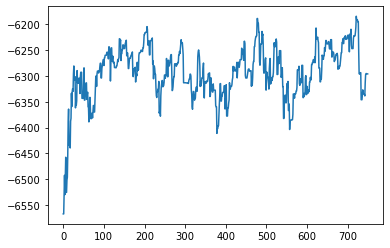

In [21]:
plt.plot(range(len(ll_sums)), ll_sums)

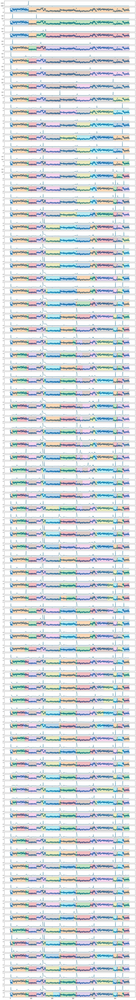

In [22]:
traces = nb_mcmc.clusters[1].ll_traces
f, axs = plt.subplots(2 * len(traces), figsize = (20,2 * len(traces)), sharex=True)
clus = 1
residuals = np.exp(np.log(nb_mcmc.clusters[clus].r) - (nb_mcmc.clusters[clus].mu) - (nb_mcmc.clusters[clus].C@nb_mcmc.clusters[clus].beta).flatten())
for i in range(len(traces)):
    trace = np.exp(traces[i])
    nonzero = (trace != 1)
    #msk2 = (trace > trace.mean()*1.01)
    msk = nonzero
    axs[2*i].plot(np.r_[:len(trace)][msk], trace[msk])
    
    tst = np.array(nb_mcmc.clusters[1].phase_history[i]).reshape(-1,2)
    axs[2*i+1].scatter(np.r_[:len(residuals)], residuals)
    for j, r in enumerate(tst):
        axs[2*i+1].add_patch(matplotlib.patches.Rectangle((r[0],0), r[1]-r[0], 2.3, fill=True, alpha=0.3, color = colors[j % 10]))

In [19]:
nb_mcmc.run(5000)

  0%|          | 0/5000 [00:00<?, ?it/s]

starting MCMC coverage segmentation...


  0%|          | 3/5000 [00:05<2:28:56,  1.79s/it]

split!
SortedList([0, 87, 87, 568])


  0%|          | 4/5000 [00:06<1:58:05,  1.42s/it]

split!
SortedList([0, 11, 11, 87, 87, 568])


  0%|          | 5/5000 [00:12<4:04:02,  2.93s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  0%|          | 6/5000 [00:17<5:10:35,  3.73s/it]

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  0%|          | 7/5000 [00:18<3:43:26,  2.69s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anacon

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 170, 170, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  0%|          | 12/5000 [00:35<3:56:38,  2.85s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 170, 170, 381, 381, 568])


  0%|          | 14/5000 [00:40<3:32:52,  2.56s/it]

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 170, 170, 381, 381, 491, 491, 568])


  0%|          | 15/5000 [00:41<2:51:26,  2.06s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  0%|          | 16/5000 [00:42<2:16:03,  1.64s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 170, 170, 381, 381, 491, 491, 535, 535, 568])


  0%|          | 18/5000 [00:43<1:29:49,  1.08s/it]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  0%|          | 19/5000 [00:43<1:10:49,  1.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 170, 170, 381, 381, 413, 413, 491, 491, 535, 535, 568])


  0%|          | 23/5000 [00:49<1:30:29,  1.09s/it]

split!
SortedList([0, 11, 11, 74, 74, 87, 87, 125, 125, 170, 170, 381, 381, 413, 413, 491, 491, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  0%|          | 24/5000 [00:49<1:11:35,  1.16it/s]

split!
SortedList([0, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 170, 170, 381, 381, 413, 413, 491, 491, 535, 535, 568])
split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 170, 170, 381, 381, 413, 413, 491, 491, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  1%|          | 26/5000 [00:49<46:10,  1.80it/s]  /home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 381, 381, 413, 413, 491, 491, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  1%|          | 33/5000 [00:51<26:40,  3.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/bas

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 321, 321, 381, 381, 413, 413, 491, 491, 535, 535, 568])


  1%|          | 44/5000 [01:00<58:49,  1.40it/s]  /home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  1%|          | 46/5000 [01:01<46:23,  1.78it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likeli

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 535, 535, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  1%|          | 53/5000 [01:04<30:27,  2.71it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 161, 161, 170, 170, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 535, 535, 568])


  1%|          | 56/5000 [01:05<30:57,  2.66it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  1%|          | 57/5000 [0

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 161, 161, 170, 170, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 510, 510, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  1%|          | 58/5000 [01:06<32:39,  2.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anac

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 161, 161, 170, 170, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 568])


  1%|          | 61/5000 [01:06<28:05,  2.93it/s]

split!
SortedList([0, 11, 11, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 161, 161, 170, 170, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 568])


  1%|          | 62/5000 [01:07<30:54,  2.66it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  1%|▏         | 64/5000 [01:07<29:30,  2.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  1%|▏         | 66/5000 [01:08<19:43,  4.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params avail

split!
SortedList([0, 11, 11, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 161, 161, 170, 170, 321, 321, 381, 381, 398, 398, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

split!
SortedList([0, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 161, 161, 170, 170, 321, 321, 381, 381, 398, 398, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


  2%|▏         | 93/5000 [01:17<21:56,  3.73it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacond

split!
SortedList([0, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 321, 321, 381, 381, 398, 398, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  2%|▏         | 97/5000 [01:18<18:43,  4.36it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:

split!
SortedList([0, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 321, 321, 381, 381, 398, 398, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  2%|▏         | 110/5000 [01:24<45:24,  1.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anacon

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  2%|▏         | 117/5000 [01:26<30:11,  2.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  2%|▏         | 118/5000 [01:26<25:02,  3.25it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

split!
SortedList([0, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 310, 310, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 542, 542, 568])


  3%|▎         | 126/5000 [01:29<35:26,  2.29it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacon

split!
SortedList([0, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 310, 310, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 542, 542, 568])


  3%|▎         | 132/5000 [01:31<27:18,  2.97it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 134/5000 [01:31<18:27,  4.39it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 310, 310, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 135/5000 [01:31<17:03,  4.76it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3

split!
SortedList([0, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 310, 310, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 512, 512, 535, 535, 542, 542, 568])
split!
SortedList([0, 3, 3, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 310, 310, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 512, 512, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  3%|▎         | 141/5000 [01:33<17:18,  4.68it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/ana

split!
SortedList([0, 3, 3, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 310, 310, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 512, 512, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  3%|▎         | 147/5000 [01:34<31:35,  2.56it/s]/home/opriebe/anaconda3

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 158/5000 [01:37<14:25,  5.59it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 159/5000 [01:37<21:47,  3.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 160/5000 [01:37<19:41,  4.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

split!
SortedList([0, 3, 3, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 310, 310, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 171/5000 [01:41<24:40,  3.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  3%|▎         | 172/5000 [01:41<22:07,  3.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

split!
SortedList([0, 3, 3, 11, 11, 36, 36, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 512, 512, 535, 535, 542, 542, 568])


  4%|▎         | 183/5000 [01:44<19:34,  4.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  4%|▎         | 186/5000 [01:45<14:20,  5.59it/s]

joining!


  4%|▎         | 187/5000 [01:45<17:20,  4.63it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  4%|▍         | 188/5000 [01:45<19:17,  4.16it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-package

joining!


  4%|▍         | 191/5000 [01:46<19:29,  4.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  4%|▍         | 192/50

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  4%|▍         | 200/5000 [01:50<37:15,  2.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  4%|▍         | 201/5000 [01:50<28:43,  2.78it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  4%|▍         | 206/5000 [01:51<24:06,  3.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

split!
SortedList([0, 11, 11, 64, 64, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 64, 64, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 535, 535, 542, 542, 568])


  4%|▍         | 210/5000 [01:51<13:47,  5.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  4%|▍         | 213

split!
SortedList([0, 11, 11, 64, 64, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  4%|▍         | 217/5000 [01:55<34:42,  2.30it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  4%|▍         | 219/5000 [01:55<28:00,  2.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian f

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  5%|▍         | 227/5000 [01:58<19:35,  4.06it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  5%|▍         | 230/5000 [01:59<20:18,  3.91it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

joining!
split!
SortedList([0, 11, 11, 64, 64, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  5%|▍         | 234/5000 [02:00<25:50,  3.07it/s]

split!
SortedList([0, 11, 11, 30, 30, 64, 64, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 542, 542, 568])


  5%|▍         | 235/5000 [02:00<23:31,  3.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  5%|▍         | 237/5000 [02:00<19:41,  4.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

split!
SortedList([0, 11, 11, 26, 26, 30, 30, 64, 64, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  5%|▍         | 244/5000 [02:02<15:10,  5.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-package

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  5%|▌         | 257/5000 [02:06<26:14,  3.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  5%|▌         | 258

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  5%|▌         | 268/5000 [02:08<18:03,  4.37it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  5%|▌         | 269/50

split!
SortedList([0, 11, 11, 30, 30, 87, 87, 125, 125, 144, 144, 156, 156, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 27, 27, 30, 30, 87, 87, 125, 125, 144, 144, 156, 156, 170, 170, 236, 236, 240, 240, 310, 310, 319, 319, 321, 321, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


  6%|▌         | 287/5000 [02:14<28:58,  2.71it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▌         | 288/5000 [02:14<23:38,  3.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

joining!


  6%|▌         | 299/5000 [02:19<35:25,  2.21it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▌         | 300/5000 [02:19<39:01,  2.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▌         | 302/5000 [02:20<25:09,  3.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('In

split!
SortedList([0, 11, 11, 27, 27, 30, 30, 87, 87, 125, 125, 144, 144, 156, 156, 170, 170, 236, 236, 240, 240, 292, 292, 310, 310, 319, 319, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 542, 542, 568])


  6%|▌         | 308/5000 [02:21<17:20,  4.51it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▌         | 310/5000 [02:21<13:17,  5.88it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▌         | 311/5000 [02:22<13:25,  5.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Ch

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  6%|▋         | 316/5000 [02:23<19:12,  4.07it/s]/home/opriebe/anacon

split!
SortedList([0, 11, 11, 27, 27, 30, 30, 87, 87, 125, 125, 144, 144, 156, 156, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 319, 319, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 542, 542, 568])


  6%|▋         | 323/5000 [02:25<24:33,  3.18it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  6%|▋         | 325/5000 [02:27<35:49,  2.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  7%|▋         | 327/5000 [02:27<22:31,  3.46it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  7%|▋         | 329/5000 [02:28<33:46,  2.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  7%|▋         | 338/5000 [02:30<18:12,  4.27it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC

split!
SortedList([0, 11, 11, 26, 26, 30, 30, 87, 87, 125, 125, 144, 144, 156, 156, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 542, 542, 568])


  7%|▋         | 353/5000 [02:34<17:29,  4.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels

joining!


  7%|▋         | 367/5000 [02:37<18:26,  4.19it/s]

split!
SortedList([0, 11, 11, 26, 26, 30, 30, 87, 87, 125, 125, 144, 144, 156, 156, 159, 159, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 510, 510, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 11, 11, 26, 26, 30, 30, 87, 87, 125, 125, 144, 144, 156, 156, 159, 159, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 568])


  8%|▊         | 382/5000 [02:42<26:13,  2.93it/s]

split!
SortedList([0, 11, 11, 26, 26, 30, 30, 78, 78, 87, 87, 125, 125, 144, 144, 156, 156, 159, 159, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 389/5000 [02:43<14:09,  5.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 391/5000 [02:44<16:23,  4.68it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

split!
SortedList([0, 5, 5, 11, 11, 26, 26, 30, 30, 78, 78, 87, 87, 125, 125, 144, 144, 156, 156, 159, 159, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  8%|▊         | 394/5000 [02:44<15:56,  4.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 395/5000 [02:44<16:13,  4.73it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

split!
SortedList([0, 5, 5, 11, 11, 26, 26, 30, 30, 78, 78, 87, 87, 125, 125, 144, 144, 156, 156, 159, 159, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 402/5000 [02:45<12:34,  6.09it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 406/5000 [02:46<13:40,  5.60it/s]

split!
SortedList([0, 5, 5, 11, 11, 26, 26, 30, 30, 78, 78, 87, 87, 125, 125, 144, 144, 156, 156, 168, 168, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 409/5000 [02:48<24:14,  3.16it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 410/5000 [02:48<22:38,  3.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/li

joining!


  8%|▊         | 419/5000 [02:51<26:17,  2.90it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 420/5000 [02:51<30:58,  2.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/li

split!
SortedList([0, 5, 5, 11, 11, 78, 78, 87, 87, 125, 125, 144, 144, 156, 156, 168, 168, 170, 170, 232, 232, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  8%|▊         | 423/5000 [02:53<32:39,  2.34it/s]

split!
SortedList([0, 5, 5, 11, 11, 78, 78, 87, 87, 125, 125, 144, 144, 156, 156, 168, 168, 170, 170, 232, 232, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 431, 431, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

joining!


  8%|▊         | 425/5000 [02:54<35:40,  2.14it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▊         | 427/5000 [02:54<22:03,  3.45it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
  9%|▊         | 428/5000 [02:54<25:39,  2.97it/s]/home/opriebe/anacon

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▉         | 439/5000 [02:58<29:05,  2.61it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▉         | 441/5000 [02:58<18:58,  4.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 5, 5, 11, 11, 87, 87, 125, 125, 144, 144, 156, 156, 168, 168, 170, 170, 236, 236, 240, 240, 308, 308, 314, 314, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 431, 431, 491, 491, 508, 508, 513, 513, 535, 535, 568])


  9%|▉         | 442/5000 [02:59<25:01,  3.04it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▉         | 445/5000 [03:00<22:35,  3.36it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▉         | 446/5000 [03:00<20:20,  3.73it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
  9%|▉         | 448/5000 [03:00<14:26,  5.25it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 5, 5, 11, 11, 87, 87, 125, 125, 144, 144, 156, 156, 168, 168, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

joining!
joining!


 10%|▉         | 485/5000 [03:11<20:52,  3.61it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 10%|▉         | 486/5000 [03:11<18:38,  4.04it/s]

split!
SortedList([0, 11, 11, 21, 21, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 10%|▉         | 487/5000 [03:12<20:07,  3.74it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 10%|▉         | 488/50

split!
SortedList([0, 11, 11, 21, 21, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 240, 240, 308, 308, 313, 313, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


 10%|▉         | 491/5000 [03:13<19:53,  3.78it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacon

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 10%|▉         | 496/5000 [03:14<21:07,  3.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 10%|▉         | 497/5000 [03:15<25:30,  2.94it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

split!
SortedList([0, 11, 11, 21, 21, 82, 82, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 10%|█         | 508/5000 [03:20<31:12,  2.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 10%|█         | 509/5000 [03:20<24:08,  3.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

split!
SortedList([0, 11, 11, 21, 21, 82, 82, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


 10%|█         | 519/5000 [03:22<13:29,  5.54it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 10%|█         | 520/5000 [03:22<19:43,  3.78it/s]/home/opriebe/anacon

split!
SortedList([0, 21, 21, 82, 82, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


 11%|█         | 534/5000 [03:27<21:03,  3.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 11%|█         | 536/5000 [03:27<15:29,  4.80it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

split!
SortedList([0, 21, 21, 82, 82, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 240, 240, 249, 249, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 11%|█         | 540/5000 [03:28<25:11,  2.95it/s]/home/opriebe/anacon

split!
SortedList([0, 11, 11, 21, 21, 82, 82, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 240, 240, 249, 249, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


 11%|█         | 549/5000 [03:30<19:17,  3.84it/s]

joining!


 11%|█         | 550/5000 [03:31<24:35,  3.02it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacon

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 11%|█         | 552/5000 [03:31<23:09,  3.20it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 11%|█         | 554/5000 [03:32<14:43,  5.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

joining!
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 11%|█         | 559/5000 [03:33<13:51,  5.34it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3

split!
SortedList([0, 3, 3, 11, 11, 75, 75, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


 11%|█▏        | 567/5000 [03:35<24:44,  2.99it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 11%|█▏        | 570/5000 [03:36<13:50,  5.33it/s]

split!
SortedList([0, 3, 3, 11, 11, 75, 75, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 168, 168, 170, 170, 236, 236, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


 11%|█▏        | 571/5000 [03:36<13:54,  5.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 11%|█▏        | 573

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 582/5000 [03:40<33:51,  2.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 584/5000 [03:40<27:55,  2.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 587/5000 [03:41<17:36,  4.18it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 588/5000 

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 168, 168, 170, 170, 236, 236, 238, 238, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 595/5000 [03:43<22:11,  3.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 597/5000 [03:43<17:28,  4.20it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 168, 168, 170, 170, 236, 236, 238, 238, 240, 240, 292, 292, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])
joining!


 12%|█▏        | 601/5000 [03:44<20:38,  3.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 602/5000 [03:44<22:07,  3.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 12%|█▏        | 604/5000 [03:45<29:02,  2.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 12%|█▏        | 606/5000 [03:46<19:05,  3.84it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/li

joining!


 12%|█▏        | 618/5000 [03:49<21:49,  3.35it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacon

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 12%|█▎        | 625/5000 [03:51<23:35,  3.09it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/ana

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


 13%|█▎        | 637/5000 [03:54<15:46,  4.61it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 13%|█▎        | 638/5000 [03:54<19:02,  3.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 13%|█▎        | 639/5000 [03:55<23:28,  3.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likeli

joining!
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 13%|█▎        | 663/5000 [04:04<21:19,  3.39it/s]

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])


 13%|█▎        | 665/5000 [04:04<20:43,  3.48it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 13%|█▎        | 666/5000 [04:05<22:10,  3.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 13%|█▎        | 671/5000 [04:07<25:19,  2.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 13%|█▎        | 672/5000 [04:07<28:28,  2.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▎        | 681/5000 [04:11<24:50,  2.90it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-package

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 14%|█▎        | 684/5000 [04:12<21:48,  3.30it/s]/home/opriebe/anacon

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▍        | 688/5000 [04:12<12:22,  5.81it/s]

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])


 14%|█▍        | 690/5000 [04:12<11:03,  6.50it/s]

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 318, 318, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▍        | 691/5000 [04:13<16:58,  4.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▍        | 693/5000 [04:13<18:43,  3.83it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 318, 318, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 464, 464, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 14%|█▍        | 697/5000 [04:15<26:11,  2.74it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▍        | 698/5000 [04:16<29:26,  2.44it/s]/home/opriebe

joining!


 14%|█▍        | 703/5000 [04:17<26:33,  2.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▍        | 704/5000 [04:18<29:48,  2.40it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 14%|█▍        | 705/5000 [04:18<26:29,  2.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 14%|█▍        | 706/5000 [04:18<30:30,  2.35it/s]

joining!


 15%|█▍        | 743/5000 [04:27<14:08,  5.02it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 15%|█▍        | 744/50

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 15%|█▍        | 748/5000 [04:29<25:33,  2.77it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 15%|█▌        | 750/5000 

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 238, 238, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 16%|█▌        | 800/5000 [04:46<24:59,  2.80it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 238, 238, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 16%|█▌        | 804/5000 [04:47<18:23,  3.80it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 16%|█▌        | 807/5000 [04:47<17:05,  4.09it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: Hessian

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 16%|█▋        | 820/5000 [04:50<14:15,  4.89it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-package

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 178, 178, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 17%|█▋        | 830/5000 [04:53<29:49,  2.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 17%|█▋        | 831/5000 [04:53<25:41,  2.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 17%|█▋        | 836/5000 [04:55<27:44,  2.50it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 837/5000 [04:56<23:25,  2.96it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 838/5000 [04:56<20:18,  3.41it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = co

joining!


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 841/5000 [04:57<20:55,  3.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 842/5000 [04:57<19:19,  3.59it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe

joining!
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 17%|█▋        | 847/5000 [04:58<20:02,  3.45it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 848/5000 [04:59<18:08,  3.81it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 17%|█▋        | 854/5000 [05:00<21:27,  3.22it/s]

split!
SortedList([0, 11, 11, 58, 58, 87, 87, 125, 125, 144, 144, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

split!
SortedList([0, 11, 11, 58, 58, 87, 87, 125, 125, 144, 144, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 318, 318, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 17%|█▋        | 858/5000 [05:01<19:01,  3.63it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 861/5000 [05:02<18:25,  3.74it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likeli

split!
SortedList([0, 11, 11, 58, 58, 87, 87, 125, 125, 144, 144, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 315, 315, 318, 318, 321, 321, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 866/5000 [05:03<08:59,  7.66it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 17%|█▋        | 867/5000 

joining!


 17%|█▋        | 869/5000 [05:03<12:56,  5.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 17%|█▋        | 871/5000 [05:05<23:03,  2.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 879/5000 [05:08<24:34,  2.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 553, 553, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 18%|█▊        | 880/5000 [05:08<26:42,  2.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-package

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 553, 553, 568])


 18%|█▊        | 885/5000 [05:11<42:43,  1.61it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 18%|█▊        | 886/5000 [05:11<34:34,  1.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 396, 396, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 553, 553, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 18%|█▊        | 889/5000 [05:12<27:09,  2.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 890/5000 [05:13<24:42,  2.77it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 891/5000 [05:13<20:34,  3.33it/s]

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 396, 396, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 553, 553, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 892/5000 [05:13<23:05,  2.97it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 215, 215, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 396, 396, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 523, 523, 535, 535, 542, 542, 553, 553, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 18%|█▊        | 902/5000 [05:16<28:44,  2.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 18%|█▊        | 903/5000 [05:17<28:26,  2.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian f

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 18%|█▊        | 906/5000 [05:18<25:46,  2.65it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/ana

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 316, 316, 321, 321, 381, 381, 396, 396, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 523, 523, 535, 535, 542, 542, 553, 553, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 910/5000 [05:19<19:22,  3.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacon

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 396, 396, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 523, 523, 535, 535, 542, 542, 553, 553, 568])


 18%|█▊        | 921/5000 [05:22<21:01,  3.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 923/5000 [05:22<16:50,  4.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed,

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 18%|█▊        | 925/5000 [05:23<29:34,  2.30it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 19%|█▉        | 945/5000 [05:28<10:05,  6.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 19%|█▉        | 947/5000 [05:29<22:50,  2.96it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)


joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 19%|█▉        | 954/5000 [05:31<19:10,  3.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 553, 553, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 5, 5, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 553, 553, 568])
split!
SortedList([0, 5, 5, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 406, 406, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 553, 553, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 19%|█▉        | 967/5000 [05:35<17:52,  3.76it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anacon

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 20%|█▉        | 979/5000 [05:37<14:17,  4.69it/s]/home/opriebe/anaconda3/li

split!
SortedList([0, 5, 5, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 162, 162, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 553, 553, 568])


 20%|█▉        | 982/5000 [05:38<15:33,  4.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 20%|█▉        | 983/5000 [05:38<14:28,  4.63it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 20%|█▉        | 984/5000 [05:39<18:49,  3.56it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 20%|█▉        | 986/5000 [05:39<18:50,  3.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fail

joining!


 20%|█▉        | 990/5000 [05:41<26:35,  2.51it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 20%|█▉        | 992

joining!


 20%|██        | 1004/5000 [05:44<14:12,  4.69it/s]

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 162, 162, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 553, 553, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 20%|██        | 1005/5000 [05:45<19:36,  3.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 162, 162, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 506, 506, 511, 511, 513, 513, 535, 535, 553, 553, 568])
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 162, 162, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 506, 506, 511, 511, 513, 513, 535, 535, 542, 542, 553, 553, 568])


 20%|██        | 1015/5000 [05:48<18:18,  3.63it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 162, 162, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 506, 506, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 20%|██        | 1022/5000 [05:50<22:13,  2.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 20%|██        | 1024/5000 [05:50<19:52,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 162, 162, 164, 164, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 506, 506, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 21%|██        | 1032/5000 [05:52<17:01,  3.88it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 21%|██        | 1033/5000 [05:52<17:46,  3.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 21%|██        | 1040/5000 [05:54<14:11,  4.65it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 162, 162, 164, 164, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 406, 406, 413, 413, 491, 491, 506, 506, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 21%|██        | 1057/5000 [05:58<14:37,  4.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 21%|██        | 1059/5000 [05:59<14:36,  4.50it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 162, 162, 164, 164, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 406, 406, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 21%|██▏       | 1065/5000 [06:00<20:28,  3.20it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 21%|██▏       | 1066/5000 [06:01<25:47,  2.54it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 162, 162, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 406, 406, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 21%|██▏       | 1074/5000 [06:04<20:55,  3.13it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 22%|██▏       | 1075/5000 [06:04<17:59,  3.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 22%|██▏       | 1076/5000 [06:05<21:40,  3.02it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 22%|██▏       | 1078/5000 [06:05<16:37,  3.93it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


joining!


 22%|██▏       | 1080/5000 [06:06<19:13,  3.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 22%|██▏       | 1082/5000 [06:07<26:58,  2.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 22%|██▏       | 1083/5000 [06:07<28:08,  2.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_par

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 403, 403, 406, 406, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 22%|██▏       | 1094/5000 [06:10<17:38,  3.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 22%|██▏       | 1100/5000 [06:11<16:19,  3.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 22%|██▏       | 1104/5000 [06:13<18:41,  3.47it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 22%|██▏       | 1107/5000 [06:13<12:27,  5.21it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

joining!
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 390, 390, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 23%|██▎       | 1126/5000 [06:19<16:01,  4.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 253, 253, 308, 308, 321, 321, 381, 381, 390, 390, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 250, 250, 253, 253, 308, 308, 321, 321, 381, 381, 390, 390, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 23%|██▎       | 1135/5000 [06:21<09:59,  6.44it/s]

joining!
joining!
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 250, 250, 308, 308, 310, 310, 321, 321, 381, 381, 390, 390, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 23%|██▎       | 1137/5000 [06:21<09:12,  6.99it/s]/home/opriebe/anaconda3/l

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 240, 240, 250, 250, 308, 308, 310, 310, 321, 321, 381, 381, 390, 390, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 23%|██▎       | 1146/5000 [06:23<08:48,  7.29it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 250, 250, 308, 308, 310, 310, 321, 321, 381, 381, 390, 390, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 23%|██▎       | 1153/5000 [06:23<06:58,  9.19it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 23%|██▎       | 1155/5000 [06:23<06:20, 10.12it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 23%|██▎       | 1157/5000 [06:24<09:56,  6.45it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_par

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 250, 250, 308, 308, 310, 310, 321, 321, 381, 381, 390, 390, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 23%|██▎       | 1159/5000 [06:24<10:11,  6.28it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 23%|██▎       | 1161/5000 [06:26<27:27,  2.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 2, 2, 7, 7, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 250, 250, 308, 308, 310, 310, 321, 321, 381, 381, 390, 390, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 23%|██▎       | 1163/5000 [06:27<23:42,  2.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 23%|██▎       | 1167/5000 [06:27<18:28,  3.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 23%|██▎       | 1168/5000 [06:28<17:33,  3.64

joining!


 24%|██▎       | 1175/5000 [06:30<23:04,  2.76it/s]

split!
SortedList([0, 2, 2, 7, 7, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 250, 250, 308, 308, 310, 310, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 24%|██▎       | 1176/5000 [06:31<28:06,  2.27it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 24%|██▎       | 1178/5000 [06:32<30:47,  2.07it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 24%|██▎       | 1179/5000 [06:32<25:01,  2.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

split!
SortedList([0, 2, 2, 7, 7, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 250, 250, 308, 308, 310, 310, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 24%|██▎       | 1182/5000 [06:33<28:21,  2.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


 24%|██▎       | 1186/5000 [06:34<11:29,  5.53it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 24%|██▍       | 1190/5000 [06:36<24:37,  2.58it/s]

split!
SortedList([0, 2, 2, 7, 7, 11, 11, 31, 31, 74, 74, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 2, 2, 7, 7, 11, 11, 31, 31, 74, 74, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 24%|██▍       | 1192/5000 [06:37<23:24,  2.71it/s]

joining!


 24%|██▍       | 1195/5000 [06:37<17:47,  3.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 24%|██▍       | 1198/5000 [06:38<18:57,  3.34it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


 24%|██▍       | 1201/5000 [06:38<13:19,  4.75it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 24%|██▍       | 12

split!
SortedList([0, 7, 7, 11, 11, 45, 45, 74, 74, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 24%|██▍       | 1216/5000 [06:44<22:51,  2.76it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 24%|██▍       | 12

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 25%|██▍       | 1228/5000 [06:47<09:41,  6.48it/s]

split!
SortedList([0, 7, 7, 11, 11, 45, 45, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 390, 390, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 25%|██▍       | 1229/5000 [06:47<13:43,  4.58it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 25%|██▍       | 1230/5000 [06:48<18:42,  3.36it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelih

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse

split!
SortedList([0, 7, 7, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 318, 318, 321, 321, 381, 381, 390, 390, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 25%|██▌       | 1257/5000 [06:55<19:38,  3.18it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 25%|██▌       | 1261/

split!
SortedList([0, 7, 7, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 236, 236, 240, 240, 308, 308, 318, 318, 321, 321, 381, 381, 390, 390, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 26%|██▌       | 1281/5000 [07:01<14:24,  4.30it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 26%|██▌       | 1288/5000 [07:04<16:38,  3.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


 26%|██▌       | 1291/5000 [07:05<20:33,  3.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 26%|██▌       | 1292/5000 [07:05<18:39,  3.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 7, 7, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 26%|██▌       | 1300/5000 [07:07<15:56,  3.87it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 26%|██▌       | 1302/5000 [07:08<18:34,  3.32it/

split!
SortedList([0, 7, 7, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 397, 397, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 27%|██▋       | 1327/5000 [07:14<13:47,  4.44it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 27%|██▋       | 1329/5000 [07:14<19:24,  3.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 27%|██▋       | 1336/5000 [07:17<25:16,  2.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 7, 7, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 317, 317, 321, 321, 381, 381, 397, 397, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 27%|██▋       | 1345/5000 [07:20<21:26,  2.84it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 7, 7, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 213, 213, 236, 236, 240, 240, 308, 308, 317, 317, 321, 321, 381, 381, 397, 397, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 27%|██▋       | 1348/5000 [07:21<19:01,  3.20it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 27%|██▋       | 1349/5000 [07:21<17:11,  3.54it/s]

split!
SortedList([0, 7, 7, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 183, 183, 213, 213, 236, 236, 240, 240, 308, 308, 317, 317, 321, 321, 381, 381, 397, 397, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 27%|██▋       | 1351/5000 [07:21<14:18,  4.25it/s]

joining!
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 27%|██▋       | 1353/5000 [07:22<12:18,  4.94it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 27%|██▋       | 1354/500

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 213, 213, 236, 236, 240, 240, 308, 308, 317, 317, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 27%|██▋       | 1356/5000 [07:22<10:54,  5.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

joining!


 27%|██▋       | 1360/5000 [07:23<13:14,  4.58it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 27%|██▋       | 1362/5000 [07:23<11:31,  5.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packag

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 27%|██▋       | 1367/5000 [07:26<25:33,  2.37it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 27%|██▋       | 1368/5000 [07:26<22:17,  2.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelih

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 27%|██▋       | 1374/5000 [07:28<26:16,  2.30it/s]/home/opriebe/anaco

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 28%|██▊       | 1385/5000 [07:33<27:47,  2.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 28%|██▊       | 1394/5000 [07:35<17:56,  3.35it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 28%|██▊       | 1398/5000 [07:38<26:19,  2.28it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 28%|██▊       | 14

split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 317, 317, 321, 321, 381, 381, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 28%|██▊       | 1407/5000 [07:40<19:11,  3.12it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 28%|██▊       | 1409/5000 [07:41<17:57,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 28%|██▊       | 1411/5000 [07:41<17:52,  3.35it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hess

joining!


 28%|██▊       | 1414/5000 [07:42<18:55,  3.16it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 28%|██▊       | 1416/5000 [07:43<14:55,  4.00it/s]/home/opriebe/anaconda3/lib/python3.8/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 389, 389, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 389, 389, 403, 403, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 28%|██▊       | 1425/5000 [07:44<15:18,  3.89it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 389, 389, 403, 403, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 29%|██▊       | 1427/5000 [07:45<14:07,  4.22it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 29%|██▊       | 1428/5000 [07:45<14:04,  4.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params 

split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 240, 240, 308, 308, 321, 321, 381, 381, 389, 389, 403, 403, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 29%|██▊       | 1432/5000 [07:46<11:20,  5.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packag

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 29%|██▉       | 1438/5000 [07:47<09:22,  6.34it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 29%|██▉       | 1450/5000 [07:51<20:18,  2.91it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 29%|██▉       | 1465/5000 [07:54<14:50,  3.97it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 219, 219, 236, 236, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 219, 219, 236, 236, 308, 308, 321, 321, 381, 381, 392, 392, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 29%|██▉       | 1467/5000 [07:54<16:40,  3.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 29%|██▉       | 1469/5000 [07:55<24:55,  2.36it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 308, 308, 313, 313, 321, 321, 381, 381, 392, 392, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 29%|██▉       | 1472/5000 [07:56<20:13,  2.91it/s]

split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 313, 313, 321, 321, 381, 381, 392, 392, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 29%|██▉       | 1473/5000 [07:57<23:57,  2.45it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 29%|██▉       | 14

joining!
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|██▉       | 1487/5000 [08:00<14:07,  4.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

joining!


 30%|██▉       | 1493/5000 [08:02<12:00,  4.87it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|██▉       | 1497/5000 [08:04<25:34,  2.28it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


 30%|███       | 1500/5000 [08:05<20:29,  2.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 205, 205, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 30%|███       | 1503/5000 [08:06<24:01,  2.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|███       | 1504/5000 [08:07<29:05,  2.00it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 3, 3, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 205, 205, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 30%|███       | 1508/5000 [08:08<23:39,  2.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|███       | 1510/5000 [08:09<24:27,  2.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!
split!
SortedList([0, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 165, 165, 170, 170, 205, 205, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|███       | 1518/5000 [08:11<16:58,  3.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|███       | 1519/5000 [08:12<21:10,  2.74it/s]

split!
SortedList([0, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 165, 165, 170, 170, 205, 205, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 403, 403, 413, 413, 486, 486, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 30%|███       | 1520/5000 [08:12<21:48,  2.66it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███       | 1526/5000 [08:13<07:40,  7.54it/s]

split!
SortedList([0, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 165, 165, 170, 170, 205, 205, 236, 236, 238, 238, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 403, 403, 413, 413, 486, 486, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███       | 1538/5000 [08:16<13:07,  4.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███       | 1539/5000 [08:17<18:43,  3.08it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!
split!
SortedList([0, 5, 5, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 165, 165, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 5, 5, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 162, 162, 165, 165, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███       | 1546/5000 [08:17<11:01,  5.22it/s]/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███       | 1550/5000 [08:18<11:09,  5.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███       | 15

split!
SortedList([0, 5, 5, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 165, 165, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 31%|███       | 1558/5000 [08:21<16:59,  3.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 31%|███       | 1560/5000 [08:21<20:48,  2.76it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

split!
SortedList([0, 5, 5, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 157, 157, 165, 165, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 31%|███▏      | 1565/5000 [08:23<14:40,  3.90it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!
split!
SortedList([0, 5, 5, 11, 11, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 165, 165, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 31%|███▏      | 1569/5000 [08:24<15:38,  3.66it/s]

split!
SortedList([0, 5, 5, 11, 11, 31, 31, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 165, 165, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 31%|███▏      | 1572/5000 [08:24<14:56,  3.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 5, 5, 11, 11, 31, 31, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 165, 165, 170, 170, 236, 236, 241, 241, 308, 308, 314, 314, 321, 321, 381, 381, 394, 394, 403, 403, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 32%|███▏      | 1590/5000 [08:29<12:21,  4.60it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 5, 5, 11, 11, 31, 31, 70, 70, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 165, 165, 170, 170, 236, 236, 241, 241, 308, 308, 314, 314, 321, 321, 381, 381, 394, 394, 403, 403, 406, 406, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 32%|███▏      | 1595/5000 [08:29<10:21,  5.48it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 32%|███▏      | 1597/5000 [08:30<11:32,  4.91it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 32%|███▏      | 1598/5000 [08:30<13:49,  4.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 32%|███▏      | 16

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse

joining!
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 32%|███▏      | 1614/5000 [08:34<12:30,  4.51it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 32%|███▏      | 1615/5000 [08:34<12:06,  4.66it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 33%|███▎      | 1626/5000 [08:36<10:22,  5.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 33%|███▎      | 1628/

joining!


 33%|███▎      | 1639/5000 [08:40<18:46,  2.98it/s]

joining!


 33%|███▎      | 1641/5000 [08:41<17:13,  3.25it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 33%|███▎      | 1642/5000 [08:41<17:16,  3.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 394, 394, 406, 406, 413, 413, 432, 432, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 33%|███▎      | 1653/5000 [08:45<19:37,  2.84it/s]/home/opriebe/anaco

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 394, 394, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 33%|███▎      | 1659/5000 [08:45<09:03,  6.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 33%|███▎      | 1660/5000 [08:46<09:53,  5.63it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params 

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 394, 394, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 33%|███▎      | 1670/5000 [08:49<17:37,  3.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: Hessia

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 317, 317, 321, 321, 381, 381, 394, 394, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 34%|███▎      | 1686/5000 [08:54<17:13,  3.21it/s]

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 317, 317, 321, 321, 381, 381, 394, 394, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 317, 317, 321, 321, 381, 381, 392, 392, 394, 394, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 34%|███▍      | 1690/5000 [08:54<11:45,  4.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 34%|███▍      | 1692/5000 [08:55<16:57,  3.25it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 314, 314, 317, 317, 321, 321, 381, 381, 392, 392, 394, 394, 406, 406, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 34%|███▍      | 1710/5000 [09:00<11:53,  4.61it/s]

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 314, 314, 317, 317, 321, 321, 381, 381, 392, 392, 394, 394, 406, 406, 413, 413, 451, 451, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 34%|███▍      | 1714/5000 [09:01<17:36,  3.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 34%|███▍      | 1716/5000 [09:01<13:22,  4.09it/s]

joining!


 34%|███▍      | 1719/5000 [09:02<15:18,  3.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 34%|███▍      | 1721/5000 [09:03<16:03,  3.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!
joining!


 35%|███▍      | 1736/5000 [09:08<10:37,  5.12it/s]

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 317, 317, 321, 321, 381, 381, 397, 397, 406, 406, 413, 413, 451, 451, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 35%|███▍      | 1737/5000 [09:08<10:59,  4.95it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packag

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 317, 317, 321, 321, 381, 381, 397, 397, 404, 404, 406, 406, 413, 413, 451, 451, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 35%|███▌      | 1757/5000 [09:15<19:31,  2.77it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 35%|███▌      | 1758/5000 [09:15<17:29,  3.09it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to 

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 35%|███▌      | 1761/5000 [09:16<15:51,  3.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 35%|███▌      | 1762/

joining!


 36%|███▌      | 1782/5000 [09:20<12:51,  4.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: Hessia

split!
SortedList([0, 2, 2, 11, 11, 81, 81, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 397, 397, 404, 404, 413, 413, 451, 451, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▌      | 1786/5000 [09:21<11:55,  4.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▌      | 1787/5000 [09:21<12:29,  4.29it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▌      | 1788/5000 [09:22<16:11,  3.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf =

split!
SortedList([0, 2, 2, 11, 11, 81, 81, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 230, 230, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 397, 397, 404, 404, 413, 413, 451, 451, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▌      | 1799/5000 [09:24<11:59,  4.45it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▌      | 1811/5000 [09:27<11:36,  4.58it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▋      | 1814/5000 [09:28<14:56,  3.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▋      | 1815/5000 [09:29<18:41,  2.84it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 36%|███▋      | 1817/5000 [09:29<14:10,  3.74it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packag

split!
SortedList([0, 2, 2, 11, 11, 81, 81, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 229, 229, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 36%|███▋      | 1821/5000 [09:31<15:34,  3.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

joining!


 37%|███▋      | 1841/5000 [09:36<14:51,  3.54it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 1843/5000 [09:37<11:53,  4.43it/s]

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 397, 397, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 37%|███▋      | 1844/5000 [09:37<14:39,  3.59it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 1845/5000 [09:38<17:37,  2.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelih

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 1851/5000 [09:39<14:10,  3.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 1853/5000 [09:39<09:36,  5.46it/s]

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 321, 321, 381, 381, 397, 397, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 1856/5000 [09:39<07:46,  6.74it/s]

joining!


 37%|███▋      | 1859/5000 [09:41<14:47,  3.54it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 37%|███▋      | 18

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 238, 238, 241, 241, 308, 308, 321, 321, 381, 381, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 1870/5000 [09:44<12:56,  4.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 37%|███▋      | 1872/500

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 231, 231, 236, 236, 238, 238, 241, 241, 308, 308, 321, 321, 381, 381, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 38%|███▊      | 1875/5000 [09:45<17:10,  3.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


 38%|███▊      | 1879/5000 [09:47<21:02,  2.47it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 38%|███▊      | 1881/500

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 38%|███▊      | 1883/5000 [09:48<14:15,  3.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 38%|███▊      | 1884/5000 [09:49<17:45,  2.93it/s]

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 38%|███▊      | 1886/5000 [09:49<16:24,  3.16it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 2, 2, 11, 11, 82, 82, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 38%|███▊      | 1897/5000 [09:52<20:32,  2.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 38%|███▊      | 1898/500

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

joining!


 38%|███▊      | 1925/5000 [10:00<11:32,  4.44it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▊      | 1926/5000 [10:01<10:38,  4.81it/s]

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▊      | 1930/5000 [10:02<12:40,  4.04it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packag

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 316, 316, 321, 321, 381, 381, 396, 396, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 239, 239, 241, 241, 308, 308, 316, 316, 321, 321, 381, 381, 396, 396, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 39%|███▊      | 1937/5000 [10:04<11:40,  4.37it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 39%|███▉      | 1940/5000 [10:05<20:43,  2.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed 

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 39%|███▉      | 1946/5000 [10:06<11:27,  4.44it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▉      | 1948/5000 [10:06<08:28,  6.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▉      | 1965/5000 [10:10<07:54,  6.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 239, 239, 241, 241, 308, 308, 319, 319, 321, 321, 381, 381, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 39%|███▉      | 1971/5000 [10:12<13:13,  3.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▉      | 1972/5000 [10:12<16:11,  3.12it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 39%|███▉      | 1973/5000 [10:12<14:19,  3.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

split!
SortedList([0, 2, 2, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 236, 236, 239, 239, 241, 241, 308, 308, 319, 319, 321, 321, 381, 381, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 40%|███▉      | 1978/5000 [10:14<12:25,  4.05it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 40%|███▉      | 1980/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 40%|███▉      | 1986/5000 [10:16<12:38,  3.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 40%|███▉      | 1987/5000 [10:16<14:42,  3.41it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_para

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 40%|████      | 2002/5000 [10:20<13:28,  3.71it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 40%|████      | 2003/

split!
SortedList([0, 2, 2, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 239, 239, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 404, 404, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 40%|████      | 2010/5000 [10:23<16:20,  3.05it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 40%|████      | 2014/5000 [10:23<08:21,  5.96it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

joining!


 40%|████      | 2016/5000 [10:24<10:18,  4.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 40%|████      | 2018/5000 [10:24<09:37,  5.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelih

joining!


 40%|████      | 2025/5000 [10:26<11:49,  4.19it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 41%|████      | 2026/5000 [10:27<14:56,  3.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 41%|████      | 2027/5000 [10:27<17:59,  2.75it/s]

split!
SortedList([0, 2, 2, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 413, 413, 434, 434, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 41%|████      | 2029/5000 [10:28<16:28,  3.01it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 41%|████      | 2033/5000 [10:28<09:54,  4.99it/s]

split!
SortedList([0, 2, 2, 11, 11, 72, 72, 74, 74, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


 41%|████      | 2034/5000 [10:28<09:33,  5.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 41%|████      | 2035/5000 [10:29<12:27,  3.97it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum L

split!
SortedList([0, 2, 2, 11, 11, 33, 33, 72, 72, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 41%|████      | 2036/5000 [10:29<14:27,  3.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 41%|████      | 2040/5000 [10:31<19:40,  2.51it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 41%|████      | 2042/5000 [10:32<19:07,  2.58it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 41%|████      | 2046/5000 [10:32<10:42,  4.60it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 2, 2, 11, 11, 72, 72, 87, 87, 125, 125, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 317, 317, 321, 321, 381, 381, 396, 396, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 41%|████      | 2053/5000 [10:34<10:56,  4.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 2, 2, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 317, 317, 321, 321, 381, 381, 396, 396, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 2, 2, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 314, 314, 317, 317, 321, 321, 381, 381, 396, 396, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 41%|████      | 2059/5000 [10:34<06:01,  8.13it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 41%|████      | 2061/500

joining!


 41%|████▏     | 2066/5000 [10:37<20:41,  2.36it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 41%|████▏     | 2067/5000 [10:37<17:10,  2.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 42%|████▏     | 2079/5000 [10:40<08:32,  5.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 2, 2, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 317, 317, 321, 321, 381, 381, 396, 396, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 42%|████▏     | 2093/5000 [10:44<13:34,  3.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 42%|████▏     | 20

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 2, 2, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 42%|████▏     | 2099/5000 [10:46<09:13,  5.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 42%|████▏     | 2104/500

split!
SortedList([0, 2, 2, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 168, 168, 170, 170, 229, 229, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 42%|████▏     | 2119/5000 [10:54<21:07,  2.27it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 42%|████▏     | 2121/5000 [10:54<12:56,  3.71it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/op

split!
SortedList([0, 2, 2, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 229, 229, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 43%|████▎     | 2127/5000 [10:56<12:41,  3.77it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 43%|████▎     | 2128/

joining!


 43%|████▎     | 2157/5000 [11:02<10:31,  4.50it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 43%|████▎     | 2160/

split!
SortedList([0, 2, 2, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 229, 229, 237, 237, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 43%|████▎     | 2172/5000 [11:05<05:54,  7.97it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 2, 2, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 229, 229, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 44%|████▎     | 2177/5000 [11:06<10:36,  4.43it/s]

joining!
split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 168, 168, 170, 170, 229, 229, 241, 241, 308, 308, 321, 321, 381, 381, 396, 396, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 44%|████▎     | 2179/5000 [11:07<11:56,  3.94it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 44%|████▎     | 2181/5000 [11:07<09:42,  4.84it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 44%|████▍     | 2188/5000 [11:11<19:23,  2.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 44%|████▍     | 2195/5000 [11:13<16:40,  2.80it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodel

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 229, 229, 235, 235, 241, 241, 308, 308, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 44%|████▍     | 2208/5000 [11:16<12:40,  3.67it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 44%|████▍     | 2210/5000 [11:16<09:59,  4.65it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 2, 2, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 229, 229, 235, 235, 241, 241, 308, 308, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 44%|████▍     | 2222/5000 [11:19<08:17,  5.58it/s]

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 229, 229, 235, 235, 239, 239, 241, 241, 308, 308, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 44%|████▍     | 2223/5000 [11:20<10:23,  4.46it/s]/home/opriebe/anaconda

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 168, 168, 170, 170, 229, 229, 235, 235, 239, 239, 241, 241, 308, 308, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▍     | 2231/5000 [11:22<13:03,  3.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


 45%|████▍     | 2234/5000 [11:22<10:31,  4.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 45%|████▍     | 22

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▍     | 2243/5000 [11:25<11:08,  4.12it/s]/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 168, 168, 170, 170, 229, 229, 231, 231, 241, 241, 308, 308, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▌     | 2251/5000 [11:26<08:10,  5.60it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▌     | 2252/5000 [11:27<08:13,  5.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 45%|████▌     | 2272/5000 [11:34<13:17,  3.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 231, 231, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 46%|████▌     | 2298/5000 [11:43<19:25,  2.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 46%|████▌     | 2299/5000 [11:43<15:43,  2.86it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 231, 231, 241, 241, 308, 308, 321, 321, 381, 381, 392, 392, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 46%|████▋     | 2314/5000 [11:45<06:05,  7.35it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

joining!


 46%|████▋     | 2320/5000 [11:46<07:40,  5.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 46%|████▋     | 2321/5000 [11:47<11:44,  3.80it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 231, 231, 241, 241, 308, 308, 321, 321, 381, 381, 390, 390, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 47%|████▋     | 2341/5000 [11:54<15:53,  2.79it/s]

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 203, 203, 231, 231, 241, 241, 308, 308, 321, 321, 381, 381, 390, 390, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 203, 203, 231, 231, 233, 233, 241, 241, 308, 308, 321, 321, 381, 381, 390, 390, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 47%|████▋     | 2344/5000 [11:55<12:53,  3.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 47%|████▋     | 2346/5000 [11:55<09:31,  4.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 47%|████▋     | 2348/5000 [11:55<07:36,  5.80it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 47%|████▋     | 2351/5000 [11:57<14:45,  2.99it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 47%|████▋     | 2352/5000 [11:57<12:51,  3.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


 47%|████▋     | 2368/5000 [12:00<07:30,  5.84it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 47%|████▋     | 2370/5000 [12:01<11:25,  3.84it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


 47%|████▋     | 2372/5000 [12:01<08:41,  5.04it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 47%|████▋     | 2373/

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 203, 203, 231, 231, 241, 241, 308, 308, 321, 321, 381, 381, 391, 391, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 203, 203, 231, 231, 241, 241, 308, 308, 321, 321, 381, 381, 391, 391, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 48%|████▊     | 2383/5000 [12:04<10:33,  4.13it/s]/home/opriebe/anaco

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 203, 203, 231, 231, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 391, 391, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 203, 203, 231, 231, 236, 236, 241, 241, 308, 308, 321, 321, 381, 381, 391, 391, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 542, 542, 568])


 48%|████▊     | 2393/5000 [12:07<11:21,  3.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 48%|████▊     | 2394/5000 [12:07<11:01,  3.94it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


 48%|████▊     | 2397/5000 [12:08<18:39,  2.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


 48%|████▊     | 2407/5000 [12:11<12:38,  3.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: Conver

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 48%|████▊     | 2412/5000 [12:12<13:59,  3.08it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 48%|████▊     | 2414/5000 [12:13<16:08,  2.67it/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 48%|████▊     | 2425/5000 [12:17<16:05,  2.67it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 49%|████▊     | 24

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 262, 262, 308, 308, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 49%|████▊     | 2436/5000 [12:22<21:10,  2.02it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 49%|████▊     | 2437/

joining!


 49%|████▉     | 2464/5000 [12:29<10:24,  4.06it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 49%|████▉     | 2465/500

split!
SortedList([0, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 262, 262, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 50%|████▉     | 2482/5000 [12:36<15:08,  2.77it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|████▉     | 2483/5000 [12:36<13:09,  3.19it/

split!
SortedList([0, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 262, 262, 311, 311, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 50%|████▉     | 2490/5000 [12:39<11:33,  3.62it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 50%|████▉     | 2491/5000 [12:39<12:53,  3.24it/s]

split!
SortedList([0, 11, 11, 33, 33, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 262, 262, 311, 311, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 50%|████▉     | 2493/5000 [12:40<12:33,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 50%|████▉     | 2494/5000 [12:40<12:39,  3.30it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum L

split!
SortedList([0, 11, 11, 33, 33, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 262, 262, 311, 311, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 460, 460, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|█████     | 2505/5000 [12:44<14:35,  2.85it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|█████     | 2506/5000 [12:44<16:24,  2.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 33, 33, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 262, 262, 311, 311, 321, 321, 381, 381, 391, 391, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 50%|█████     | 2518/5000 [12:47<08:53,  4.66it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!
joining!
split!
SortedList([0, 3, 3, 11, 11, 33, 33, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 311, 311, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 50%|█████     | 2520/5000 [12:47<09:20,  4.42it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|█████     | 2521/5000 [12:48<12:16,  3.37it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 50%|█████     | 2524/5000 [12:49<11:55,  3.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 50%|█████     | 2525/5000 [12:49<13:49,  2.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 51%|█████     | 2533/5000 [12:51<12:20,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 51%|█████     | 2534/5000 [12:51<11:31,  3.57

split!
SortedList([0, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 311, 311, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 51%|█████     | 2544/5000 [12:54<13:09,  3.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 51%|█████     | 25

split!
SortedList([0, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 311, 311, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 51%|█████     | 2549/5000 [12:56<13:07,  3.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 51%|█████     | 2550/5000 [12:56<14:28,  2.82it/s]

split!
SortedList([0, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 285, 285, 311, 311, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 51%|█████     | 2551/5000 [12:56<14:01,  2.91it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 51%|█████     | 2552/5000 [12:57<11:56,  3.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 72, 72, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 241, 241, 285, 285, 311, 311, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 52%|█████▏    | 2577/5000 [13:05<15:57,  2.53it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 52%|█████▏    | 2581/5000 [13:06<12:35,  3.20it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 241, 241, 259, 259, 285, 285, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 52%|█████▏    | 2603/5000 [13:14<18:48,  2.12it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: Conver

joining!


 52%|█████▏    | 2615/5000 [13:17<11:29,  3.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 163, 163, 170, 170, 236, 236, 241, 241, 285, 285, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 548, 548, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 52%|█████▏    | 2616/5000 [13:18<13:58,  2.84it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 52%|█████▏    | 2620/5000 [13:19<11:49,  3.36it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 52%|█████▏    | 2621/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 2628/5000 [13:20<05:25,  7.28it/s]

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 285, 285, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 548, 548, 568])
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 285, 285, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 548, 548, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 2629/5000 [13:20<05:33,  7.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 285, 285, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 548, 548, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 2633/5000 [13:21<06:59,  5.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 53%|█████▎    | 26

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 285, 285, 314, 314, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 548, 548, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 53%|█████▎    | 2646/5000 [13:26<12:38,  3.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

joining!
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 285, 285, 314, 314, 317, 317, 321, 321, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 548, 548, 568])


 53%|█████▎    | 2650/5000 [13:27<12:15,  3.20it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 53%|█████▎    | 2651/5000 [13:27<11:03,  3.54it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 2654/5000 [13:28<10:14,  3.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 53%|█████▎    | 2655/5000 [13:29<13:15,  2.95it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 2656/500

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 285, 285, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 432, 432, 491, 491, 508, 508, 513, 513, 535, 535, 548, 548, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 53%|█████▎    | 2657/5000 [13:29<10:04,  3.88it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 285, 285, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 432, 432, 491, 491, 508, 508, 513, 513, 535, 535, 548, 548, 568])


 53%|█████▎    | 2659/5000 [13:29<08:14,  4.73it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 2660/5000 [13:30<11:28,  3.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 53%|█████▎    | 2664/5000 [13:31<12:02,  3.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 53%|█████▎    | 26

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 54%|█████▎    | 2678/5000 [13:36<17:14,  2.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 241, 241, 285, 285, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 548, 548, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 54%|█████▎    | 2683/5000 [13:37<08:08,  4.74it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 548, 548, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


 54%|█████▍    | 2699/5000 [13:41<08:42,  4.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 54%|█████▍    | 2701/5000 [13:41<07:10,  5.34it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 548, 548, 564, 564, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 54%|█████▍    | 2710/5000 [13:45<16:02,  2.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 54%|█████▍    | 2711/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 54%|█████▍    | 2719/5000 [13:48<11:29,  3.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 54%|█████▍    | 2720/5000 [13:48<11:00,  3.45it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!
split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 548, 548, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 55%|█████▍    | 2738/5000 [13:54<07:44,  4.87it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 2, 2, 11, 11, 71, 71, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 548, 548, 568])


 55%|█████▍    | 2745/5000 [13:57<12:32,  3.00it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 55%|█████▍    | 2746/5000 [13:57<10:55,  3.44it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 55%|█████▍    | 2747/5000 [13:57<10:30,  3.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


 55%|█████▌    | 2757/5000 [14:01<13:48,  2.71it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 548, 548, 568])


 55%|█████▌    | 2759/5000 [14:02<10:54,  3.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 548, 548, 568])


 55%|█████▌    | 2761/5000 [14:02<11:11,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 55%|█████▌    | 2762/5000 [14:02<10:08,  3.68it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 548, 548, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 55%|█████▌    | 2767/5000 [14:03<06:42,  5.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 55%|█████▌    | 2769/5000 [14:04<10:52,  3.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 263, 263, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 548, 548, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 55%|█████▌    | 2774/5000 [14:05<10:54,  3.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 56%|█████▌    | 2776/5000 [14:06<08:44,  4.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelih

joining!


 56%|█████▌    | 2787/5000 [14:09<13:33,  2.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 56%|█████▌    | 2789/5000 [14:10<09:25,  3.91it/s]

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 548, 548, 568])


 56%|█████▌    | 2790/5000 [14:10<08:44,  4.21it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 56%|█████▌    | 2792/5000 [14:10<10:22,  3.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 56%|█████▌    | 2794/5000 [14:11<10:01,  3.67it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


 56%|█████▌    | 2801/5000 [14:14<15:14,  2.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 56%|█████▌    | 2803/5000 [14:15<18:28,  1.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed 

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 56%|█████▌    | 2811/5000 [14:17<11:02,  3.30it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 56%|█████▋    | 2825/5000 [14:21<05:34,  6.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packag

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2836/5000 [14:24<12:18,  2.93it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2837/5000 [14:25<14:14,  2.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 2, 2, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 57%|█████▋    | 2843/5000 [14:26<11:24,  3.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2845/5000 [14:27<12:19,  2.91it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 2, 2, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 2, 2, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 523, 523, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2852/5000 [14:29<08:03,  4.44it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2854/5000 [14:29<08:33,  4.18it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2857/

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 523, 523, 535, 535, 542, 542, 568])


 57%|█████▋    | 2863/5000 [14:32<08:32,  4.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2865/5000 [14:33<11:27,  3.11it/s]

split!
SortedList([0, 4, 4, 11, 11, 66, 66, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 523, 523, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2866/5000 [14:33<12:55,  2.75it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 57%|█████▋    | 2869/5000 [14:33<08:38,  4.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2870/5000 [14:34<09:57,  3.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 57%|█████▋    | 2872/5000 [14:35<14:06,  2.51it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_par

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 58%|█████▊    | 2876/5000 [14:37<17:56,  1.97it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packag

joining!


 58%|█████▊    | 2886/5000 [14:42<15:33,  2.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 58%|█████▊    | 2887/5000 [14:43<18:28,  1.91it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelih

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 450, 450, 491, 491, 508, 508, 513, 513, 523, 523, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 58%|█████▊    | 2894/5000 [14:45<13:18,  2.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 58%|█████▊    | 2900/5000 [14:47<13:38,  2.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


 58%|█████▊    | 2906/5000 [14:49<13:57,  2.50it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 58%|█████▊    | 2907/5000 [14:50<13:08,  2.65it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

split!
SortedList([0, 4, 4, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 225, 225, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 59%|█████▉    | 2940/5000 [15:01<07:59,  4.30it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 59%|█████▉    | 2941/5000 [15:02<10:09,  3.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 170, 170, 225, 225, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 59%|█████▉    | 2958/5000 [15:07<07:59,  4.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 59%|█████▉    | 2959/5000 [15:07<07:44,  4.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 225, 225, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 59%|█████▉    | 2968/5000 [15:08<05:38,  6.00it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packag

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 60%|█████▉    | 2979/5000 [15:11<11:10,  3.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 225, 225, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 60%|█████▉    | 2988/5000 [15:15<15:59,  2.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 60%|█████▉    | 2996/5000 [15:16<09:13,  3.62it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 60%|█████▉    | 2998/5000 [15:17<08:03,  4.14it/

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 225, 225, 236, 236, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 510, 510, 513, 513, 535, 535, 542, 542, 568])


 60%|██████    | 3003/5000 [15:18<06:54,  4.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 60%|██████    | 3009/

joining!


 60%|██████    | 3015/5000 [15:21<06:33,  5.05it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 225, 225, 236, 236, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 61%|██████    | 3028/5000 [15:24<05:44,  5.73it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 61%|██████    | 3030/5000 [15:24<04:46,  6.87it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 236, 236, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 399, 399, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 61%|██████    | 3032/5000 [15:24<04:54,  6.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


 61%|██████    | 3046/5000 [15:28<09:04,  3.59it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 61%|██████    | 3049/5000 [15:29<07:06,  4.57it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 61%|██████    | 3051/5000 [15:29<06:50,  4.75it/s]/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 61%|██████▏   | 3067/5000 [15:34<12:11,  2.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 231, 231, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 3079/5000 [15:38<09:49,  3.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 11, 11, 74, 74, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 231, 231, 238, 238, 241, 241, 310, 310, 314, 314, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 62%|██████▏   | 3081/5000 [15:38<10:38,  3.00it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 3084/5000 [15:39<07:30,  4.25it/s]

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 231, 231, 238, 238, 241, 241, 310, 310, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 3085/5000 [15:39<11:10,  2.86it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

joining!


 62%|██████▏   | 3087/5000 [15:40<09:08,  3.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 3088/5000 [15:40<10:51,  2.94it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 3089/5000 [15:40<09:41,  3.28it/s]

joining!


 62%|██████▏   | 3092/5000 [15:41<09:50,  3.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 3095/5000 [15:41<05:50,  5.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


 62%|██████▏   | 3096/5000 [15:42<05:48,  5.47it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 3097/5000 [15:42<05:41,  5.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 62%|██████▏   | 3112/5000 [15:46<09:36,  3.28it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 62%|██████▏   | 3114/5000 [15:47<13:14,  2.37it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


 63%|██████▎   | 3128/5000 [15:51<07:24,  4.21it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 63%|██████▎   | 3132/5000 [15:53<13:14,  2.35it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 562, 562, 568])
joining!


 63%|██████▎   | 3138/5000 [15:54<07:15,  4.28it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 63%|██████▎   | 3141/5000 [15:56<10:18,  3.01it/s]/home/opriebe/anaconda3/lib/python3.8/

joining!
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 63%|██████▎   | 3150/5000 [15:58<05:38,  5.47it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 63%|██████▎   | 3151/5000 [15:58<05:58,  5.16it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


 63%|██████▎   | 3165/5000 [16:02<09:34,  3.19it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 225, 225, 238, 238, 241, 241, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 63%|██████▎   | 3168/5000 [16:03<10:01,  3.04it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 63%|██████▎   | 3169/5000 [16:03<11:28,  2.66it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelih

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 63%|██████▎   | 3174/5000 [16:05<09:58,  3.05it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 238, 238, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 64%|██████▍   | 3192/5000 [16:09<05:43,  5.27it/s]/home/opriebe/anaconda3/lib/python3.8/site-packag

split!
SortedList([0, 3, 3, 11, 11, 18, 18, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 238, 238, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 64%|██████▍   | 3198/5000 [16:12<12:35,  2.39it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 64%|██████▍   | 3202/500

split!
SortedList([0, 3, 3, 11, 11, 18, 18, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 225, 225, 234, 234, 238, 238, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 64%|██████▍   | 3204/5000 [16:13<06:45,  4.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 64%|██████▍   | 3205/5000 [16:14<09:14,  3.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 64%|██████▍   | 3206/5000 [16:14<10:33,  2.83it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_par

joining!


 64%|██████▍   | 3210/5000 [16:15<11:47,  2.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 64%|██████▍   | 3211/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 64%|██████▍   | 3213/5000 [16:17<13:20,  2.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 234, 234, 238, 238, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 65%|██████▍   | 3231/5000 [16:23<08:43,  3.38it/s]

split!
SortedList([0, 3, 3, 11, 11, 36, 36, 69, 69, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 234, 234, 238, 238, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 65%|██████▍   | 3232/5000 [16:23<08:31,  3.46it/s]/home/opriebe/an

split!
SortedList([0, 3, 3, 11, 11, 36, 36, 69, 69, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 234, 234, 238, 238, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 65%|██████▍   | 3240/5000 [16:24<07:13,  4.06it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 65%|██████▍   | 3243/5000 [16:25<07:05,  4.13it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params 

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 65%|██████▍   | 3249/5000 [16:26<04:53,  5.97it/s]/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 65%|██████▌   | 3254/5000 [16:26<03:54,  7.44it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 65%|██████▌   | 3255/

split!
SortedList([0, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 234, 234, 238, 238, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 65%|██████▌   | 3262/5000 [16:29<07:24,  3.91it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 65%|██████▌   | 3263/5000 [16:29<09:40,  2.99it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split!
SortedList([0, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 234, 234, 238, 238, 310, 310, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 65%|██████▌   | 3265/5000 [16:30<08:40,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 227, 227, 234, 234, 238, 238, 310, 310, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 66%|██████▌   | 3282/5000 [16:33<08:52,  3.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/b

joining!


 66%|██████▌   | 3285/5000 [16:34<08:04,  3.54it/s]

split!
SortedList([0, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 163, 163, 170, 170, 227, 227, 234, 234, 238, 238, 240, 240, 310, 310, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 66%|██████▌   | 3288/5000 [16:35<08:39,  3.29it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 66%|██████▌   | 3290/5000 [16:36<08:23,  3.40it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 66%|██████▌   | 3291/5000 [16:36<09:45,  2.92it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 66%|██████▌   | 3292/500

joining!
split!
SortedList([0, 3, 3, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 155, 155, 157, 157, 170, 170, 227, 227, 234, 234, 238, 238, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 66%|██████▌   | 3296/5000 [16:38<11:54,  2.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 66%|██████▌   | 3299/5000 [16:39<07:40,  3.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 66%|██████▌   | 3311/5000 [16:41<04:05,  6.87it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 66%|██████▋   | 3313/5000 [16:42<05:34,  5.04it/s]

split!
SortedList([0, 3, 3, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 157, 157, 170, 170, 227, 227, 240, 240, 256, 256, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 66%|██████▋   | 3315/5000 [16:42<06:17,  4.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 67%|██████▋   | 3332/5000 [16:46<06:03,  4.59it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 2, 2, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 170, 170, 227, 227, 240, 240, 256, 256, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 2, 2, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 170, 170, 227, 227, 240, 240, 256, 256, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 67%|██████▋   | 3343/5000 [16:49<06:15,  4.41it/s]

split!
SortedList([0, 2, 2, 11, 11, 36, 36, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 170, 170, 227, 227, 240, 240, 256, 256, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 67%|██████▋   | 3345/5000 [16:50<07:34,  3.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 67%|██████▋   | 33

split!
SortedList([0, 2, 2, 11, 11, 36, 36, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 170, 170, 227, 227, 240, 240, 256, 256, 314, 314, 317, 317, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 2, 2, 11, 11, 36, 36, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 170, 170, 227, 227, 237, 237, 240, 240, 256, 256, 314, 314, 317, 317, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 68%|██████▊   | 3376/5000 [16:58<05:57,  4.54it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 68%|██████▊   | 3378/5000 [16:59<07:46,  3.47it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.p

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 68%|██████▊   | 3425/5000 [17:08<02:44,  9.60it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▊   | 3427/

joining!


 69%|██████▊   | 3429/5000 [17:09<05:10,  5.07it/s]

split!
SortedList([0, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 170, 170, 189, 189, 227, 227, 240, 240, 314, 314, 317, 317, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▊   | 3431/5000 [17:10<05:10,  5.05it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 5, 5, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 170, 170, 189, 189, 227, 227, 240, 240, 314, 314, 317, 317, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▉   | 3440/5000 [17:12<05:54,  4.41it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▉   | 3441/5000 [17:12<05:41,  4.56it/s]

split!
SortedList([0, 5, 5, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 170, 170, 189, 189, 227, 227, 240, 240, 253, 253, 314, 314, 317, 317, 381, 381, 389, 389, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 69%|██████▉   | 3442/5000 [17:12<07:12,  3.60it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 69%|██████▉   | 3444/5000 [17:13<05:51,  4.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

split!
SortedList([0, 5, 5, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 170, 170, 189, 189, 227, 227, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 69%|██████▉   | 3453/5000 [17:14<05:29,  4.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!
split!
SortedList([0, 5, 5, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 167, 167, 170, 170, 189, 189, 227, 227, 240, 240, 253, 253, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 69%|██████▉   | 3456/5000 [17:15<04:20,  5.93it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▉   | 3457/5000 [17:15<05:10,  4.97it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

split!
SortedList([0, 5, 5, 11, 11, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 167, 167, 170, 170, 189, 189, 227, 227, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▉   | 3469/5000 [17:19<06:11,  4.12it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▉   | 3471/5000 [17:20<07:02,  3.62it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 5, 5, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 167, 167, 170, 170, 189, 189, 227, 227, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 69%|██████▉   | 3474/5000 [17:21<06:38,  3.83it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

split!
SortedList([0, 5, 5, 11, 11, 29, 29, 31, 31, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 167, 167, 170, 170, 189, 189, 227, 227, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|██████▉   | 3482/5000 [17:22<06:12,  4.08it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|██████▉   | 3483/

split!
SortedList([0, 5, 5, 11, 11, 29, 29, 31, 31, 69, 69, 87, 87, 125, 125, 144, 144, 154, 154, 167, 167, 170, 170, 189, 189, 227, 227, 236, 236, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 3500/5000 [17:26<04:03,  6.16it/s]

joining!
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 3504/5000 [17:26<04:23,  5.68it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 5, 5, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 154, 154, 167, 167, 170, 170, 189, 189, 227, 227, 236, 236, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 70%|███████   | 3505/5000 [17:27<04:45,  5.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 3506/5000 [17:27<04:07,  6.03it/s]

split!
SortedList([0, 5, 5, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 146, 146, 154, 154, 167, 167, 170, 170, 189, 189, 227, 227, 236, 236, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 5, 5, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 146, 146, 154, 154, 167, 167, 170, 170, 189, 189, 227, 227, 236, 236, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 388, 388, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 3507/5000 [17:27<03:47,  6.58it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 3509/500

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 70%|███████   | 3525/5000 [17:31<09:19,  2.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 71%|███████   | 3531/5000 [17:32<05:21,  4.56it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


 71%|███████   | 3532/5000 [17:32<05:40,  4.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 3533/5000 [17:33<07:15,  3.37it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 3534/5000 [17:33<09:02,  2.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to conver

joining!


 71%|███████   | 3541/5000 [17:36<09:31,  2.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 3542/5000 [17:36<10:09,  2.39it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 3543/5000 [17:37<10:45,  2.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_par

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 3548/5000 [17:38<06:00,  4.02it/s]/home/opriebe/anaconda3/l

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 146, 146, 154, 154, 170, 170, 236, 236, 240, 240, 250, 250, 253, 253, 314, 314, 317, 317, 381, 381, 388, 388, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 71%|███████   | 3555/5000 [17:39<06:13,  3.87it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████   | 3556/5000 [17:40<05:48,  4.14it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████▏  | 3568/5000 [17:42<03:52,  6.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████▏  | 3569/500

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████▏  | 3571/5000 [17:43<07:30,  3.18it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 71%|███████▏  | 3573/5000 [17:44<07:58,  2.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 146, 146, 154, 154, 170, 170, 236, 236, 240, 240, 314, 314, 317, 317, 381, 381, 388, 388, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 525, 525, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 72%|███████▏  | 3582/5000 [17:46<04:44,  4.98it/s]

joining!


 72%|███████▏  | 3583/5000 [17:46<06:03,  3.90it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 72%|███████▏  | 3584/5000 [17:47<06:24,  3.68it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


 72%|███████▏  | 3601/5000 [17:52<08:34,  2.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 72%|███████▏  | 3603/5000 [17:53<09:38,  2.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 72%|███████▏  | 3604/5000 [17:53<08:01,  2.90it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge.

split!
SortedList([0, 3, 3, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 154, 154, 170, 170, 236, 236, 240, 240, 314, 314, 317, 317, 381, 381, 388, 388, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 72%|███████▏  | 3620/5000 [17:57<05:26,  4.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 154, 154, 170, 170, 217, 217, 236, 236, 240, 240, 314, 314, 317, 317, 381, 381, 388, 388, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 73%|███████▎  | 3628/5000 [17:59<04:04,  5.61it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.p

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 154, 154, 170, 170, 236, 236, 240, 240, 267, 267, 314, 314, 317, 317, 381, 381, 388, 388, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 73%|███████▎  | 3638/5000 [18:01<06:27,  3.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 3640/

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 146, 146, 154, 154, 170, 170, 236, 236, 240, 240, 267, 267, 314, 314, 317, 317, 381, 381, 388, 388, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 73%|███████▎  | 3657/5000 [18:06<06:54,  3.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


 73%|███████▎  | 3662/5000 [18:07<04:44,  4.71it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 3663/5000 [18:07<04:47,  4.65it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 3664/5000 [18:07<04:11,  5.31it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 3665/5000 [18:07<04:14,  5.25it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 3668/5000 [18:08<04:08,  5.35it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 3669/5000 [18:08<06:03,  3.67it/s]

joining!


 73%|███████▎  | 3670/5000 [18:09<06:53,  3.21it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 73%|███████▎  | 3671/5000 [18:09<05:57,  3.71it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 154, 154, 170, 170, 231, 231, 236, 236, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▎  | 3683/5000 [18:12<07:20,  2.99it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▎  | 3685/5000 [18:13<08:40,  2.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 170, 170, 231, 231, 236, 236, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▍  | 3691/5000 [18:15<06:59,  3.12it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▍  | 3692/

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 170, 170, 231, 231, 236, 236, 240, 240, 257, 257, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 74%|███████▍  | 3697/5000 [18:16<04:47,  4.54it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 74%|███████▍  | 3699/5000 [18:17<05:56,  3.65it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params 

split!
SortedList([0, 3, 3, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 170, 170, 231, 231, 236, 236, 240, 240, 257, 257, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 74%|███████▍  | 3707/5000 [18:19<06:02,  3.56it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 74%|███████▍  | 3718/5000 [18:21<05:01,  4.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 74%|███████▍  | 3719/5000 [18:21<04:47,  4.45it/s]/home/oprie

joining!


 75%|███████▍  | 3727/5000 [18:25<08:16,  2.56it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 3, 3, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 170, 170, 231, 231, 237, 237, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▍  | 3732/5000 [18:26<04:26,  4.77it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▍  | 3734/5000 [18:26<03:39,  5.77it/s]

split!
SortedList([0, 3, 3, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 170, 170, 231, 231, 237, 237, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▍  | 3736/5000 [18:26<04:08,  5.09it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▍  | 37

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▍  | 3741/5000 [18:28<05:47,  3.62it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▍  | 3742/

joining!


 75%|███████▍  | 3747/5000 [18:29<04:14,  4.91it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▍  | 3749/5000 [18:29<03:25,  6.10it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▌  | 3754/5000 [18:30<04:04,  5.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 75%|███████▌  | 3755/5000 [18:31<05:57,  3.48it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/

split!
SortedList([0, 4, 4, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 170, 170, 231, 231, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 76%|███████▌  | 3801/5000 [18:43<04:49,  4.14it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 76%|███████▌  | 3802/5000 [18:44<06:25,  3.11it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


 76%|███████▌  | 3810/5000 [18:46<06:58,  2.84it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 76%|███████▌  | 3812/5000 [18:46<04:40,  4.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 76%|███████▋  | 3813/5000 [18:46<04:04,  4.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_par

split!
SortedList([0, 4, 4, 11, 11, 28, 28, 31, 31, 87, 87, 125, 125, 147, 147, 154, 154, 170, 170, 231, 231, 240, 240, 314, 314, 317, 317, 381, 381, 383, 383, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 76%|███████▋  | 3815/5000 [18:47<03:19,  5.93it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 76%|███████▋  | 3816/5000 [18:47<05:40,  3.48it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


 76%|███████▋  | 3818/5000 [18:48<06:24,  3.07it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 4, 4, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 170, 170, 231, 231, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 77%|███████▋  | 3833/5000 [18:51<03:03,  6.36it/s]/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 77%|███████▋  | 3848/5000 [18:54<04:47,  4.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 4, 4, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 157, 157, 170, 170, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 77%|███████▋  | 3861/5000 [18:58<07:02,  2.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!
split!
SortedList([0, 3, 3, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 154, 154, 157, 157, 170, 170, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 77%|███████▋  | 3866/5000 [18:58<03:55,  4.81it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 77%|███████▋  | 3867/5000 [18:58<03:43,  5.07it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


 77%|███████▋  | 3870/5000 [18:59<03:22,  5.57it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 78%|███████▊  | 3876/5000 [19:00<03:55,  4.77it/s]

split!
SortedList([0, 3, 3, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 78%|███████▊  | 3877/5000 [19:00<04:57,  3.77it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 3878/5000 [19:01<07:30,  2.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 3, 3, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 240, 240, 266, 266, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 78%|███████▊  | 3900/5000 [19:08<04:51,  3.77it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 3901/5000 [19:08<04:32,  4.03it/s]

joining!


 78%|███████▊  | 3902/5000 [19:08<05:15,  3.48it/s]

split!
SortedList([0, 3, 3, 11, 11, 32, 32, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 240, 240, 266, 266, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 3903/5000 [19:08<04:55,  3.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 3906/5000 [19:09<04:36,  3.96it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 3907/5000 [19:10<05:48,  3.14it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

joining!


 78%|███████▊  | 3909/5000 [19:11<07:10,  2.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 32, 32, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 78%|███████▊  | 3917/5000 [19:14<07:46,  2.32it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

split!
SortedList([0, 3, 3, 11, 11, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 163, 163, 170, 170, 235, 235, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])


 79%|███████▉  | 3945/5000 [19:21<03:24,  5.16it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 79%|███████▉  | 3946/

split!
SortedList([0, 3, 3, 11, 11, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 163, 163, 170, 170, 235, 235, 240, 240, 265, 265, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 3967/5000 [19:27<03:59,  4.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 3968/5000 [19:27<03:31,  4.88it/s]

split!
SortedList([0, 3, 3, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 163, 163, 170, 170, 235, 235, 240, 240, 265, 265, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])


 79%|███████▉  | 3969/5000 [19:28<04:16,  4.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 3970/5000 [19:28<03:40,  4.67it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 3971/5000 [19:29<05:27,  3.14it/s]

split!
SortedList([0, 3, 3, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 163, 163, 170, 170, 235, 235, 240, 240, 265, 265, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 457, 457, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 3972/5000 [19:29<06:25,  2.67it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 79%|███████▉  | 3973/5000 [19:29<06:24,  2.67it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 79%|███████▉  | 3974/5000 [19:30<06:58,  2.45it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|███████▉  | 3975/5000 [19:30<07:45,  2.20it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to conver

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|███████▉  | 3981/5000 [19:32<03:44,  4.53it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 80%|███████▉  | 3982/5000 [19:32<04:56,  3.43it/s]/home/opriebe/anaconda

joining!


 80%|███████▉  | 3990/5000 [19:35<06:59,  2.41it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 80%|███████▉  | 3991/5000 [19:35<05:33,  3.03it/s]

split!
SortedList([0, 3, 3, 11, 11, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 554, 554, 568])


 80%|███████▉  | 3992/5000 [19:36<04:43,  3.56it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 80%|███████▉  | 3993/5000 [19:36<03:57,  4.25it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params 

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|████████  | 4006/5000 [19:39<03:26,  4.81it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|████████  | 4009/5000 [19:39<02:21,  6.99it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelih

split!
SortedList([0, 3, 3, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|████████  | 4022/5000 [19:43<03:12,  5.07it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 80%|████████  | 4023/500

split!
SortedList([0, 3, 3, 11, 11, 28, 28, 31, 31, 69, 69, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 237, 237, 240, 240, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████  | 4027/5000 [19:43<02:36,  6.20it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 81%|████████  | 4033/5000 [19:44<02:39,  6.06it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-pac

split!
SortedList([0, 3, 3, 11, 11, 28, 28, 31, 31, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 237, 237, 240, 240, 314, 314, 317, 317, 381, 381, 391, 391, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████  | 4050/5000 [19:49<04:45,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████  | 4053/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████  | 4054/5000 [19:49<02:54,  5.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████  | 4055/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████  | 4059/5000 [19:50<02:45,  5.68it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████▏ | 4063/5000 [19:51<03:11,  4.90it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████▏ | 4065/5000 [19:52<06:09,  2.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 240, 240, 277, 277, 314, 314, 317, 317, 381, 381, 391, 391, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 28, 28, 31, 31, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 277, 277, 314, 314, 317, 317, 381, 381, 391, 391, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████▏ | 4072/5000 [19:54<04:51,  3.19it/s]

split!
SortedList([0, 11, 11, 28, 28, 31, 31, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 277, 277, 314, 314, 317, 317, 381, 381, 391, 391, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 81%|████████▏ | 4074/5000 [19:55<05:51,  2.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


 82%|████████▏ | 4083/5000 [19:58<05:27,  2.80it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 82%|████████▏ | 4084/5000 [19:59<04:52,  3.13it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params 

split!
SortedList([0, 11, 11, 31, 31, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 277, 277, 314, 314, 317, 317, 381, 381, 391, 391, 396, 396, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 82%|████████▏ | 4090/5000 [20:01<05:26,  2.78it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 4091/5000 [20:01<04:41,  3.23it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 11, 11, 31, 31, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 247, 247, 277, 277, 314, 314, 317, 317, 381, 381, 391, 391, 396, 396, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 82%|████████▏ | 4100/5000 [20:04<05:32,  2.70it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 4101/5000 [20:04<04:58,  3.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 31, 31, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 247, 247, 277, 277, 281, 281, 314, 314, 317, 317, 381, 381, 391, 391, 396, 396, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 82%|████████▏ | 4102/5000 [20:05<05:30,  2.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 4104/500

joining!


 82%|████████▏ | 4107/5000 [20:05<02:40,  5.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 4108/5000 [20:05<02:42,  5.47it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 4109/5000 [20:06<02:37,  5.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 4116/5000 [20:08<03:02,  4.85it/s]/home/opriebe/anaconda3/l

split!
SortedList([0, 11, 11, 29, 29, 31, 31, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 247, 247, 277, 277, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 508, 508, 513, 513, 535, 535, 542, 542, 568])


 82%|████████▏ | 4119/5000 [20:09<04:57,  2.97it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 4120/5000 [20:09<04:36,  3.18it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▏ | 4121/5000 [20:09<04:04,  3.59it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 82%|████████▎ | 4125/5000 [20:11<04:17,  3.39it/s]

split!
SortedList([0, 11, 11, 29, 29, 31, 31, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 238, 238, 240, 240, 247, 247, 277, 277, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 513, 513, 535, 535, 542, 542, 568])


 83%|████████▎ | 4131/5000 [20:12<03:34,  4.04it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


 83%|████████▎ | 4138/5000 [20:13<02:21,  6.10it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 4140/5000 [20:14<03:43,  3.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 4141/5000 [20:14<03:28,  4.13it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

joining!
joining!


 83%|████████▎ | 4151/5000 [20:17<03:17,  4.29it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split!
SortedList([0, 11, 11, 29, 29, 31, 31, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 170, 170, 235, 235, 238, 238, 247, 247, 314, 314, 317, 317, 381, 381, 389, 389, 396, 396, 405, 405, 413, 413, 491, 491, 513, 513, 535, 535, 542, 542, 568])


 83%|████████▎ | 4152/5000 [20:17<03:14,  4.37it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 4154/5000 [20:17<02:54,  4.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 4155/5000 [20:18<04:06,  3.42it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_par

joining!
split!
SortedList([0, 11, 11, 31, 31, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 238, 238, 247, 247, 314, 314, 317, 317, 381, 381, 389, 389, 396, 396, 405, 405, 413, 413, 491, 491, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 4161/5000 [20:19<04:17,  3.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 83%|████████▎ | 4163/5000 [20:19<02:53,  4.81it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 4164/5000 [20:20<03:28,  4.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 4166/5000 [20:20<02:50,  4.88it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 83%|████████▎ | 4168/5000 [20:20<03:00,  4.60it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packag

split!
SortedList([0, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 238, 238, 247, 247, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 513, 513, 535, 535, 542, 542, 565, 565, 568])


 83%|████████▎ | 4170/5000 [20:21<02:21,  5.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 83%|████████▎ | 4172/5000 [20:21<02:00,  6.86it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params 

split!
SortedList([0, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 238, 238, 240, 240, 247, 247, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 513, 513, 535, 535, 542, 542, 565, 565, 568])


 83%|████████▎ | 4174/5000 [20:21<02:36,  5.28it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▎ | 4175/5000 [20:22<03:34,  3.85it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▎ | 4177/5000 [20:23<04:06,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

joining!


 84%|████████▎ | 4183/5000 [20:24<03:36,  3.78it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▎ | 4185/5000 [20:24<03:05,  4.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 247, 247, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 513, 513, 535, 535, 542, 542, 565, 565, 568])
joining!


 84%|████████▍ | 4190/5000 [20:25<02:51,  4.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▍ | 4192/5000 [20:26<02:47,  4.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 247, 247, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 437, 437, 491, 491, 513, 513, 535, 535, 542, 542, 565, 565, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 215, 215, 235, 235, 247, 247, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 437, 437, 491, 491, 513, 513, 535, 535, 542, 542, 565, 565, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 84%|████████▍ | 4201/5000 [20:29<04:52,  2.73it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▍ | 42

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 215, 215, 235, 235, 240, 240, 247, 247, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 437, 437, 491, 491, 513, 513, 535, 535, 542, 542, 565, 565, 568])


 84%|████████▍ | 4204/5000 [20:29<03:36,  3.67it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 84%|████████▍ | 4205/5000 [20:30<03:18,  4.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 215, 215, 235, 235, 240, 240, 247, 247, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 437, 437, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 565, 565, 568])


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return

joining!


 84%|████████▍ | 4223/5000 [20:33<03:01,  4.27it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 247, 247, 308, 308, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 437, 437, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 565, 565, 568])
joining!


 85%|████████▍ | 4227/5000 [20:34<03:00,  4.28it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 85%|████████▍ | 4228/5000 [20:35<02:51,  4.51it/s]/home/opriebe/

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 247, 247, 308, 308, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 437, 437, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 565, 565, 568])


 85%|████████▍ | 4236/5000 [20:36<02:54,  4.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▍ | 4237/5000 [20:37<02:40,  4.74it/s]

split!
SortedList([0, 3, 3, 11, 11, 74, 74, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 240, 240, 247, 247, 300, 300, 308, 308, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 437, 437, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 565, 565, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▍ | 4239/5000 [20:37<02:32,  4.98it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▍ | 4248/5000 [20:40<04:29,  2.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 170, 170, 235, 235, 247, 247, 300, 300, 308, 308, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 437, 437, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 565, 565, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▌ | 4258/5000 [20:42<04:03,  3.05it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▌ | 4259/500

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▌ | 4264/5000 [20:43<01:53,  6.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▌ | 4265/500

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▌ | 4269/5000 [20:45<04:25,  2.75it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 85%|████████▌ | 4272/5000 [20:45<02:56,  4.14it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 85%|████████▌ | 4273/5000 [20:46<04:10,  2.90it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

joining!


 86%|████████▌ | 4280/5000 [20:48<03:24,  3.52it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 86%|████████▌ | 4283/5000 [20:48<02:14,  5.35it/s]

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 170, 170, 235, 235, 247, 247, 308, 308, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 565, 565, 568])


 86%|████████▌ | 4284/5000 [20:49<03:14,  3.68it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 86%|████████▌ | 4287/5000 [20:50<03:26,  3.45it/s]

joining!


 86%|████████▌ | 4288/5000 [20:50<04:09,  2.86it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 86%|████████▌ | 4289/5000 [20:51<04:48,  2.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 170, 170, 235, 235, 247, 247, 308, 308, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 247, 247, 308, 308, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 229, 229, 235, 235, 247, 247, 308, 308, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 86%|████████▌ | 4302/5000 [20:53<02:31,  4.59it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 86%|████████▌ | 4303/5000 [20:53<02:33,  4.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 170, 170, 235, 235, 247, 247, 308, 308, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 86%|████████▋ | 4313/5000 [20:56<03:25,  3.34it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 86%|████████▋ | 4315/5000 [20:56<02:45,  4.14it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 86%|████████▋ | 4318/5000 [20:57<03:48,  2.99it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 86%|████████▋ | 4324/5000 [20:59<04:44,  2.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 4333/5000 [21:01<02:14,  4.95it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 4334/

joining!


 87%|████████▋ | 4336/5000 [21:02<02:45,  4.00it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 4337/5000 [21:02<03:14,  3.41it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 247, 247, 308, 308, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 507, 507, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 4342/5000 [21:04<04:09,  2.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 221, 221, 235, 235, 247, 247, 308, 308, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 507, 507, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 4345/5000 [21:05<04:13,  2.59it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 4346/5000 [21:06<04:22,  2.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 221, 221, 235, 235, 247, 247, 308, 308, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 507, 507, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 87%|████████▋ | 4359/5000 [21:09<02:27,  4.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 4361/5000 [21:09<01:52,  5.66it/s]

joining!
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


 87%|████████▋ | 4366/5000 [21:11<03:30,  3.02it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 87%|████████▋ | 4367/5000 [21:12<03:46,  2.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 221, 221, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 507, 507, 513, 513, 535, 535, 542, 542, 568])


 88%|████████▊ | 4381/5000 [21:15<01:57,  5.29it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 88%|████████▊ | 4383/5000 [21:15<01:24,  7.26it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 162, 162, 170, 170, 221, 221, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 507, 507, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 88%|████████▊ | 4389/5000 [21:16<02:32,  4.02it/s]/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 162, 162, 170, 170, 221, 221, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 507, 507, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 88%|████████▊ | 4394/5000 [21:17<02:51,  3.54it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 162, 162, 170, 170, 221, 221, 235, 235, 308, 308, 313, 313, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 507, 507, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 88%|████████▊ | 4399/5000 [21:18<01:42,  5.86it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 88%|████████▊ | 4401/5000 [21:18<01:19,  7.57it/s]

joining!
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 170, 170, 221, 221, 235, 235, 308, 308, 313, 313, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 164, 164, 170, 170, 221, 221, 235, 235, 308, 308, 313, 313, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])


 88%|████████▊ | 4403/5000 [21:19<01:58,  5.04it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 88%|████████▊ | 4404/5000 [21:19<02:27,  4.03it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/oprie

joining!


 88%|████████▊ | 4407/5000 [21:20<02:12,  4.49it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 164, 164, 170, 170, 235, 235, 308, 308, 313, 313, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 88%|████████▊ | 4409/5000 [21:21<02:31,  3.90it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 88%|████████▊ | 4412/5000 [21:21<01:41,  5.81it/s]

split!
SortedList([0, 11, 11, 71, 71, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 164, 164, 170, 170, 235, 235, 308, 308, 313, 313, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])
joining!
joining!


 88%|████████▊ | 4413/5000 [21:21<02:04,  4.72it/s]

split!
SortedList([0, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 170, 170, 235, 235, 308, 308, 313, 313, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 88%|████████▊ | 4415/5000 [21:21<01:57,  4.99it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


 88%|████████▊ | 4419/5000 [21:23<02:39,  3.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 88%|████████▊ | 4421/5000 [21:24<02:42,  3.56it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 88%|████████▊ | 4422/5000 [21:24<02:24,  4.01it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params

split!
SortedList([0, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 170, 170, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 506, 506, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 89%|████████▊ | 4429/5000 [21:25<01:28,  6.46it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 89%|████████▊ | 4431/5000 [21:25<01:43,  5.50it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 89%|████████▊ | 4432/5000 [21:26<02:33,  3.69it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 11, 11, 29, 29, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 170, 170, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 506, 506, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 11, 11, 29, 29, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 162, 162, 170, 170, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 506, 506, 509, 509, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 89%|████████▉ | 4440/5000 [21:27<01:01,  9.06it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 11, 11, 29, 29, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 162, 162, 170, 170, 235, 235, 308, 308, 314, 314, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 506, 506, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

joining!


 89%|████████▉ | 4464/5000 [21:35<01:59,  4.47it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 89%|████████▉ | 4465/5000 [21:35<02:49,  3.16it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

joining!


 90%|████████▉ | 4475/5000 [21:37<01:40,  5.25it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|████████▉ | 4476/5000 [21:37<01:40,  5.24it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 162, 162, 167, 167, 170, 170, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 506, 506, 513, 513, 535, 535, 542, 542, 568])


 90%|████████▉ | 4482/5000 [21:39<01:56,  4.45it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|████████▉ | 4483/5000 [21:40<02:29,  3.45it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 3, 3, 11, 11, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 162, 162, 167, 167, 170, 170, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 506, 506, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|████████▉ | 4486/5000 [21:40<02:03,  4.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


 90%|████████▉ | 4490/5000 [21:41<01:39,  5.13it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|████████▉ | 4492/5000 [21:41<01:31,  5.55it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|████████▉ | 4493/5000 [21:42<01:55,  4.38it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

split!
SortedList([0, 3, 3, 11, 11, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 506, 506, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|█████████ | 4504/5000 [21:43<01:07,  7.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/

joining!


 90%|█████████ | 4512/5000 [21:45<02:32,  3.19it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 90%|█████████ | 4518/5000 [21:46<01:18,  6.18it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 3, 3, 11, 11, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


 91%|█████████ | 4526/5000 [21:49<02:50,  2.78it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 91%|█████████ | 4528/5000 [21:49<02:44,  2.86it/s]

split!
SortedList([0, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 235, 235, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 91%|█████████ | 4529/5000 [21:50<03:00,  2.61it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 235, 235, 238, 238, 308, 308, 317, 317, 381, 381, 397, 397, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 91%|█████████ | 4534/5000 [21:52<02:41,  2.89it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

split!
SortedList([0, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 235, 235, 238, 238, 242, 242, 308, 308, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 91%|█████████ | 4538/5000 [21:53<02:29,  3.09it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 235, 235, 238, 238, 242, 242, 308, 308, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 91%|█████████ | 4543/5000 [21:55<03:30,  2.17it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 91%|█████████ | 4545/500

split!
SortedList([0, 3, 3, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 235, 235, 238, 238, 242, 242, 308, 308, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 91%|█████████ | 4553/5000 [21:58<01:53,  3.92it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 91%|█████████ | 4554/

split!
SortedList([0, 3, 3, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 229, 229, 235, 235, 238, 238, 242, 242, 308, 308, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 3, 3, 11, 11, 31, 31, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 229, 229, 235, 235, 238, 238, 242, 242, 308, 308, 314, 314, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 91%|█████████ | 4557/5000 [21:59<02:30,  2.95it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 91%|█████████ | 4558/5000 [22:00<02:46,  2.66it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params 

joining!


 91%|█████████ | 4562/5000 [22:01<02:32,  2.86it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 91%|█████████▏| 4565/5000 [22:02<02:15,  3.21it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!
split!
SortedList([0, 3, 3, 11, 11, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 229, 229, 235, 235, 242, 242, 308, 308, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 91%|█████████▏| 4571/5000 [22:03<02:08,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 91%|█████████▏| 4572/5000 [22:04<02:23,  2.99it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian fa

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 92%|█████████▏| 4576/5000 [22:05<01:37,  4.36it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaco

joining!
split!
SortedList([0, 11, 11, 71, 71, 87, 87, 125, 125, 147, 147, 157, 157, 161, 161, 170, 170, 235, 235, 242, 242, 308, 308, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 556, 556, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 92%|█████████▏| 4590/5000 [22:07<01:26,  4.72it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packag

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 92%|█████████▏| 4603/5000 [22:09<01:11,  5.53it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 92%|█████████▏| 4604/

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 92%|█████████▎| 4625/5000 [22:15<01:36,  3.88it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 93%|█████████▎| 4626/5000 [22:16<01:59,  3.13it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

joining!


 93%|█████████▎| 4646/5000 [22:23<02:01,  2.91it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 93%|█████████▎| 4647/5000 [22:23<01:59,  2.95it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

joining!
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 396, 396, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 556, 556, 568])


 93%|█████████▎| 4652/5000 [22:24<01:00,  5.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 93%|█████████▎| 4653/5000 [22:24<01:31,  3.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 93%|█████████▎| 4655/5000 [22:25<01:06,  5.15it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge.

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 225, 225, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 396, 396, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 556, 556, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 93%|█████████▎| 4669/5000 [22:28<01:39,  3.34it/s]/home/opriebe/anaconda3/l

joining!


 94%|█████████▍| 4688/5000 [22:35<01:45,  2.95it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


joining!


 94%|█████████▍| 4691/5000 [22:35<01:01,  5.02it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 94%|█████████▍| 4694/5000 [22:35<00:44,  6.92it/

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 225, 225, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 396, 396, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 560, 560, 568])
split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 225, 225, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 560, 560, 568])


 94%|█████████▍| 4698/5000 [22:36<00:48,  6.18it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 94%|█████████▍| 4699/5000 [22:36<01:03,  4.73it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 165, 165, 170, 170, 225, 225, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 560, 560, 568])


 94%|█████████▍| 4702/5000 [22:37<01:26,  3.43it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 94%|█████████▍| 4706/5000 [22:38<00:47,  6.23it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 94%|█████████▍| 4708/5000 [22:38<00:43,  6.71it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 225, 225, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 511, 511, 513, 513, 535, 535, 542, 542, 560, 560, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 94%|█████████▍| 4712/5000 [22:39<01:00,  4.74it/s]/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 94%|█████████▍| 4723/5000 [22:42<01:19,  3.50it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 95%|█████████▍| 4737/5000 [22:46<01:29,  2.95it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodel

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 267, 267, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 560, 560, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 95%|█████████▌| 4754/5000 [22:52<01:33,  2.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 95%|█████████▌| 4756/500

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 95%|█████████▌| 4771/5000 [22:56<01:04,  3.52it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 96%|█████████▌| 4778/5000 [22:59<01:47,  2.06it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packag

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])
joining!


 96%|█████████▌| 4788/5000 [23:02<00:41,  5.09it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 96%|█████████▌| 4792/5000 [23:03<01:02,  3.35it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian faile

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 263, 263, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 96%|█████████▋| 4814/5000 [23:08<00:55,  3.33it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 96%|█████████▋| 48

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 263, 263, 297, 297, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 96%|█████████▋| 4817/5000 [23:09<00:56,  3.23it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 96%|█████████▋| 4818/5000 [23:09<01:04,  2.80it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 293, 293, 297, 297, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/dev/HapASeg/hapaseg/NB_coverage_MCMC.py:367: RuntimeWarning: invalid value encountered in log
  return np.log(2 * np.pi) - (np.log(np.linalg.det(-H1) * np.linalg.det(-H2))) / 2
 97%|█████████▋| 4828/5000 [23:13<00:40,  4.29it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 97%|█████████▋| 4829/5000 [23:13<00:35,  4.77it/s]/home/opriebe/

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 293, 293, 297, 297, 305, 305, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 293, 293, 297, 297, 305, 305, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 97%|█████████▋| 4842/5000 [23:14<00:13, 11.82it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 235, 235, 242, 242, 293, 293, 297, 297, 305, 305, 313, 313, 317, 317, 381, 381, 390, 390, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])
split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 235, 235, 242, 242, 293, 293, 297, 297, 305, 305, 313, 313, 317, 317, 381, 381, 390, 390, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 97%|█████████▋| 4857/5000 [23:17<00:28,  4.97it/s]

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/mode

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 213, 213, 235, 235, 242, 242, 297, 297, 313, 313, 317, 317, 381, 381, 390, 390, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


 97%|█████████▋| 4864/5000 [23:19<00:29,  4.63it/s]

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 155, 155, 157, 157, 170, 170, 213, 213, 235, 235, 242, 242, 265, 265, 297, 297, 313, 313, 317, 317, 381, 381, 390, 390, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 97%|█████████▋| 4865/5000 [23:19<00:37,  3.65it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/l

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 97%|█████████▋| 4869/5000 [23:20<00:38,  3.41it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 97%|█████████▋| 4872/5000 [23:22<00:49,  2.59it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 4881/5000 [23:24<00:34,  3.47it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 48

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 4887/5000 [23:25<00:26,  4.31it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 159, 159, 170, 170, 213, 213, 235, 235, 242, 242, 265, 265, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 4898/5000 [23:27<00:16,  6.19it/s]/home/opriebe/anaconda3/l

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 159, 159, 170, 170, 213, 213, 235, 235, 242, 242, 265, 265, 313, 313, 317, 317, 381, 381, 396, 396, 405, 405, 413, 413, 491, 491, 509, 509, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/bas

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 4915/5000 [23:32<00:32,  2.60it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 98%|█████████▊| 4917/

joining!


 98%|█████████▊| 4920/5000 [23:34<00:35,  2.27it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaco

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

joining!


 99%|█████████▉| 4955/5000 [23:44<00:13,  3.25it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 99%|█████████▉| 4956/5000 [23:44<00:12,  3.64it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Like

split!
SortedList([0, 3, 3, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 213, 213, 232, 232, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])
joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 99%|█████████▉| 4961/5000 [23:45<00:05,  6.77it/s]

split!
SortedList([0, 11, 11, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 213, 213, 232, 232, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 508, 508, 511, 511, 513, 513, 535, 535, 542, 542, 568])


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
 99%|█████████▉| 4963/5000 [23:45<00:08,  4.62it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda

joining!


/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/m

split!
SortedList([0, 11, 11, 79, 79, 87, 87, 125, 125, 147, 147, 157, 157, 170, 170, 232, 232, 235, 235, 242, 242, 313, 313, 317, 317, 381, 381, 405, 405, 413, 413, 491, 491, 511, 511, 513, 513, 535, 535, 542, 542, 568])


100%|█████████▉| 4975/5000 [23:49<00:08,  2.79it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
100%|█████████▉| 4977/5000 [23:50<00:09,  2.40it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
100%|█████████▉| 4978/5000 [23:50<00:07,  2.87it/s]/home/opriebe/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:2642: RuntimeWarning: divide by zero encountered in log
  ll

joining!


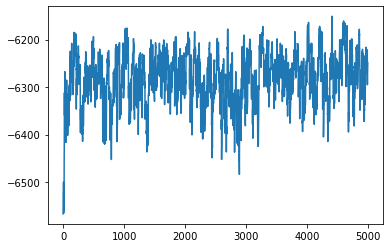

In [21]:
plt.plot(range(len(nb_mcmc.ll_iter)), nb_mcmc.ll_iter)

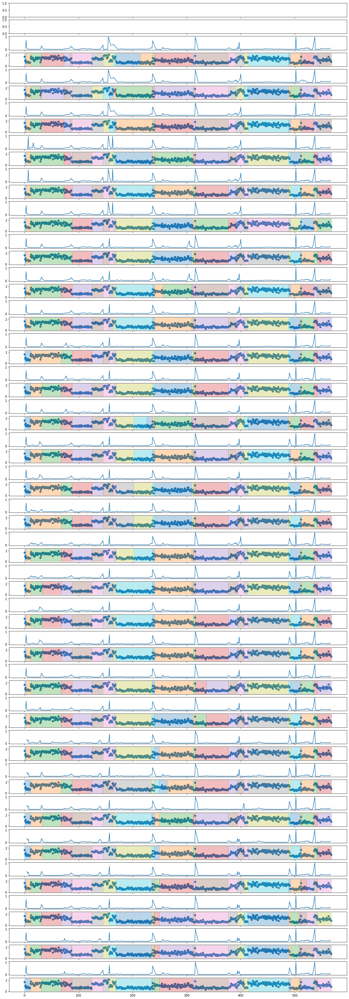

In [34]:
traces = nb_mcmc.clusters[1].ll_traces
f, axs = plt.subplots(2 * 30, figsize = (20,2 * 30), sharex=True)
clus = 1
residuals = np.exp(np.log(nb_mcmc.clusters[clus].r) - (nb_mcmc.clusters[clus].mu) - (nb_mcmc.clusters[clus].C@nb_mcmc.clusters[clus].beta).flatten())
for i in np.r_[1:30]:
    trace = np.exp(traces[-i])
    nonzero = (trace != 1)
    #msk2 = (trace > trace.mean()*1.01)
    msk = nonzero
    axs[2*i].plot(np.r_[:len(trace)][msk], trace[msk])
    
    tst = np.array(nb_mcmc.clusters[1].phase_history[-i]).reshape(-1,2)
    axs[2*i+1].scatter(np.r_[:len(residuals)], residuals)
    for j, r in enumerate(tst):
        axs[2*i+1].add_patch(matplotlib.patches.Rectangle((r[0],0), r[1]-r[0], 2.3, fill=True, alpha=0.3, color = colors[j % 10]))